# Event Detection Via Social Media Data
----

##Data Loading

In [1]:
#@title Fix Dependency Issue
# Uninstall potentially conflicting versions first
# !pip uninstall -y numpy scipy gensim fasttext bertopic laserembeddings sentence-transformers

# !pip install numpy==1.26.4 scipy=
# !pip install gensim
# !pip install fasttext
# !pip install laserembeddings
!pip install bertopic
!pip install sentence-transformers
!pip install gensim


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.6/150.6 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 58.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 20.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 37.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 10.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 33.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalli

In [1]:
#@title Install Packages
# !pip install arabic-reshaper python-bidi
# !pip install ar_wordcloud
# !pip install transformers
# !pip install stanza
# !pip install -U bertopic
# !pip install -U sentence-transformers
# !pip install -U scikit-learn
# !pip install -U arabert

# import nltk
# # import stanza

# nltk.download('stopwords')
# from nltk.corpus import stopwords

# arabic_stopwords = set(stopwords.words('arabic'))

# english_stopwords = set(stopwords.words('english'))
# combined_stopwords = arabic_stopwords.union(english_stopwords)

# # Download Arabic model once
# # stanza.download('ar', verbose=False)

# # Initialize pipeline for Arabic with NER
# # nlp = stanza.Pipeline('ar', processors='tokenize,ner', use_gpu=True)


In [2]:
#@title import packages
import numpy as np
import requests
# from nltk.corpus import stopwords
# from nltk.tokenize import word_tokenize

import numpy as np
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.cluster import DBSCAN
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score
import matplotlib.pyplot as plt

import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import silhouette_score
import re
import ast

# For reproducibility
np.random.seed(42)

import pandas as pd
#@title import packages
import numpy as np
import requests
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
import random
# import arabic_reshaper
# from bidi.algorithm import get_display
import matplotlib.pyplot as plt
from collections import Counter
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score
from sklearn.cluster import DBSCAN
import numpy as np

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)

import matplotlib.pyplot as plt
# import arabic_reshaper
# from bidi.algorithm import get_display
from collections import Counter
import ast
# import arabic_reshaper
# from bidi.algorithm import get_display
# from ar_wordcloud import ArabicWordCloud

import networkx as nx

import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
import random
import networkx as nx


In [3]:
# @title Define Constants
urls = [
    "https://raw.githubusercontent.com/HasanKhadd0ur/SocialED_datasets/main/npy_data/Event2012.npy"
]
from google.colab import drive
drive.mount('/content/drive')

columns=[ 'tweet_id', 'text', 'event_id', 'words', 'filtered_words', 'entities', 'user_id', 'created_at', 'urls', 'hashtags', 'user_mentions']

Mounted at /content/drive


In [4]:
#@title process data
# import os
# import pandas as pd

# # Define folder path in your Drive
# folder_path = '/content/drive/MyDrive/Events'

# # List CSV files only
# csv_files = [f for f in os.listdir(folder_path) if f.endswith('.csv')]
# dataframes = []

# for label, filename in enumerate(csv_files):
#     file_path = os.path.join(folder_path, filename)
#     try:
#         df = pd.read_csv(file_path)
#         df['event_label'] = label  # Numeric label for each file
#         df['event_filename'] = filename  # Optional: store filename
#         dataframes.append(df)
#     except Exception as e:
#         print(f"Error reading {filename}: {e}")
# merged_df = pd.concat(dataframes, ignore_index=True)

# # Optional: Save to Drive or download
# merged_df.to_csv('/content/drive/MyDrive/merged_labeled_events.csv', index=False)

In [5]:
#@title Load dataset
df = pd.read_csv("/content/drive/MyDrive/cleaned_merged_labeled_events.csv")

In [6]:
#@title Data Columns
df.columns

Index(['Tweet ID', 'Tweet Text', 'Type', 'Author Name', 'Author Username',
       'Creation Time', 'Reply Count', 'Retweet Count', 'Quote Count',
       'Like Count', 'View Count', 'Bookmark Count', 'Language',
       'Possibly Sensitive', 'Source', 'Hashtags', 'Tweet URL', 'Media Type',
       'Media URLs', 'External URLs', 'event_label', 'event_filename',
       'Hashtags_str', 'Old Tweet Text', 'Date', 'Block', 'duration_days',
       'duration_hours', 'duration_minutes', 'Named Entities', 'PER', 'ORG',
       'LOC', 'date', 'arabert_embeddings', 'fasttext_embeddings',
       'named_entities_embedding_32d', 'hashtags_embedding_32d',
       'per_embeddings_32d', 'org_embeddings_32d', 'loc_embeddings_32d',
       'mbert_embeddings', 'verbs', 'nouns', 'adjectives'],
      dtype='object')

In [7]:
# @title Ensure Type
# Ensure datetime format
df['Creation Time'] = pd.to_datetime(df['Creation Time'])
# Extract just the date part
df['date'] = df['Creation Time'].dt.date

import ast

def entities_to_list(entities_str):
    if isinstance(entities_str, str):
        try:
            # Safely evaluate the string to a Python list
            entities = ast.literal_eval(entities_str)
            # Ensure it's a list and strip whitespace from each entity
            if isinstance(entities, list):
                return [e.strip() for e in entities]
            else:
                return []
        except (ValueError, SyntaxError):
            return []
    else:
        return []
# convert the embedding fro type str to type ndarray
df['arabert_embeddings']=df['arabert_embeddings'].apply(lambda x: np.fromstring(x.strip('[]'), sep=' '))

# Apply to the Named Entities column
df['Named Entities'] = df['Named Entities'].apply(entities_to_list)

df['verbs'] = df['verbs'].apply(entities_to_list)

df['nouns'] = df['nouns'].apply(entities_to_list)

df['adjectives'] = df['adjectives'].apply(entities_to_list)

def clean_hashtag_entry(entry):
    try:
        # Step 1: Flatten if it’s a nested list like [[...]]
        if isinstance(entry, list) and len(entry) == 1 and isinstance(entry[0], list):
            entry = entry[0]

        # Step 2: Join everything into one string
        if isinstance(entry, list):
            entry = ''.join(entry)

        # Step 3: Remove outer brackets and unescape
        entry = entry.strip()

        # Step 4: Use regex to extract valid Arabic hashtags (words)
        # This captures Arabic words, hashtags, or unicode escapes
        words = re.findall(r'[\u0600-\u06FF#\w]+', entry)
        return words
    except Exception as e:
        return []
# Apply cleaning function
df['Hashtags'] = df['Hashtags'].apply(clean_hashtag_entry)


In [8]:
#@title Ensure hashtags are stored as lists instead of comma-separated strings
# def convert_hashtags_to_list(value):
#     if isinstance(value, str):
#         return [tag.strip() for tag in value.split(',') if tag.strip()]
#     return []

# df['Hashtags'] = df['Hashtags'].apply(convert_hashtags_to_list)
# Convert the string of hashtags separated by commas into a list, handling NaN

def hashtags_to_list(hstring):
    if isinstance(hstring, str):
        # Split by comma, strip whitespace
      return [tag.strip().lstrip('#') for tag in hstring.split(',') if tag.strip()]

    else:
        # For NaN or missing values
        return []
df['Hashtags_str'] = df['Hashtags']

# Apply conversion to your hashtag column, e.g., 'Hashtags_str'
df['Hashtags'] = df['Hashtags'].apply(hashtags_to_list)



In [9]:
#@title uitlities
import re

def clean_tweet(text):
    if not isinstance(text, str):
        return ''
    text = re.sub(r'http\S+', '', text)            # remove URLs
    text = re.sub(r'@\w+', '', text)                # remove mentions
    text = re.sub(r'#\w+', '', text)                # remove hashtags
    text = re.sub(r'[^ء-يa-zA-Z0-9\s]', ' ', text) # keep Arabic letters, Latin letters, numbers, and spaces only
    text = re.sub(r'\s+', ' ', text)                 # remove extra whitespace
    return text.strip()

def extract_entities_stanza(text):
    if not isinstance(text, str) or text.strip() == "":
        return []
    doc = nlp(text)
    entities = [ent.text for ent in doc.ents]
    return entities




In [11]:
 # @title 📦 Extract Verbs, Nouns, and Adjectives using Stanza
!pip install stanza
import stanza
import pandas as pd
from tqdm import tqdm

# Download Arabic models (only if not already downloaded)
stanza.download('ar')

# Initialize Stanza pipeline
nlp = stanza.Pipeline(lang='ar', processors='tokenize,pos', tokenize_no_ssplit=True)

# # POS tag categories to extract
# VERB_TAGS = {"VERB"}
# NOUN_TAGS = {"NOUN", "PROPN"}
# ADJ_TAGS = {"ADJ"}

# # Function to extract POS types from a text
# def extract_pos_tags(text):
#     doc = nlp(text)
#     verbs, nouns, adjectives = [], [], []
#     for sentence in doc.sentences:
#         for word in sentence.words:
#             if word.upos in VERB_TAGS:
#                 verbs.append(word.text)
#             elif word.upos in NOUN_TAGS:
#                 nouns.append(word.text)
#             elif word.upos in ADJ_TAGS:
#                 adjectives.append(word.text)
#     return verbs, nouns, adjectives

# # Apply the function to each tweet
# tqdm.pandas(desc="🔍 Extracting POS tags")
# df[['verbs', 'nouns', 'adjectives']] = df['Tweet Text'].progress_apply(
#     lambda text: pd.Series(extract_pos_tags(text))
# )

# # ✅ Display first few rows with new columns
# df[['Tweet Text', 'verbs', 'nouns', 'adjectives']].head()


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 17.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 590.6/590.6 kB 22.0 MB/s eta 0:00:00


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Downloading default packages for language: ar (Arabic) ...


INFO:stanza:Downloaded file to /root/stanza_resources/ar/default.zip
INFO:stanza:Finished downloading models and saved to /root/stanza_resources
INFO:stanza:Checking for updates to resources.json in case models have been updated.  Note: this behavior can be turned off with download_method=None or download_method=DownloadMethod.REUSE_RESOURCES


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Loading these models for language: ar (Arabic):
| Processor | Package     |
---------------------------
| tokenize  | padt        |
| mwt       | padt        |
| pos       | padt_charlm |

INFO:stanza:Using device: cpu
INFO:stanza:Loading: tokenize
INFO:stanza:Loading: mwt
INFO:stanza:Loading: pos
INFO:stanza:Done loading processors!


In [10]:
# @title Data shape
print(df.shape)


(6998, 45)


In [11]:
#@title Clean the tweet texts
df['Old Tweet Text'] = df['Tweet Text']
df['Tweet Text'] = df['Tweet Text'].apply(clean_tweet)


In [94]:
#@title Split the Dataset
from datetime import date

# Define the split date
split_date = date(2025, 5, 7)

# Split the dataset
tuning_df = df[df['date'] < split_date].copy()
evaluation_df = df[df['date'] >= split_date].copy()

# Show the sizes
print(f"🧪 Tuning Set Size     : {tuning_df.shape[0]} messages")
print(f"📈 Evaluation Set Size : {evaluation_df.shape[0]} messages")


🧪 Tuning Set Size     : 934 messages
📈 Evaluation Set Size : 6064 messages


# AraBert Experiments

## FSD, With ARABERT Embedding


In [ ]:
# @title Install  Arabert
# from bertopic import BERTopic
from sentence_transformers import SentenceTransformer

# Use Arabic sentence transformer model
embedding_model = SentenceTransformer("aubmindlab/bert-base-arabertv2")

# Create and fit BERTopic model
# topic_model = BERTopic(embedding_model=embedding_model, language="arabic")





config.json:   0%|          | 0.00/384 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/543M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/720k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.31M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

In [ ]:
#@title Embeddding the Tweets
tweets = df['Tweet Text'].tolist()
embeddings = embedding_model.encode(tweets, show_progress_bar=True)

#@title Save the Embedding
# Convert embeddings to a regular list
df['arabert_embeddings'] = embeddings.tolist()

# # Convert to DataFrame
# embedding_df = pd.DataFrame(embeddings)

# # Save
# embedding_df.to_csv("tweet_embeddings.csv", index=False)


In [ ]:
#  @title Load the embedding for the tuning and evaluation df

# Convert list of embeddings (stored as lists) into 2D numpy arrays
tuning_embeddings = np.vstack(tuning_df['arabert_embeddings'].apply(np.array).values)
evaluation_embeddings = np.vstack(evaluation_df['arabert_embeddings'].apply(np.array).values)

print(f"Tuning embeddings shape: {tuning_embeddings.shape}")
print(f"Evaluation embeddings shape: {evaluation_embeddings.shape}")



Tuning embeddings shape: (934, 768)
Evaluation embeddings shape: (6064, 768)


In [ ]:
#@title 🔁 Single-Pass First Story Detection (FSD) Implementation
from sklearn.metrics.pairwise import cosine_similarity
from datetime import timedelta
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

class MiniBatchFSD:
    def __init__(self, threshold=0.6, window_size=1000, memory_update_strategy=None):
        self.threshold = threshold
        self.window_size = window_size
        self.memory_update_strategy = memory_update_strategy or self.default_strategy

        self.memory = np.empty((0, 768))
        self.memory_indices = []
        self.memory_dates = []  # track dates of each message in memory
        self.cluster_ids = []
        self.next_cluster_id = 0

    def default_strategy(self, current_date=None):
        if len(self.memory) > self.window_size:
            self.memory = self.memory[1:]
            self.memory_indices = self.memory_indices[1:]
            self.memory_dates = self.memory_dates[1:]

    def memory_update_remove_older_than(self, current_date, days=3):
        """Removes messages from memory that are older than `days` before current_date."""
        cutoff_date = current_date - timedelta(days=days)
        keep_mask = [date >= cutoff_date for date in self.memory_dates]

        if any(keep_mask):
            self.memory = self.memory[keep_mask]
            self.memory_indices = [idx for idx, keep in zip(self.memory_indices, keep_mask) if keep]
            self.memory_dates = [date for date, keep in zip(self.memory_dates, keep_mask) if keep]
        else:
            # If no messages to keep, reset memory
            self.memory = np.empty((0, 768))
            self.memory_indices = []
            self.memory_dates = []

    def fit_predict(self, embeddings, dates):
        predictions = []

        for i, (emb, curr_date) in enumerate(zip(embeddings, dates)):
            emb = emb.reshape(1, -1)

            if len(self.memory) == 0:
                cluster_id = self.next_cluster_id
                self.next_cluster_id += 1
            else:
                sims = cosine_similarity(emb, self.memory)[0]
                max_sim_idx = sims.argmax()
                max_sim_val = sims[max_sim_idx]

                if max_sim_val >= self.threshold:
                    cluster_id = self.cluster_ids[self.memory_indices[max_sim_idx]]
                else:
                    cluster_id = self.next_cluster_id
                    self.next_cluster_id += 1

            predictions.append(cluster_id)
            self.cluster_ids.append(cluster_id)

            # 🔁 Update memory using strategy
            self.memory_update_strategy(current_date=curr_date)

            # Add current message to memory
            self.memory = np.vstack([self.memory, emb])
            self.memory_indices.append(len(self.cluster_ids) - 1)
            self.memory_dates.append(curr_date)

        return predictions

# def single_pass(embeddings, threshold=0.6, window_size=1000):
#     cluster_ids = [-1] * len(embeddings)
#     memory = []
#     memory_indices = []
#     next_cluster_id = 0

#     for i, emb in enumerate(embeddings):
#         if not memory:
#             cluster_ids[i] = next_cluster_id
#             memory.append(emb)
#             memory_indices.append(i)
#             next_cluster_id += 1
#             continue

#         sims = cosine_similarity([emb], memory)[0]
#         max_sim_idx = sims.argmax()
#         max_sim_val = sims[max_sim_idx]

#         if max_sim_val >= threshold:
#             cluster_ids[i] = cluster_ids[memory_indices[max_sim_idx]]
#         else:
#             cluster_ids[i] = next_cluster_id
#             next_cluster_id += 1

#         # Update memory window
#         # if len(memory) >= window_size:
#         #     memory.pop(0)
#         #     memory_indices.pop(0)

#         memory.append(emb)
#         memory_indices.append(i)

#     return cluster_ids

# def single_pass(embeddings, threshold=0.6, window_size=1000):
#     cluster_ids = [-1] * len(embeddings)
#     memory = np.empty((0, embeddings.shape[1]))
#     memory_indices = []
#     next_cluster_id = 0

#     for i, emb in enumerate(embeddings):
#         emb = emb.reshape(1, -1)

#         if len(memory) == 0:
#             cluster_ids[i] = next_cluster_id
#             memory = np.vstack([memory, emb])
#             memory_indices.append(i)
#             next_cluster_id += 1
#             continue

#         sims = cosine_similarity(emb, memory)[0]
#         max_sim_idx = sims.argmax()
#         max_sim_val = sims[max_sim_idx]

#         if max_sim_val >= threshold:
#             cluster_ids[i] = cluster_ids[memory_indices[max_sim_idx]]
#         else:
#             cluster_ids[i] = next_cluster_id
#             next_cluster_id += 1

#         if len(memory) >= window_size:
#             memory = memory[1:]
#             memory_indices = memory_indices[1:]

#         memory = np.vstack([memory, emb])
#         memory_indices.append(i)

#     return cluster_ids


In [ ]:


#@title Define range of SinglePass parameters to tune
# Parameters to search
thresholds = np.arange(0.6, 2.0, 0.05)
window_sizes = [50, 100, 200, 500, 1000, 2000]

dim_values = [32, 64, 96, 128, 160, 192, 256, 320, 384, 448, 512, 640, 768]
best_score = -1
best_params = None

true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values


In [ ]:
#@title 🔬 Effect of Threshold Parameter on Single-Pass FSD Clustering Performance
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

results_tuning = []
results_eval = []

for threshold in thresholds:
    # === Tuning Set ===
    fsd_tuning = MiniBatchFSD(threshold=threshold, window_size=1000)
    predicted_tuning = fsd_tuning.fit_predict(tuning_embeddings, tuning_df['Date'].tolist())

    if len(set(predicted_tuning)) > 1:
        nmi = normalized_mutual_info_score(true_labels_tuning, predicted_tuning)
        ari = adjusted_rand_score(true_labels_tuning, predicted_tuning)
        ami = adjusted_mutual_info_score(true_labels_tuning, predicted_tuning)
    else:
        nmi = ari = ami = 0.0

    results_tuning.append({
        'threshold': threshold,
        'nmi': nmi,
        'ari': ari,
        'ami': ami
    })

    # === Evaluation Set ===
    fsd_eval = MiniBatchFSD(threshold=threshold, window_size=1000)
    predicted_eval = fsd_eval.fit_predict(evaluation_embeddings, evaluation_df['Date'].tolist())

    if len(set(predicted_eval)) > 1:
        nmi_e = normalized_mutual_info_score(true_labels_eval, predicted_eval)
        ari_e = adjusted_rand_score(true_labels_eval, predicted_eval)
        ami_e = adjusted_mutual_info_score(true_labels_eval, predicted_eval)
    else:
        nmi_e = ari_e = ami_e = 0.0

    results_eval.append({
        'threshold': threshold,
        'nmi': nmi_e,
        'ari': ari_e,
        'ami': ami_e
    })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# Print best threshold based on NMI (tuning set)
best_row = df_tuning.loc[df_tuning['nmi'].idxmax()]
print(f"✅ Best Threshold (Tuning Set): {best_row['threshold']:.2f} | NMI = {best_row['nmi']:.4f}")


✅ Best Threshold (Tuning Set): 0.90 | NMI = 0.5744


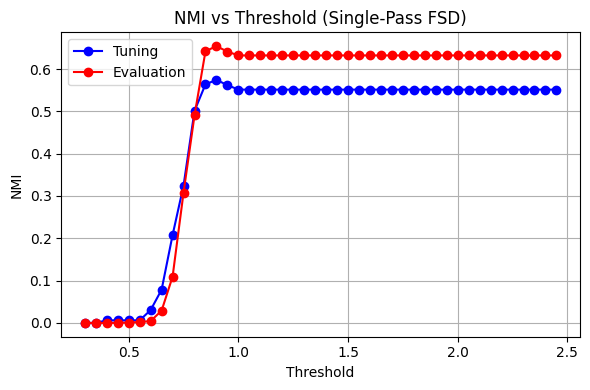

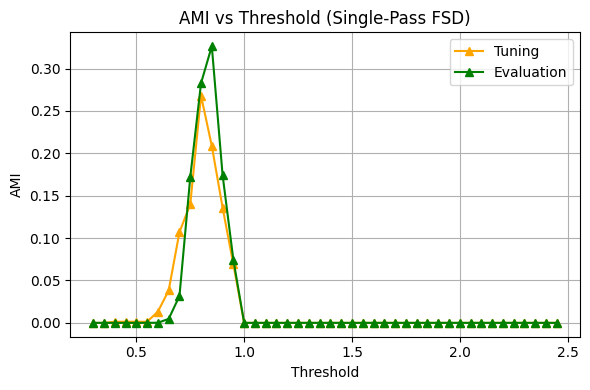

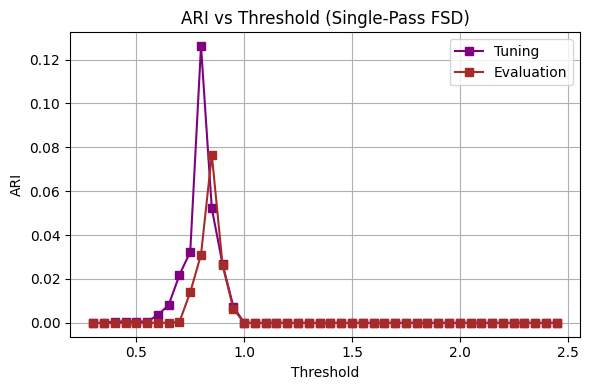

In [ ]:
#@title 📊 Plotting the Effect of Threshold on Clustering Metrics (NMI, AMI, ARI)

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(df_tuning['threshold'], df_tuning['nmi'], marker='o', label='Tuning', color='blue')
plt.plot(df_eval['threshold'], df_eval['nmi'], marker='o', label='Evaluation', color='red')
plt.title('NMI vs Threshold (Single-Pass FSD)')
plt.xlabel('Threshold')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(df_tuning['threshold'], df_tuning['ami'], marker='^', label='Tuning', color='orange')
plt.plot(df_eval['threshold'], df_eval['ami'], marker='^', label='Evaluation', color='green')
plt.title('AMI vs Threshold (Single-Pass FSD)')
plt.xlabel('Threshold')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(df_tuning['threshold'], df_tuning['ari'], marker='s', label='Tuning', color='purple')
plt.plot(df_eval['threshold'], df_eval['ari'], marker='s', label='Evaluation', color='brown')
plt.title('ARI vs Threshold (Single-Pass FSD)')
plt.xlabel('Threshold')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title 🔬 Effect of Window Size on Single-Pass FSD Clustering Result
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# Define a fixed threshold and vary the window size
fixed_threshold = 0.9

results_tuning = []
results_eval = []

for ws in window_sizes:
    # === Tuning Set ===
    fsd_tuning = MiniBatchFSD(threshold=fixed_threshold, window_size=ws)
    pred_tuning = fsd_tuning.fit_predict(tuning_embeddings, tuning_df['Date'].tolist())

    if len(set(pred_tuning)) > 1:
        nmi = normalized_mutual_info_score(true_labels_tuning, pred_tuning)
        ari = adjusted_rand_score(true_labels_tuning, pred_tuning)
        ami = adjusted_mutual_info_score(true_labels_tuning, pred_tuning)
    else:
        nmi = ari = ami = 0.0

    results_tuning.append({
        'window_size': ws,
        'nmi': nmi,
        'ari': ari,
        'ami': ami
    })

    # === Evaluation Set ===
    fsd_eval = MiniBatchFSD(threshold=fixed_threshold, window_size=ws)
    pred_eval = fsd_eval.fit_predict(evaluation_embeddings, evaluation_df['Date'].tolist())

    if len(set(pred_eval)) > 1:
        nmi_e = normalized_mutual_info_score(true_labels_eval, pred_eval)
        ari_e = adjusted_rand_score(true_labels_eval, pred_eval)
        ami_e = adjusted_mutual_info_score(true_labels_eval, pred_eval)
    else:
        nmi_e = ari_e = ami_e = 0.0

    results_eval.append({
        'window_size': ws,
        'nmi': nmi_e,
        'ari': ari_e,
        'ami': ami_e
    })

# Convert to DataFrames
df_tuning_ws = pd.DataFrame(results_tuning)
df_eval_ws = pd.DataFrame(results_eval)


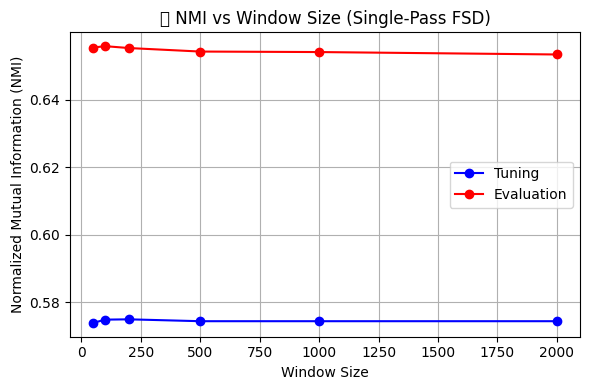

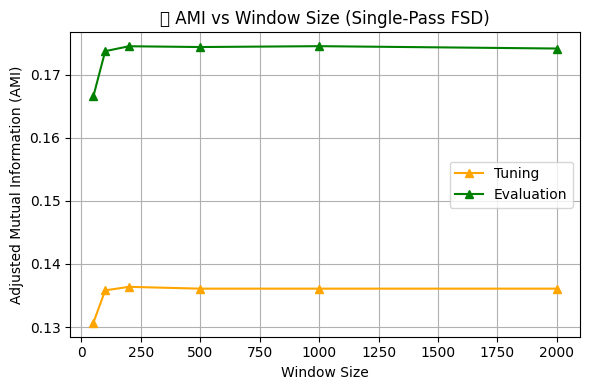

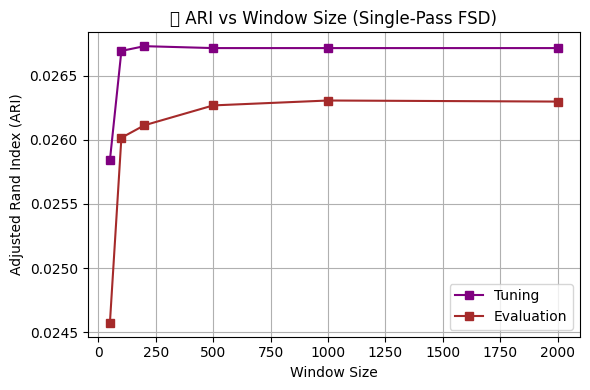

In [ ]:
#@title 📊 Plotting the Effect of Window on Clustering Metrics (NMI, AMI, ARI)
# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(df_tuning_ws['window_size'], df_tuning_ws['nmi'], marker='o', label='Tuning', color='blue')
plt.plot(df_eval_ws['window_size'], df_eval_ws['nmi'], marker='o', label='Evaluation', color='red')
plt.title('NMI vs Window Size (Single-Pass FSD)')
plt.xlabel('Window Size')
plt.ylabel('Normalized Mutual Information (NMI)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(df_tuning_ws['window_size'], df_tuning_ws['ami'], marker='^', label='Tuning', color='orange')
plt.plot(df_eval_ws['window_size'], df_eval_ws['ami'], marker='^', label='Evaluation', color='green')
plt.title(' AMI vs Window Size (Single-Pass FSD)')
plt.xlabel('Window Size')
plt.ylabel('Adjusted Mutual Information (AMI)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(df_tuning_ws['window_size'], df_tuning_ws['ari'], marker='s', label='Tuning', color='purple')
plt.plot(df_eval_ws['window_size'], df_eval_ws['ari'], marker='s', label='Evaluation', color='brown')
plt.title(' ARI vs Window Size (Single-Pass FSD)')
plt.xlabel('Window Size')
plt.ylabel('Adjusted Rand Index (ARI)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title 🔬 Effect of Dimensionality Reduction using PCA on FSD Clustering
from sklearn.decomposition import PCA
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

fixed_threshold = 0.9
fixed_window_size = 1000

results_tuning_dim = []
results_eval_dim = []

for dim in dim_values:
    pca = PCA(n_components=dim, random_state=42)
    tuning_embeddings_pca = pca.fit_transform(tuning_embeddings)
    evaluation_embeddings_pca = pca.transform(evaluation_embeddings)

    # === Tuning Set ===
    fsd_tuning = MiniBatchFSD(threshold=fixed_threshold, window_size=fixed_window_size)
    fsd_tuning.memory = np.empty((0, dim))

    pred_tuning = fsd_tuning.fit_predict(tuning_embeddings_pca,  tuning_df['Date'].tolist())
    tuning_labels = tuning_df['event_label'].values

    if len(set(pred_tuning)) > 1:
        nmi = normalized_mutual_info_score(tuning_labels, pred_tuning)
        ari = adjusted_rand_score(tuning_labels, pred_tuning)
        ami = adjusted_mutual_info_score(tuning_labels, pred_tuning)
    else:
        nmi = ari = ami = 0.0

    results_tuning_dim.append({
        'dim': dim,
        'nmi': nmi,
        'ari': ari,
        'ami': ami
    })

    # === Evaluation Set ===
    fsd_eval = MiniBatchFSD(threshold=fixed_threshold, window_size=fixed_window_size)
    fsd_eval.memory = np.empty((0, dim))

    pred_eval = fsd_eval.fit_predict(evaluation_embeddings_pca, pd.to_datetime(evaluation_df['Date']).tolist())
    eval_labels = evaluation_df['event_label'].values

    if len(set(pred_eval)) > 1:
        nmi_e = normalized_mutual_info_score(eval_labels, pred_eval)
        ari_e = adjusted_rand_score(eval_labels, pred_eval)
        ami_e = adjusted_mutual_info_score(eval_labels, pred_eval)
    else:
        nmi_e = ari_e = ami_e = 0.0

    results_eval_dim.append({
        'dim': dim,
        'nmi': nmi_e,
        'ari': ari_e,
        'ami': ami_e
    })

# Create DataFrames
df_tuning_dim = pd.DataFrame(results_tuning_dim)
df_eval_dim = pd.DataFrame(results_eval_dim)


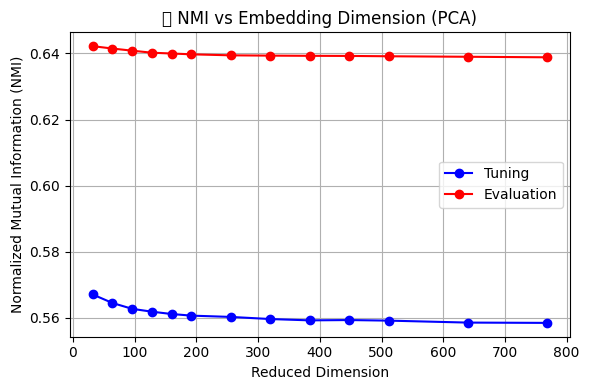

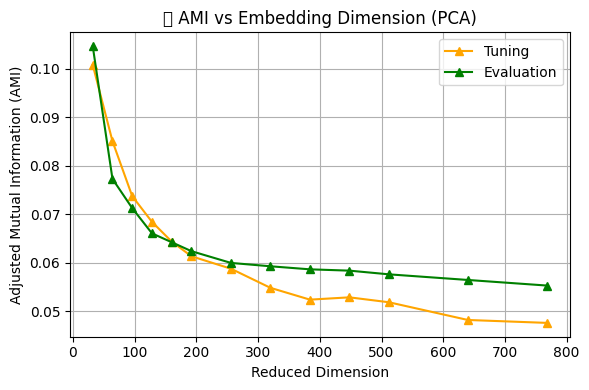

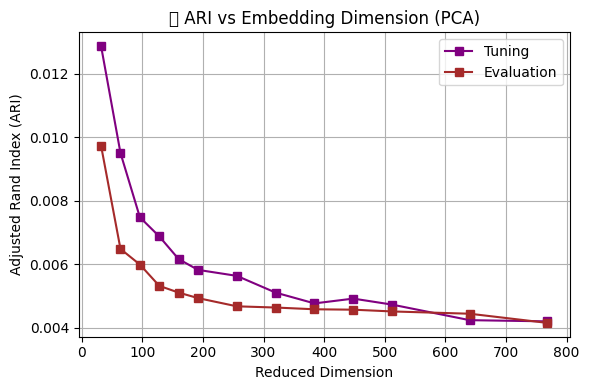

In [ ]:
#@title 📊 Plotting the Effect of Dimension on Clustering Metrics (NMI, AMI, ARI)
# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(df_tuning_dim['dim'], df_tuning_dim['nmi'], marker='o', label='Tuning', color='blue')
plt.plot(df_eval_dim['dim'], df_eval_dim['nmi'], marker='o', label='Evaluation', color='red')
plt.title('🧠 NMI vs Embedding Dimension (PCA)')
plt.xlabel('Reduced Dimension')
plt.ylabel('Normalized Mutual Information (NMI)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(df_tuning_dim['dim'], df_tuning_dim['ami'], marker='^', label='Tuning', color='orange')
plt.plot(df_eval_dim['dim'], df_eval_dim['ami'], marker='^', label='Evaluation', color='green')
plt.title('🔍 AMI vs Embedding Dimension (PCA)')
plt.xlabel('Reduced Dimension')
plt.ylabel('Adjusted Mutual Information (AMI)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(df_tuning_dim['dim'], df_tuning_dim['ari'], marker='s', label='Tuning', color='purple')
plt.plot(df_eval_dim['dim'], df_eval_dim['ari'], marker='s', label='Evaluation', color='brown')
plt.title('📐 ARI vs Embedding Dimension (PCA)')
plt.xlabel('Reduced Dimension')
plt.ylabel('Adjusted Rand Index (ARI)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:

#@title 🔍 Grid Search on Tuning Set: PCA Dimensionality × FSD Threshold (Single-Pass FSD)
from sklearn.decomposition import PCA
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

grid_results = []

true_labels_tuning = tuning_df['event_label'].values
tuning_dates = pd.to_datetime(tuning_df['Date']).to_list()

for dim in dim_values:
    print(f"\n🔧 Dim = {dim}")

    # Reduce embeddings using PCA
    pca = PCA(n_components=dim, random_state=42)
    reduced_tuning = pca.fit_transform(np.vstack(tuning_embeddings))

    for threshold in thresholds:
        fsd = MiniBatchFSD(threshold=threshold, window_size=1000)
        fsd.memory = np.empty((0, dim))

        predicted_labels = fsd.fit_predict(reduced_tuning, tuning_dates)

        if len(set(predicted_labels)) > 1:
            nmi = normalized_mutual_info_score(true_labels_tuning, predicted_labels)
            ari = adjusted_rand_score(true_labels_tuning, predicted_labels)
            ami = adjusted_mutual_info_score(true_labels_tuning, predicted_labels)
        else:
            nmi = ari = ami = 0.0

        grid_results.append({
            'dim': dim,
            'threshold': threshold,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

# Convert results to DataFrame
grid_df = pd.DataFrame(grid_results)

# Show top configuration by NMI
best_row = grid_df.loc[grid_df['nmi'].idxmax()]
print(f"\n🏆 Best Config: Dim = {best_row['dim']} | Threshold = {best_row['threshold']:.2f} | NMI = {best_row['nmi']:.4f}")



🔧 Dim = 32

🔧 Dim = 64

🔧 Dim = 96

🔧 Dim = 128

🔧 Dim = 160

🔧 Dim = 192

🔧 Dim = 256

🔧 Dim = 320

🔧 Dim = 384

🔧 Dim = 448

🔧 Dim = 512

🔧 Dim = 640

🔧 Dim = 768

🏆 Best Config: Dim = 384.0 | Threshold = 0.60 | NMI = 0.5843


/tmp/ipython-input-17-743400630.py:6: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  dim_df = grid_df.groupby('dim').apply(lambda df: df.loc[df['nmi'].idxmax()]).reset_index(drop=True)


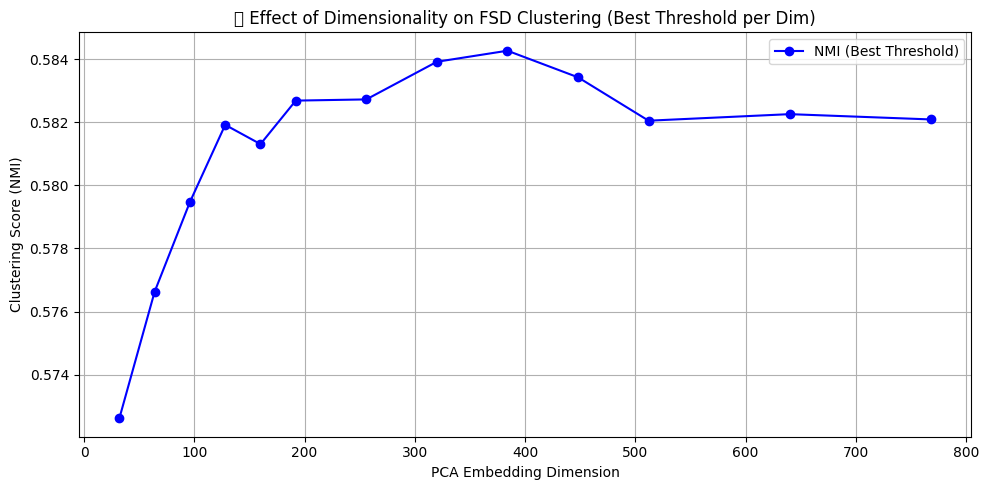

In [ ]:
#@title 📈 NMI vs Dim for Best Thresholds (From Grid Search)

import matplotlib.pyplot as plt

# Aggregate best NMI for each dimension
dim_df = grid_df.groupby('dim').apply(lambda df: df.loc[df['nmi'].idxmax()]).reset_index(drop=True)

plt.figure(figsize=(10, 5))

# Plot NMI
plt.plot(dim_df['dim'], dim_df['nmi'], label='NMI (Best Threshold)', marker='o', color='blue')

# Optional: Plot ARI and AMI
# plt.plot(dim_df['dim'], dim_df['ari'], label='ARI', marker='s', color='green')
# plt.plot(dim_df['dim'], dim_df['ami'], label='AMI', marker='^', color='purple')

plt.title('📊 Effect of Dimensionality on FSD Clustering (Best Threshold per Dim)')
plt.xlabel('PCA Embedding Dimension')
plt.ylabel('Clustering Score (NMI)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
#@title 🏆 Best Config Evaluation (Single-Pass FSD)

from sklearn.decomposition import PCA
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

# Get best config by NMI
best_config = grid_df.loc[grid_df['nmi'].idxmax()]
print("🏅 Best FSD Config on Tuning Set:")
print(best_config[['dim', 'threshold', 'nmi', 'ari', 'ami']])

# Extract best parameters
best_dim = 768 #best_config['dim']
best_threshold = best_config['threshold']
fixed_window_size = 1000

# Refit PCA on both tuning + evaluation data for consistency
all_embeddings = np.vstack([np.vstack(tuning_embeddings), np.vstack(evaluation_embeddings)])
pca = PCA(n_components=best_dim, random_state=42)
# pca.fit(all_embeddings)

reduced_tuning = pca.fit_transform(np.vstack(tuning_embeddings))
reduced_eval = pca.transform(np.vstack(evaluation_embeddings))

# Fit FSD on evaluation set using best config
fsd_eval = MiniBatchFSD(threshold=best_threshold, window_size=fixed_window_size)
pred_eval = fsd_eval.fit_predict(reduced_eval, pd.to_datetime(evaluation_df['Date']).tolist())

# Evaluate
def safe_scores(true, pred):
    if len(set(pred)) > 1:
        nmi = normalized_mutual_info_score(true, pred)
        ari = adjusted_rand_score(true, pred)
        ami = adjusted_mutual_info_score(true, pred)
    else:
        nmi = ari = ami = 0
    return nmi, ari, ami

true_labels_eval = evaluation_df['event_label'].values
nmi_eval, ari_eval, ami_eval = safe_scores(true_labels_eval, pred_eval)

print("\n📊 Evaluation Metrics (Using Best Tuning Config):")
print(f"✅ NMI: {nmi_eval:.4f}")
print(f"✅ ARI: {ari_eval:.4f}")
print(f"✅ AMI: {ami_eval:.4f}")


🏅 Best FSD Config on Tuning Set:
dim          384.000000
threshold      0.600000
nmi            0.584267
ari            0.082539
ami            0.237748
Name: 224, dtype: float64

📊 Evaluation Metrics (Using Best Tuning Config):
✅ NMI: 0.6684
✅ ARI: 0.0850
✅ AMI: 0.3429


In [ ]:
#@title 📊 Summarize Clustering Scores Across Dimensions (Fixed Threshold FSD)

from sklearn.decomposition import PCA
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

# Use best threshold from tuning grid search
fixed_threshold = best_config['threshold']
fixed_window_size = 1000

dim_metrics = []

for dim in dim_values:
    # Reduce embeddings using PCA with current dim
    pca = PCA(n_components=dim, random_state=42)

    reduced_tuning = pca.fit_transform(np.vstack(tuning_embeddings))
    reduced_eval = pca.transform(np.vstack(evaluation_embeddings))

    # Apply FSD on both sets
    fsd_tuning = MiniBatchFSD(threshold=fixed_threshold, window_size=fixed_window_size)
    fsd_tuning.memory = np.empty((0, dim))
    pred_tuning = fsd_tuning.fit_predict(reduced_tuning, pd.to_datetime(tuning_df['Date']).tolist())

    fsd_eval = MiniBatchFSD(threshold=fixed_threshold, window_size=fixed_window_size)
    fsd_eval.memory = np.empty((0, dim))
    pred_eval = fsd_eval.fit_predict(reduced_eval, pd.to_datetime(evaluation_df['Date']).tolist())

    # Compute scores safely
    def safe_scores(true, pred):
        if len(set(pred)) > 1:
            nmi = normalized_mutual_info_score(true, pred)
            ari = adjusted_rand_score(true, pred)
            ami = adjusted_mutual_info_score(true, pred)
        else:
            nmi = ari = ami = 0
        return nmi, ari, ami

    true_labels_tuning = tuning_df['event_label'].values
    true_labels_eval = evaluation_df['event_label'].values

    nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, pred_tuning)
    nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, pred_eval)

    dim_metrics.append({
        'dim': dim,
        'nmi_tuning': nmi_t,
        'ari_tuning': ari_t,
        'ami_tuning': ami_t,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

# Create summary DataFrame
dim_df = pd.DataFrame(dim_metrics)

print("\n📋 Summary of Clustering Metrics Across PCA Dimensions (Using Best FSD Threshold):")
print(dim_df.to_string(index=False))



📋 Summary of Clustering Metrics Across PCA Dimensions (Using Best FSD Threshold):
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval
  32    0.420086    0.179466    0.292052  0.282444  0.021280  0.202611
  64    0.528524    0.135724    0.317670  0.511115  0.087412  0.370343
  96    0.556858    0.121464    0.286562  0.587619  0.106988  0.401775
 128    0.576341    0.128419    0.282972  0.612755  0.103391  0.394070
 160    0.577145    0.112956    0.267124  0.637117  0.117557  0.401731
 192    0.582685    0.116459    0.261943  0.650901  0.108296  0.400221
 256    0.581773    0.086976    0.243639  0.657981  0.109950  0.388096
 320    0.583916    0.081065    0.241380  0.661856  0.103215  0.379170
 384    0.584267    0.082539    0.237748  0.664998  0.098278  0.371415
 448    0.583424    0.079349    0.234751  0.665444  0.095163  0.364837
 512    0.582049    0.072376    0.230581  0.666882  0.093125  0.359195
 640    0.582256    0.072417    0.230457  0.667492  0.087306  0.3

In [ ]:
#@title 🏆 Best Config Evaluation (Single-Pass FSD)

from sklearn.decomposition import PCA
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

# Get best config from grid search DataFrame
best_config = grid_df.loc[grid_df['nmi'].idxmax()]
print("🏅 Best FSD Config on Tuning Set:")
print(best_config[['dim', 'threshold', 'nmi', 'ari', 'ami']])

# Extract best parameters
best_dim = 768#best_config['dim']
best_threshold = best_config['threshold']
fixed_window_size = 1000

# Prepare labels
true_labels_eval = evaluation_df['event_label'].values

# Refit PCA on full data to ensure consistency
all_embeddings = np.vstack([np.vstack(tuning_embeddings), np.vstack(evaluation_embeddings)])
pca = PCA(n_components=best_dim, random_state=42)
pca.fit(all_embeddings)

reduced_tuning = pca.transform(np.vstack(tuning_embeddings))
reduced_eval = pca.transform(np.vstack(evaluation_embeddings))

# Apply FSD with best config on evaluation set
fsd_eval = MiniBatchFSD(threshold=best_threshold, window_size=fixed_window_size)
pred_eval = fsd_eval.fit_predict(reduced_eval, pd.to_datetime(evaluation_df['Date']).tolist())

# Compute clustering metrics safely
def safe_scores(true, pred):
    if len(set(pred)) > 1:
        nmi = normalized_mutual_info_score(true, pred)
        ari = adjusted_rand_score(true, pred)
        ami = adjusted_mutual_info_score(true, pred)
    else:
        nmi = ari = ami = 0.0
    return nmi, ari, ami

nmi_eval, ari_eval, ami_eval = safe_scores(true_labels_eval, pred_eval)

# Report final evaluation
print("\n📊 Evaluation Metrics with Best Tuning Config:")
print(f"✅ NMI: {nmi_eval:.4f}")
print(f"✅ ARI: {ari_eval:.4f}")
print(f"✅ AMI: {ami_eval:.4f}")


🏅 Best FSD Config on Tuning Set:
dim          384.000000
threshold      0.600000
nmi            0.584267
ari            0.082539
ami            0.237748
Name: 224, dtype: float64

📊 Evaluation Metrics with Best Tuning Config:
✅ NMI: 0.6666
✅ ARI: 0.0769
✅ AMI: 0.3251


In [ ]:
#@title 📊 Clustering and Topic Modeling Metrics Summary Across Embedding Dimensions (Single-Pass FSD)
from sklearn.metrics import silhouette_score
from gensim.corpora import Dictionary
from gensim.models.coherencemodel import CoherenceModel
from sklearn.decomposition import PCA

def safe_silhouette_score(X, labels):
    if len(set(labels)) > 1 and len(X) > len(set(labels)):
        return silhouette_score(X, labels, metric='cosine')
    return -1

def get_topic_coherence(texts, labels, coherence_type='c_v'):
    clustered_docs = {}
    for text, label in zip(texts, labels):
        if label == -1:
            continue
        clustered_docs.setdefault(label, []).append(text)

    topics = [docs for docs in clustered_docs.values() if len(docs) >= 3]
    if not topics:
        return -1

    tokenized_topics = [[word for doc in topic for word in doc.split()] for topic in topics]

    dictionary = Dictionary(tokenized_topics)
    corpus = [dictionary.doc2bow(text) for text in tokenized_topics]

    coherence_model = CoherenceModel(
        topics=tokenized_topics,
        texts=tokenized_topics,
        corpus=corpus,
        dictionary=dictionary,
        coherence=coherence_type
    )

    return coherence_model.get_coherence()

# Ground truth number of clusters
true_events_tuning = len(set(tuning_df['event_label']))
true_events_eval = len(set(evaluation_df['event_label']))

# Use best threshold and variable dim
additional_metrics = []

for dim in dim_values:
    pca = PCA(n_components=dim, random_state=42)
    reduced_tuning = pca.fit_transform(np.vstack(tuning_embeddings))
    reduced_eval = pca.transform(np.vstack(evaluation_embeddings))

    # Tuning
    fsd_tuning = MiniBatchFSD(threshold=best_threshold, window_size=1000)
    fsd_tuning.memory = np.empty((0, dim))
    labels_tuning = fsd_tuning.fit_predict(reduced_tuning, pd.to_datetime(tuning_df['Date']).tolist())

    silhouette_t = safe_silhouette_score(reduced_tuning, labels_tuning)
    num_clusters_t = len(set(labels_tuning))
    coherence_t_cv = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='c_v')
    coherence_t_umass = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='u_mass')

    # Evaluation
    fsd_eval = MiniBatchFSD(threshold=best_threshold, window_size=1000)
    fsd_eval.memory = np.empty((0, dim))
    labels_eval = fsd_eval.fit_predict(reduced_eval, pd.to_datetime(evaluation_df['Date']).tolist())

    silhouette_e = safe_silhouette_score(reduced_eval, labels_eval)
    num_clusters_e = len(set(labels_eval))
    coherence_e_cv = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='c_v')
    coherence_e_umass = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='u_mass')

    additional_metrics.append({
        'dim': dim,
        'true_events_tuning': true_events_tuning,
        'true_events_eval': true_events_eval,
        'silhouette_tuning': silhouette_t,
        'num_clusters_tuning': num_clusters_t,
        'coherence_tuning_c_v': coherence_t_cv,
        'coherence_tuning_u_mass': coherence_t_umass,
        'silhouette_eval': silhouette_e,
        'num_clusters_eval': num_clusters_e,
        'coherence_eval_c_v': coherence_e_cv,
        'coherence_eval_u_mass': coherence_e_umass
    })

# Merge with dim_df for full summary
extra_df = pd.DataFrame(additional_metrics)
dim_df = pd.merge(dim_df, extra_df, on='dim')

print("\n📊 Full Summary of Clustering and Topic Modeling Metrics (FSD):")
print(dim_df.to_string(index=False))



📊 Full Summary of Clustering and Topic Modeling Metrics (FSD):
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval  true_events_tuning  true_events_eval  silhouette_tuning  num_clusters_tuning  coherence_tuning_c_v  coherence_tuning_u_mass  silhouette_eval  num_clusters_eval  coherence_eval_c_v  coherence_eval_u_mass
  32    0.420086    0.179466    0.292052  0.282444  0.021280  0.202611                  31               103          -0.124458                  103              0.671866                -0.761194        -0.394216                196            0.595794              -0.759199
  64    0.528524    0.135724    0.317670  0.511115  0.087412  0.370343                  31               103           0.038754                  272              0.722729                -0.878968        -0.246276                719            0.606614              -1.070454
  96    0.556858    0.121464    0.286562  0.587619  0.106988  0.401775                  31               103   

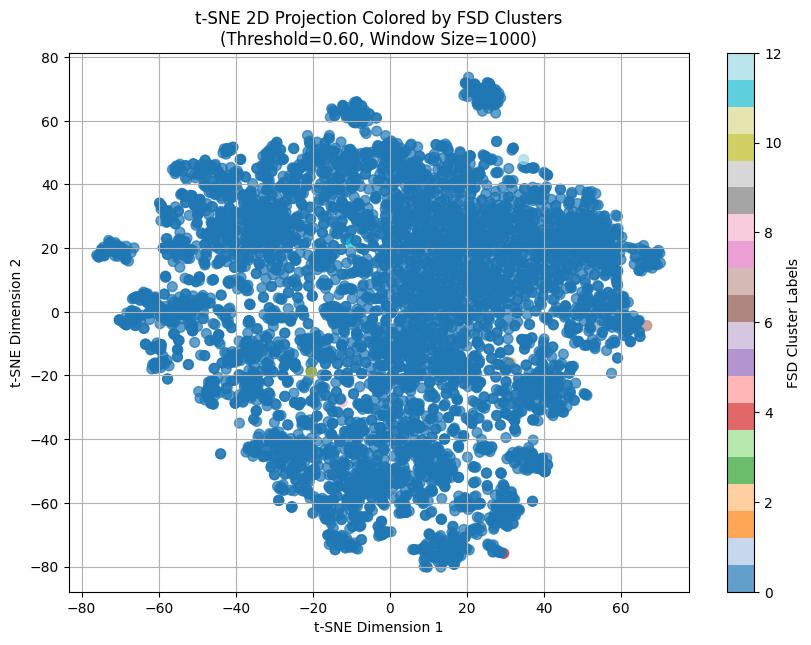

In [ ]:
#@title Visualization of Single-Pass FSD Clustering with t-SNE
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

true_labels = evaluation_df['event_label'].values  # Ground truth labels
best_threshold = best_config['threshold']  # Assuming best_threshold is known from grid search
fixed_window_size = 1000

# Run FSD with best params on evaluation embeddings
fsd = MiniBatchFSD(threshold=best_threshold, window_size=fixed_window_size)
predicted_labels = fsd.fit_predict(evaluation_embeddings, pd.to_datetime(evaluation_df['Date']).tolist())

# t-SNE dimensionality reduction to 2D on evaluation embeddings
tsne = TSNE(n_components=2, random_state=42, init='pca')
reduced_embeddings = tsne.fit_transform(evaluation_embeddings)

# Plotting
plt.figure(figsize=(10, 7))
scatter = plt.scatter(
    reduced_embeddings[:, 0], reduced_embeddings[:, 1],
    c=predicted_labels, cmap='tab20', alpha=0.7, s=50
)
plt.colorbar(scatter, label='FSD Cluster Labels')
plt.title(f"t-SNE 2D Projection Colored by FSD Clusters\n(Threshold={best_threshold:.2f}, Window Size={fixed_window_size})")
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.grid(True)
plt.show()


## HDBSCAN, With ARABERT Embedding

In [15]:
#@title Install and Import HDBSCAN
!pip install -q hdbscan

import hdbscan
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score


In [23]:
# @title Install  Arabert
# from bertopic import BERTopic
from sentence_transformers import SentenceTransformer

# Use Arabic sentence transformer model
embedding_model = SentenceTransformer("aubmindlab/bert-base-arabertv2")

# Create and fit BERTopic model
# topic_model = BERTopic(embedding_model=embedding_model, language="arabic")



config.json:   0%|          | 0.00/384 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/543M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

In [ ]:
#@title Embedding the Tweets
# Imports
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from sklearn.decomposition import PCA
import pandas as pd
import numpy as np
from tqdm import tqdm

# tweets = df['Tweet Text'].tolist()
# embeddings = embedding_model.encode(tweets, show_progress_bar=True)


Batches:   0%|          | 0/219 [00:00<?, ?it/s]

In [24]:
#@title Embedding the Named Entities
# import ast
# import re



# # Preview
# df['hashtags'].head()
# Helper to embed list of tokens (e.g., hashtags or named entities)
# Convert stringifNied lists to Python lists (e.g. ["flood", "storm"] → ['flood', 'storm'])
if isinstance(df['Named Entities'].iloc[0], str):
    df['Named Entities'] = df['Named Entities'].apply(eval)

if isinstance(df['Hashtags'].iloc[0], str):
    df['Hashtags'] = df['Hashtags'].apply(eval)

if isinstance(df['PER'].iloc[0], str):
    df['PER'] = df['PER'].apply(eval)

if isinstance(df['ORG'].iloc[0], str):
    df['ORG'] = df['ORG'].apply(eval)

if isinstance(df['LOC'].iloc[0], str):
    df['LOC'] = df['LOC'].apply(eval)

def embed_and_average(token_lists):
    results = []
    for tokens in tqdm(token_lists, desc="Embedding token lists"):
        if not tokens:
            results.append(np.zeros(768))  # Return zero-vector for empty input
        else:
            token_embeds = embedding_model.encode(tokens)
            avg_embedding = np.mean(token_embeds, axis=0)
            results.append(avg_embedding)
    return np.vstack(results)

# Embed both columns
# named_entity_embeddings = embed_and_average(df['Named Entities'])
# hashtag_embeddings = embed_and_average(df['Hashtags'])

org_entity_embeddings = embed_and_average(df['ORG'])
loc_entity_embeddings = embed_and_average(df['LOC'])
per_entity_embeddings = embed_and_average(df['PER'])



Embedding token lists: 100%|██████████| 6998/6998 [06:37<00:00, 17.60it/s]


In [26]:

#@title  PCA Reduction to 32D
from sklearn.decomposition import PCA
pca_ne = PCA(n_components=32)
pca_hs = PCA(n_components=32)
pca_org=  PCA(n_components=32)
pca_per=  PCA(n_components=32)
pca_loc=  PCA(n_components=32)

# ne_embeddings_32d = pca_ne.fit_transform(named_entity_embeddings)
# hs_embeddings_32d = pca_hs.fit_transform(hashtag_embeddings)
per_embeddings_32d = pca_per.fit_transform(per_entity_embeddings)
org_embeddings_32d = pca_org.fit_transform(org_entity_embeddings)
loc_embeddings_32d = pca_loc.fit_transform(loc_entity_embeddings)

In [27]:
#@title Save the Embedding
# Convert embeddings to a regular list
# df['arabert_embeddings'] = embeddings.tolist()
# Save back to the DataFrame
# df['named_entities_embedding_32d'] = ne_embeddings_32d.tolist()
# df['hashtags_embedding_32d'] = hs_embeddings_32d.tolist()

df['per_embeddings_32d'] = per_embeddings_32d.tolist()
df['org_embeddings_32d'] = org_embeddings_32d.tolist()
df['loc_embeddings_32d'] = loc_embeddings_32d.tolist()

# # Convert to DataFrame
# embedding_df = pd.DataFrame(embeddings)

# # Save
# embedding_df.to_csv("tweet_embeddings.csv", index=False)


In [30]:
#  @title Load the embedding for the tuning and evaluation df
import numpy as np

# Convert and concatenate for tuning set
tuning_tweet_emb = np.vstack(tuning_df['arabert_embeddings'].apply(np.array).values)
tuning_ne_emb = np.vstack(tuning_df['named_entities_embedding_32d'].apply(np.array).values)
tuning_hs_emb = np.vstack(tuning_df['hashtags_embedding_32d'].apply(np.array).values)

tuning_per_emb = np.vstack(tuning_df['per_embeddings_32d'].apply(np.array).values)
tuning_org_emb = np.vstack(tuning_df['org_embeddings_32d'].apply(np.array).values)
tuning_loc_emb = np.vstack(tuning_df['loc_embeddings_32d'].apply(np.array).values)

# Final concatenated embedding: 768 + 32 + 32 = 832 dimensions
# tuning_embeddings = np.hstack([tuning_tweet_emb, tuning_ne_emb]) # , tuning_hs_emb
tuning_embeddings = np.hstack([tuning_tweet_emb, tuning_per_emb,tuning_org_emb,tuning_loc_emb]) # , tuning_hs_emb

# Convert and concatenate for evaluation set
evaluation_tweet_emb = np.vstack(evaluation_df['arabert_embeddings'].apply(np.array).values)
evaluation_ne_emb = np.vstack(evaluation_df['named_entities_embedding_32d'].apply(np.array).values)
evaluation_hs_emb = np.vstack(evaluation_df['hashtags_embedding_32d'].apply(np.array).values)

evaluation_per_emb = np.vstack(evaluation_df['per_embeddings_32d'].apply(np.array).values)
evaluation_org_emb = np.vstack(evaluation_df['org_embeddings_32d'].apply(np.array).values)
evaluation_loc_emb = np.vstack(evaluation_df['loc_embeddings_32d'].apply(np.array).values)

evaluation_embeddings = np.hstack([evaluation_tweet_emb, evaluation_ne_emb]) # , evaluation_hs_emb

evaluation_embeddings = np.hstack([evaluation_tweet_emb, evaluation_per_emb, evaluation_org_emb, evaluation_loc_emb ]) # , evalu
# Check shapes
print(f"Tuning embeddings shape: {tuning_embeddings.shape}")
print(f"Evaluation embeddings shape: {evaluation_embeddings.shape}")


Tuning embeddings shape: (934, 864)
Evaluation embeddings shape: (6064, 864)


In [34]:
#@title Define HDBSCAN hyperparameters to tune

dim_values = [32, 64, 96, 128, 160, 192, 256, 320, 384, 448, 512, 640, 768,864]
min_cluster_size_values = range(3, 20)
min_samples_values = range(3, 7)  # Can be set to None for auto

results_tuning = []
results_eval = []

reducers = {
    'PCA': PCA,
    # 'UMAP': UMAP
}

In [35]:
#@title Analyze the Effect of HDBSCAN's min_cluster_size   Parameter on Clustering Result

from sklearn.metrics.pairwise import cosine_distances
from hdbscan import HDBSCAN
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score
import numpy as np
import pandas as pd

results_tuning = []
results_eval = []

for min_cluster_size in min_cluster_size_values:
    nmi_tuning_list, ari_tuning_list, ami_tuning_list = [], [], []
    nmi_eval_list, ari_eval_list, ami_eval_list = [], [], []

    for min_samples in min_samples_values:
        # --- Tuning ---
        # Compute cosine distance matrix for tuning embeddings
        tuning_dist = cosine_distances(tuning_embeddings)

        hdbscan_tuning = HDBSCAN(min_cluster_size=min_cluster_size, min_samples=min_samples, metric='precomputed')
        labels_tuning = hdbscan_tuning.fit_predict(tuning_dist)

        if len(set(labels_tuning)) > 1 and (labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, labels_tuning)
        else:
            nmi = ari = ami = 0

        nmi_tuning_list.append(nmi)
        ari_tuning_list.append(ari)
        ami_tuning_list.append(ami)

        # --- Evaluation ---
        # Compute cosine distance matrix for evaluation embeddings
        eval_dist = cosine_distances(evaluation_embeddings)

        hdbscan_eval = HDBSCAN(min_cluster_size=min_cluster_size, min_samples=min_samples, metric='precomputed')
        labels_eval = hdbscan_eval.fit_predict(eval_dist)

        if len(set(labels_eval)) > 1 and (labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        nmi_eval_list.append(nmi_e)
        ari_eval_list.append(ari_e)
        ami_eval_list.append(ami_e)

    results_tuning.append({
        'min_cluster_size': min_cluster_size,
        'nmi': np.mean(nmi_tuning_list),
        'ari': np.mean(ari_tuning_list),
        'ami': np.mean(ami_tuning_list)
    })

    results_eval.append({
        'min_cluster_size': min_cluster_size,
        'nmi': np.mean(nmi_eval_list),
        'ari': np.mean(ari_eval_list),
        'ami': np.mean(ami_eval_list)
    })

df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)


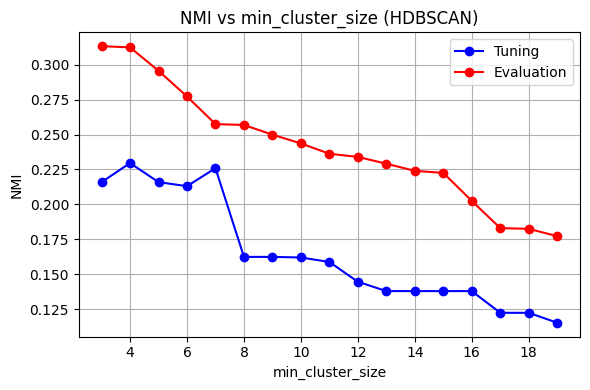

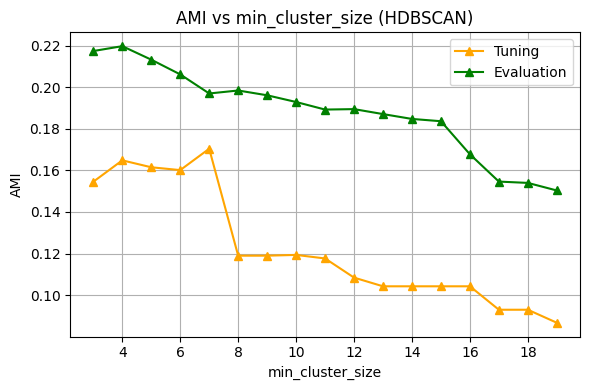

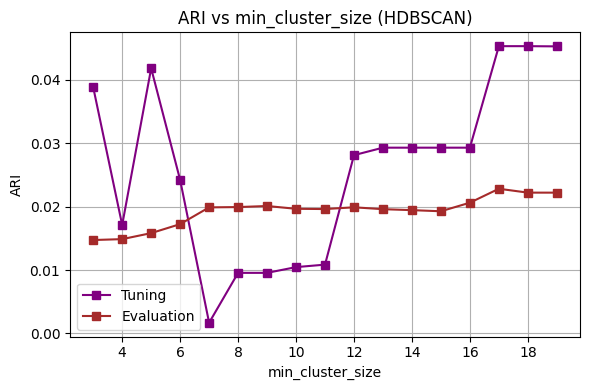

In [36]:
#@title Analyze the Effect of HDBSCAN's min_cluster_size   Parameter on Clustering Result

# === NMI Plot ===
plt.figure(figsize=(6, 4))
plt.plot(df_tuning['min_cluster_size'], df_tuning['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(df_eval['min_cluster_size'], df_eval['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs min_cluster_size (HDBSCAN)')
plt.xlabel('min_cluster_size')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === AMI Plot ===
plt.figure(figsize=(6, 4))
plt.plot(df_tuning['min_cluster_size'], df_tuning['ami'], marker='^', color='orange', label='Tuning')
plt.plot(df_eval['min_cluster_size'], df_eval['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs min_cluster_size (HDBSCAN)')
plt.xlabel('min_cluster_size')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === ARI Plot ===
plt.figure(figsize=(6, 4))
plt.plot(df_tuning['min_cluster_size'], df_tuning['ari'], marker='s', color='purple', label='Tuning')
plt.plot(df_eval['min_cluster_size'], df_eval['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs min_cluster_size (HDBSCAN)')
plt.xlabel('min_cluster_size')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [37]:
#@title 🔍 Analyze Effect of min_samples using cosine distance
from hdbscan import HDBSCAN
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score
from sklearn.metrics.pairwise import cosine_distances
import pandas as pd
import numpy as np

true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

min_cluster_sizes = [3, 5, 7, 10, 15, 20, 25]
min_samples_values = [3, 5, 7, 10]

# Compute cosine distance matrices once
tuning_cosine_dist = cosine_distances(tuning_embeddings)
evaluation_cosine_dist = cosine_distances(evaluation_embeddings)

results_tuning = []
results_eval = []

for min_samples in min_samples_values:
    nmi_tuning_list, ari_tuning_list, ami_tuning_list = [], [], []
    nmi_eval_list, ari_eval_list, ami_eval_list = [], [], []

    for min_cluster_size in min_cluster_sizes:
        # --- Tuning ---
        hdbscan_tuning = HDBSCAN(min_cluster_size=min_cluster_size,
                                 min_samples=min_samples,
                                 metric='precomputed')
        labels_tuning = hdbscan_tuning.fit_predict(tuning_cosine_dist)

        if len(set(labels_tuning)) > 1 and (labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, labels_tuning)
        else:
            nmi = ari = ami = 0

        nmi_tuning_list.append(nmi)
        ari_tuning_list.append(ari)
        ami_tuning_list.append(ami)

        # --- Evaluation ---
        hdbscan_eval = HDBSCAN(min_cluster_size=min_cluster_size,
                               min_samples=min_samples,
                               metric='precomputed')
        labels_eval = hdbscan_eval.fit_predict(evaluation_cosine_dist)

        if len(set(labels_eval)) > 1 and (labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        nmi_eval_list.append(nmi_e)
        ari_eval_list.append(ari_e)
        ami_eval_list.append(ami_e)

    # Average results for this min_samples
    results_tuning.append({
        'min_samples': min_samples,
        'nmi': np.mean(nmi_tuning_list),
        'ari': np.mean(ari_tuning_list),
        'ami': np.mean(ami_tuning_list)
    })

    results_eval.append({
        'min_samples': min_samples,
        'nmi': np.mean(nmi_eval_list),
        'ari': np.mean(ari_eval_list),
        'ami': np.mean(ami_eval_list)
    })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)


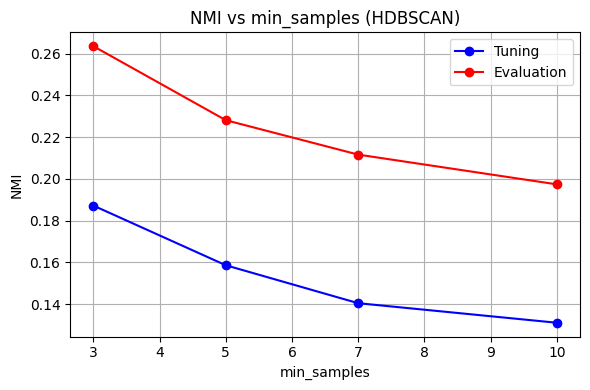

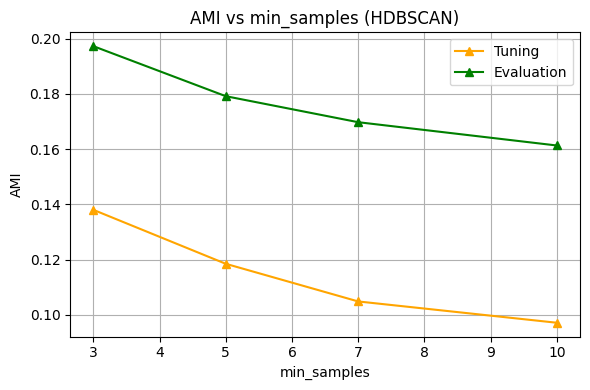

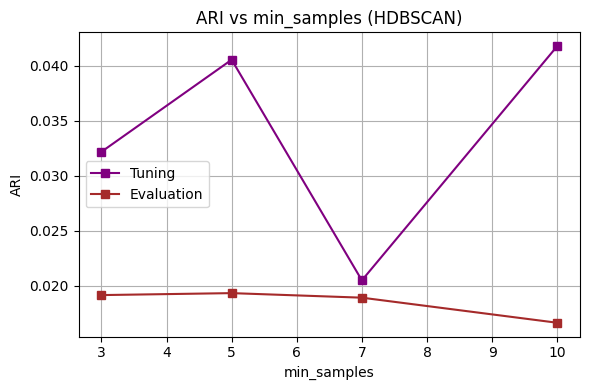

In [38]:
#@title 🔍 Analyze Effect of min_samples using cosine distance

# === NMI Plot ===
plt.figure(figsize=(6, 4))
plt.plot(df_tuning['min_samples'], df_tuning['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(df_eval['min_samples'], df_eval['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs min_samples (HDBSCAN)')
plt.xlabel('min_samples')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === AMI Plot ===
plt.figure(figsize=(6, 4))
plt.plot(df_tuning['min_samples'], df_tuning['ami'], marker='^', color='orange', label='Tuning')
plt.plot(df_eval['min_samples'], df_eval['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs min_samples (HDBSCAN)')
plt.xlabel('min_samples')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === ARI Plot ===
plt.figure(figsize=(6, 4))
plt.plot(df_tuning['min_samples'], df_tuning['ari'], marker='s', color='purple', label='Tuning')
plt.plot(df_eval['min_samples'], df_eval['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs min_samples (HDBSCAN)')
plt.xlabel('min_samples')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [39]:
#@title 🔍 Grid Search over HDBSCAN Params using cosine similarity

from hdbscan import HDBSCAN
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score
from sklearn.metrics.pairwise import cosine_distances

# Precompute cosine distance matrices
tuning_cosine_dist = cosine_distances(tuning_embeddings)
evaluation_cosine_dist = cosine_distances(evaluation_embeddings)

# True labels
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

# Grid search ranges
min_cluster_size_values = [3, 5, 10, 15]
min_samples_values = [3, 5, 7]

# Results containers
results_tuning = []
results_eval = []

for min_cluster_size in min_cluster_size_values:
    for min_samples in min_samples_values:
        # --- TUNING SET ---
        clusterer_tuning = HDBSCAN(min_cluster_size=min_cluster_size,
                                   min_samples=min_samples,
                                   metric='precomputed')
        labels_tuning = clusterer_tuning.fit_predict(tuning_cosine_dist)

        if len(set(labels_tuning)) > 1 and (labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'min_cluster_size': min_cluster_size,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- EVALUATION SET ---
        clusterer_eval = HDBSCAN(min_cluster_size=min_cluster_size,
                                 min_samples=min_samples,
                                 metric='precomputed')
        labels_eval = clusterer_eval.fit_predict(evaluation_cosine_dist)

        if len(set(labels_eval)) > 1 and (labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'min_cluster_size': min_cluster_size,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)


In [40]:
#@title Aggregate and Analyze HDBSCAN Results
agg_tuning = df_tuning.groupby('min_cluster_size')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval = df_eval.groupby('min_cluster_size')[['nmi', 'ari', 'ami']].mean().reset_index()

# Best config based on NMI
best_row = df_tuning.loc[df_tuning['nmi'].idxmax()]
print("Best HDBSCAN configuration (Tuning Set):")
print(best_row)


Best HDBSCAN configuration (Tuning Set):
min_cluster_size    3.000000
min_samples         3.000000
nmi                 0.266335
ari                -0.004429
ami                 0.173368
Name: 0, dtype: float64


In [ ]:
best_config = results_df.loc[results_df['nmi'].idxmax()]
print("Best configuration:")
print(best_config)


In [ ]:
best_reducer_cls = reducers[best_config['reducer']]
best_dim = best_config['dim']
best_min_cluster_size = int(best_config['min_cluster_size'])
best_min_samples = int(best_config['min_samples'])

reducer = best_reducer_cls(n_components=best_dim, random_state=42)
reduced_tuning_best = reducer.fit_transform(tuning_embeddings)
reduced_eval_best = reducer.transform(evaluation_embeddings)

hdb = HDBSCAN(
    min_cluster_size=best_min_cluster_size,
    min_samples=best_min_samples,
    metric='euclidean'
)

cluster_labels_tuning = hdb.fit_predict(reduced_tuning_best)
cluster_labels_eval = hdb.fit_predict(reduced_eval_best)

def safe_scores(true, pred):
    if len(set(pred)) > 1 and (pred != -1).any():
        return (
            normalized_mutual_info_score(true, pred),
            adjusted_rand_score(true, pred),
            adjusted_mutual_info_score(true, pred)
        )
    return (0, 0, 0)

nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, cluster_labels_tuning)
nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, cluster_labels_eval)

print(f"\nEvaluation (Tuning Set): NMI={nmi_t:.4f}, ARI={ari_t:.4f}, AMI={ami_t:.4f}")
print(f"Evaluation (Eval Set): NMI={nmi_e:.4f}, ARI={ari_e:.4f}, AMI={ami_e:.4f}")


In [ ]:
import matplotlib.pyplot as plt

dim_summary = results_df.groupby('dim')[['nmi']].mean().reset_index()

plt.figure(figsize=(8, 5))
plt.plot(dim_summary['dim'], dim_summary['nmi'], marker='o', label='NMI (Tuning)', color='blue')
plt.title('HDBSCAN - NMI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('NMI')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


## DBSCAN, With ARABERT Embedding

In [ ]:
# @title Install  Arabert
# from bertopic import BERTopic
from sentence_transformers import SentenceTransformer

# Use Arabic sentence transformer model
embedding_model = SentenceTransformer("aubmindlab/bert-base-arabertv2")

# Create and fit BERTopic model
# topic_model = BERTopic(embedding_model=embedding_model, language="arabic")



config.json:   0%|          | 0.00/384 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/543M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/720k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.31M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

In [ ]:
#@title Embeddding the Tweets
tweets = df['Tweet Text'].tolist()
embeddings = embedding_model.encode(tweets, show_progress_bar=True)


Batches:   0%|          | 0/219 [00:00<?, ?it/s]

In [ ]:
#@title Save the Embedding
# Convert embeddings to a regular list
df['arabert_embeddings'] = embeddings.tolist()

# # Convert to DataFrame
# embedding_df = pd.DataFrame(embeddings)

# # Save
# embedding_df.to_csv("tweet_embeddings.csv", index=False)


In [21]:
#  @title Load the embedding for the tuning and evaluation df

# Convert list of embeddings (stored as lists) into 2D numpy arrays
tuning_embeddings = np.vstack(tuning_df['arabert_embeddings'].apply(np.array).values)
evaluation_embeddings = np.vstack(evaluation_df['arabert_embeddings'].apply(np.array).values)

print(f"Tuning embeddings shape: {tuning_embeddings.shape}")
print(f"Evaluation embeddings shape: {evaluation_embeddings.shape}")


Tuning embeddings shape: (934, 768)
Evaluation embeddings shape: (6064, 768)


In [23]:

#@title Define range of DBSCAN parameters to tune
# eps_values = np.arange(0.02, 0.15, 0.01)        # Distance threshold
eps_values = np.arange(0.01, 0.25, 0.01)        # Distance threshold
min_samples_values = np.arange(3,10,1)         # Minimum samples in neighborhood
dim_values = [32, 64, 96, 128, 160, 192, 256, 320, 384, 448, 512, 640, 768]
best_score = -1
best_params = None


In [24]:
#@title Analyze the Effect of DBSCAN's epsilon Parameter on Clustering Results
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results_tuning = []
results_eval = []

# Tune over eps
for eps in eps_values:
    for min_samples in min_samples_values:
        # --- Tuning ---
        dbscan_tuning = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

        if len(set(cluster_labels_tuning)) > 1 and (cluster_labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, cluster_labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- Evaluation ---
        dbscan_eval = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_eval = dbscan_eval.fit_predict(evaluation_embeddings)

        if len(set(cluster_labels_eval)) > 1 and (cluster_labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, cluster_labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# Aggregate over min_samples
agg_tuning = df_tuning.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval = df_eval.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()



Best eps based on NMI (Tuning Set): eps = 0.13, NMI = 0.2347


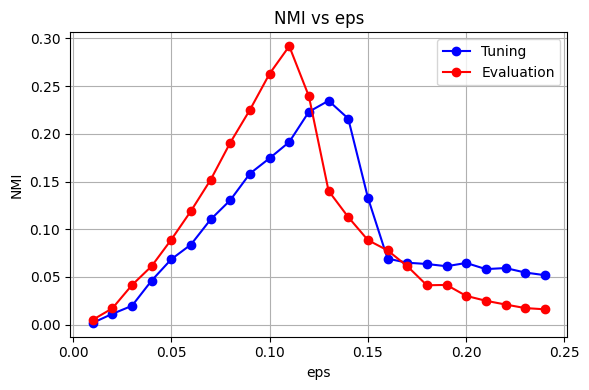

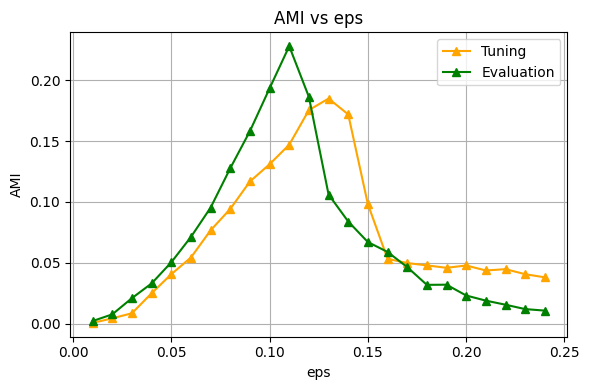

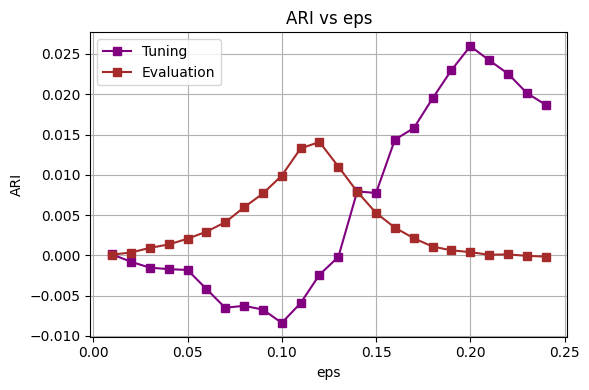

In [25]:
#@title the Effect of DBSCAN's epsilon Parameter on Clustering Result

# Print best eps based on NMI from tuning set
best_eps_row = agg_tuning.loc[agg_tuning['nmi'].idxmax()]
print(f"Best eps based on NMI (Tuning Set): eps = {best_eps_row['eps']:.2f}, NMI = {best_eps_row['nmi']:.4f}")

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs eps')
plt.xlabel('eps')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ami'], marker='^', color='orange', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs eps')
plt.xlabel('eps')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ari'], marker='s', color='purple', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs eps')
plt.xlabel('eps')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Analyze the Effect of DBSCAN's Min Samples   Parameter on Clustering Result

true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results_tuning = []
results_eval = []

# Iterate over eps and min_samples combinations
for eps in eps_values:
    for min_samples in min_samples_values:
        # --- Tuning ---
        dbscan_tuning = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

        if len(set(cluster_labels_tuning)) > 1 and (cluster_labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, cluster_labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- Evaluation ---
        dbscan_eval = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_eval = dbscan_eval.fit_predict(evaluation_embeddings)

        if len(set(cluster_labels_eval)) > 1 and (cluster_labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, cluster_labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# === Aggregate over eps to study the effect of min_samples ===
agg_tuning_min = df_tuning.groupby('min_samples')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval_min = df_eval.groupby('min_samples')[['nmi', 'ari', 'ami']].mean().reset_index()



Best min_samples based on NMI (Tuning Set): min_samples = 3, NMI = 0.1812


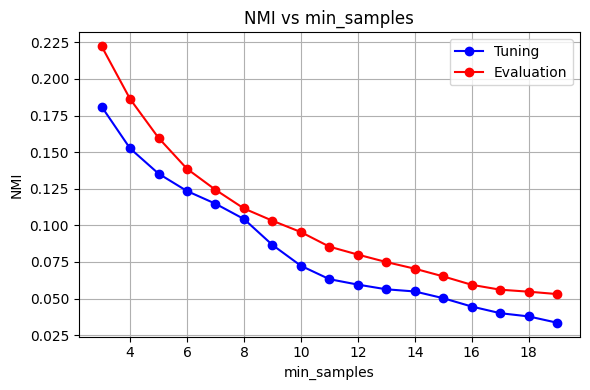

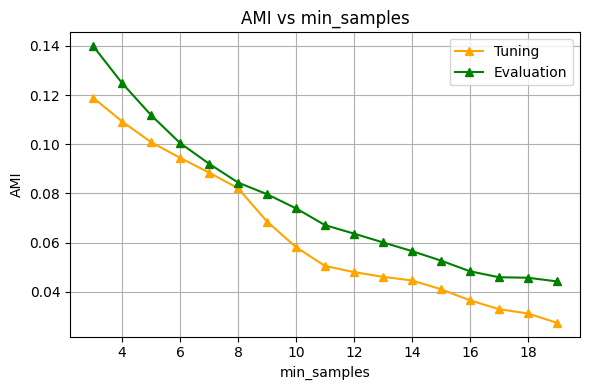

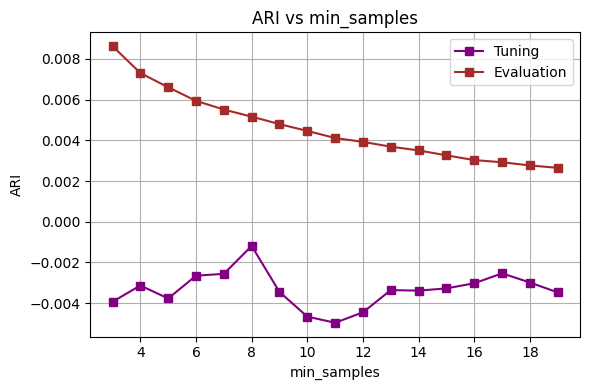

In [ ]:
#@title Analyze the Effect of DBSCAN's Min Samples   Parameter on Clustering Result

# Print best min_samples based on NMI from tuning set
best_minsample_row = agg_tuning_min.loc[agg_tuning_min['nmi'].idxmax()]
print(f"Best min_samples based on NMI (Tuning Set): min_samples = {int(best_minsample_row['min_samples'])}, NMI = {best_minsample_row['nmi']:.4f}")

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['ami'], marker='^', color='orange', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['ari'], marker='s', color='purple', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Analyze the Effect of PCA Dimensionality Reduction on DBSCAN Clustering Result

from sklearn.decomposition import PCA
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score
from sklearn.cluster import DBSCAN

# --- Settings ---

dim_values = [32, 64, 96, 128, 160, 192, 256, 320, 384, 448, 512, 640, 768]
eps_best = 0.14
min_samples_best = 3

# True labels
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

dim_results = []

for dim in dim_values:
    # Reduce embeddings
    pca = PCA(n_components=dim)
    reduced_tuning = pca.fit_transform(tuning_embeddings)
    reduced_eval = pca.transform(evaluation_embeddings)

    # --- Tuning clustering ---
    dbscan_tuning = DBSCAN(eps=eps_best, min_samples=min_samples_best, metric='cosine')
    cluster_tuning = dbscan_tuning.fit_predict(reduced_tuning)

    if len(set(cluster_tuning)) > 1 and (cluster_tuning != -1).any():
        nmi = normalized_mutual_info_score(true_labels_tuning, cluster_tuning)
        ari = adjusted_rand_score(true_labels_tuning, cluster_tuning)
        ami = adjusted_mutual_info_score(true_labels_tuning, cluster_tuning)
    else:
        nmi = ari = ami = 0

    # --- Eval clustering ---
    dbscan_eval = DBSCAN(eps=eps_best, min_samples=min_samples_best, metric='cosine')
    cluster_eval = dbscan_eval.fit_predict(reduced_eval)

    if len(set(cluster_eval)) > 1 and (cluster_eval != -1).any():
        nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_eval)
        ari_e = adjusted_rand_score(true_labels_eval, cluster_eval)
        ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_eval)
    else:
        nmi_e = ari_e = ami_e = 0

    dim_results.append({
        'dim': dim,
        'nmi_tuning': nmi,
        'ari_tuning': ari,
        'ami_tuning': ami,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

# Convert to DataFrame
dim_df = pd.DataFrame(dim_results)


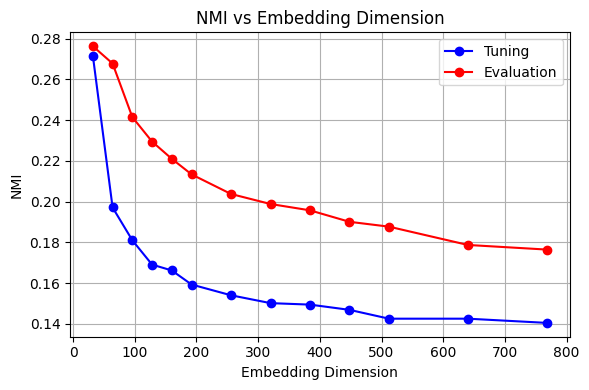

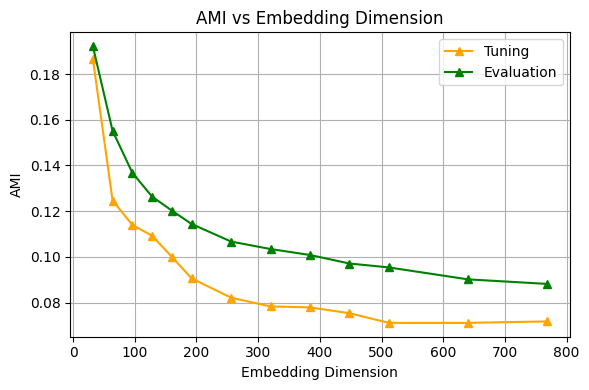

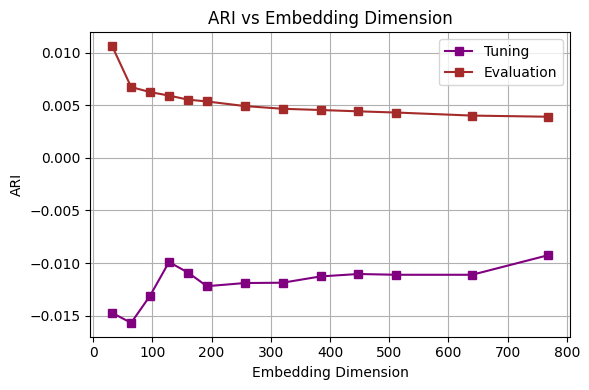

In [ ]:
#@title the Effect of PCA Dimensionality Reduction on DBSCAN Clustering Performance

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['nmi_tuning'], marker='o', label='Tuning', color='blue')
plt.plot(dim_df['dim'], dim_df['nmi_eval'], marker='o', label='Evaluation', color='red')
plt.title('NMI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['ami_tuning'], marker='^', label='Tuning', color='orange')
plt.plot(dim_df['dim'], dim_df['ami_eval'], marker='^', label='Evaluation', color='green')
plt.title('AMI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['ari_tuning'], marker='s', label='Tuning', color='purple')
plt.plot(dim_df['dim'], dim_df['ari_eval'], marker='s', label='Evaluation', color='brown')
plt.title('ARI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:

#@title Grid search on tuning set
from sklearn.decomposition import PCA
from umap import UMAP
from sklearn.cluster import DBSCAN
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

# Parameters for grid search
reducers = {
    'PCA': PCA,
    'UMAP': UMAP
}

true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results = []

# Grid search on tuning set
for reducer_name, reducer_cls in reducers.items():
    for dim in dim_values:
        print(f"Reducing tuning data to {dim}D using {reducer_name}...")
        reducer = reducer_cls(n_components=dim, random_state=42)
        reduced_tuning = reducer.fit_transform(tuning_embeddings)

        for eps in eps_values:
            for min_samples in min_samples_values:
                dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
                cluster_labels = dbscan.fit_predict(reduced_tuning)

                if len(set(cluster_labels)) > 1 and (cluster_labels != -1).any():
                    nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels)
                    ari = adjusted_rand_score(true_labels_tuning, cluster_labels)
                    ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels)
                else:
                    nmi = ari = ami = 0

                results.append({
                    'reducer': reducer_name,
                    'dim': dim,
                    'eps': eps,
                    'min_samples': min_samples,
                    'nmi': nmi,
                    'ari': ari,
                    'ami': ami,
                    'reduced_tuning': reduced_tuning
                })

results_df = pd.DataFrame(results)


Reducing tuning data to 32D using PCA...
Reducing tuning data to 64D using PCA...
Reducing tuning data to 96D using PCA...
Reducing tuning data to 128D using PCA...
Reducing tuning data to 160D using PCA...
Reducing tuning data to 192D using PCA...
Reducing tuning data to 256D using PCA...
Reducing tuning data to 320D using PCA...
Reducing tuning data to 384D using PCA...
Reducing tuning data to 448D using PCA...
Reducing tuning data to 512D using PCA...
Reducing tuning data to 640D using PCA...
Reducing tuning data to 768D using PCA...
Reducing tuning data to 32D using UMAP...
Reducing tuning data to 64D using UMAP...
Reducing tuning data to 96D using UMAP...
Reducing tuning data to 128D using UMAP...
Reducing tuning data to 160D using UMAP...
Reducing tuning data to 192D using UMAP...
Reducing tuning data to 256D using UMAP...
Reducing tuning data to 320D using UMAP...
Reducing tuning data to 384D using UMAP...
Reducing tuning data to 448D using UMAP...
Reducing tuning data to 512D u

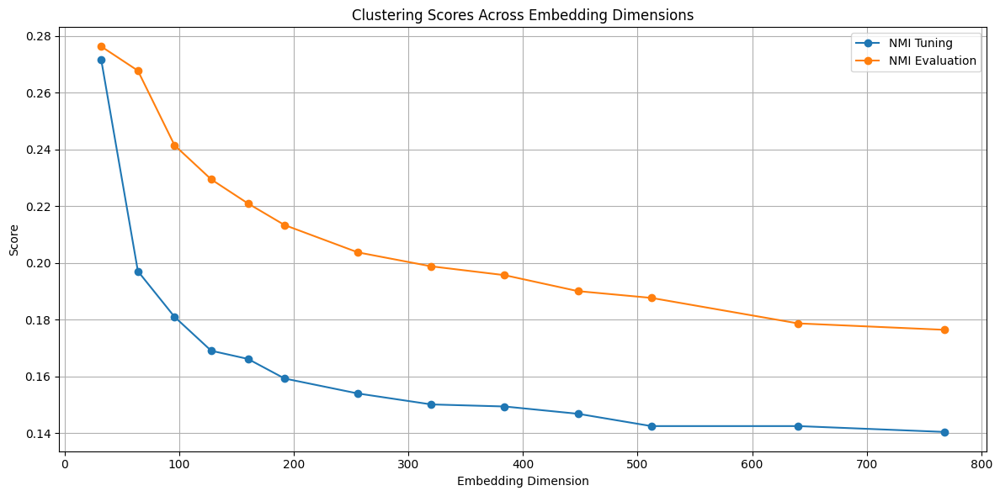

In [ ]:
#@title Nmi vs  Dim
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Plot NMI
plt.plot(dim_df['dim'], dim_df['nmi_tuning'], label='NMI Tuning', marker='o')
plt.plot(dim_df['dim'], dim_df['nmi_eval'], label='NMI Evaluation', marker='o')

# # Plot ARI
# plt.plot(dim_df['dim'], dim_df['ari_tuning'], label='ARI Tuning', marker='s')
# plt.plot(dim_df['dim'], dim_df['ari_eval'], label='ARI Evaluation', marker='s')

# # Plot AMI
# plt.plot(dim_df['dim'], dim_df['ami_tuning'], label='AMI Tuning', marker='^')
# plt.plot(dim_df['dim'], dim_df['ami_eval'], label='AMI Evaluation', marker='^')

plt.title('Clustering Scores Across Embedding Dimensions')
plt.xlabel('Embedding Dimension')
plt.ylabel('Score')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Best Params
# Get best tuning config by NMI
best_config = results_df.loc[results_df['nmi'].idxmax()]
print("Best NMI config on tuning set:")
print(best_config[['reducer', 'dim', 'eps', 'min_samples', 'nmi', 'ari', 'ami']])

# Using best config, transform evaluation embeddings and evaluate clustering
best_reducer_cls = reducers[best_config['reducer']]
best_dim = best_config['dim']
best_eps = best_config['eps']
best_min_samples = best_config['min_samples']

reducer = best_reducer_cls(n_components=best_dim, random_state=42)
reduced_tuning_best = reducer.fit_transform(tuning_embeddings)
reduced_eval_best = reducer.transform(evaluation_embeddings)

dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

cluster_labels_tuning = dbscan.fit_predict(reduced_tuning_best)
cluster_labels_eval = dbscan.fit_predict(reduced_eval_best)

def safe_scores(true, pred):
    if len(set(pred)) > 1 and (pred != -1).any():
        nmi = normalized_mutual_info_score(true, pred)
        ari = adjusted_rand_score(true, pred)
        ami = adjusted_mutual_info_score(true, pred)
    else:
        nmi = ari = ami = 0
    return nmi, ari, ami

nmi_tuning, ari_tuning, ami_tuning = safe_scores(true_labels_tuning, cluster_labels_tuning)
nmi_eval, ari_eval, ami_eval = safe_scores(true_labels_eval, cluster_labels_eval)

print("\nEvaluation metrics with best tuning config:")
print(f"NMI: {nmi_eval:.4f}, ARI: {ari_eval:.4f}, AMI: {ami_eval:.4f}")

# Summarize metrics for each dimension using best eps and min_samples
dim_metrics = []



Best NMI config on tuning set:
reducer             PCA
dim                  32
eps                0.14
min_samples           3
nmi            0.272896
ari           -0.014109
ami            0.188416
Name: 21, dtype: object

Evaluation metrics with best tuning config:
NMI: 0.2734, ARI: 0.0104, AMI: 0.1881


In [ ]:
#@title Summarize clustering scores across embedding dimensions for best tuning hyperparameters

dim_metrics = []

for dim in dim_values:
    # Initialize reducer with the current dimension
    reducer = best_reducer_cls(n_components=dim, random_state=42)

    # Fit transform tuning embeddings and transform evaluation embeddings
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    # Initialize DBSCAN with best hyperparameters from tuning
    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    # Predict cluster labels on tuning and evaluation sets
    labels_tuning = dbscan.fit_predict(reduced_tuning)
    labels_eval = dbscan.fit_predict(reduced_eval)

    # Compute scores safely
    nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, labels_tuning)
    nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, labels_eval)

    # Append results
    dim_metrics.append({
        'dim': dim,
        'nmi_tuning': nmi_t,
        'ari_tuning': ari_t,
        'ami_tuning': ami_t,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

# Create DataFrame for easier visualization
dim_df = pd.DataFrame(dim_metrics)

print("\nSummary of clustering metrics across embedding dimensions:")
print(dim_df.to_string(index=False))



Summary of clustering metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval
  32    0.272896   -0.014109    0.188416  0.273353  0.010420  0.188119
  64    0.197131   -0.015677    0.124616  0.268647  0.006749  0.155844
  96    0.179197   -0.011349    0.114640  0.239374  0.006202  0.135622
 128    0.169089   -0.009900    0.109222  0.227817  0.005871  0.125949
 160    0.166214   -0.010893    0.100030  0.219837  0.005514  0.119515
 192    0.159310   -0.012190    0.090569  0.212752  0.005383  0.114276
 256    0.154028   -0.011892    0.082150  0.203822  0.004896  0.106583
 320    0.150174   -0.011861    0.078290  0.198321  0.004640  0.103009
 384    0.149446   -0.011264    0.077876  0.195147  0.004538  0.100663
 448    0.146875   -0.011033    0.075330  0.190559  0.004453  0.098121
 512    0.142537   -0.011106    0.071095  0.187236  0.004286  0.094921
 640    0.142537   -0.011106    0.071095  0.178736  0.004016  0.090148
 768    0.140474 

In [ ]:
#@title The Results of the Clustering
dim_metrics = []

for dim in dim_values:
    reducer = best_reducer_cls(n_components=dim, random_state=42)
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    print(f"Using eps = {best_eps}, min_samples = {best_min_samples} for dim = {dim}")

    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    labels_tuning = dbscan.fit_predict(reduced_tuning)
    labels_eval = dbscan.fit_predict(reduced_eval)

    nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, labels_tuning)
    nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, labels_eval)

    dim_metrics.append({
        'dim': dim,
        'nmi_tuning': nmi_t,
        'ari_tuning': ari_t,
        'ami_tuning': ami_t,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

dim_df = pd.DataFrame(dim_metrics)

print("\nSummary of metrics across embedding dimensions:")
print(dim_df.to_string(index=False))


Using eps = 0.13999999999999999, min_samples = 3 for dim = 32
Using eps = 0.13999999999999999, min_samples = 3 for dim = 64
Using eps = 0.13999999999999999, min_samples = 3 for dim = 96
Using eps = 0.13999999999999999, min_samples = 3 for dim = 128
Using eps = 0.13999999999999999, min_samples = 3 for dim = 160
Using eps = 0.13999999999999999, min_samples = 3 for dim = 192
Using eps = 0.13999999999999999, min_samples = 3 for dim = 256
Using eps = 0.13999999999999999, min_samples = 3 for dim = 320
Using eps = 0.13999999999999999, min_samples = 3 for dim = 384
Using eps = 0.13999999999999999, min_samples = 3 for dim = 448
Using eps = 0.13999999999999999, min_samples = 3 for dim = 512
Using eps = 0.13999999999999999, min_samples = 3 for dim = 640
Using eps = 0.13999999999999999, min_samples = 3 for dim = 768

Summary of metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval
  32    0.272896   -0.014109    0.188416  0.273353  0.010420  0.

In [ ]:
#@title Clustering and Topic Modeling Metrics Summary Across Embedding Dimensions
from sklearn.metrics import silhouette_score
from gensim.corpora import Dictionary
from gensim.models.coherencemodel import CoherenceModel

def safe_silhouette_score(X, labels):
    if len(set(labels)) > 1 and len(X) > len(set(labels)):
        return silhouette_score(X, labels, metric='cosine')
    return -1

def get_topic_coherence(texts, labels, coherence_type='c_v'):
    clustered_docs = {}
    for text, label in zip(texts, labels):
        if label == -1:
            continue
        clustered_docs.setdefault(label, []).append(text)

    topics = [docs for docs in clustered_docs.values() if len(docs) >= 3]

    if len(topics) == 0:
        return -1

    tokenized_topics = [[word for doc in topic for word in doc.split()] for topic in topics]

    dictionary = Dictionary(tokenized_topics)
    corpus = [dictionary.doc2bow(text) for text in tokenized_topics]

    coherence_model = CoherenceModel(
        topics=tokenized_topics,
        texts=tokenized_topics,
        corpus=corpus,
        dictionary=dictionary,
        coherence=coherence_type
    )

    return coherence_model.get_coherence()

# Ground truth number of events (true clusters)
true_events_tuning = len(set(tuning_df['event_label']))
true_events_eval = len(set(evaluation_df['event_label']))

# Initialize list for metrics
additional_metrics = []

for dim in dim_values:
    reducer = best_reducer_cls(n_components=dim, random_state=42)
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    # Tuning
    labels_tuning = dbscan.fit_predict(reduced_tuning)
    silhouette_t = safe_silhouette_score(reduced_tuning, labels_tuning)
    num_clusters_t = len(set(labels_tuning)) - (1 if -1 in labels_tuning else 0)
    coherence_t_cv = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='c_v')
    coherence_t_umass = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='u_mass')

    # Evaluation
    labels_eval = dbscan.fit_predict(reduced_eval)
    silhouette_e = safe_silhouette_score(reduced_eval, labels_eval)
    num_clusters_e = len(set(labels_eval)) - (1 if -1 in labels_eval else 0)
    coherence_e_cv = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='c_v')
    coherence_e_umass = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='u_mass')

    additional_metrics.append({
        'dim': dim,
        'true_events_tuning': true_events_tuning,
        'true_events_eval': true_events_eval,
        'silhouette_tuning': silhouette_t,
        'num_clusters_tuning': num_clusters_t,
        'coherence_tuning_c_v': coherence_t_cv,
        'coherence_tuning_u_mass': coherence_t_umass,
        'silhouette_eval': silhouette_e,
        'num_clusters_eval': num_clusters_e,
        'coherence_eval_c_v': coherence_e_cv,
        'coherence_eval_u_mass': coherence_e_umass
    })

# Merge with original dim_df
extra_df = pd.DataFrame(additional_metrics)
dim_df = pd.merge(dim_df, extra_df, on='dim')

# Display full summary
print("\nSummary of all clustering metrics across embedding dimensions:")
print(dim_df.to_string(index=False))



Summary of all clustering metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval  true_events_tuning  true_events_eval  silhouette_tuning  num_clusters_tuning  coherence_tuning_c_v  coherence_tuning_u_mass  silhouette_eval  num_clusters_eval  coherence_eval_c_v  coherence_eval_u_mass
  32    0.272896   -0.014109    0.188416  0.273353  0.010420  0.188119                  31               103          -0.262887                   27              0.827777                -0.622548        -0.410749                129            0.660711              -0.908921
  64    0.197131   -0.015677    0.124616  0.268647  0.006749  0.155844                  31               103          -0.224249                   20              0.824099                -0.535501        -0.375203                163            0.755690              -1.121093
  96    0.179197   -0.011349    0.114640  0.239374  0.006202  0.135622                  31               103   

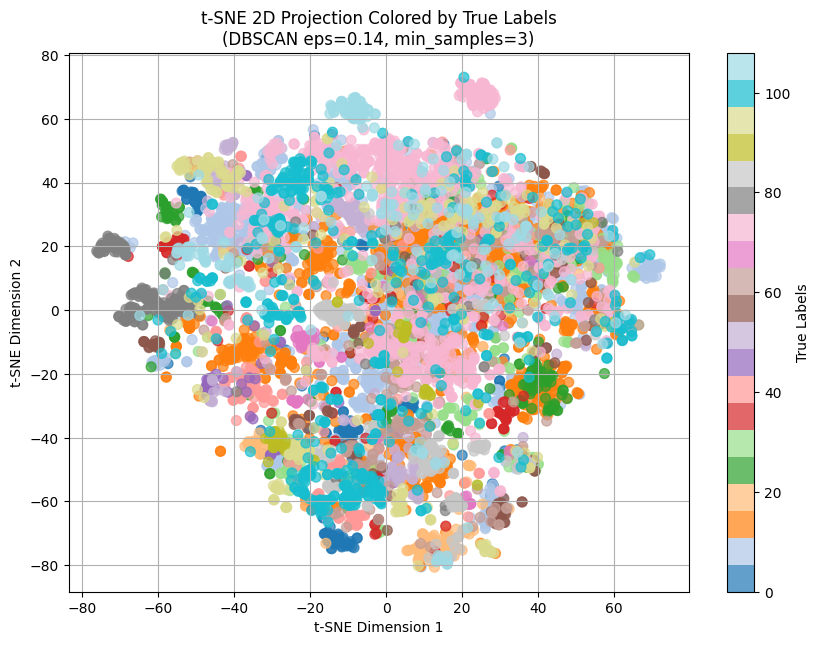

In [ ]:
#@title Visualisation
from sklearn.cluster import DBSCAN
from sklearn.manifold import TSNE
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

true_labels = evaluation_df['event_label'].values  # Use evaluation labels
best_params_eps=0.14
best_params_min_samples=3

# Run DBSCAN with best params on evaluation embeddings
best_dbscan = DBSCAN(eps=best_params_eps, min_samples=int(best_params_min_samples), metric='cosine')
best_cluster_labels = best_dbscan.fit_predict(evaluation_embeddings)

# t-SNE dimensionality reduction to 2D on evaluation embeddings
tsne = TSNE(n_components=2, random_state=42, init='pca')
reduced_embeddings = tsne.fit_transform(evaluation_embeddings)

# Plotting
plt.figure(figsize=(10, 7))
scatter = plt.scatter(
    reduced_embeddings[:, 0], reduced_embeddings[:, 1],
    c=true_labels, cmap='tab20', alpha=0.7, s=50
)
plt.colorbar(scatter, label='True Labels')
plt.title(f"t-SNE 2D Projection Colored by True Labels\n(DBSCAN eps={best_params_eps:.2f}, min_samples={int(best_params_min_samples)})")
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.grid(True)
plt.show()


## DBSCAN, With ARABERT Embedding + Named Entities as Splited


In [ ]:
# @title Install  Arabert
# from bertopic import BERTopic
from sentence_transformers import SentenceTransformer

# Use Arabic sentence transformer model
embedding_model = SentenceTransformer("aubmindlab/bert-base-arabertv2")

# Create and fit BERTopic model
# topic_model = BERTopic(embedding_model=embedding_model, language="arabic")



In [ ]:
#@title Embedding the Tweets
# Imports
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from sklearn.decomposition import PCA
import pandas as pd
import numpy as np
from tqdm import tqdm

# tweets = df['Tweet Text'].tolist()
# embeddings = embedding_model.encode(tweets, show_progress_bar=True)


Batches:   0%|          | 0/219 [00:00<?, ?it/s]

In [ ]:
#@title Embedding the Named Entities
# import ast
# import re



# # Preview
# df['hashtags'].head()
# Helper to embed list of tokens (e.g., hashtags or named entities)
# Convert stringifNied lists to Python lists (e.g. ["flood", "storm"] → ['flood', 'storm'])
if isinstance(df['Named Entities'].iloc[0], str):
    df['Named Entities'] = df['Named Entities'].apply(eval)

if isinstance(df['Hashtags'].iloc[0], str):
    df['Hashtags'] = df['Hashtags'].apply(eval)

if isinstance(df['PER'].iloc[0], str):
    df['PER'] = df['PER'].apply(eval)

if isinstance(df['ORG'].iloc[0], str):
    df['ORG'] = df['ORG'].apply(eval)

if isinstance(df['LOC'].iloc[0], str):
    df['LOC'] = df['LOC'].apply(eval)

def embed_and_average(token_lists):
    results = []
    for tokens in tqdm(token_lists, desc="Embedding token lists"):
        if not tokens:
            results.append(np.zeros(768))  # Return zero-vector for empty input
        else:
            token_embeds = embedding_model.encode(tokens)
            avg_embedding = np.mean(token_embeds, axis=0)
            results.append(avg_embedding)
    return np.vstack(results)

# Embed both columns
# named_entity_embeddings = embed_and_average(df['Named Entities'])
# hashtag_embeddings = embed_and_average(df['Hashtags'])

org_entity_embeddings = embed_and_average(df['ORG'])
loc_entity_embeddings = embed_and_average(df['LOC'])
per_entity_embeddings = embed_and_average(df['PER'])



Embedding token lists: 100%|██████████| 6998/6998 [01:28<00:00, 78.94it/s] 


In [ ]:

#@title  PCA Reduction to 32D
pca_ne = PCA(n_components=16)
pca_hs = PCA(n_components=64)

# ne_embeddings_32d = pca_ne.fit_transform(named_entity_embeddings)
# hs_embeddings_32d = pca_hs.fit_transform(hashtag_embeddings)
per_embeddings_32d = pca_ne.fit_transform(per_entity_embeddings)
org_embeddings_32d = pca_ne.fit_transform(org_entity_embeddings)
loc_embeddings_32d = pca_ne.fit_transform(loc_entity_embeddings)

In [ ]:
#@title Save the Embedding
# Convert embeddings to a regular list
# df['arabert_embeddings'] = embeddings.tolist()
# Save back to the DataFrame
# df['named_entities_embedding_32d'] = ne_embeddings_32d.tolist()
# df['hashtags_embedding_32d'] = hs_embeddings_32d.tolist()

df['per_embeddings_32d'] = per_embeddings_32d.tolist()
df['org_embeddings_32d'] = org_embeddings_32d.tolist()
df['loc_embeddings_32d'] = loc_embeddings_32d.tolist()

# # Convert to DataFrame
# embedding_df = pd.DataFrame(embeddings)

# # Save
# embedding_df.to_csv("tweet_embeddings.csv", index=False)


In [ ]:
#  @title Load the embedding for the tuning and evaluation df
import numpy as np

# Convert and concatenate for tuning set
tuning_tweet_emb = np.vstack(tuning_df['arabert_embeddings'].apply(np.array).values)
tuning_ne_emb = np.vstack(tuning_df['named_entities_embedding_32d'].apply(np.array).values)
tuning_hs_emb = np.vstack(tuning_df['hashtags_embedding_32d'].apply(np.array).values)

tuning_per_emb = np.vstack(tuning_df['per_embeddings_32d'].apply(np.array).values)
tuning_org_emb = np.vstack(tuning_df['org_embeddings_32d'].apply(np.array).values)
tuning_loc_emb = np.vstack(tuning_df['loc_embeddings_32d'].apply(np.array).values)

# Final concatenated embedding: 768 + 32 + 32 = 832 dimensions
# tuning_embeddings = np.hstack([tuning_tweet_emb, tuning_ne_emb]) # , tuning_hs_emb
tuning_embeddings = np.hstack([tuning_tweet_emb, tuning_per_emb,tuning_org_emb,tuning_loc_emb]) # , tuning_hs_emb

# Convert and concatenate for evaluation set
evaluation_tweet_emb = np.vstack(evaluation_df['arabert_embeddings'].apply(np.array).values)
evaluation_ne_emb = np.vstack(evaluation_df['named_entities_embedding_32d'].apply(np.array).values)
evaluation_hs_emb = np.vstack(evaluation_df['hashtags_embedding_32d'].apply(np.array).values)

evaluation_per_emb = np.vstack(evaluation_df['per_embeddings_32d'].apply(np.array).values)
evaluation_org_emb = np.vstack(evaluation_df['org_embeddings_32d'].apply(np.array).values)
evaluation_loc_emb = np.vstack(evaluation_df['loc_embeddings_32d'].apply(np.array).values)

evaluation_embeddings = np.hstack([evaluation_tweet_emb, evaluation_ne_emb]) # , evaluation_hs_emb

evaluation_embeddings = np.hstack([evaluation_tweet_emb, evaluation_per_emb, evaluation_org_emb, evaluation_loc_emb ]) # , evalu
# Check shapes
print(f"Tuning embeddings shape: {tuning_embeddings.shape}")
print(f"Evaluation embeddings shape: {evaluation_embeddings.shape}")


Tuning embeddings shape: (934, 816)
Evaluation embeddings shape: (6064, 816)


In [ ]:

#@title Define range of DBSCAN parameters to tune
eps_values = np.arange(0.02, 0.20, 0.01)        # Distance threshold
# eps_values = np.arange(0.11, 0.15, 0.01)        # Distance threshold
min_samples_values = np.arange(3,8,1)         # Minimum samples in neighborhood
dim_values = [32, 64, 96, 128, 160, 192, 256, 320, 384, 448, 512, 640, 768,816]
best_score = -1
best_params = None


In [ ]:
#@title Analyze the Effect of DBSCAN's epsilon Parameter on Clustering Results
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results_tuning = []
results_eval = []

# Tune over eps
for eps in eps_values:
    for min_samples in min_samples_values:
        # --- Tuning ---
        dbscan_tuning = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

        if len(set(cluster_labels_tuning)) > 1 and (cluster_labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, cluster_labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- Evaluation ---
        dbscan_eval = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_eval = dbscan_eval.fit_predict(evaluation_embeddings)

        if len(set(cluster_labels_eval)) > 1 and (cluster_labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, cluster_labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# Aggregate over min_samples
agg_tuning = df_tuning.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval = df_eval.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()



Best eps based on NMI (Tuning Set): eps = 0.14, NMI = 0.2542


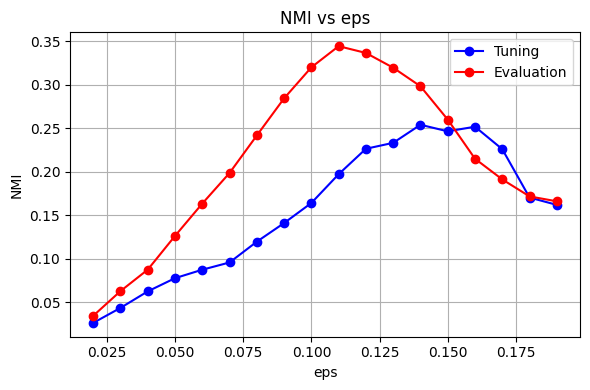

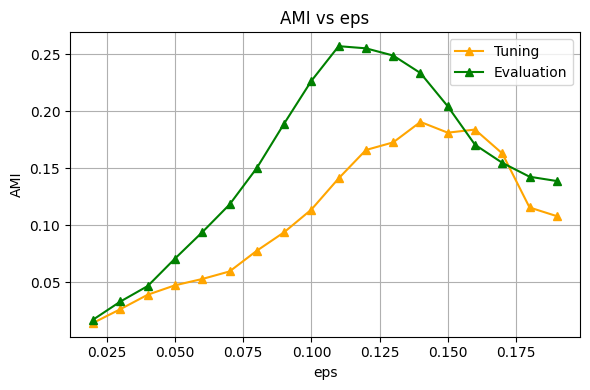

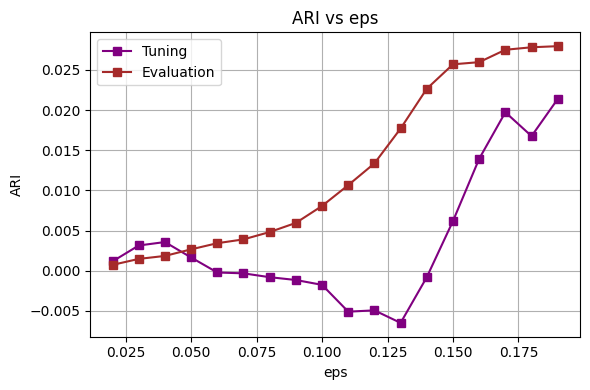

In [ ]:
#@title the Effect of DBSCAN's epsilon Parameter on Clustering Result

# Print best eps based on NMI from tuning set
best_eps_row = agg_tuning.loc[agg_tuning['nmi'].idxmax()]
print(f"Best eps based on NMI (Tuning Set): eps = {best_eps_row['eps']:.2f}, NMI = {best_eps_row['nmi']:.4f}")

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs eps')
plt.xlabel('eps')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ami'], marker='^', color='orange', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs eps')
plt.xlabel('eps')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ari'], marker='s', color='purple', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs eps')
plt.xlabel('eps')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Analyze the Effect of DBSCAN's Min Samples   Parameter on Clustering Result

true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results_tuning = []
results_eval = []

# Iterate over eps and min_samples combinations
for eps in eps_values:
    for min_samples in min_samples_values:
        # --- Tuning ---
        dbscan_tuning = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

        if len(set(cluster_labels_tuning)) > 1 and (cluster_labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, cluster_labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- Evaluation ---
        dbscan_eval = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_eval = dbscan_eval.fit_predict(evaluation_embeddings)

        if len(set(cluster_labels_eval)) > 1 and (cluster_labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, cluster_labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# === Aggregate over eps to study the effect of min_samples ===
agg_tuning_min = df_tuning.groupby('min_samples')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval_min = df_eval.groupby('min_samples')[['nmi', 'ari', 'ami']].mean().reset_index()



Best min_samples based on NMI (Tuning Set): min_samples = 3, NMI = 0.1933


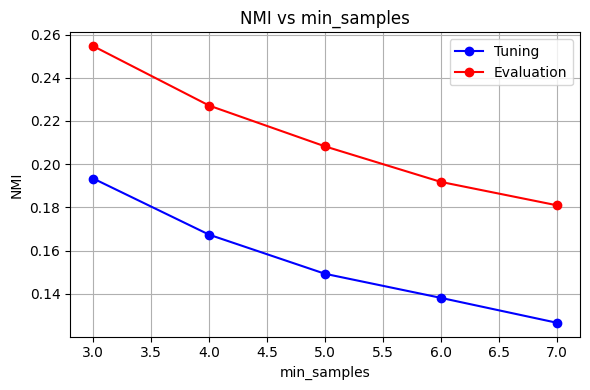

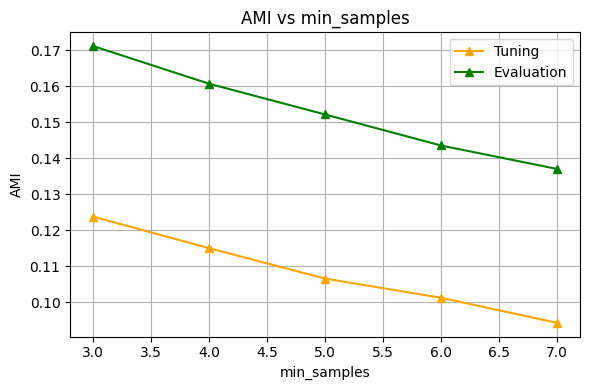

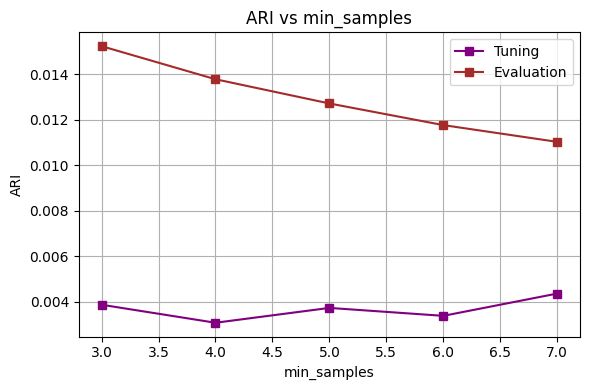

In [ ]:
#@title Analyze the Effect of DBSCAN's Min Samples   Parameter on Clustering Result

# Print best min_samples based on NMI from tuning set
best_minsample_row = agg_tuning_min.loc[agg_tuning_min['nmi'].idxmax()]
print(f"Best min_samples based on NMI (Tuning Set): min_samples = {int(best_minsample_row['min_samples'])}, NMI = {best_minsample_row['nmi']:.4f}")

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['ami'], marker='^', color='orange', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['ari'], marker='s', color='purple', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Analyze the Effect of PCA Dimensionality Reduction on DBSCAN Clustering Result

from sklearn.decomposition import PCA
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score
from sklearn.cluster import DBSCAN

# --- Settings ---

# dim_values = [32, 64, 96, 128, 160, 192, 256, 320, 384, 448, 512, 640, 768]
eps_best = 0.12
min_samples_best = 3

# True labels
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

dim_results = []

for dim in dim_values:
    # Reduce embeddings
    pca = PCA(n_components=dim)
    reduced_tuning = pca.fit_transform(tuning_embeddings)
    reduced_eval = pca.transform(evaluation_embeddings)

    # --- Tuning clustering ---
    dbscan_tuning = DBSCAN(eps=eps_best, min_samples=min_samples_best, metric='cosine')
    cluster_tuning = dbscan_tuning.fit_predict(reduced_tuning)

    if len(set(cluster_tuning)) > 1 and (cluster_tuning != -1).any():
        nmi = normalized_mutual_info_score(true_labels_tuning, cluster_tuning)
        ari = adjusted_rand_score(true_labels_tuning, cluster_tuning)
        ami = adjusted_mutual_info_score(true_labels_tuning, cluster_tuning)
    else:
        nmi = ari = ami = 0

    # --- Eval clustering ---
    dbscan_eval = DBSCAN(eps=eps_best, min_samples=min_samples_best, metric='cosine')
    cluster_eval = dbscan_eval.fit_predict(reduced_eval)

    if len(set(cluster_eval)) > 1 and (cluster_eval != -1).any():
        nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_eval)
        ari_e = adjusted_rand_score(true_labels_eval, cluster_eval)
        ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_eval)
    else:
        nmi_e = ari_e = ami_e = 0

    dim_results.append({
        'dim': dim,
        'nmi_tuning': nmi,
        'ari_tuning': ari,
        'ami_tuning': ami,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

# Convert to DataFrame
dim_df = pd.DataFrame(dim_results)


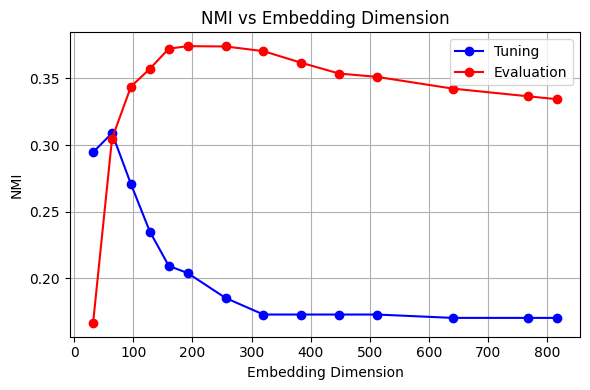

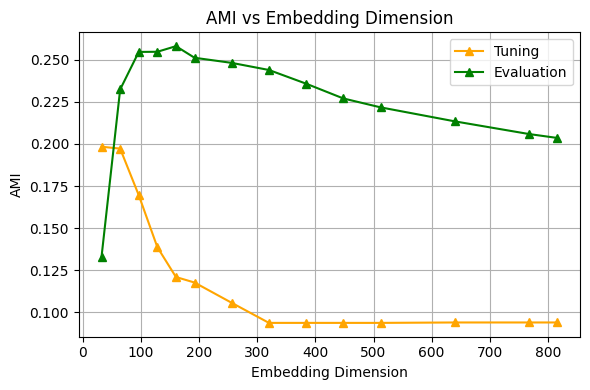

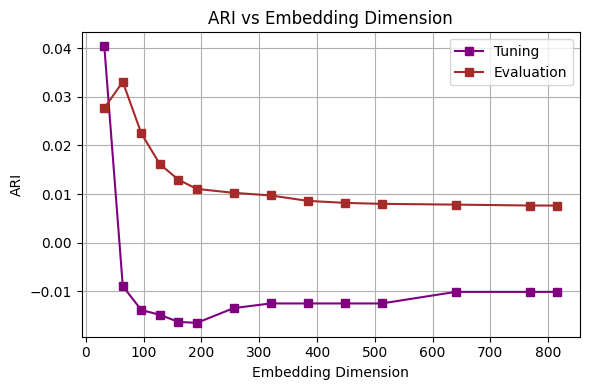

In [ ]:
#@title the Effect of PCA Dimensionality Reduction on DBSCAN Clustering Performance

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['nmi_tuning'], marker='o', label='Tuning', color='blue')
plt.plot(dim_df['dim'], dim_df['nmi_eval'], marker='o', label='Evaluation', color='red')
plt.title('NMI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['ami_tuning'], marker='^', label='Tuning', color='orange')
plt.plot(dim_df['dim'], dim_df['ami_eval'], marker='^', label='Evaluation', color='green')
plt.title('AMI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['ari_tuning'], marker='s', label='Tuning', color='purple')
plt.plot(dim_df['dim'], dim_df['ari_eval'], marker='s', label='Evaluation', color='brown')
plt.title('ARI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:

#@title Grid search on tuning set
from sklearn.decomposition import PCA
from umap import UMAP
from sklearn.cluster import DBSCAN
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

# Parameters for grid search
reducers = {
    'PCA': PCA,
    'UMAP': UMAP
}

true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results = []

# Grid search on tuning set
for reducer_name, reducer_cls in reducers.items():
    for dim in dim_values:
        print(f"Reducing tuning data to {dim}D using {reducer_name}...")
        reducer = reducer_cls(n_components=dim, random_state=42)
        reduced_tuning = reducer.fit_transform(tuning_embeddings)

        for eps in eps_values:
            for min_samples in min_samples_values:
                dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
                cluster_labels = dbscan.fit_predict(reduced_tuning)

                if len(set(cluster_labels)) > 1 and (cluster_labels != -1).any():
                    nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels)
                    ari = adjusted_rand_score(true_labels_tuning, cluster_labels)
                    ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels)
                else:
                    nmi = ari = ami = 0

                results.append({
                    'reducer': reducer_name,
                    'dim': dim,
                    'eps': eps,
                    'min_samples': min_samples,
                    'nmi': nmi,
                    'ari': ari,
                    'ami': ami,
                    'reduced_tuning': reduced_tuning
                })

results_df = pd.DataFrame(results)


Reducing tuning data to 32D using PCA...
Reducing tuning data to 64D using PCA...
Reducing tuning data to 96D using PCA...
Reducing tuning data to 128D using PCA...
Reducing tuning data to 160D using PCA...
Reducing tuning data to 192D using PCA...
Reducing tuning data to 256D using PCA...
Reducing tuning data to 320D using PCA...
Reducing tuning data to 384D using PCA...
Reducing tuning data to 448D using PCA...
Reducing tuning data to 512D using PCA...
Reducing tuning data to 640D using PCA...
Reducing tuning data to 768D using PCA...
Reducing tuning data to 816D using PCA...
Reducing tuning data to 32D using UMAP...
Reducing tuning data to 64D using UMAP...
Reducing tuning data to 96D using UMAP...
Reducing tuning data to 128D using UMAP...
Reducing tuning data to 160D using UMAP...
Reducing tuning data to 192D using UMAP...
Reducing tuning data to 256D using UMAP...
Reducing tuning data to 320D using UMAP...
Reducing tuning data to 384D using UMAP...
Reducing tuning data to 448D us

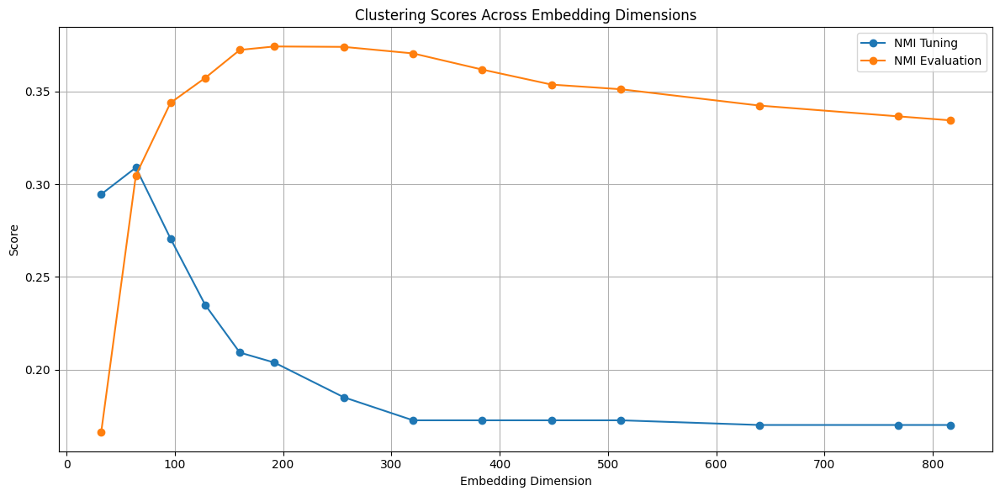

In [ ]:
#@title Nmi vs  Dim
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Plot NMI
plt.plot(dim_df['dim'], dim_df['nmi_tuning'], label='NMI Tuning', marker='o')
plt.plot(dim_df['dim'], dim_df['nmi_eval'], label='NMI Evaluation', marker='o')

# # Plot ARI
# plt.plot(dim_df['dim'], dim_df['ari_tuning'], label='ARI Tuning', marker='s')
# plt.plot(dim_df['dim'], dim_df['ari_eval'], label='ARI Evaluation', marker='s')

# # Plot AMI
# plt.plot(dim_df['dim'], dim_df['ami_tuning'], label='AMI Tuning', marker='^')
# plt.plot(dim_df['dim'], dim_df['ami_eval'], label='AMI Evaluation', marker='^')

plt.title('Clustering Scores Across Embedding Dimensions')
plt.xlabel('Embedding Dimension')
plt.ylabel('Score')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Best Params
# Get best tuning config by NMI
best_config = results_df.loc[results_df['nmi'].idxmax()]
print("Best NMI config on tuning set:")
print(best_config[['reducer', 'dim', 'eps', 'min_samples', 'nmi', 'ari', 'ami']])

# Using best config, transform evaluation embeddings and evaluate clustering
best_reducer_cls = reducers[best_config['reducer']]
best_dim = best_config['dim']
best_eps = best_config['eps']
best_min_samples = best_config['min_samples']

reducer = best_reducer_cls(n_components=best_dim, random_state=42)
reduced_tuning_best = reducer.fit_transform(tuning_embeddings)
reduced_eval_best = reducer.transform(evaluation_embeddings)

dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

cluster_labels_tuning = dbscan.fit_predict(reduced_tuning_best)
cluster_labels_eval = dbscan.fit_predict(reduced_eval_best)

def safe_scores(true, pred):
    if len(set(pred)) > 1 and (pred != -1).any():
        nmi = normalized_mutual_info_score(true, pred)
        ari = adjusted_rand_score(true, pred)
        ami = adjusted_mutual_info_score(true, pred)
    else:
        nmi = ari = ami = 0
    return nmi, ari, ami

nmi_tuning, ari_tuning, ami_tuning = safe_scores(true_labels_tuning, cluster_labels_tuning)
nmi_eval, ari_eval, ami_eval = safe_scores(true_labels_eval, cluster_labels_eval)

print("\nEvaluation metrics with best tuning config:")
print(f"NMI: {nmi_eval:.4f}, ARI: {ari_eval:.4f}, AMI: {ami_eval:.4f}")

# Summarize metrics for each dimension using best eps and min_samples
dim_metrics = []



Best NMI config on tuning set:
reducer             PCA
dim                 128
eps                0.18
min_samples           3
nmi            0.330229
ari            0.005197
ami            0.222846
Name: 350, dtype: object

Evaluation metrics with best tuning config:
NMI: 0.2597, ARI: 0.0389, AMI: 0.2045


In [ ]:
#@title Summarize clustering scores across embedding dimensions for best tuning hyperparameters

dim_metrics = []

for dim in dim_values:
    # Initialize reducer with the current dimension
    reducer = best_reducer_cls(n_components=dim, random_state=42)

    # Fit transform tuning embeddings and transform evaluation embeddings
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    # Initialize DBSCAN with best hyperparameters from tuning
    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    # Predict cluster labels on tuning and evaluation sets
    labels_tuning = dbscan.fit_predict(reduced_tuning)
    labels_eval = dbscan.fit_predict(reduced_eval)

    # Compute scores safely
    nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, labels_tuning)
    nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, labels_eval)

    # Append results
    dim_metrics.append({
        'dim': dim,
        'nmi_tuning': nmi_t,
        'ari_tuning': ari_t,
        'ami_tuning': ami_t,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

# Create DataFrame for easier visualization
dim_df = pd.DataFrame(dim_metrics)

print("\nSummary of clustering metrics across embedding dimensions:")
print(dim_df.to_string(index=False))



Summary of clustering metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval
  32    0.169134    0.028320    0.102774  0.142167  0.023907  0.122748
  64    0.283540    0.048424    0.193855  0.159823  0.027389  0.133065
  96    0.308126    0.019526    0.217555  0.208157  0.033570  0.162876
 128    0.330229    0.005197    0.222846  0.259678  0.038882  0.204472
 160    0.313229    0.000699    0.209786  0.290652  0.038763  0.225747
 192    0.295241   -0.004251    0.194392  0.306390  0.036624  0.237291
 256    0.287812   -0.012630    0.189452  0.342657  0.032860  0.265915
 320    0.286684   -0.012973    0.188172  0.353886  0.030518  0.270424
 384    0.280000   -0.015207    0.184559  0.358124  0.025877  0.267454
 448    0.280108   -0.015798    0.182737  0.366487  0.024830  0.272799
 512    0.279808   -0.015900    0.182798  0.366035  0.023362  0.272021
 640    0.280002   -0.016073    0.183244  0.367273  0.021898  0.270149
 768    0.280002 

In [ ]:
#@title The Results of the Clustering
dim_metrics = []

for dim in dim_values:
    reducer = best_reducer_cls(n_components=dim, random_state=42)
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    print(f"Using eps = {best_eps}, min_samples = {best_min_samples} for dim = {dim}")

    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    labels_tuning = dbscan.fit_predict(reduced_tuning)
    labels_eval = dbscan.fit_predict(reduced_eval)

    nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, labels_tuning)
    nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, labels_eval)

    dim_metrics.append({
        'dim': dim,
        'nmi_tuning': nmi_t,
        'ari_tuning': ari_t,
        'ami_tuning': ami_t,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

dim_df = pd.DataFrame(dim_metrics)

print("\nSummary of metrics across embedding dimensions:")
print(dim_df.to_string(index=False))


Using eps = 0.17999999999999997, min_samples = 3 for dim = 32
Using eps = 0.17999999999999997, min_samples = 3 for dim = 64
Using eps = 0.17999999999999997, min_samples = 3 for dim = 96
Using eps = 0.17999999999999997, min_samples = 3 for dim = 128
Using eps = 0.17999999999999997, min_samples = 3 for dim = 160
Using eps = 0.17999999999999997, min_samples = 3 for dim = 192
Using eps = 0.17999999999999997, min_samples = 3 for dim = 256
Using eps = 0.17999999999999997, min_samples = 3 for dim = 320
Using eps = 0.17999999999999997, min_samples = 3 for dim = 384
Using eps = 0.17999999999999997, min_samples = 3 for dim = 448
Using eps = 0.17999999999999997, min_samples = 3 for dim = 512
Using eps = 0.17999999999999997, min_samples = 3 for dim = 640
Using eps = 0.17999999999999997, min_samples = 3 for dim = 768
Using eps = 0.17999999999999997, min_samples = 3 for dim = 816

Summary of metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval
 

In [ ]:
#@title Clustering and Topic Modeling Metrics Summary Across Embedding Dimensions
from sklearn.metrics import silhouette_score
from gensim.corpora import Dictionary
from gensim.models.coherencemodel import CoherenceModel

def safe_silhouette_score(X, labels):
    if len(set(labels)) > 1 and len(X) > len(set(labels)):
        return silhouette_score(X, labels, metric='cosine')
    return -1

def get_topic_coherence(texts, labels, coherence_type='c_v'):
    clustered_docs = {}
    for text, label in zip(texts, labels):
        if label == -1:
            continue
        clustered_docs.setdefault(label, []).append(text)

    topics = [docs for docs in clustered_docs.values() if len(docs) >= 3]

    if len(topics) == 0:
        return -1

    tokenized_topics = [[word for doc in topic for word in doc.split()] for topic in topics]

    dictionary = Dictionary(tokenized_topics)
    corpus = [dictionary.doc2bow(text) for text in tokenized_topics]

    coherence_model = CoherenceModel(
        topics=tokenized_topics,
        texts=tokenized_topics,
        corpus=corpus,
        dictionary=dictionary,
        coherence=coherence_type
    )

    return coherence_model.get_coherence()

# Ground truth number of events (true clusters)
true_events_tuning = len(set(tuning_df['event_label']))
true_events_eval = len(set(evaluation_df['event_label']))

# Initialize list for metrics
additional_metrics = []

for dim in dim_values:
    reducer = best_reducer_cls(n_components=dim, random_state=42)
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    # Tuning
    labels_tuning = dbscan.fit_predict(reduced_tuning)
    silhouette_t = safe_silhouette_score(reduced_tuning, labels_tuning)
    num_clusters_t = len(set(labels_tuning)) - (1 if -1 in labels_tuning else 0)
    coherence_t_cv = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='c_v')
    coherence_t_umass = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='u_mass')

    # Evaluation
    labels_eval = dbscan.fit_predict(reduced_eval)
    silhouette_e = safe_silhouette_score(reduced_eval, labels_eval)
    num_clusters_e = len(set(labels_eval)) - (1 if -1 in labels_eval else 0)
    coherence_e_cv = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='c_v')
    coherence_e_umass = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='u_mass')

    additional_metrics.append({
        'dim': dim,
        'true_events_tuning': true_events_tuning,
        'true_events_eval': true_events_eval,
        'silhouette_tuning': silhouette_t,
        'num_clusters_tuning': num_clusters_t,
        'coherence_tuning_c_v': coherence_t_cv,
        'coherence_tuning_u_mass': coherence_t_umass,
        'silhouette_eval': silhouette_e,
        'num_clusters_eval': num_clusters_e,
        'coherence_eval_c_v': coherence_e_cv,
        'coherence_eval_u_mass': coherence_e_umass
    })

# Merge with original dim_df
extra_df = pd.DataFrame(additional_metrics)
dim_df = pd.merge(dim_df, extra_df, on='dim')

# Display full summary
print("\nSummary of all clustering metrics across embedding dimensions:")
print(dim_df.to_string(index=False))



Summary of all clustering metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval  true_events_tuning  true_events_eval  silhouette_tuning  num_clusters_tuning  coherence_tuning_c_v  coherence_tuning_u_mass  silhouette_eval  num_clusters_eval  coherence_eval_c_v  coherence_eval_u_mass
  32    0.169134    0.028320    0.102774  0.142167  0.023907  0.122748                  31               103           0.108686                   18              0.647018                -0.562304         0.427966                  8            0.537494              -0.285525
  64    0.283540    0.048424    0.193855  0.159823  0.027389  0.133065                  31               103           0.021063                   34              0.644488                -0.719550         0.094364                 21            0.609910              -0.445888
  96    0.308126    0.019526    0.217555  0.208157  0.033570  0.162876                  31               103   

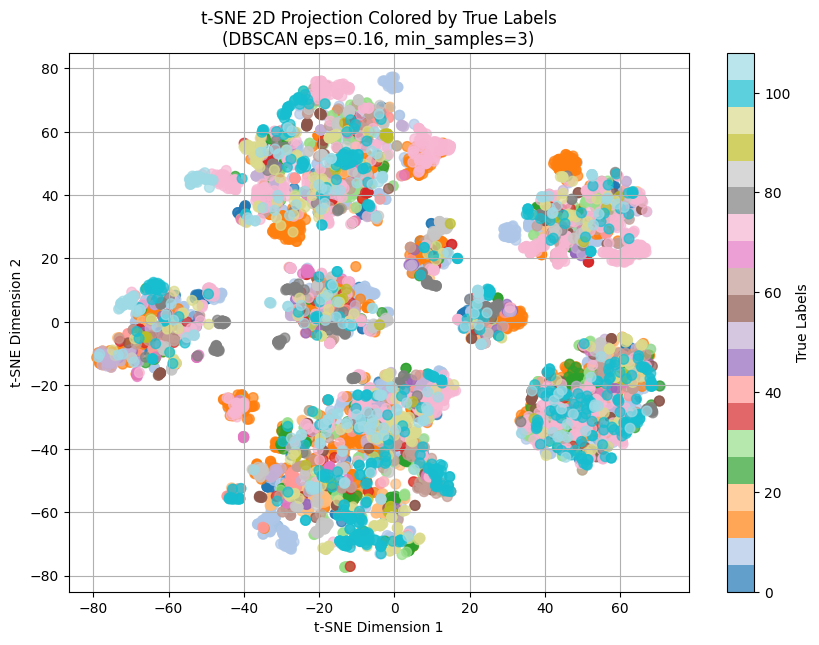

In [ ]:
#@title Visualisation
from sklearn.cluster import DBSCAN
from sklearn.manifold import TSNE
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

true_labels = evaluation_df['event_label'].values  # Use evaluation labels
best_params_eps=0.16
best_params_min_samples=3

# Run DBSCAN with best params on evaluation embeddings
best_dbscan = DBSCAN(eps=best_params_eps, min_samples=int(best_params_min_samples), metric='cosine')
best_cluster_labels = best_dbscan.fit_predict(evaluation_embeddings)

# t-SNE dimensionality reduction to 2D on evaluation embeddings
tsne = TSNE(n_components=2, random_state=42, init='pca')
reduced_embeddings = tsne.fit_transform(evaluation_embeddings)

# Plotting
plt.figure(figsize=(10, 7))
scatter = plt.scatter(
    reduced_embeddings[:, 0], reduced_embeddings[:, 1],
    c=true_labels, cmap='tab20', alpha=0.7, s=50
)
plt.colorbar(scatter, label='True Labels')
plt.title(f"t-SNE 2D Projection Colored by True Labels\n(DBSCAN eps={best_params_eps:.2f}, min_samples={int(best_params_min_samples)})")
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.grid(True)
plt.show()


## DBSCAN, With ARABERT Embedding + Named Entities + Hashtags


In [ ]:
# @title Install  Arabert
# from bertopic import BERTopic
from sentence_transformers import SentenceTransformer

# Use Arabic sentence transformer model
embedding_model = SentenceTransformer("aubmindlab/bert-base-arabertv2")

# Create and fit BERTopic model
# topic_model = BERTopic(embedding_model=embedding_model, language="arabic")



config.json:   0%|          | 0.00/384 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/543M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

In [ ]:
#@title Embedding the Tweets
# Imports
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from sklearn.decomposition import PCA
import pandas as pd
import numpy as np
from tqdm import tqdm

# tweets = df['Tweet Text'].tolist()
# embeddings = embedding_model.encode(tweets, show_progress_bar=True)


Batches:   0%|          | 0/219 [00:00<?, ?it/s]

In [ ]:
##@title 📦 Install CAMeL Tools for Arabic Verb Extraction
#!pip install camel-tools --quiet

#@title 🔤 Normalize + Stem Arabic Tokens Before Embedding
import re
from tqdm import tqdm
import numpy as np

# You can try to install Farasa segmenter if you want better stemming
try:
    from farasa.segmenter import FarasaSegmenter
    farasa = FarasaSegmenter(interactive=True)
except ImportError:
    farasa = None
    print("FarasaSegmenter not installed, using fallback stemmer")

# === Step 1: Normalization ===
def normalize_arabic(text):
    text = re.sub(r'[\u064B-\u065F]', '', text)  # remove diacritics
    text = re.sub(r'[إأآا]', 'ا', text)
    text = re.sub(r'ى', 'ي', text)
    text = re.sub(r'ؤ', 'و', text)
    text = re.sub(r'ئ', 'ي', text)
    text = re.sub(r'ة', 'ه', text)
    text = re.sub(r'[^\w\s]', '', text)  # remove punctuation
    return text.strip()

# === Step 2: Stem/Lemmatize Token ===
def stem_token(token):
    if farasa:
        # Farasa returns segmented tokens separated by '+', take first segment as stem
        segmented = farasa.segment(token)
        stem = segmented.split('+')[0]
        return stem
    else:
        # Fallback: simple light stemmer removing common suffixes (very crude)
        suffixes = ['ات', 'ون', 'ين', 'ة', 'ه', 'ي', 'ك', 'ت', 'ا']
        for suf in suffixes:
            if token.endswith(suf) and len(token) > len(suf) + 2:
                return token[:-len(suf)]
        return token

# === Step 3: Normalize + Stem Tokens ===
def normalize_and_stem_tokens(tokens):
    norm_stems = []
    for token in tokens:
        if isinstance(token, str):
            normalized = normalize_arabic(token)
            stemmed = stem_token(normalized)
            norm_stems.append(stemmed)
    return norm_stems

# === Helper for Embedding ===
def embed_and_average_cleaned(token_lists):
    results = []
    for tokens in tqdm(token_lists, desc="Embedding (norm+stem) tokens"):
        cleaned_tokens = normalize_and_stem_tokens(tokens)
        if not cleaned_tokens:
            results.append(np.zeros(768))
        else:
            embeddings = embedding_model.encode(cleaned_tokens)
            avg_embedding = np.mean(embeddings, axis=0)
            results.append(avg_embedding)
    return np.vstack(results)

# === Parse List Columns if Stringified ===
for col in ['Named Entities', 'Hashtags', 'PER', 'ORG', 'LOC']:
    if isinstance(df[col].iloc[0], str):
        df[col] = df[col].apply(eval)

# === Embed normalized + stemmed tokens ===
hashtag_embeddings = embed_and_average_cleaned(df['Hashtags'])
org_entity_embeddings = embed_and_average_cleaned(df['ORG'])
loc_entity_embeddings = embed_and_average_cleaned(df['LOC'])
per_entity_embeddings = embed_and_average_cleaned(df['PER'])
## @title Embedding the Named Entities
# # import ast
# # import re



# # # Preview
# # df['hashtags'].head()
# # Helper to embed list of tokens (e.g., hashtags or named entities)
# # Convert stringifNied lists to Python lists (e.g. ["flood", "storm"] → ['flood', 'storm'])
# if isinstance(df['Named Entities'].iloc[0], str):
#     df['Named Entities'] = df['Named Entities'].apply(eval)

# if isinstance(df['Hashtags'].iloc[0], str):
#     df['Hashtags'] = df['Hashtags'].apply(eval)

# if isinstance(df['PER'].iloc[0], str):
#     df['PER'] = df['PER'].apply(eval)

# if isinstance(df['ORG'].iloc[0], str):
#     df['ORG'] = df['ORG'].apply(eval)

# if isinstance(df['LOC'].iloc[0], str):
#     df['LOC'] = df['LOC'].apply(eval)

# def embed_and_average(token_lists):
#     results = []
#     for tokens in tqdm(token_lists, desc="Embedding token lists"):
#         if not tokens:
#             results.append(np.zeros(768))  # Return zero-vector for empty input
#         else:
#             token_embeds = embedding_model.encode(tokens)
#             avg_embedding = np.mean(token_embeds, axis=0)
#             results.append(avg_embedding)
#     return np.vstack(results)

# # Embed both columns
# # named_entity_embeddings = embed_and_average(df['Named Entities'])
# hashtag_embeddings = embed_and_average(df['Hashtags'])

# org_entity_embeddings = embed_and_average(df['ORG'])
# loc_entity_embeddings = embed_and_average(df['LOC'])
# per_entity_embeddings = embed_and_average(df['PER'])



FarasaSegmenter not installed, using fallback stemmer


Embedding (norm+stem) tokens: 100%|██████████| 6998/6998 [00:47<00:00, 146.06it/s]


In [ ]:

#@title  PCA Reduction to 32D
from sklearn.decomposition import PCA
pca_ne = PCA(n_components=32)
pca_hs = PCA(n_components=32)
pca_org=  PCA(n_components=32)
pca_per=  PCA(n_components=32)
pca_loc=  PCA(n_components=32)

# ne_embeddings_32d = pca_ne.fit_transform(named_entity_embeddings)
hs_embeddings_32d = pca_hs.fit_transform(hashtag_embeddings)
per_embeddings_32d = pca_per.fit_transform(per_entity_embeddings)
org_embeddings_32d = pca_org.fit_transform(org_entity_embeddings)
loc_embeddings_32d = pca_loc.fit_transform(loc_entity_embeddings)

/usr/local/lib/python3.11/dist-packages/sklearn/decomposition/_pca.py:789: RuntimeWarning: invalid value encountered in divide
  self.explained_variance_ratio_ = self.explained_variance_ / total_var


In [ ]:
#@title Save the Embedding
# Convert embeddings to a regular list
# df['arabert_embeddings'] = embeddings.tolist()
# Save back to the DataFrame
# df['named_entities_embedding_32d'] = ne_embeddings_32d.tolist()
df['hashtags_embedding_32d'] = hs_embeddings_32d.tolist()

df['per_embeddings_32d'] = per_embeddings_32d.tolist()
df['org_embeddings_32d'] = org_embeddings_32d.tolist()
df['loc_embeddings_32d'] = loc_embeddings_32d.tolist()

# # Convert to DataFrame
# embedding_df = pd.DataFrame(embeddings)

# # Save
# embedding_df.to_csv("tweet_embeddings.csv", index=False)


In [ ]:
#  @title Load the embedding for the tuning and evaluation df
import numpy as np

# Convert and concatenate for tuning set
tuning_tweet_emb = np.vstack(tuning_df['arabert_embeddings'].apply(np.array).values)
# tuning_ne_emb = np.vstack(tuning_df['named_entities_embedding_32d'].apply(np.array).values)
tuning_hs_emb = np.vstack(tuning_df['hashtags_embedding_32d'].apply(np.array).values)

tuning_per_emb = np.vstack(tuning_df['per_embeddings_32d'].apply(np.array).values)
tuning_org_emb = np.vstack(tuning_df['org_embeddings_32d'].apply(np.array).values)
tuning_loc_emb = np.vstack(tuning_df['loc_embeddings_32d'].apply(np.array).values)

# Final concatenated embedding: 768 + 32 + 32 = 832 dimensions
# tuning_embeddings = np.hstack([tuning_tweet_emb, tuning_ne_emb]) # , tuning_hs_emb
tuning_embeddings = np.hstack([tuning_tweet_emb, tuning_per_emb,tuning_org_emb,tuning_loc_emb,tuning_hs_emb]) # , tuning_hs_emb

# Convert and concatenate for evaluation set
evaluation_tweet_emb = np.vstack(evaluation_df['arabert_embeddings'].apply(np.array).values)
# evaluation_ne_emb = np.vstack(evaluation_df['named_entities_embedding_32d'].apply(np.array).values)
evaluation_hs_emb = np.vstack(evaluation_df['hashtags_embedding_32d'].apply(np.array).values)

evaluation_per_emb = np.vstack(evaluation_df['per_embeddings_32d'].apply(np.array).values)
evaluation_org_emb = np.vstack(evaluation_df['org_embeddings_32d'].apply(np.array).values)
evaluation_loc_emb = np.vstack(evaluation_df['loc_embeddings_32d'].apply(np.array).values)

# evaluation_embeddings = np.hstack([evaluation_tweet_emb, evaluation_ne_emb]) # , evaluation_hs_emb

evaluation_embeddings = np.hstack([evaluation_tweet_emb, evaluation_per_emb, evaluation_org_emb, evaluation_loc_emb,evaluation_hs_emb ]) # , evalu
# Check shapes
print(f"Tuning embeddings shape: {tuning_embeddings.shape}")
print(f"Evaluation embeddings shape: {evaluation_embeddings.shape}")


Tuning embeddings shape: (934, 896)
Evaluation embeddings shape: (6064, 896)


In [ ]:

#@title Define range of DBSCAN parameters to tune
# eps_values = np.arange(0.02, 0.20, 0.01)        # Distance threshold
eps_values = np.arange(0.10, 0.15, 0.01)        # Distance threshold
min_samples_values = np.arange(3,8,1)         # Minimum samples in neighborhood
dim_values = [32, 64, 96, 128, 160, 192, 256, 320, 384, 448, 512, 640, 768,832,896]
best_score = -1
best_params = None


In [ ]:
#@title Analyze the Effect of DBSCAN's epsilon Parameter on Clustering Results
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results_tuning = []
results_eval = []

# Tune over eps
for eps in eps_values:
    for min_samples in min_samples_values:
        # --- Tuning ---
        dbscan_tuning = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

        if len(set(cluster_labels_tuning)) > 1 and (cluster_labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, cluster_labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- Evaluation ---
        dbscan_eval = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_eval = dbscan_eval.fit_predict(evaluation_embeddings)

        if len(set(cluster_labels_eval)) > 1 and (cluster_labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, cluster_labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# Aggregate over min_samples
agg_tuning = df_tuning.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval = df_eval.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()



Best eps based on NMI (Tuning Set): eps = 0.15, NMI = 0.2687


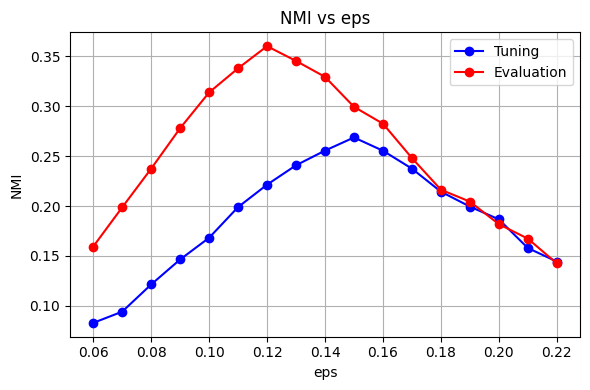

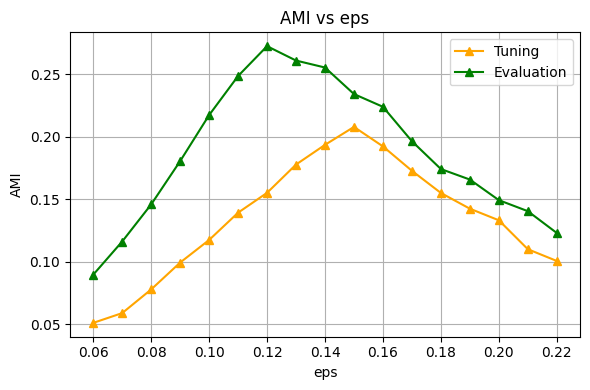

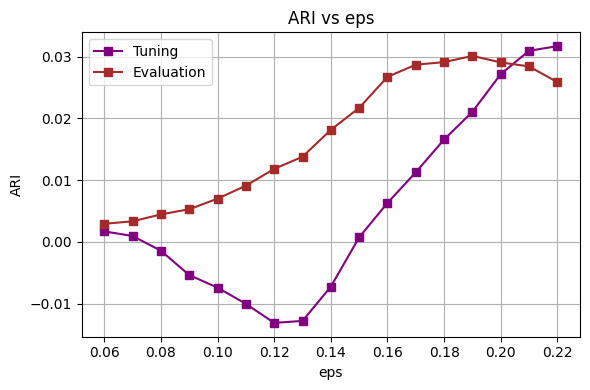

In [ ]:
#@title the Effect of DBSCAN's epsilon Parameter on Clustering Result

# Print best eps based on NMI from tuning set
best_eps_row = agg_tuning.loc[agg_tuning['nmi'].idxmax()]
print(f"Best eps based on NMI (Tuning Set): eps = {best_eps_row['eps']:.2f}, NMI = {best_eps_row['nmi']:.4f}")

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs eps')
plt.xlabel('eps')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ami'], marker='^', color='orange', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs eps')
plt.xlabel('eps')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ari'], marker='s', color='purple', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs eps')
plt.xlabel('eps')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Analyze the Effect of DBSCAN's Min Samples   Parameter on Clustering Result

true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results_tuning = []
results_eval = []

# Iterate over eps and min_samples combinations
for eps in eps_values:
    for min_samples in min_samples_values:
        # --- Tuning ---
        dbscan_tuning = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

        if len(set(cluster_labels_tuning)) > 1 and (cluster_labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, cluster_labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- Evaluation ---
        dbscan_eval = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_eval = dbscan_eval.fit_predict(evaluation_embeddings)

        if len(set(cluster_labels_eval)) > 1 and (cluster_labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, cluster_labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# === Aggregate over eps to study the effect of min_samples ===
agg_tuning_min = df_tuning.groupby('min_samples')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval_min = df_eval.groupby('min_samples')[['nmi', 'ari', 'ami']].mean().reset_index()



Best min_samples based on NMI (Tuning Set): min_samples = 3, NMI = 0.2722


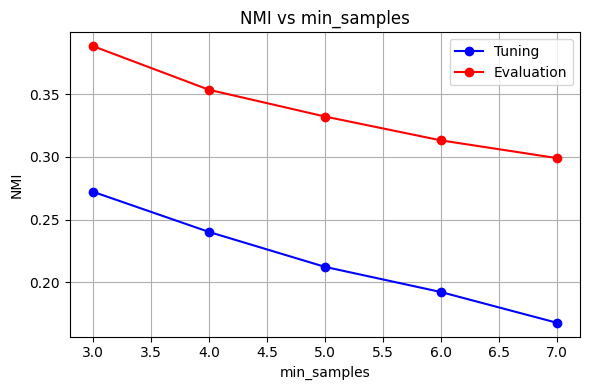

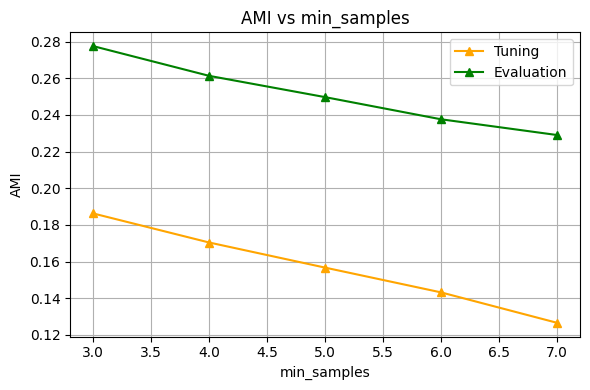

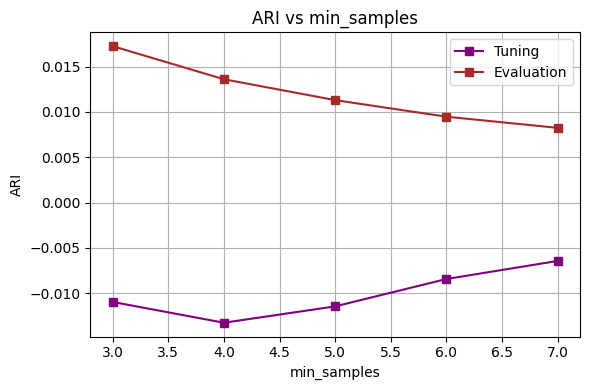

In [ ]:
#@title Analyze the Effect of DBSCAN's Min Samples   Parameter on Clustering Result

# Print best min_samples based on NMI from tuning set
best_minsample_row = agg_tuning_min.loc[agg_tuning_min['nmi'].idxmax()]
print(f"Best min_samples based on NMI (Tuning Set): min_samples = {int(best_minsample_row['min_samples'])}, NMI = {best_minsample_row['nmi']:.4f}")

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['ami'], marker='^', color='orange', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['ari'], marker='s', color='purple', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Analyze the Effect of PCA Dimensionality Reduction on DBSCAN Clustering Result

from sklearn.decomposition import PCA
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score
from sklearn.cluster import DBSCAN

# --- Settings ---

# dim_values = [32, 64, 96, 128, 160, 192, 256, 320, 384, 448, 512, 640, 768]
eps_best = 0.11
min_samples_best = 3

# True labels
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

dim_results = []

for dim in dim_values:
    # Reduce embeddings
    pca = PCA(n_components=dim)
    reduced_tuning = pca.fit_transform(tuning_embeddings)
    reduced_eval = pca.transform(evaluation_embeddings)

    # --- Tuning clustering ---
    dbscan_tuning = DBSCAN(eps=eps_best, min_samples=min_samples_best, metric='cosine')
    cluster_tuning = dbscan_tuning.fit_predict(reduced_tuning)

    if len(set(cluster_tuning)) > 1 and (cluster_tuning != -1).any():
        nmi = normalized_mutual_info_score(true_labels_tuning, cluster_tuning)
        ari = adjusted_rand_score(true_labels_tuning, cluster_tuning)
        ami = adjusted_mutual_info_score(true_labels_tuning, cluster_tuning)
    else:
        nmi = ari = ami = 0

    # --- Eval clustering ---
    dbscan_eval = DBSCAN(eps=eps_best, min_samples=min_samples_best, metric='cosine')
    cluster_eval = dbscan_eval.fit_predict(reduced_eval)

    if len(set(cluster_eval)) > 1 and (cluster_eval != -1).any():
        nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_eval)
        ari_e = adjusted_rand_score(true_labels_eval, cluster_eval)
        ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_eval)
    else:
        nmi_e = ari_e = ami_e = 0

    dim_results.append({
        'dim': dim,
        'nmi_tuning': nmi,
        'ari_tuning': ari,
        'ami_tuning': ami,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

# Convert to DataFrame
dim_df = pd.DataFrame(dim_results)


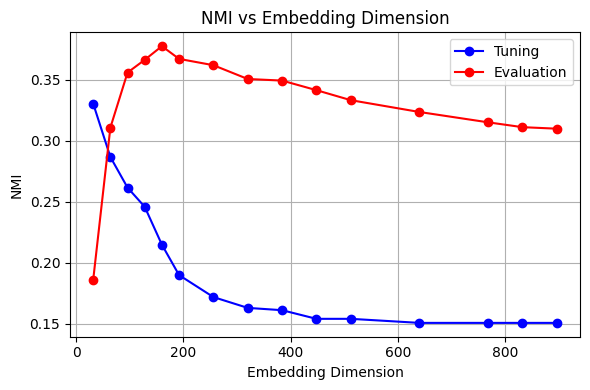

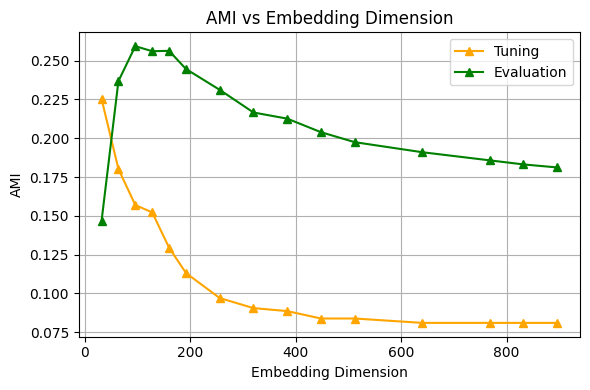

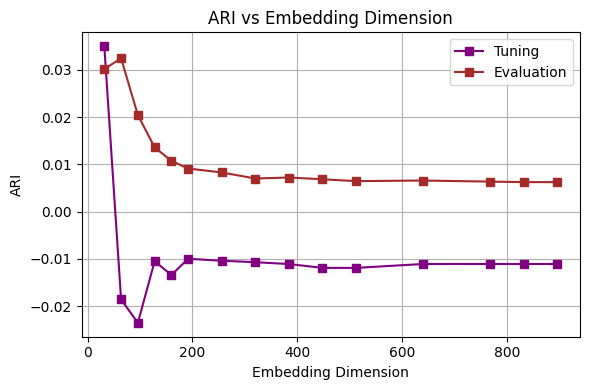

In [ ]:
#@title the Effect of PCA Dimensionality Reduction on DBSCAN Clustering Performance

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['nmi_tuning'], marker='o', label='Tuning', color='blue')
plt.plot(dim_df['dim'], dim_df['nmi_eval'], marker='o', label='Evaluation', color='red')
plt.title('NMI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['ami_tuning'], marker='^', label='Tuning', color='orange')
plt.plot(dim_df['dim'], dim_df['ami_eval'], marker='^', label='Evaluation', color='green')
plt.title('AMI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['ari_tuning'], marker='s', label='Tuning', color='purple')
plt.plot(dim_df['dim'], dim_df['ari_eval'], marker='s', label='Evaluation', color='brown')
plt.title('ARI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:

#@title Grid search on tuning set
from sklearn.decomposition import PCA
from umap import UMAP
from sklearn.cluster import DBSCAN
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

# Parameters for grid search
reducers = {
    'PCA': PCA,
    'UMAP': UMAP
}

true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results = []

# Grid search on tuning set
for reducer_name, reducer_cls in reducers.items():
    for dim in dim_values:
        print(f"Reducing tuning data to {dim}D using {reducer_name}...")
        reducer = reducer_cls(n_components=dim, random_state=42)
        reduced_tuning = reducer.fit_transform(tuning_embeddings)

        for eps in eps_values:
            for min_samples in min_samples_values:
                dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
                cluster_labels = dbscan.fit_predict(reduced_tuning)

                if len(set(cluster_labels)) > 1 and (cluster_labels != -1).any():
                    nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels)
                    ari = adjusted_rand_score(true_labels_tuning, cluster_labels)
                    ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels)
                else:
                    nmi = ari = ami = 0

                results.append({
                    'reducer': reducer_name,
                    'dim': dim,
                    'eps': eps,
                    'min_samples': min_samples,
                    'nmi': nmi,
                    'ari': ari,
                    'ami': ami,
                    'reduced_tuning': reduced_tuning
                })

results_df = pd.DataFrame(results)


Reducing tuning data to 32D using PCA...
Reducing tuning data to 64D using PCA...
Reducing tuning data to 96D using PCA...
Reducing tuning data to 128D using PCA...
Reducing tuning data to 160D using PCA...
Reducing tuning data to 192D using PCA...
Reducing tuning data to 256D using PCA...
Reducing tuning data to 320D using PCA...
Reducing tuning data to 384D using PCA...
Reducing tuning data to 448D using PCA...
Reducing tuning data to 512D using PCA...
Reducing tuning data to 640D using PCA...
Reducing tuning data to 768D using PCA...
Reducing tuning data to 832D using PCA...
Reducing tuning data to 896D using PCA...
Reducing tuning data to 32D using UMAP...
Reducing tuning data to 64D using UMAP...
Reducing tuning data to 96D using UMAP...
Reducing tuning data to 128D using UMAP...
Reducing tuning data to 160D using UMAP...
Reducing tuning data to 192D using UMAP...
Reducing tuning data to 256D using UMAP...
Reducing tuning data to 320D using UMAP...
Reducing tuning data to 384D usi

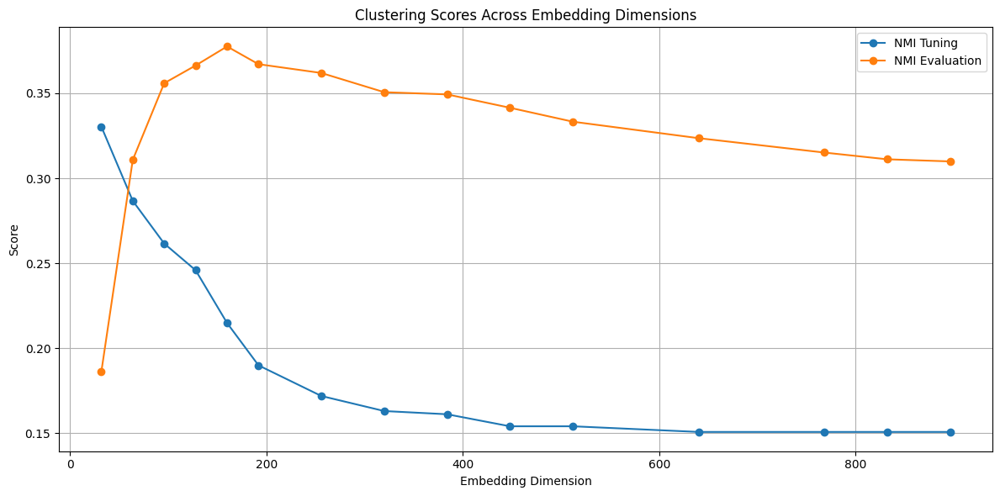

In [ ]:
#@title Nmi vs  Dim
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Plot NMI
plt.plot(dim_df['dim'], dim_df['nmi_tuning'], label='NMI Tuning', marker='o')
plt.plot(dim_df['dim'], dim_df['nmi_eval'], label='NMI Evaluation', marker='o')

# # Plot ARI
# plt.plot(dim_df['dim'], dim_df['ari_tuning'], label='ARI Tuning', marker='s')
# plt.plot(dim_df['dim'], dim_df['ari_eval'], label='ARI Evaluation', marker='s')

# # Plot AMI
# plt.plot(dim_df['dim'], dim_df['ami_tuning'], label='AMI Tuning', marker='^')
# plt.plot(dim_df['dim'], dim_df['ami_eval'], label='AMI Evaluation', marker='^')

plt.title('Clustering Scores Across Embedding Dimensions')
plt.xlabel('Embedding Dimension')
plt.ylabel('Score')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Best Params
# Get best tuning config by NMI
best_config = results_df.loc[results_df['nmi'].idxmax()]
print("Best NMI config on tuning set:")
print(best_config[['reducer', 'dim', 'eps', 'min_samples', 'nmi', 'ari', 'ami']])

# Using best config, transform evaluation embeddings and evaluate clustering
best_reducer_cls = reducers[best_config['reducer']]
best_dim = best_config['dim']
best_eps = best_config['eps']
best_min_samples = best_config['min_samples']

reducer = best_reducer_cls(n_components=best_dim, random_state=42)
reduced_tuning_best = reducer.fit_transform(tuning_embeddings)
reduced_eval_best = reducer.transform(evaluation_embeddings)

dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

cluster_labels_tuning = dbscan.fit_predict(reduced_tuning_best)
cluster_labels_eval = dbscan.fit_predict(reduced_eval_best)

def safe_scores(true, pred):
    if len(set(pred)) > 1 and (pred != -1).any():
        nmi = normalized_mutual_info_score(true, pred)
        ari = adjusted_rand_score(true, pred)
        ami = adjusted_mutual_info_score(true, pred)
    else:
        nmi = ari = ami = 0
    return nmi, ari, ami

nmi_tuning, ari_tuning, ami_tuning = safe_scores(true_labels_tuning, cluster_labels_tuning)
nmi_eval, ari_eval, ami_eval = safe_scores(true_labels_eval, cluster_labels_eval)

print("\nEvaluation metrics with best tuning config:")
print(f"NMI: {nmi_eval:.4f}, ARI: {ari_eval:.4f}, AMI: {ami_eval:.4f}")

# Summarize metrics for each dimension using best eps and min_samples
dim_metrics = []



Best NMI config on tuning set:
reducer             PCA
dim                  64
eps                0.13
min_samples           3
nmi            0.336447
ari            0.009929
ami            0.231695
Name: 40, dtype: object

Evaluation metrics with best tuning config:
NMI: 0.2680, ARI: 0.0386, AMI: 0.2085


In [ ]:
#@title Summarize clustering scores across embedding dimensions for best tuning hyperparameters

dim_metrics = []

for dim in dim_values:
    # Initialize reducer with the current dimension
    reducer = best_reducer_cls(n_components=dim, random_state=42)

    # Fit transform tuning embeddings and transform evaluation embeddings
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    # Initialize DBSCAN with best hyperparameters from tuning
    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    # Predict cluster labels on tuning and evaluation sets
    labels_tuning = dbscan.fit_predict(reduced_tuning)
    labels_eval = dbscan.fit_predict(reduced_eval)

    # Compute scores safely
    nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, labels_tuning)
    nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, labels_eval)

    # Append results
    dim_metrics.append({
        'dim': dim,
        'nmi_tuning': nmi_t,
        'ari_tuning': ari_t,
        'ami_tuning': ami_t,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

# Create DataFrame for easier visualization
dim_df = pd.DataFrame(dim_metrics)

print("\nSummary of clustering metrics across embedding dimensions:")
print(dim_df.to_string(index=False))



Summary of clustering metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval
  32    0.287202    0.049593    0.190262  0.150880  0.026243  0.127029
  64    0.336447    0.009929    0.231695  0.268008  0.038585  0.208495
  96    0.284086   -0.018384    0.183074  0.313884  0.031631  0.237882
 128    0.275130   -0.022552    0.170113  0.361251  0.025654  0.271377
 160    0.268843   -0.018586    0.163008  0.371175  0.019177  0.266210
 192    0.246619   -0.016690    0.148553  0.379391  0.014625  0.265253
 256    0.226657   -0.016992    0.140617  0.395204  0.011925  0.267502
 320    0.200186   -0.012873    0.124054  0.386715  0.011434  0.260397
 384    0.187037   -0.010365    0.115343  0.388823  0.010344  0.258613
 448    0.183556   -0.010595    0.112110  0.384135  0.009715  0.251332
 512    0.177309   -0.011687    0.105935  0.377686  0.009009  0.243747
 640    0.175408   -0.012132    0.103880  0.368862  0.008324  0.235895
 768    0.173974 

In [ ]:
#@title The Results of the Clustering
dim_metrics = []

for dim in dim_values:
    reducer = best_reducer_cls(n_components=dim, random_state=42)
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    print(f"Using eps = {best_eps}, min_samples = {best_min_samples} for dim = {dim}")

    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    labels_tuning = dbscan.fit_predict(reduced_tuning)
    labels_eval = dbscan.fit_predict(reduced_eval)

    nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, labels_tuning)
    nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, labels_eval)

    dim_metrics.append({
        'dim': dim,
        'nmi_tuning': nmi_t,
        'ari_tuning': ari_t,
        'ami_tuning': ami_t,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

dim_df = pd.DataFrame(dim_metrics)

print("\nSummary of metrics across embedding dimensions:")
print(dim_df.to_string(index=False))


Using eps = 0.13, min_samples = 3 for dim = 32
Using eps = 0.13, min_samples = 3 for dim = 64
Using eps = 0.13, min_samples = 3 for dim = 96
Using eps = 0.13, min_samples = 3 for dim = 128
Using eps = 0.13, min_samples = 3 for dim = 160
Using eps = 0.13, min_samples = 3 for dim = 192
Using eps = 0.13, min_samples = 3 for dim = 256
Using eps = 0.13, min_samples = 3 for dim = 320
Using eps = 0.13, min_samples = 3 for dim = 384
Using eps = 0.13, min_samples = 3 for dim = 448
Using eps = 0.13, min_samples = 3 for dim = 512
Using eps = 0.13, min_samples = 3 for dim = 640
Using eps = 0.13, min_samples = 3 for dim = 768
Using eps = 0.13, min_samples = 3 for dim = 832
Using eps = 0.13, min_samples = 3 for dim = 896

Summary of metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval
  32    0.287202    0.049593    0.190262  0.150880  0.026243  0.127029
  64    0.336447    0.009929    0.231695  0.268008  0.038585  0.208495
  96    0.284086   -0

In [ ]:
#@title Clustering and Topic Modeling Metrics Summary Across Embedding Dimensions
from sklearn.metrics import silhouette_score
from gensim.corpora import Dictionary
from gensim.models.coherencemodel import CoherenceModel

def safe_silhouette_score(X, labels):
    if len(set(labels)) > 1 and len(X) > len(set(labels)):
        return silhouette_score(X, labels, metric='cosine')
    return -1

def get_topic_coherence(texts, labels, coherence_type='c_v'):
    clustered_docs = {}
    for text, label in zip(texts, labels):
        if label == -1:
            continue
        clustered_docs.setdefault(label, []).append(text)

    topics = [docs for docs in clustered_docs.values() if len(docs) >= 3]

    if len(topics) == 0:
        return -1

    tokenized_topics = [[word for doc in topic for word in doc.split()] for topic in topics]

    dictionary = Dictionary(tokenized_topics)
    corpus = [dictionary.doc2bow(text) for text in tokenized_topics]

    coherence_model = CoherenceModel(
        topics=tokenized_topics,
        texts=tokenized_topics,
        corpus=corpus,
        dictionary=dictionary,
        coherence=coherence_type
    )

    return coherence_model.get_coherence()

# Ground truth number of events (true clusters)
true_events_tuning = len(set(tuning_df['event_label']))
true_events_eval = len(set(evaluation_df['event_label']))

# Initialize list for metrics
additional_metrics = []

for dim in dim_values:
    reducer = best_reducer_cls(n_components=dim, random_state=42)
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    # Tuning
    labels_tuning = dbscan.fit_predict(reduced_tuning)
    silhouette_t = safe_silhouette_score(reduced_tuning, labels_tuning)
    num_clusters_t = len(set(labels_tuning)) - (1 if -1 in labels_tuning else 0)
    coherence_t_cv = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='c_v')
    coherence_t_umass = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='u_mass')

    # Evaluation
    labels_eval = dbscan.fit_predict(reduced_eval)
    silhouette_e = safe_silhouette_score(reduced_eval, labels_eval)
    num_clusters_e = len(set(labels_eval)) - (1 if -1 in labels_eval else 0)
    coherence_e_cv = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='c_v')
    coherence_e_umass = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='u_mass')

    additional_metrics.append({
        'dim': dim,
        'true_events_tuning': true_events_tuning,
        'true_events_eval': true_events_eval,
        'silhouette_tuning': silhouette_t,
        'num_clusters_tuning': num_clusters_t,
        'coherence_tuning_c_v': coherence_t_cv,
        'coherence_tuning_u_mass': coherence_t_umass,
        'silhouette_eval': silhouette_e,
        'num_clusters_eval': num_clusters_e,
        'coherence_eval_c_v': coherence_e_cv,
        'coherence_eval_u_mass': coherence_e_umass
    })

# Merge with original dim_df
extra_df = pd.DataFrame(additional_metrics)
dim_df = pd.merge(dim_df, extra_df, on='dim')

# Display full summary
print("\nSummary of all clustering metrics across embedding dimensions:")
print(dim_df.to_string(index=False))



Summary of all clustering metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval  true_events_tuning  true_events_eval  silhouette_tuning  num_clusters_tuning  coherence_tuning_c_v  coherence_tuning_u_mass  silhouette_eval  num_clusters_eval  coherence_eval_c_v  coherence_eval_u_mass
  32    0.287202    0.049593    0.190262  0.150880  0.026243  0.127029                  31               103           0.065433                   38              0.657155                -0.751866         0.178622                 16            0.607605              -0.366980
  64    0.336447    0.009929    0.231695  0.268008  0.038585  0.208495                  31               103          -0.110499                   43              0.720908                -0.754685         0.012742                 87            0.607547              -0.819658
  96    0.284086   -0.018384    0.183074  0.313884  0.031631  0.237882                  31               103   

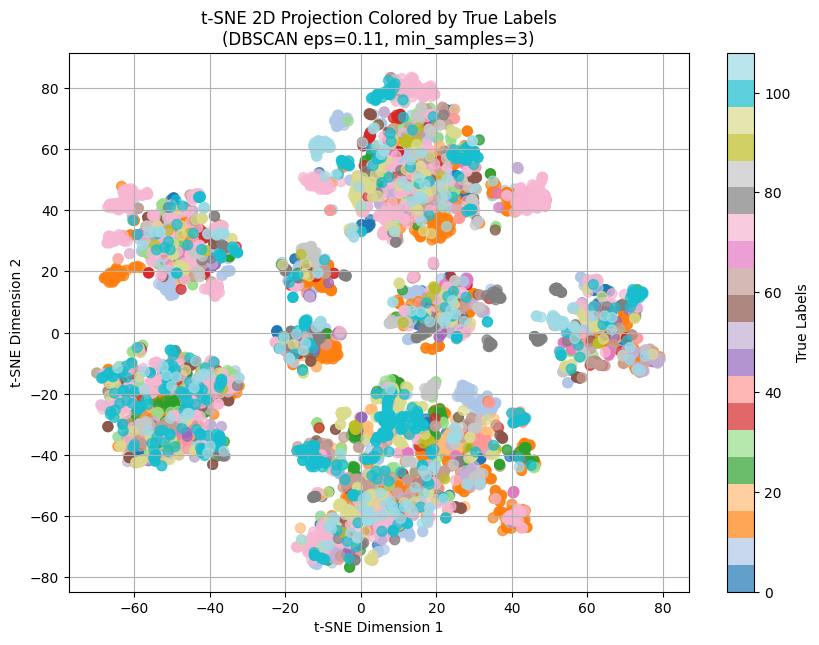

In [ ]:
#@title Visualisation
from sklearn.cluster import DBSCAN
from sklearn.manifold import TSNE
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

true_labels = evaluation_df['event_label'].values  # Use evaluation labels
best_params_eps=0.11
best_params_min_samples=3

# Run DBSCAN with best params on evaluation embeddings
best_dbscan = DBSCAN(eps=best_params_eps, min_samples=int(best_params_min_samples), metric='cosine')
best_cluster_labels = best_dbscan.fit_predict(evaluation_embeddings)

# t-SNE dimensionality reduction to 2D on evaluation embeddings
tsne = TSNE(n_components=2, random_state=42, init='pca')
reduced_embeddings = tsne.fit_transform(evaluation_embeddings)

# Plotting
plt.figure(figsize=(10, 7))
scatter = plt.scatter(
    reduced_embeddings[:, 0], reduced_embeddings[:, 1],
    c=true_labels, cmap='tab20', alpha=0.7, s=50
)
plt.colorbar(scatter, label='True Labels')
plt.title(f"t-SNE 2D Projection Colored by True Labels\n(DBSCAN eps={best_params_eps:.2f}, min_samples={int(best_params_min_samples)})")
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.grid(True)
plt.show()


## DBSCAN, With ARABERT Embedding + Named Entities + Hashtags + Verbs


In [13]:
# @title Install  Arabert
# from bertopic import BERTopic
from sentence_transformers import SentenceTransformer

# Use Arabic sentence transformer model
embedding_model = SentenceTransformer("aubmindlab/bert-base-arabertv2")

# Create and fit BERTopic model
# topic_model = BERTopic(embedding_model=embedding_model, language="arabic")



The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [16]:
#@title install stanza
!pip install stanza -q

import stanza
stanza.download('ar')

import stanza

# Load Arabic pipeline (POS, Tokenization, etc.)
nlp = stanza.Pipeline(lang='ar', processors='tokenize,pos', use_gpu=False)


INFO:stanza:Checking for updates to resources.json in case models have been updated.  Note: this behavior can be turned off with download_method=None or download_method=DownloadMethod.REUSE_RESOURCES


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Loading these models for language: ar (Arabic):
| Processor | Package     |
---------------------------
| tokenize  | padt        |
| mwt       | padt        |
| pos       | padt_charlm |

INFO:stanza:Using device: cpu
INFO:stanza:Loading: tokenize
INFO:stanza:Loading: mwt
INFO:stanza:Loading: pos
INFO:stanza:Done loading processors!


In [19]:
#@title preprocessing
import re
def extract_arabic_verbs(text):
    doc = nlp(text)
    verbs = []
    for sentence in doc.sentences:
        for word in sentence.words:
            if word.upos == 'VERB':
                verbs.append(word.lemma or word.text)
    return verbs

def normalize_arabic(word):
    word = re.sub(r'[\u064B-\u065F]', '', word)  # Remove diacritics
    word = re.sub(r'[إأآا]', 'ا', word)
    word = re.sub(r'ى', 'ي', word)
    word = re.sub(r'ؤ', 'و', word)
    word = re.sub(r'ئ', 'ي', word)
    word = re.sub(r'ة', 'ه', word)
    word = re.sub(r'[^\w\s]', '', word)  # Remove punctuation
    return word.strip()

def embed_verbs_from_texts(texts, embedding_model):
    embeddings = []

    for text in tqdm(texts, desc="Extracting and embedding verbs"):
        verbs = extract_arabic_verbs(text)
        verbs = [normalize_arabic(v) for v in verbs if v.strip()]

        if verbs:
            verb_vectors = embedding_model.encode(verbs)
            avg_vec = np.mean(verb_vectors, axis=0)
        else:
            avg_vec = np.zeros(768)

        embeddings.append(avg_vec)

    return np.vstack(embeddings)


In [ ]:
#@title Embedding the Tweets
# Imports
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from sklearn.decomposition import PCA
import pandas as pd
import numpy as np
from tqdm import tqdm

# tweets = df['Tweet Text'].tolist()
# embeddings = embedding_model.encode(tweets, show_progress_bar=True)


Batches:   0%|          | 0/219 [00:00<?, ?it/s]

In [20]:
##@title 📦 Install CAMeL Tools for Arabic Verb Extraction
#!pip install camel-tools --quiet

#@title 🔤 Normalize + Stem Arabic Tokens Before Embedding
import re
from tqdm import tqdm
import numpy as np

# You can try to install Farasa segmenter if you want better stemming
try:
    from farasa.segmenter import FarasaSegmenter
    farasa = FarasaSegmenter(interactive=True)
except ImportError:
    farasa = None
    print("FarasaSegmenter not installed, using fallback stemmer")

# === Step 1: Normalization ===
def normalize_arabic(text):
    text = re.sub(r'[\u064B-\u065F]', '', text)  # remove diacritics
    text = re.sub(r'[إأآا]', 'ا', text)
    text = re.sub(r'ى', 'ي', text)
    text = re.sub(r'ؤ', 'و', text)
    text = re.sub(r'ئ', 'ي', text)
    text = re.sub(r'ة', 'ه', text)
    text = re.sub(r'[^\w\s]', '', text)  # remove punctuation
    return text.strip()

# === Step 2: Stem/Lemmatize Token ===
def stem_token(token):
    if farasa:
        # Farasa returns segmented tokens separated by '+', take first segment as stem
        segmented = farasa.segment(token)
        stem = segmented.split('+')[0]
        return stem
    else:
        # Fallback: simple light stemmer removing common suffixes (very crude)
        suffixes = ['ات', 'ون', 'ين', 'ة', 'ه', 'ي', 'ك', 'ت', 'ا']
        for suf in suffixes:
            if token.endswith(suf) and len(token) > len(suf) + 2:
                return token[:-len(suf)]
        return token

# === Step 3: Normalize + Stem Tokens ===
def normalize_and_stem_tokens(tokens):
    norm_stems = []
    for token in tokens:
        if isinstance(token, str):
            normalized = normalize_arabic(token)
            stemmed = stem_token(normalized)
            norm_stems.append(stemmed)
    return norm_stems

# === Helper for Embedding ===
def embed_and_average_cleaned(token_lists):
    results = []
    for tokens in tqdm(token_lists, desc="Embedding (norm+stem) tokens"):
        cleaned_tokens = normalize_and_stem_tokens(tokens)
        if not cleaned_tokens:
            results.append(np.zeros(768))
        else:
            embeddings = embedding_model.encode(cleaned_tokens)
            avg_embedding = np.mean(embeddings, axis=0)
            results.append(avg_embedding)
    return np.vstack(results)

# === Parse List Columns if Stringified ===
for col in ['Named Entities', 'Hashtags', 'PER', 'ORG', 'LOC']:
    if isinstance(df[col].iloc[0], str):
        df[col] = df[col].apply(eval)

# === Embed normalized + stemmed tokens ===
hashtag_embeddings = embed_and_average_cleaned(df['Hashtags'])
org_entity_embeddings = embed_and_average_cleaned(df['ORG'])
loc_entity_embeddings = embed_and_average_cleaned(df['LOC'])
per_entity_embeddings = embed_and_average_cleaned(df['PER'])

# Extract and embed verbs
verb_embeddings = embed_verbs_from_texts(df['Tweet Text'], embedding_model)



FarasaSegmenter not installed, using fallback stemmer


Extracting and embedding verbs: 100%|██████████| 6998/6998 [40:41<00:00,  2.87it/s]


In [64]:

#@title  PCA Reduction to 32D
from sklearn.decomposition import PCA
pca_ne = PCA(n_components=32)
pca_hs = PCA(n_components=16)
pca_org=  PCA(n_components=16)
pca_per=  PCA(n_components=16)
pca_loc=  PCA(n_components=16)
pca_verb=  PCA(n_components=64)

# ne_embeddings_32d = pca_ne.fit_transform(named_entity_embeddings)
hs_embeddings_32d = pca_hs.fit_transform(hashtag_embeddings)
per_embeddings_32d = pca_per.fit_transform(per_entity_embeddings)
org_embeddings_32d = pca_org.fit_transform(org_entity_embeddings)
loc_embeddings_32d = pca_loc.fit_transform(loc_entity_embeddings)
verb_embeddings_32d = pca_verb.fit_transform(verb_embeddings)


/usr/local/lib/python3.11/dist-packages/sklearn/decomposition/_pca.py:789: RuntimeWarning: invalid value encountered in divide
  self.explained_variance_ratio_ = self.explained_variance_ / total_var


In [65]:
#@title Save the Embedding
# Convert embeddings to a regular list
# df['arabert_embeddings'] = embeddings.tolist()
# Save back to the DataFrame
# df['named_entities_embedding_32d'] = ne_embeddings_32d.tolist()
df['hashtags_embedding_32d'] = hs_embeddings_32d.tolist()

df['per_embeddings_32d'] = per_embeddings_32d.tolist()
df['org_embeddings_32d'] = org_embeddings_32d.tolist()
df['loc_embeddings_32d'] = loc_embeddings_32d.tolist()
df['verb_embeddings_32d'] = verb_embeddings_32d.tolist()

# # Convert to DataFrame
# embedding_df = pd.DataFrame(embeddings)

# # Save
# embedding_df.to_csv("tweet_embeddings.csv", index=False)


In [67]:
#  @title Load the embedding for the tuning and evaluation df
import numpy as np

# Convert and concatenate for tuning set
tuning_tweet_emb = np.vstack(tuning_df['arabert_embeddings'].apply(np.array).values)
# tuning_ne_emb = np.vstack(tuning_df['named_entities_embedding_32d'].apply(np.array).values)
tuning_hs_emb = np.vstack(tuning_df['hashtags_embedding_32d'].apply(np.array).values)

tuning_per_emb = np.vstack(tuning_df['per_embeddings_32d'].apply(np.array).values)
tuning_org_emb = np.vstack(tuning_df['org_embeddings_32d'].apply(np.array).values)
tuning_loc_emb = np.vstack(tuning_df['loc_embeddings_32d'].apply(np.array).values)
tuning_verb_emb = np.vstack(tuning_df['verb_embeddings_32d'].apply(np.array).values)

# Final concatenated embedding: 768 + 32 + 32 = 832 dimensions
# tuning_embeddings = np.hstack([tuning_tweet_emb, tuning_ne_emb]) # , tuning_hs_emb
tuning_embeddings = np.hstack([tuning_tweet_emb, tuning_per_emb,tuning_org_emb,tuning_loc_emb,tuning_hs_emb,tuning_verb_emb]) # , tuning_hs_emb

# Convert and concatenate for evaluation set
evaluation_tweet_emb = np.vstack(evaluation_df['arabert_embeddings'].apply(np.array).values)
# evaluation_ne_emb = np.vstack(evaluation_df['named_entities_embedding_32d'].apply(np.array).values)
evaluation_hs_emb = np.vstack(evaluation_df['hashtags_embedding_32d'].apply(np.array).values)

evaluation_per_emb = np.vstack(evaluation_df['per_embeddings_32d'].apply(np.array).values)
evaluation_org_emb = np.vstack(evaluation_df['org_embeddings_32d'].apply(np.array).values)
evaluation_loc_emb = np.vstack(evaluation_df['loc_embeddings_32d'].apply(np.array).values)
evaluation_verb_emb = np.vstack(evaluation_df['verb_embeddings_32d'].apply(np.array).values)

# evaluation_embeddings = np.hstack([evaluation_tweet_emb, evaluation_ne_emb]) # , evaluation_hs_emb

evaluation_embeddings = np.hstack([evaluation_tweet_emb, evaluation_per_emb, evaluation_org_emb, evaluation_loc_emb,evaluation_hs_emb,evaluation_verb_emb ]) # , evalu
# Check shapes
print(f"Tuning embeddings shape: {tuning_embeddings.shape}")
print(f"Evaluation embeddings shape: {evaluation_embeddings.shape}")


Tuning embeddings shape: (934, 896)
Evaluation embeddings shape: (6064, 896)


In [ ]:

#@title Define range of DBSCAN parameters to tune
# eps_values = np.arange(0.02, 0.20, 0.01)        # Distance threshold
eps_values = np.arange(0.09, 0.17, 0.01)        # Distance threshold
min_samples_values = np.arange(3,8,1)         # Minimum samples in neighborhood
dim_values = [32, 64, 96, 128, 160, 192, 256, 320, 384, 448, 512, 640, 768,832,864,928]
best_score = -1
best_params = None


In [ ]:
#@title Analyze the Effect of DBSCAN's epsilon Parameter on Clustering Results
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results_tuning = []
results_eval = []

# Tune over eps
for eps in eps_values:
    for min_samples in min_samples_values:
        # --- Tuning ---
        dbscan_tuning = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

        if len(set(cluster_labels_tuning)) > 1 and (cluster_labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, cluster_labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- Evaluation ---
        dbscan_eval = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_eval = dbscan_eval.fit_predict(evaluation_embeddings)

        if len(set(cluster_labels_eval)) > 1 and (cluster_labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, cluster_labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# Aggregate over min_samples
agg_tuning = df_tuning.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval = df_eval.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()



Best eps based on NMI (Tuning Set): eps = 0.19, NMI = 0.2286


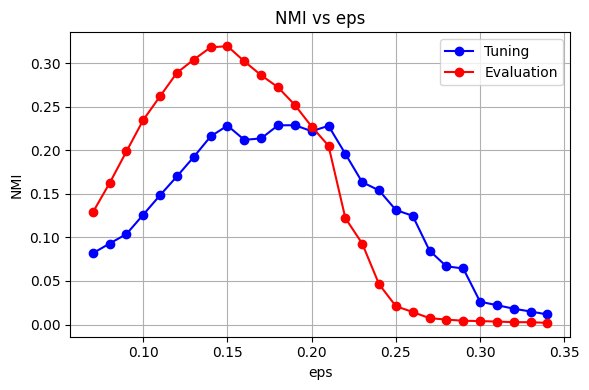

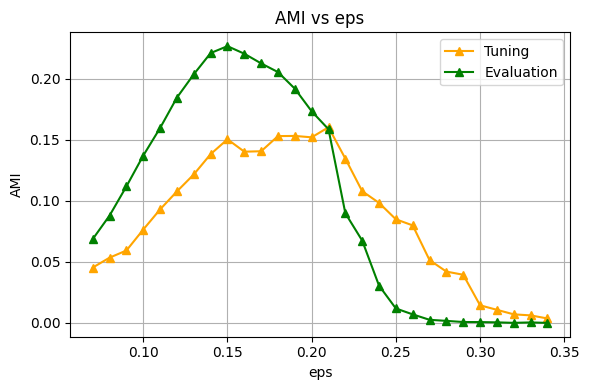

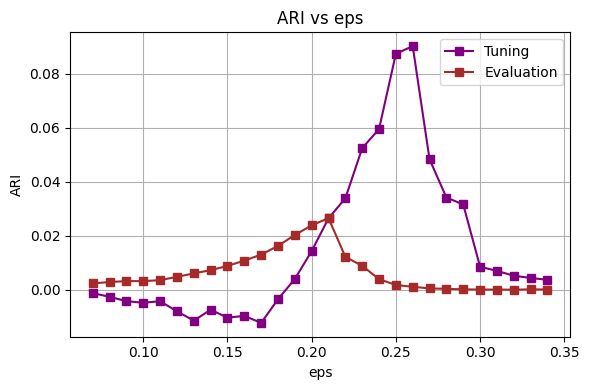

In [ ]:
#@title the Effect of DBSCAN's epsilon Parameter on Clustering Result

# Print best eps based on NMI from tuning set
best_eps_row = agg_tuning.loc[agg_tuning['nmi'].idxmax()]
print(f"Best eps based on NMI (Tuning Set): eps = {best_eps_row['eps']:.2f}, NMI = {best_eps_row['nmi']:.4f}")

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs eps')
plt.xlabel('eps')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ami'], marker='^', color='orange', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs eps')
plt.xlabel('eps')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ari'], marker='s', color='purple', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs eps')
plt.xlabel('eps')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Analyze the Effect of DBSCAN's Min Samples   Parameter on Clustering Result

true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results_tuning = []
results_eval = []

# Iterate over eps and min_samples combinations
for eps in eps_values:
    for min_samples in min_samples_values:
        # --- Tuning ---
        dbscan_tuning = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

        if len(set(cluster_labels_tuning)) > 1 and (cluster_labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, cluster_labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- Evaluation ---
        dbscan_eval = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_eval = dbscan_eval.fit_predict(evaluation_embeddings)

        if len(set(cluster_labels_eval)) > 1 and (cluster_labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, cluster_labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# === Aggregate over eps to study the effect of min_samples ===
agg_tuning_min = df_tuning.groupby('min_samples')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval_min = df_eval.groupby('min_samples')[['nmi', 'ari', 'ami']].mean().reset_index()



Best min_samples based on NMI (Tuning Set): min_samples = 3, NMI = 0.2373


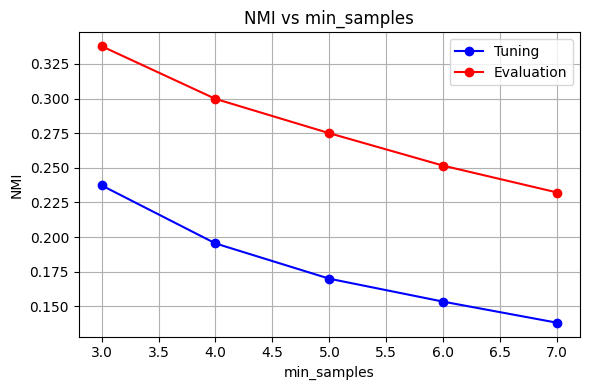

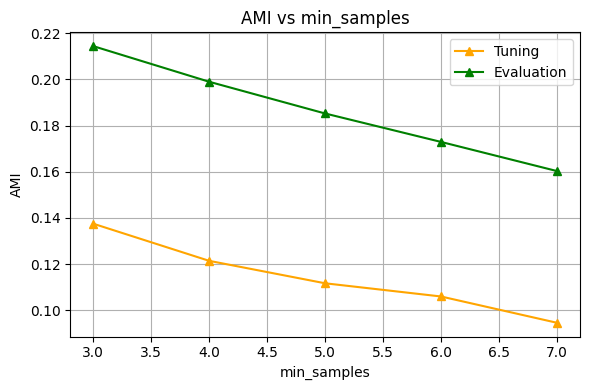

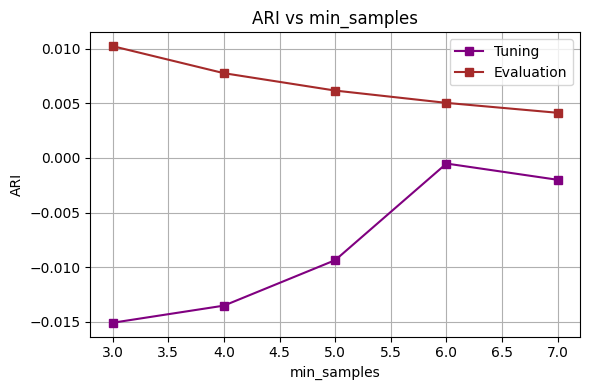

In [ ]:
#@title Analyze the Effect of DBSCAN's Min Samples   Parameter on Clustering Result

# Print best min_samples based on NMI from tuning set
best_minsample_row = agg_tuning_min.loc[agg_tuning_min['nmi'].idxmax()]
print(f"Best min_samples based on NMI (Tuning Set): min_samples = {int(best_minsample_row['min_samples'])}, NMI = {best_minsample_row['nmi']:.4f}")

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['ami'], marker='^', color='orange', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['ari'], marker='s', color='purple', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Analyze the Effect of PCA Dimensionality Reduction on DBSCAN Clustering Result

from sklearn.decomposition import PCA
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score
from sklearn.cluster import DBSCAN

# --- Settings ---

# dim_values = [32, 64, 96, 128, 160, 192, 256, 320, 384, 448, 512, 640, 768]
eps_best = 0.15
min_samples_best = 3

# True labels
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

dim_results = []

for dim in dim_values:
    # Reduce embeddings
    pca = PCA(n_components=dim)
    reduced_tuning = pca.fit_transform(tuning_embeddings)
    reduced_eval = pca.transform(evaluation_embeddings)

    # --- Tuning clustering ---
    dbscan_tuning = DBSCAN(eps=eps_best, min_samples=min_samples_best, metric='cosine')
    cluster_tuning = dbscan_tuning.fit_predict(reduced_tuning)

    if len(set(cluster_tuning)) > 1 and (cluster_tuning != -1).any():
        nmi = normalized_mutual_info_score(true_labels_tuning, cluster_tuning)
        ari = adjusted_rand_score(true_labels_tuning, cluster_tuning)
        ami = adjusted_mutual_info_score(true_labels_tuning, cluster_tuning)
    else:
        nmi = ari = ami = 0

    # --- Eval clustering ---
    dbscan_eval = DBSCAN(eps=eps_best, min_samples=min_samples_best, metric='cosine')
    cluster_eval = dbscan_eval.fit_predict(reduced_eval)

    if len(set(cluster_eval)) > 1 and (cluster_eval != -1).any():
        nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_eval)
        ari_e = adjusted_rand_score(true_labels_eval, cluster_eval)
        ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_eval)
    else:
        nmi_e = ari_e = ami_e = 0

    dim_results.append({
        'dim': dim,
        'nmi_tuning': nmi,
        'ari_tuning': ari,
        'ami_tuning': ami,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

# Convert to DataFrame
dim_df = pd.DataFrame(dim_results)


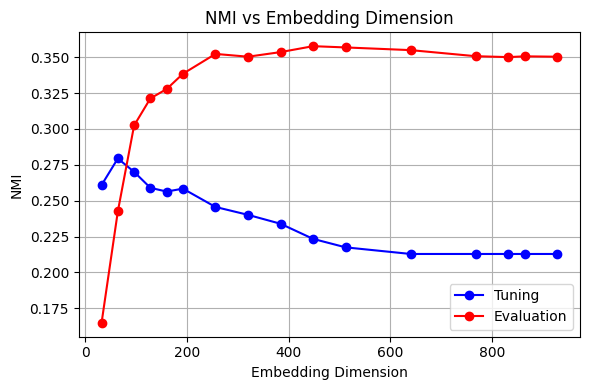

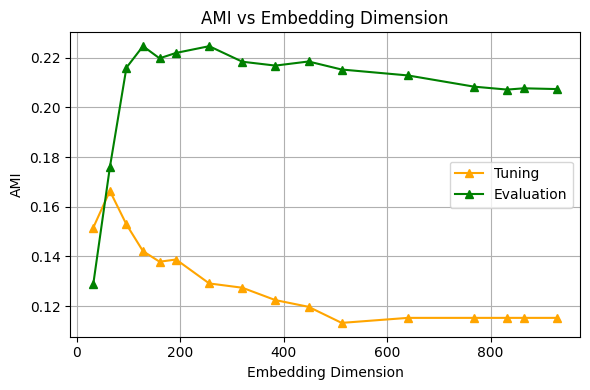

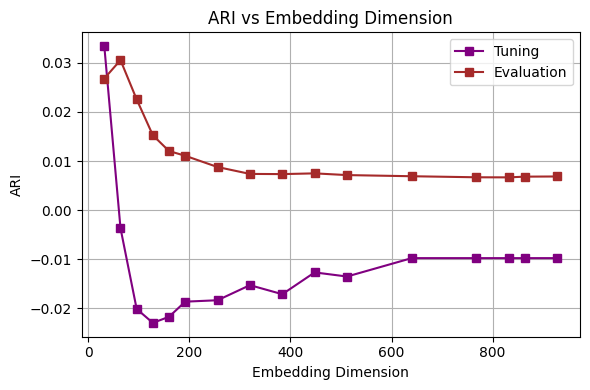

In [ ]:
#@title the Effect of PCA Dimensionality Reduction on DBSCAN Clustering Performance

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['nmi_tuning'], marker='o', label='Tuning', color='blue')
plt.plot(dim_df['dim'], dim_df['nmi_eval'], marker='o', label='Evaluation', color='red')
plt.title('NMI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['ami_tuning'], marker='^', label='Tuning', color='orange')
plt.plot(dim_df['dim'], dim_df['ami_eval'], marker='^', label='Evaluation', color='green')
plt.title('AMI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['ari_tuning'], marker='s', label='Tuning', color='purple')
plt.plot(dim_df['dim'], dim_df['ari_eval'], marker='s', label='Evaluation', color='brown')
plt.title('ARI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:

#@title Grid search on tuning set
from sklearn.decomposition import PCA
from umap import UMAP
from sklearn.cluster import DBSCAN
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

# Parameters for grid search
reducers = {
    'PCA': PCA,
    'UMAP': UMAP
}

true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results = []

# Grid search on tuning set
for reducer_name, reducer_cls in reducers.items():
    for dim in dim_values:
        print(f"Reducing tuning data to {dim}D using {reducer_name}...")
        reducer = reducer_cls(n_components=dim, random_state=42)
        reduced_tuning = reducer.fit_transform(tuning_embeddings)

        for eps in eps_values:
            for min_samples in min_samples_values:
                dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
                cluster_labels = dbscan.fit_predict(reduced_tuning)

                if len(set(cluster_labels)) > 1 and (cluster_labels != -1).any():
                    nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels)
                    ari = adjusted_rand_score(true_labels_tuning, cluster_labels)
                    ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels)
                else:
                    nmi = ari = ami = 0

                results.append({
                    'reducer': reducer_name,
                    'dim': dim,
                    'eps': eps,
                    'min_samples': min_samples,
                    'nmi': nmi,
                    'ari': ari,
                    'ami': ami,
                    'reduced_tuning': reduced_tuning
                })

results_df = pd.DataFrame(results)


Reducing tuning data to 32D using PCA...
Reducing tuning data to 64D using PCA...
Reducing tuning data to 96D using PCA...
Reducing tuning data to 128D using PCA...
Reducing tuning data to 160D using PCA...
Reducing tuning data to 192D using PCA...
Reducing tuning data to 256D using PCA...
Reducing tuning data to 320D using PCA...
Reducing tuning data to 384D using PCA...
Reducing tuning data to 448D using PCA...
Reducing tuning data to 512D using PCA...
Reducing tuning data to 640D using PCA...
Reducing tuning data to 768D using PCA...
Reducing tuning data to 832D using PCA...
Reducing tuning data to 864D using PCA...
Reducing tuning data to 928D using PCA...
Reducing tuning data to 32D using UMAP...
Reducing tuning data to 64D using UMAP...
Reducing tuning data to 96D using UMAP...
Reducing tuning data to 128D using UMAP...
Reducing tuning data to 160D using UMAP...
Reducing tuning data to 192D using UMAP...
Reducing tuning data to 256D using UMAP...
Reducing tuning data to 320D usin

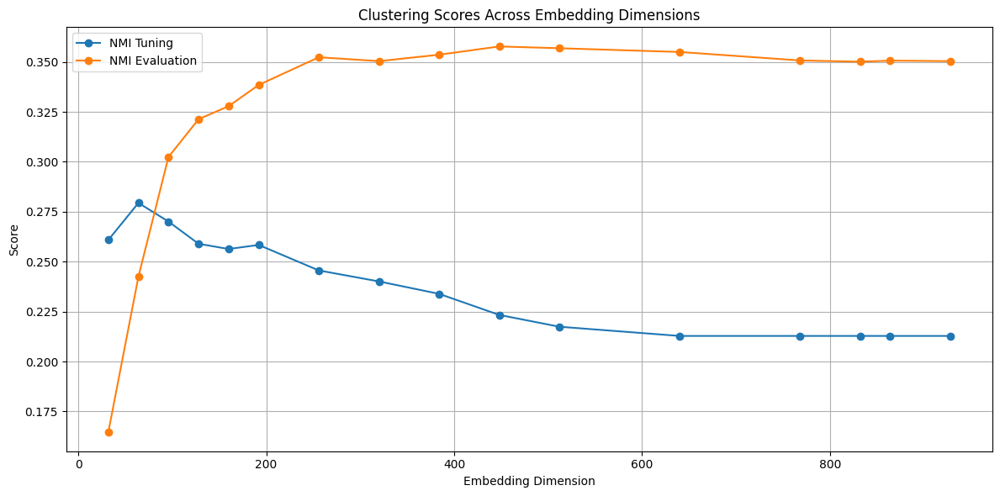

In [ ]:
#@title Nmi vs  Dim
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Plot NMI
plt.plot(dim_df['dim'], dim_df['nmi_tuning'], label='NMI Tuning', marker='o')
plt.plot(dim_df['dim'], dim_df['nmi_eval'], label='NMI Evaluation', marker='o')

# # Plot ARI
# plt.plot(dim_df['dim'], dim_df['ari_tuning'], label='ARI Tuning', marker='s')
# plt.plot(dim_df['dim'], dim_df['ari_eval'], label='ARI Evaluation', marker='s')

# # Plot AMI
# plt.plot(dim_df['dim'], dim_df['ami_tuning'], label='AMI Tuning', marker='^')
# plt.plot(dim_df['dim'], dim_df['ami_eval'], label='AMI Evaluation', marker='^')

plt.title('Clustering Scores Across Embedding Dimensions')
plt.xlabel('Embedding Dimension')
plt.ylabel('Score')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Best Params
# Get best tuning config by NMI
best_config = results_df.loc[results_df['nmi'].idxmax()]
print("Best NMI config on tuning set:")
print(best_config[['reducer', 'dim', 'eps', 'min_samples', 'nmi', 'ari', 'ami']])

# Using best config, transform evaluation embeddings and evaluate clustering
best_reducer_cls = reducers[best_config['reducer']]
best_dim = best_config['dim']
best_eps = best_config['eps']
best_min_samples = best_config['min_samples']

reducer = best_reducer_cls(n_components=best_dim, random_state=42)
reduced_tuning_best = reducer.fit_transform(tuning_embeddings)
reduced_eval_best = reducer.transform(evaluation_embeddings)

dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

cluster_labels_tuning = dbscan.fit_predict(reduced_tuning_best)
cluster_labels_eval = dbscan.fit_predict(reduced_eval_best)

def safe_scores(true, pred):
    if len(set(pred)) > 1 and (pred != -1).any():
        nmi = normalized_mutual_info_score(true, pred)
        ari = adjusted_rand_score(true, pred)
        ami = adjusted_mutual_info_score(true, pred)
    else:
        nmi = ari = ami = 0
    return nmi, ari, ami

nmi_tuning, ari_tuning, ami_tuning = safe_scores(true_labels_tuning, cluster_labels_tuning)
nmi_eval, ari_eval, ami_eval = safe_scores(true_labels_eval, cluster_labels_eval)

print("\nEvaluation metrics with best tuning config:")
print(f"NMI: {nmi_eval:.4f}, ARI: {ari_eval:.4f}, AMI: {ami_eval:.4f}")

# Summarize metrics for each dimension using best eps and min_samples
dim_metrics = []



Best NMI config on tuning set:
reducer             PCA
dim                  64
eps                0.17
min_samples           3
nmi            0.301534
ari            0.013981
ami            0.191887
Name: 85, dtype: object

Evaluation metrics with best tuning config:
NMI: 0.2016, ARI: 0.0305, AMI: 0.1480


In [ ]:
#@title Summarize clustering scores across embedding dimensions for best tuning hyperparameters

dim_metrics = []

for dim in dim_values:
    # Initialize reducer with the current dimension
    reducer = best_reducer_cls(n_components=dim, random_state=42)

    # Fit transform tuning embeddings and transform evaluation embeddings
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    # Initialize DBSCAN with best hyperparameters from tuning
    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    # Predict cluster labels on tuning and evaluation sets
    labels_tuning = dbscan.fit_predict(reduced_tuning)
    labels_eval = dbscan.fit_predict(reduced_eval)

    # Compute scores safely
    nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, labels_tuning)
    nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, labels_eval)

    # Append results
    dim_metrics.append({
        'dim': dim,
        'nmi_tuning': nmi_t,
        'ari_tuning': ari_t,
        'ami_tuning': ami_t,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

# Create DataFrame for easier visualization
dim_df = pd.DataFrame(dim_metrics)

print("\nSummary of clustering metrics across embedding dimensions:")
print(dim_df.to_string(index=False))



Summary of clustering metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval
  32    0.240123    0.041202    0.142333  0.159016  0.025968  0.127407
  64    0.301534    0.013981    0.191887  0.201649  0.030484  0.148010
  96    0.276604   -0.010094    0.167763  0.241365  0.026947  0.172726
 128    0.276277   -0.018184    0.166228  0.306154  0.024534  0.219939
 160    0.271314   -0.025267    0.150911  0.325195  0.019548  0.231628
 192    0.257039   -0.022851    0.141508  0.333934  0.016765  0.233051
 256    0.267461   -0.022347    0.148443  0.344297  0.013477  0.234161
 320    0.258262   -0.020819    0.140584  0.358048  0.011869  0.236418
 384    0.253995   -0.021965    0.136675  0.368881  0.010690  0.239682
 448    0.250887   -0.021867    0.137081  0.368108  0.010474  0.237473
 512    0.250046   -0.021915    0.138143  0.369317  0.009783  0.236665
 640    0.249144   -0.020774    0.139142  0.369660  0.008977  0.235593
 768    0.249144 

In [ ]:
#@title The Results of the Clustering
dim_metrics = []

for dim in dim_values:
    reducer = best_reducer_cls(n_components=dim, random_state=42)
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    print(f"Using eps = {best_eps}, min_samples = {best_min_samples} for dim = {dim}")

    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    labels_tuning = dbscan.fit_predict(reduced_tuning)
    labels_eval = dbscan.fit_predict(reduced_eval)

    nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, labels_tuning)
    nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, labels_eval)

    dim_metrics.append({
        'dim': dim,
        'nmi_tuning': nmi_t,
        'ari_tuning': ari_t,
        'ami_tuning': ami_t,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

dim_df = pd.DataFrame(dim_metrics)

print("\nSummary of metrics across embedding dimensions:")
print(dim_df.to_string(index=False))


Using eps = 0.16999999999999996, min_samples = 3 for dim = 32
Using eps = 0.16999999999999996, min_samples = 3 for dim = 64
Using eps = 0.16999999999999996, min_samples = 3 for dim = 96
Using eps = 0.16999999999999996, min_samples = 3 for dim = 128
Using eps = 0.16999999999999996, min_samples = 3 for dim = 160
Using eps = 0.16999999999999996, min_samples = 3 for dim = 192
Using eps = 0.16999999999999996, min_samples = 3 for dim = 256
Using eps = 0.16999999999999996, min_samples = 3 for dim = 320
Using eps = 0.16999999999999996, min_samples = 3 for dim = 384
Using eps = 0.16999999999999996, min_samples = 3 for dim = 448
Using eps = 0.16999999999999996, min_samples = 3 for dim = 512
Using eps = 0.16999999999999996, min_samples = 3 for dim = 640
Using eps = 0.16999999999999996, min_samples = 3 for dim = 768
Using eps = 0.16999999999999996, min_samples = 3 for dim = 832
Using eps = 0.16999999999999996, min_samples = 3 for dim = 864
Using eps = 0.16999999999999996, min_samples = 3 for dim =

In [ ]:
#@title Clustering and Topic Modeling Metrics Summary Across Embedding Dimensions
from sklearn.metrics import silhouette_score
from gensim.corpora import Dictionary
from gensim.models.coherencemodel import CoherenceModel

def safe_silhouette_score(X, labels):
    if len(set(labels)) > 1 and len(X) > len(set(labels)):
        return silhouette_score(X, labels, metric='cosine')
    return -1

def get_topic_coherence(texts, labels, coherence_type='c_v'):
    clustered_docs = {}
    for text, label in zip(texts, labels):
        if label == -1:
            continue
        clustered_docs.setdefault(label, []).append(text)

    topics = [docs for docs in clustered_docs.values() if len(docs) >= 3]

    if len(topics) == 0:
        return -1

    tokenized_topics = [[word for doc in topic for word in doc.split()] for topic in topics]

    dictionary = Dictionary(tokenized_topics)
    corpus = [dictionary.doc2bow(text) for text in tokenized_topics]

    coherence_model = CoherenceModel(
        topics=tokenized_topics,
        texts=tokenized_topics,
        corpus=corpus,
        dictionary=dictionary,
        coherence=coherence_type
    )

    return coherence_model.get_coherence()

# Ground truth number of events (true clusters)
true_events_tuning = len(set(tuning_df['event_label']))
true_events_eval = len(set(evaluation_df['event_label']))

# Initialize list for metrics
additional_metrics = []

for dim in dim_values:
    reducer = best_reducer_cls(n_components=dim, random_state=42)
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    # Tuning
    labels_tuning = dbscan.fit_predict(reduced_tuning)
    silhouette_t = safe_silhouette_score(reduced_tuning, labels_tuning)
    num_clusters_t = len(set(labels_tuning)) - (1 if -1 in labels_tuning else 0)
    coherence_t_cv = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='c_v')
    coherence_t_umass = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='u_mass')

    # Evaluation
    labels_eval = dbscan.fit_predict(reduced_eval)
    silhouette_e = safe_silhouette_score(reduced_eval, labels_eval)
    num_clusters_e = len(set(labels_eval)) - (1 if -1 in labels_eval else 0)
    coherence_e_cv = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='c_v')
    coherence_e_umass = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='u_mass')

    additional_metrics.append({
        'dim': dim,
        'true_events_tuning': true_events_tuning,
        'true_events_eval': true_events_eval,
        'silhouette_tuning': silhouette_t,
        'num_clusters_tuning': num_clusters_t,
        'coherence_tuning_c_v': coherence_t_cv,
        'coherence_tuning_u_mass': coherence_t_umass,
        'silhouette_eval': silhouette_e,
        'num_clusters_eval': num_clusters_e,
        'coherence_eval_c_v': coherence_e_cv,
        'coherence_eval_u_mass': coherence_e_umass
    })

# Merge with original dim_df
extra_df = pd.DataFrame(additional_metrics)
dim_df = pd.merge(dim_df, extra_df, on='dim')

# Display full summary
print("\nSummary of all clustering metrics across embedding dimensions:")
print(dim_df.to_string(index=False))



Summary of all clustering metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval  true_events_tuning  true_events_eval  silhouette_tuning  num_clusters_tuning  coherence_tuning_c_v  coherence_tuning_u_mass  silhouette_eval  num_clusters_eval  coherence_eval_c_v  coherence_eval_u_mass
  32    0.240123    0.041202    0.142333  0.159016  0.025968  0.127407                  31               103           0.145062                   34              0.642706                -0.711728         0.337445                 16            0.549589              -0.414503
  64    0.301534    0.013981    0.191887  0.201649  0.030484  0.148010                  31               103          -0.009846                   43              0.717579                -0.783628         0.041073                 64            0.598184              -0.706962
  96    0.276604   -0.010094    0.167763  0.241365  0.026947  0.172726                  31               103   

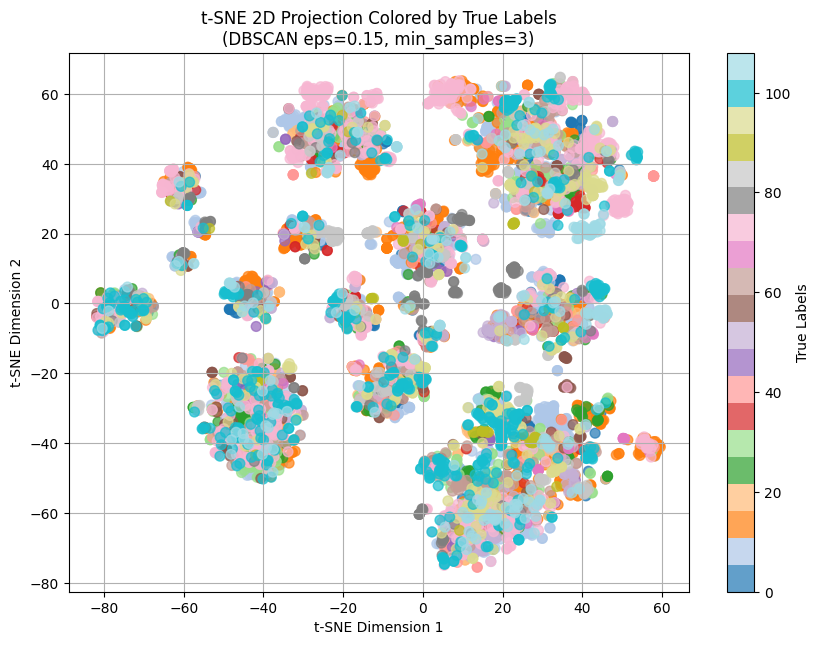

In [ ]:
#@title Visualisation
from sklearn.cluster import DBSCAN
from sklearn.manifold import TSNE
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

true_labels = evaluation_df['event_label'].values  # Use evaluation labels
best_params_eps=0.15
best_params_min_samples=3

# Run DBSCAN with best params on evaluation embeddings
best_dbscan = DBSCAN(eps=best_params_eps, min_samples=int(best_params_min_samples), metric='cosine')
best_cluster_labels = best_dbscan.fit_predict(evaluation_embeddings)

# t-SNE dimensionality reduction to 2D on evaluation embeddings
tsne = TSNE(n_components=2, random_state=42, init='pca')
reduced_embeddings = tsne.fit_transform(evaluation_embeddings)

# Plotting
plt.figure(figsize=(10, 7))
scatter = plt.scatter(
    reduced_embeddings[:, 0], reduced_embeddings[:, 1],
    c=true_labels, cmap='tab20', alpha=0.7, s=50
)
plt.colorbar(scatter, label='True Labels')
plt.title(f"t-SNE 2D Projection Colored by True Labels\n(DBSCAN eps={best_params_eps:.2f}, min_samples={int(best_params_min_samples)})")
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.grid(True)
plt.show()


# mBert Experiments

## DBSCAN, With MBERT Embedding + hashtags + Named Entities as Splited


In [ ]:
# @title Install mBert
# from bertopic import BERTopic
from sentence_transformers import SentenceTransformer

# Use Arabic sentence transformer model
embedding_model = SentenceTransformer("sentence-transformers/LaBSE")

# Create and fit BERTopic model
# topic_model = BERTopic(embedding_model=embedding_model, language="arabic")



modules.json:   0%|          | 0.00/461 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/804 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.88G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/397 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/114 [00:00<?, ?B/s]

2_Dense/model.safetensors:   0%|          | 0.00/2.36M [00:00<?, ?B/s]

2_Dense/pytorch_model.bin:   0%|          | 0.00/2.36M [00:00<?, ?B/s]

In [ ]:
#@title Embedding the Tweets
# Imports
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from sklearn.decomposition import PCA
import pandas as pd
import numpy as np
from tqdm import tqdm

tweets = df['Tweet Text'].tolist()
embeddings = embedding_model.encode(tweets, show_progress_bar=True)


Batches:   0%|          | 0/219 [00:00<?, ?it/s]

In [ ]:
#@title Embedding the Named Entities
# import ast
# import re



# # Preview
# df['hashtags'].head()
# Helper to embed list of tokens (e.g., hashtags or named entities)
# Convert stringifNied lists to Python lists (e.g. ["flood", "storm"] → ['flood', 'storm'])
if isinstance(df['Named Entities'].iloc[0], str):
    df['Named Entities'] = df['Named Entities'].apply(eval)

if isinstance(df['Hashtags'].iloc[0], str):
    df['Hashtags'] = df['Hashtags'].apply(eval)

if isinstance(df['PER'].iloc[0], str):
    df['PER'] = df['PER'].apply(eval)

if isinstance(df['ORG'].iloc[0], str):
    df['ORG'] = df['ORG'].apply(eval)

if isinstance(df['LOC'].iloc[0], str):
    df['LOC'] = df['LOC'].apply(eval)

def embed_and_average(token_lists):
    results = []
    for tokens in tqdm(token_lists, desc="Embedding token lists"):
        if not tokens:
            results.append(np.zeros(768))  # Return zero-vector for empty input
        else:
            token_embeds = embedding_model.encode(tokens)
            avg_embedding = np.mean(token_embeds, axis=0)
            results.append(avg_embedding)
    return np.vstack(results)

# Embed both columns
# named_entity_embeddings = embed_and_average(df['Named Entities'])
# hashtag_embeddings = embed_and_average(df['Hashtags'])

org_entity_embeddings = embed_and_average(df['ORG'])
loc_entity_embeddings = embed_and_average(df['LOC'])
per_entity_embeddings = embed_and_average(df['PER'])



Embedding token lists: 100%|██████████| 6998/6998 [04:34<00:00, 25.54it/s]


In [ ]:

#@title  PCA Reduction to 32D
pca_loc = PCA(n_components=16)
pca_per = PCA(n_components=16)
pca_org = PCA(n_components=16)
pca_hs = PCA(n_components=64)

# ne_embeddings_32d = pca_ne.fit_transform(named_entity_embeddings)
# hs_embeddings_32d = pca_hs.fit_transform(hashtag_embeddings)
per_embeddings_32d = pca_per.fit_transform(per_entity_embeddings)
org_embeddings_32d = pca_org.fit_transform(org_entity_embeddings)
loc_embeddings_32d = pca_loc.fit_transform(loc_entity_embeddings)

In [ ]:
#@title Save the Embedding
# Convert embeddings to a regular list
df['mbert_embeddings'] = embeddings.tolist()
# Save back to the DataFrame
# df['named_entities_embedding_32d'] = ne_embeddings_32d.tolist()
# df['hashtags_embedding_32d'] = hs_embeddings_32d.tolist()

df['per_embeddings_32d'] = per_embeddings_32d.tolist()
df['org_embeddings_32d'] = org_embeddings_32d.tolist()
df['loc_embeddings_32d'] = loc_embeddings_32d.tolist()

# # Convert to DataFrame
# embedding_df = pd.DataFrame(embeddings)

# # Save
# embedding_df.to_csv("tweet_embeddings.csv", index=False)


In [ ]:
#  @title Load the embedding for the tuning and evaluation df
import numpy as np

# Convert and concatenate for tuning set
tuning_tweet_emb = np.vstack(tuning_df['mbert_embeddings'].apply(np.array).values)
tuning_ne_emb = np.vstack(tuning_df['named_entities_embedding_32d'].apply(np.array).values)
tuning_hs_emb = np.vstack(tuning_df['hashtags_embedding_32d'].apply(np.array).values)

tuning_per_emb = np.vstack(tuning_df['per_embeddings_32d'].apply(np.array).values)
tuning_org_emb = np.vstack(tuning_df['org_embeddings_32d'].apply(np.array).values)
tuning_loc_emb = np.vstack(tuning_df['loc_embeddings_32d'].apply(np.array).values)

# Final concatenated embedding: 768 + 32 + 32 = 832 dimensions
# tuning_embeddings = np.hstack([tuning_tweet_emb, tuning_ne_emb]) # , tuning_hs_emb
tuning_embeddings = np.hstack([tuning_tweet_emb, tuning_per_emb,tuning_org_emb,tuning_loc_emb]) # , tuning_hs_emb

# Convert and concatenate for evaluation set
evaluation_tweet_emb = np.vstack(evaluation_df['mbert_embeddings'].apply(np.array).values)
evaluation_ne_emb = np.vstack(evaluation_df['named_entities_embedding_32d'].apply(np.array).values)
evaluation_hs_emb = np.vstack(evaluation_df['hashtags_embedding_32d'].apply(np.array).values)

evaluation_per_emb = np.vstack(evaluation_df['per_embeddings_32d'].apply(np.array).values)
evaluation_org_emb = np.vstack(evaluation_df['org_embeddings_32d'].apply(np.array).values)
evaluation_loc_emb = np.vstack(evaluation_df['loc_embeddings_32d'].apply(np.array).values)

evaluation_embeddings = np.hstack([evaluation_tweet_emb, evaluation_ne_emb]) # , evaluation_hs_emb

evaluation_embeddings = np.hstack([evaluation_tweet_emb, evaluation_per_emb, evaluation_org_emb, evaluation_loc_emb ]) # , evalu
# Check shapes
print(f"Tuning embeddings shape: {tuning_embeddings.shape}")
print(f"Evaluation embeddings shape: {evaluation_embeddings.shape}")


Tuning embeddings shape: (934, 816)
Evaluation embeddings shape: (6064, 816)


In [ ]:

#@title Define range of DBSCAN parameters to tune
eps_values = np.arange(0.20, 0.24, 0.01)        # Distance threshold
# eps_values = np.arange(0.11, 0.15, 0.01)        # Distance threshold
min_samples_values = np.arange(3,8,1)         # Minimum samples in neighborhood
dim_values = [32, 64, 96, 128, 160, 192, 256, 320, 384, 448, 512, 640, 768,816]
best_score = -1
best_params = None


In [ ]:
#@title Analyze the Effect of DBSCAN's epsilon Parameter on Clustering Results
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results_tuning = []
results_eval = []

# Tune over eps
for eps in eps_values:
    for min_samples in min_samples_values:
        # --- Tuning ---
        dbscan_tuning = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

        if len(set(cluster_labels_tuning)) > 1 and (cluster_labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, cluster_labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- Evaluation ---
        dbscan_eval = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_eval = dbscan_eval.fit_predict(evaluation_embeddings)

        if len(set(cluster_labels_eval)) > 1 and (cluster_labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, cluster_labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# Aggregate over min_samples
agg_tuning = df_tuning.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval = df_eval.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()



Best eps based on NMI (Tuning Set): eps = 0.34, NMI = 0.4484


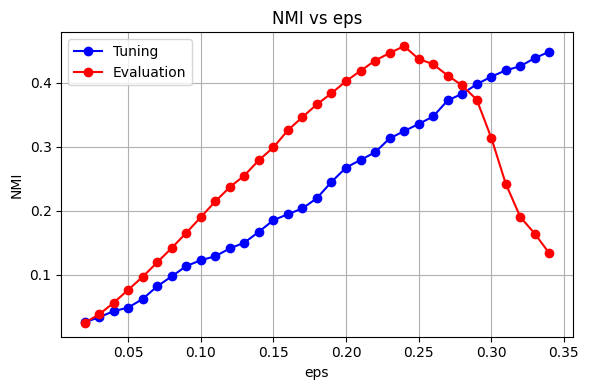

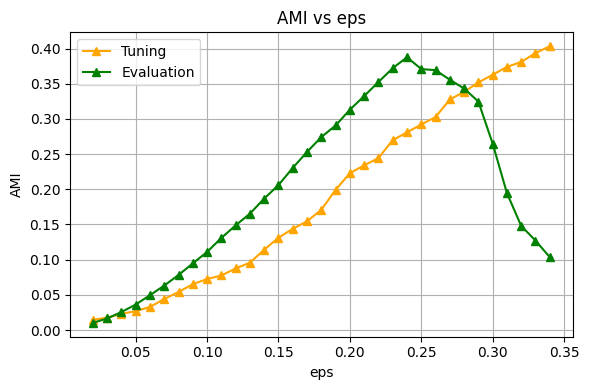

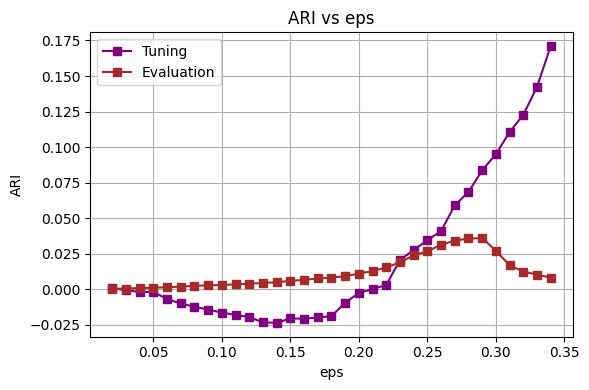

In [ ]:
#@title the Effect of DBSCAN's epsilon Parameter on Clustering Result

# Print best eps based on NMI from tuning set
best_eps_row = agg_tuning.loc[agg_tuning['nmi'].idxmax()]
print(f"Best eps based on NMI (Tuning Set): eps = {best_eps_row['eps']:.2f}, NMI = {best_eps_row['nmi']:.4f}")

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs eps')
plt.xlabel('eps')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ami'], marker='^', color='orange', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs eps')
plt.xlabel('eps')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ari'], marker='s', color='purple', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs eps')
plt.xlabel('eps')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Analyze the Effect of DBSCAN's Min Samples   Parameter on Clustering Result

true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results_tuning = []
results_eval = []

# Iterate over eps and min_samples combinations
for eps in eps_values:
    for min_samples in min_samples_values:
        # --- Tuning ---
        dbscan_tuning = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

        if len(set(cluster_labels_tuning)) > 1 and (cluster_labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, cluster_labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- Evaluation ---
        dbscan_eval = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_eval = dbscan_eval.fit_predict(evaluation_embeddings)

        if len(set(cluster_labels_eval)) > 1 and (cluster_labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, cluster_labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# === Aggregate over eps to study the effect of min_samples ===
agg_tuning_min = df_tuning.groupby('min_samples')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval_min = df_eval.groupby('min_samples')[['nmi', 'ari', 'ami']].mean().reset_index()



Best min_samples based on NMI (Tuning Set): min_samples = 3, NMI = 0.3737


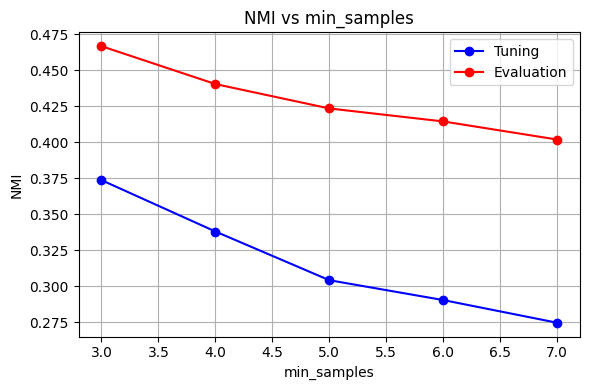

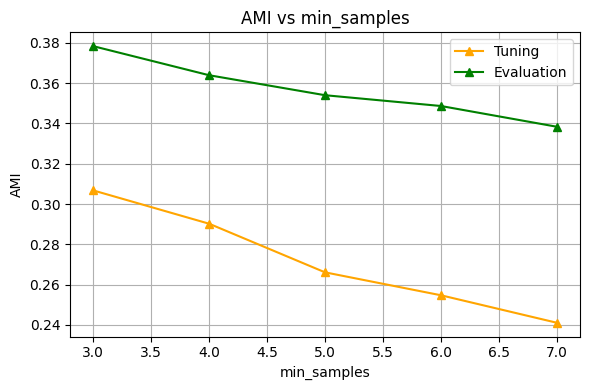

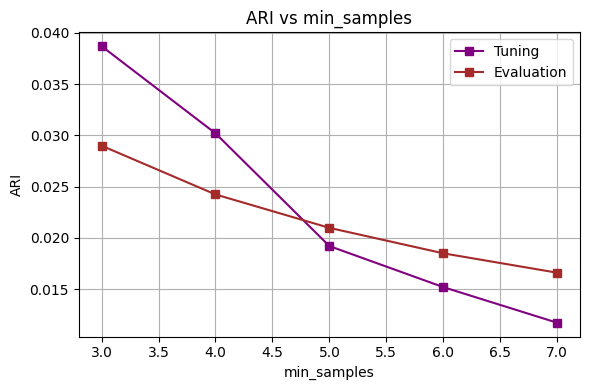

In [ ]:
#@title Analyze the Effect of DBSCAN's Min Samples   Parameter on Clustering Result

# Print best min_samples based on NMI from tuning set
best_minsample_row = agg_tuning_min.loc[agg_tuning_min['nmi'].idxmax()]
print(f"Best min_samples based on NMI (Tuning Set): min_samples = {int(best_minsample_row['min_samples'])}, NMI = {best_minsample_row['nmi']:.4f}")

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['ami'], marker='^', color='orange', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['ari'], marker='s', color='purple', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Analyze the Effect of PCA Dimensionality Reduction on DBSCAN Clustering Result

from sklearn.decomposition import PCA
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score
from sklearn.cluster import DBSCAN

# --- Settings ---

# dim_values = [32, 64, 96, 128, 160, 192, 256, 320, 384, 448, 512, 640, 768]
eps_best = 0.24
min_samples_best = 3

# True labels
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

dim_results = []

for dim in dim_values:
    # Reduce embeddings
    pca = PCA(n_components=dim)
    reduced_tuning = pca.fit_transform(tuning_embeddings)
    reduced_eval = pca.transform(evaluation_embeddings)

    # --- Tuning clustering ---
    dbscan_tuning = DBSCAN(eps=eps_best, min_samples=min_samples_best, metric='cosine')
    cluster_tuning = dbscan_tuning.fit_predict(reduced_tuning)

    if len(set(cluster_tuning)) > 1 and (cluster_tuning != -1).any():
        nmi = normalized_mutual_info_score(true_labels_tuning, cluster_tuning)
        ari = adjusted_rand_score(true_labels_tuning, cluster_tuning)
        ami = adjusted_mutual_info_score(true_labels_tuning, cluster_tuning)
    else:
        nmi = ari = ami = 0

    # --- Eval clustering ---
    dbscan_eval = DBSCAN(eps=eps_best, min_samples=min_samples_best, metric='cosine')
    cluster_eval = dbscan_eval.fit_predict(reduced_eval)

    if len(set(cluster_eval)) > 1 and (cluster_eval != -1).any():
        nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_eval)
        ari_e = adjusted_rand_score(true_labels_eval, cluster_eval)
        ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_eval)
    else:
        nmi_e = ari_e = ami_e = 0

    dim_results.append({
        'dim': dim,
        'nmi_tuning': nmi,
        'ari_tuning': ari,
        'ami_tuning': ami,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

# Convert to DataFrame
dim_df = pd.DataFrame(dim_results)


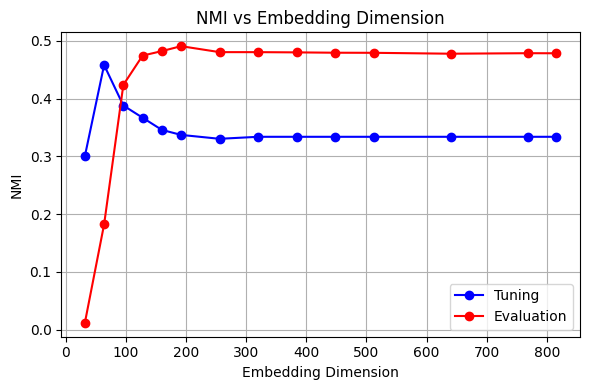

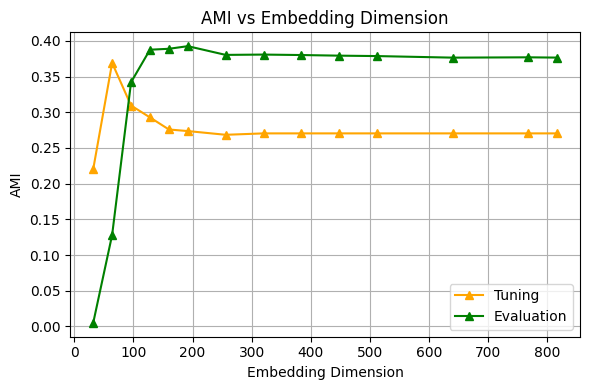

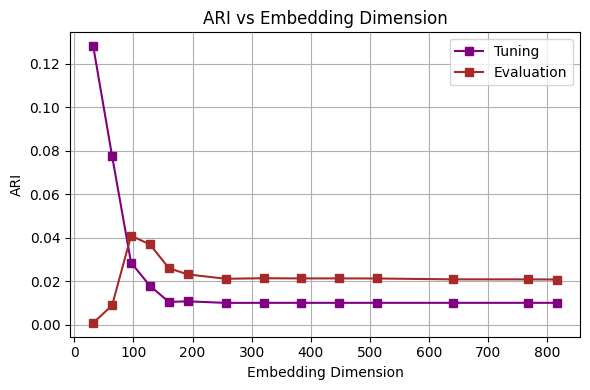

In [ ]:
#@title the Effect of PCA Dimensionality Reduction on DBSCAN Clustering Performance

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['nmi_tuning'], marker='o', label='Tuning', color='blue')
plt.plot(dim_df['dim'], dim_df['nmi_eval'], marker='o', label='Evaluation', color='red')
plt.title('NMI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['ami_tuning'], marker='^', label='Tuning', color='orange')
plt.plot(dim_df['dim'], dim_df['ami_eval'], marker='^', label='Evaluation', color='green')
plt.title('AMI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['ari_tuning'], marker='s', label='Tuning', color='purple')
plt.plot(dim_df['dim'], dim_df['ari_eval'], marker='s', label='Evaluation', color='brown')
plt.title('ARI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:

#@title Grid search on tuning set
from sklearn.decomposition import PCA
from umap import UMAP
from sklearn.cluster import DBSCAN
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

# Parameters for grid search
reducers = {
    'PCA': PCA,
    'UMAP': UMAP
}

true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results = []

# Grid search on tuning set
for reducer_name, reducer_cls in reducers.items():
    for dim in dim_values:
        print(f"Reducing tuning data to {dim}D using {reducer_name}...")
        reducer = reducer_cls(n_components=dim, random_state=42)
        reduced_tuning = reducer.fit_transform(tuning_embeddings)

        for eps in eps_values:
            for min_samples in min_samples_values:
                dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
                cluster_labels = dbscan.fit_predict(reduced_tuning)

                if len(set(cluster_labels)) > 1 and (cluster_labels != -1).any():
                    nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels)
                    ari = adjusted_rand_score(true_labels_tuning, cluster_labels)
                    ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels)
                else:
                    nmi = ari = ami = 0

                results.append({
                    'reducer': reducer_name,
                    'dim': dim,
                    'eps': eps,
                    'min_samples': min_samples,
                    'nmi': nmi,
                    'ari': ari,
                    'ami': ami,
                    'reduced_tuning': reduced_tuning
                })

results_df = pd.DataFrame(results)


Reducing tuning data to 32D using PCA...
Reducing tuning data to 64D using PCA...
Reducing tuning data to 96D using PCA...
Reducing tuning data to 128D using PCA...
Reducing tuning data to 160D using PCA...
Reducing tuning data to 192D using PCA...
Reducing tuning data to 256D using PCA...
Reducing tuning data to 320D using PCA...
Reducing tuning data to 384D using PCA...
Reducing tuning data to 448D using PCA...
Reducing tuning data to 512D using PCA...
Reducing tuning data to 640D using PCA...
Reducing tuning data to 768D using PCA...
Reducing tuning data to 816D using PCA...
Reducing tuning data to 32D using UMAP...
Reducing tuning data to 64D using UMAP...
Reducing tuning data to 96D using UMAP...
Reducing tuning data to 128D using UMAP...
Reducing tuning data to 160D using UMAP...
Reducing tuning data to 192D using UMAP...
Reducing tuning data to 256D using UMAP...
Reducing tuning data to 320D using UMAP...
Reducing tuning data to 384D using UMAP...
Reducing tuning data to 448D us

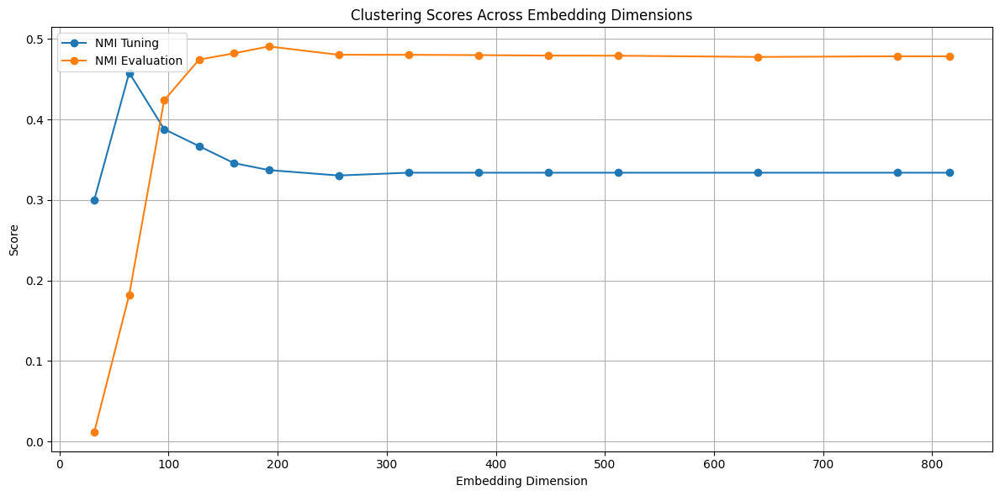

In [ ]:
#@title Nmi vs  Dim
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Plot NMI
plt.plot(dim_df['dim'], dim_df['nmi_tuning'], label='NMI Tuning', marker='o')
plt.plot(dim_df['dim'], dim_df['nmi_eval'], label='NMI Evaluation', marker='o')

# # Plot ARI
# plt.plot(dim_df['dim'], dim_df['ari_tuning'], label='ARI Tuning', marker='s')
# plt.plot(dim_df['dim'], dim_df['ari_eval'], label='ARI Evaluation', marker='s')

# # Plot AMI
# plt.plot(dim_df['dim'], dim_df['ami_tuning'], label='AMI Tuning', marker='^')
# plt.plot(dim_df['dim'], dim_df['ami_eval'], label='AMI Evaluation', marker='^')

plt.title('Clustering Scores Across Embedding Dimensions')
plt.xlabel('Embedding Dimension')
plt.ylabel('Score')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Best Params
# Get best tuning config by NMI
best_config = results_df.loc[results_df['nmi'].idxmax()]
print("Best NMI config on tuning set:")
print(best_config[['reducer', 'dim', 'eps', 'min_samples', 'nmi', 'ari', 'ami']])

# Using best config, transform evaluation embeddings and evaluate clustering
best_reducer_cls = reducers[best_config['reducer']]
best_dim = best_config['dim']
best_eps = best_config['eps']
best_min_samples = best_config['min_samples']

reducer = best_reducer_cls(n_components=best_dim, random_state=42)
reduced_tuning_best = reducer.fit_transform(tuning_embeddings)
reduced_eval_best = reducer.transform(evaluation_embeddings)

dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

cluster_labels_tuning = dbscan.fit_predict(reduced_tuning_best)
cluster_labels_eval = dbscan.fit_predict(reduced_eval_best)

def safe_scores(true, pred):
    if len(set(pred)) > 1 and (pred != -1).any():
        nmi = normalized_mutual_info_score(true, pred)
        ari = adjusted_rand_score(true, pred)
        ami = adjusted_mutual_info_score(true, pred)
    else:
        nmi = ari = ami = 0
    return nmi, ari, ami

nmi_tuning, ari_tuning, ami_tuning = safe_scores(true_labels_tuning, cluster_labels_tuning)
nmi_eval, ari_eval, ami_eval = safe_scores(true_labels_eval, cluster_labels_eval)

print("\nEvaluation metrics with best tuning config:")
print(f"NMI: {nmi_eval:.4f}, ARI: {ari_eval:.4f}, AMI: {ami_eval:.4f}")

# Summarize metrics for each dimension using best eps and min_samples
dim_metrics = []



Best NMI config on tuning set:
reducer             PCA
dim                  32
eps                0.21
min_samples           3
nmi            0.447029
ari            0.161158
ami            0.366046
Name: 5, dtype: object

Evaluation metrics with best tuning config:
NMI: 0.0284, ARI: 0.0017, AMI: 0.0122


In [ ]:
#@title Summarize clustering scores across embedding dimensions for best tuning hyperparameters

dim_metrics = []

for dim in dim_values:
    # Initialize reducer with the current dimension
    reducer = best_reducer_cls(n_components=dim, random_state=42)

    # Fit transform tuning embeddings and transform evaluation embeddings
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    # Initialize DBSCAN with best hyperparameters from tuning
    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    # Predict cluster labels on tuning and evaluation sets
    labels_tuning = dbscan.fit_predict(reduced_tuning)
    labels_eval = dbscan.fit_predict(reduced_eval)

    # Compute scores safely
    nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, labels_tuning)
    nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, labels_eval)

    # Append results
    dim_metrics.append({
        'dim': dim,
        'nmi_tuning': nmi_t,
        'ari_tuning': ari_t,
        'ami_tuning': ami_t,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

# Create DataFrame for easier visualization
dim_df = pd.DataFrame(dim_metrics)

print("\nSummary of clustering metrics across embedding dimensions:")
print(dim_df.to_string(index=False))



Summary of clustering metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval
  32    0.447029    0.161158    0.366046  0.028424  0.001728  0.012155
  64    0.418480    0.037032    0.328822  0.368059  0.044590  0.294594
  96    0.348576    0.007919    0.275410  0.471732  0.031050  0.376769
 128    0.334485    0.003105    0.259263  0.473830  0.020130  0.371000
 160    0.305764   -0.009703    0.230144  0.468594  0.016882  0.356186
 192    0.299893   -0.010354    0.223763  0.461262  0.016684  0.347293
 256    0.272852   -0.015209    0.198597  0.447104  0.014667  0.330497
 320    0.271504   -0.017034    0.194335  0.446247  0.014734  0.329511
 384    0.271504   -0.017034    0.194335  0.446059  0.014705  0.329300
 448    0.271504   -0.017034    0.194335  0.445723  0.014689  0.328882
 512    0.271504   -0.017034    0.194335  0.445346  0.014644  0.328496
 640    0.271504   -0.017034    0.194335  0.444263  0.014535  0.327085
 768    0.271504 

In [ ]:
#@title The Results of the Clustering
dim_metrics = []

for dim in dim_values:
    reducer = best_reducer_cls(n_components=dim, random_state=42)
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    print(f"Using eps = {best_eps}, min_samples = {best_min_samples} for dim = {dim}")

    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    labels_tuning = dbscan.fit_predict(reduced_tuning)
    labels_eval = dbscan.fit_predict(reduced_eval)

    nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, labels_tuning)
    nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, labels_eval)

    dim_metrics.append({
        'dim': dim,
        'nmi_tuning': nmi_t,
        'ari_tuning': ari_t,
        'ami_tuning': ami_t,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

dim_df = pd.DataFrame(dim_metrics)

print("\nSummary of metrics across embedding dimensions:")
print(dim_df.to_string(index=False))


Using eps = 0.21000000000000002, min_samples = 3 for dim = 32
Using eps = 0.21000000000000002, min_samples = 3 for dim = 64
Using eps = 0.21000000000000002, min_samples = 3 for dim = 96
Using eps = 0.21000000000000002, min_samples = 3 for dim = 128
Using eps = 0.21000000000000002, min_samples = 3 for dim = 160
Using eps = 0.21000000000000002, min_samples = 3 for dim = 192
Using eps = 0.21000000000000002, min_samples = 3 for dim = 256
Using eps = 0.21000000000000002, min_samples = 3 for dim = 320
Using eps = 0.21000000000000002, min_samples = 3 for dim = 384
Using eps = 0.21000000000000002, min_samples = 3 for dim = 448
Using eps = 0.21000000000000002, min_samples = 3 for dim = 512
Using eps = 0.21000000000000002, min_samples = 3 for dim = 640
Using eps = 0.21000000000000002, min_samples = 3 for dim = 768
Using eps = 0.21000000000000002, min_samples = 3 for dim = 816

Summary of metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval
 

In [ ]:
#@title Clustering and Topic Modeling Metrics Summary Across Embedding Dimensions
from sklearn.metrics import silhouette_score
from gensim.corpora import Dictionary
from gensim.models.coherencemodel import CoherenceModel

def safe_silhouette_score(X, labels):
    if len(set(labels)) > 1 and len(X) > len(set(labels)):
        return silhouette_score(X, labels, metric='cosine')
    return -1

def get_topic_coherence(texts, labels, coherence_type='c_v'):
    clustered_docs = {}
    for text, label in zip(texts, labels):
        if label == -1:
            continue
        clustered_docs.setdefault(label, []).append(text)

    topics = [docs for docs in clustered_docs.values() if len(docs) >= 3]

    if len(topics) == 0:
        return -1

    tokenized_topics = [[word for doc in topic for word in doc.split()] for topic in topics]

    dictionary = Dictionary(tokenized_topics)
    corpus = [dictionary.doc2bow(text) for text in tokenized_topics]

    coherence_model = CoherenceModel(
        topics=tokenized_topics,
        texts=tokenized_topics,
        corpus=corpus,
        dictionary=dictionary,
        coherence=coherence_type
    )

    return coherence_model.get_coherence()

# Ground truth number of events (true clusters)
true_events_tuning = len(set(tuning_df['event_label']))
true_events_eval = len(set(evaluation_df['event_label']))

# Initialize list for metrics
additional_metrics = []

for dim in dim_values:
    reducer = best_reducer_cls(n_components=dim, random_state=42)
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    # Tuning
    labels_tuning = dbscan.fit_predict(reduced_tuning)
    silhouette_t = safe_silhouette_score(reduced_tuning, labels_tuning)
    num_clusters_t = len(set(labels_tuning)) - (1 if -1 in labels_tuning else 0)
    coherence_t_cv = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='c_v')
    coherence_t_umass = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='u_mass')

    # Evaluation
    labels_eval = dbscan.fit_predict(reduced_eval)
    silhouette_e = safe_silhouette_score(reduced_eval, labels_eval)
    num_clusters_e = len(set(labels_eval)) - (1 if -1 in labels_eval else 0)
    coherence_e_cv = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='c_v')
    coherence_e_umass = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='u_mass')

    additional_metrics.append({
        'dim': dim,
        'true_events_tuning': true_events_tuning,
        'true_events_eval': true_events_eval,
        'silhouette_tuning': silhouette_t,
        'num_clusters_tuning': num_clusters_t,
        'coherence_tuning_c_v': coherence_t_cv,
        'coherence_tuning_u_mass': coherence_t_umass,
        'silhouette_eval': silhouette_e,
        'num_clusters_eval': num_clusters_e,
        'coherence_eval_c_v': coherence_e_cv,
        'coherence_eval_u_mass': coherence_e_umass
    })

# Merge with original dim_df
extra_df = pd.DataFrame(additional_metrics)
dim_df = pd.merge(dim_df, extra_df, on='dim')

# Display full summary
print("\nSummary of all clustering metrics across embedding dimensions:")
print(dim_df.to_string(index=False))



Summary of all clustering metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval  true_events_tuning  true_events_eval  silhouette_tuning  num_clusters_tuning  coherence_tuning_c_v  coherence_tuning_u_mass  silhouette_eval  num_clusters_eval  coherence_eval_c_v  coherence_eval_u_mass
  32    0.447029    0.161158    0.366046  0.028424  0.001728  0.012155                  31               103           0.028824                   42              0.710652                -0.759836        -0.391722                 18            0.587451              -0.341194
  64    0.418480    0.037032    0.328822  0.368059  0.044590  0.294594                  31               103          -0.113450                   43              0.772152                -0.668936        -0.294817                131            0.637876              -0.935026
  96    0.348576    0.007919    0.275410  0.471732  0.031050  0.376769                  31               103   

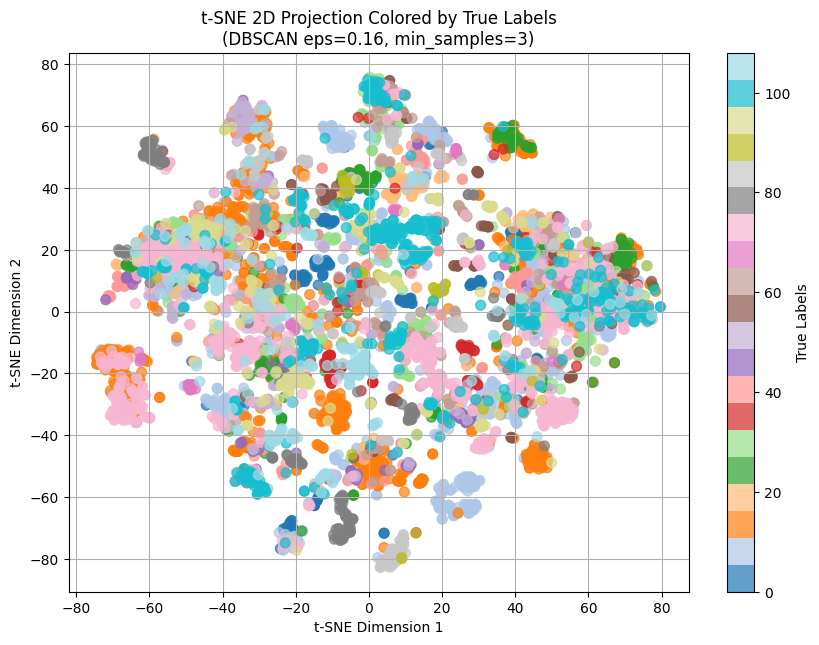

In [ ]:
#@title Visualisation
from sklearn.cluster import DBSCAN
from sklearn.manifold import TSNE
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

true_labels = evaluation_df['event_label'].values  # Use evaluation labels
best_params_eps=0.21
best_params_min_samples=3

# Run DBSCAN with best params on evaluation embeddings
best_dbscan = DBSCAN(eps=best_params_eps, min_samples=int(best_params_min_samples), metric='cosine')
best_cluster_labels = best_dbscan.fit_predict(evaluation_embeddings)

# t-SNE dimensionality reduction to 2D on evaluation embeddings
tsne = TSNE(n_components=2, random_state=42, init='pca')
reduced_embeddings = tsne.fit_transform(evaluation_embeddings)

# Plotting
plt.figure(figsize=(10, 7))
scatter = plt.scatter(
    reduced_embeddings[:, 0], reduced_embeddings[:, 1],
    c=true_labels, cmap='tab20', alpha=0.7, s=50
)
plt.colorbar(scatter, label='True Labels')
plt.title(f"t-SNE 2D Projection Colored by True Labels\n(DBSCAN eps={best_params_eps:.2f}, min_samples={int(best_params_min_samples)})")
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.grid(True)
plt.show()


## DBSCAN, With MBERT Embedding + Named Entities as Splited


In [ ]:
# @title Install mBert
# from bertopic import BERTopic
from sentence_transformers import SentenceTransformer

# Use Arabic sentence transformer model
embedding_model = SentenceTransformer("sentence-transformers/LaBSE")

# Create and fit BERTopic model
# topic_model = BERTopic(embedding_model=embedding_model, language="arabic")



modules.json:   0%|          | 0.00/461 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/804 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.88G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/397 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/114 [00:00<?, ?B/s]

2_Dense/model.safetensors:   0%|          | 0.00/2.36M [00:00<?, ?B/s]

2_Dense/pytorch_model.bin:   0%|          | 0.00/2.36M [00:00<?, ?B/s]

In [ ]:
#@title Embedding the Tweets
# Imports
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from sklearn.decomposition import PCA
import pandas as pd
import numpy as np
from tqdm import tqdm

tweets = df['Tweet Text'].tolist()
embeddings = embedding_model.encode(tweets, show_progress_bar=True)


Batches:   0%|          | 0/219 [00:00<?, ?it/s]

In [ ]:
#@title Embedding the Named Entities
# import ast
# import re



# # Preview
# df['hashtags'].head()
# Helper to embed list of tokens (e.g., hashtags or named entities)
# Convert stringifNied lists to Python lists (e.g. ["flood", "storm"] → ['flood', 'storm'])
if isinstance(df['Named Entities'].iloc[0], str):
    df['Named Entities'] = df['Named Entities'].apply(eval)

if isinstance(df['Hashtags'].iloc[0], str):
    df['Hashtags'] = df['Hashtags'].apply(eval)

if isinstance(df['PER'].iloc[0], str):
    df['PER'] = df['PER'].apply(eval)

if isinstance(df['ORG'].iloc[0], str):
    df['ORG'] = df['ORG'].apply(eval)

if isinstance(df['LOC'].iloc[0], str):
    df['LOC'] = df['LOC'].apply(eval)

def embed_and_average(token_lists):
    results = []
    for tokens in tqdm(token_lists, desc="Embedding token lists"):
        if not tokens:
            results.append(np.zeros(768))  # Return zero-vector for empty input
        else:
            token_embeds = embedding_model.encode(tokens)
            avg_embedding = np.mean(token_embeds, axis=0)
            results.append(avg_embedding)
    return np.vstack(results)

# Embed both columns
# named_entity_embeddings = embed_and_average(df['Named Entities'])
# hashtag_embeddings = embed_and_average(df['Hashtags'])

org_entity_embeddings = embed_and_average(df['ORG'])
loc_entity_embeddings = embed_and_average(df['LOC'])
per_entity_embeddings = embed_and_average(df['PER'])



Embedding token lists: 100%|██████████| 6998/6998 [04:34<00:00, 25.54it/s]


In [ ]:

#@title  PCA Reduction to 32D
pca_loc = PCA(n_components=16)
pca_per = PCA(n_components=16)
pca_org = PCA(n_components=16)
pca_hs = PCA(n_components=64)

# ne_embeddings_32d = pca_ne.fit_transform(named_entity_embeddings)
# hs_embeddings_32d = pca_hs.fit_transform(hashtag_embeddings)
per_embeddings_32d = pca_per.fit_transform(per_entity_embeddings)
org_embeddings_32d = pca_org.fit_transform(org_entity_embeddings)
loc_embeddings_32d = pca_loc.fit_transform(loc_entity_embeddings)

In [ ]:
#@title Save the Embedding
# Convert embeddings to a regular list
df['mbert_embeddings'] = embeddings.tolist()
# Save back to the DataFrame
# df['named_entities_embedding_32d'] = ne_embeddings_32d.tolist()
# df['hashtags_embedding_32d'] = hs_embeddings_32d.tolist()

df['per_embeddings_32d'] = per_embeddings_32d.tolist()
df['org_embeddings_32d'] = org_embeddings_32d.tolist()
df['loc_embeddings_32d'] = loc_embeddings_32d.tolist()

# # Convert to DataFrame
# embedding_df = pd.DataFrame(embeddings)

# # Save
# embedding_df.to_csv("tweet_embeddings.csv", index=False)


In [ ]:
#  @title Load the embedding for the tuning and evaluation df
import numpy as np

# Convert and concatenate for tuning set
tuning_tweet_emb = np.vstack(tuning_df['mbert_embeddings'].apply(np.array).values)
tuning_ne_emb = np.vstack(tuning_df['named_entities_embedding_32d'].apply(np.array).values)
tuning_hs_emb = np.vstack(tuning_df['hashtags_embedding_32d'].apply(np.array).values)

tuning_per_emb = np.vstack(tuning_df['per_embeddings_32d'].apply(np.array).values)
tuning_org_emb = np.vstack(tuning_df['org_embeddings_32d'].apply(np.array).values)
tuning_loc_emb = np.vstack(tuning_df['loc_embeddings_32d'].apply(np.array).values)

# Final concatenated embedding: 768 + 32 + 32 = 832 dimensions
# tuning_embeddings = np.hstack([tuning_tweet_emb, tuning_ne_emb]) # , tuning_hs_emb
tuning_embeddings = np.hstack([tuning_tweet_emb, tuning_per_emb,tuning_org_emb,tuning_loc_emb]) # , tuning_hs_emb

# Convert and concatenate for evaluation set
evaluation_tweet_emb = np.vstack(evaluation_df['mbert_embeddings'].apply(np.array).values)
evaluation_ne_emb = np.vstack(evaluation_df['named_entities_embedding_32d'].apply(np.array).values)
evaluation_hs_emb = np.vstack(evaluation_df['hashtags_embedding_32d'].apply(np.array).values)

evaluation_per_emb = np.vstack(evaluation_df['per_embeddings_32d'].apply(np.array).values)
evaluation_org_emb = np.vstack(evaluation_df['org_embeddings_32d'].apply(np.array).values)
evaluation_loc_emb = np.vstack(evaluation_df['loc_embeddings_32d'].apply(np.array).values)

evaluation_embeddings = np.hstack([evaluation_tweet_emb, evaluation_ne_emb]) # , evaluation_hs_emb

evaluation_embeddings = np.hstack([evaluation_tweet_emb, evaluation_per_emb, evaluation_org_emb, evaluation_loc_emb ]) # , evalu
# Check shapes
print(f"Tuning embeddings shape: {tuning_embeddings.shape}")
print(f"Evaluation embeddings shape: {evaluation_embeddings.shape}")


Tuning embeddings shape: (934, 816)
Evaluation embeddings shape: (6064, 816)


In [ ]:

#@title Define range of DBSCAN parameters to tune
eps_values = np.arange(0.20, 0.24, 0.01)        # Distance threshold
# eps_values = np.arange(0.11, 0.15, 0.01)        # Distance threshold
min_samples_values = np.arange(3,8,1)         # Minimum samples in neighborhood
dim_values = [32, 64, 96, 128, 160, 192, 256, 320, 384, 448, 512, 640, 768,816]
best_score = -1
best_params = None


In [ ]:
#@title Analyze the Effect of DBSCAN's epsilon Parameter on Clustering Results
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results_tuning = []
results_eval = []

# Tune over eps
for eps in eps_values:
    for min_samples in min_samples_values:
        # --- Tuning ---
        dbscan_tuning = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

        if len(set(cluster_labels_tuning)) > 1 and (cluster_labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, cluster_labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- Evaluation ---
        dbscan_eval = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_eval = dbscan_eval.fit_predict(evaluation_embeddings)

        if len(set(cluster_labels_eval)) > 1 and (cluster_labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, cluster_labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# Aggregate over min_samples
agg_tuning = df_tuning.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval = df_eval.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()



Best eps based on NMI (Tuning Set): eps = 0.34, NMI = 0.4484


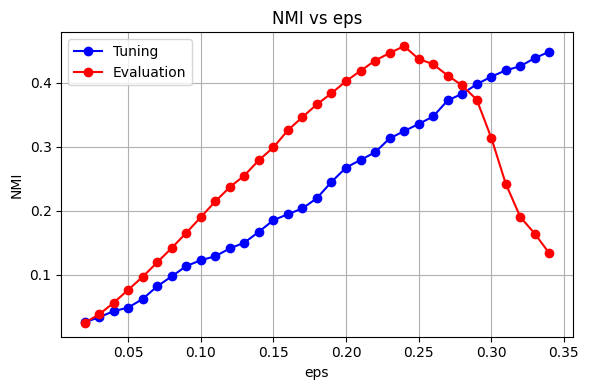

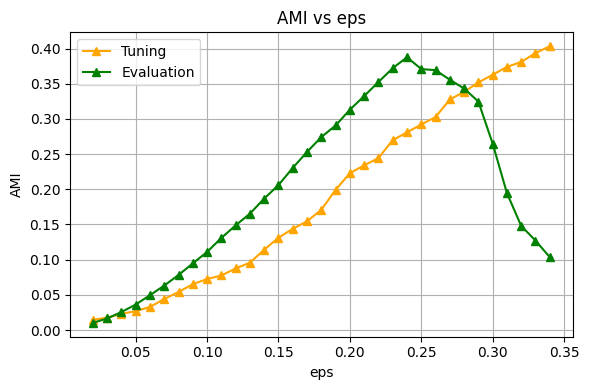

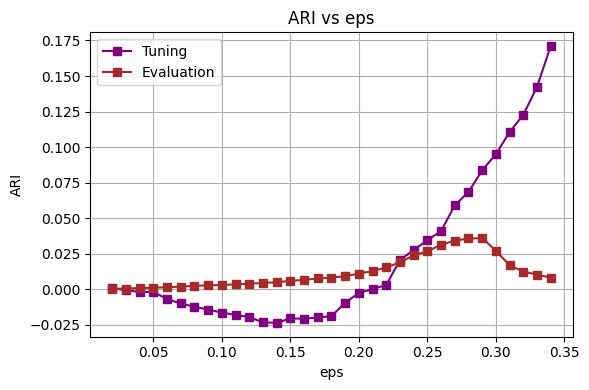

In [ ]:
#@title the Effect of DBSCAN's epsilon Parameter on Clustering Result

# Print best eps based on NMI from tuning set
best_eps_row = agg_tuning.loc[agg_tuning['nmi'].idxmax()]
print(f"Best eps based on NMI (Tuning Set): eps = {best_eps_row['eps']:.2f}, NMI = {best_eps_row['nmi']:.4f}")

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs eps')
plt.xlabel('eps')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ami'], marker='^', color='orange', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs eps')
plt.xlabel('eps')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ari'], marker='s', color='purple', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs eps')
plt.xlabel('eps')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Analyze the Effect of DBSCAN's Min Samples   Parameter on Clustering Result

true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results_tuning = []
results_eval = []

# Iterate over eps and min_samples combinations
for eps in eps_values:
    for min_samples in min_samples_values:
        # --- Tuning ---
        dbscan_tuning = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

        if len(set(cluster_labels_tuning)) > 1 and (cluster_labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, cluster_labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- Evaluation ---
        dbscan_eval = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_eval = dbscan_eval.fit_predict(evaluation_embeddings)

        if len(set(cluster_labels_eval)) > 1 and (cluster_labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, cluster_labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# === Aggregate over eps to study the effect of min_samples ===
agg_tuning_min = df_tuning.groupby('min_samples')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval_min = df_eval.groupby('min_samples')[['nmi', 'ari', 'ami']].mean().reset_index()



Best min_samples based on NMI (Tuning Set): min_samples = 3, NMI = 0.3737


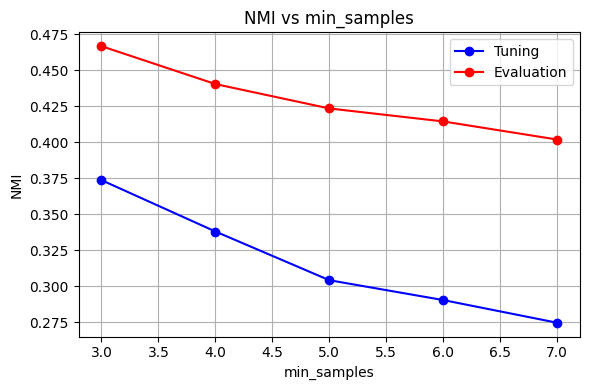

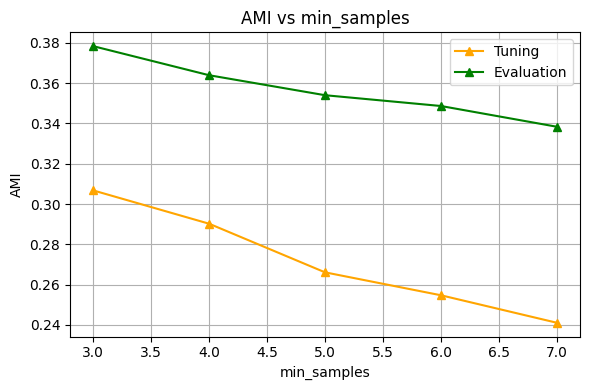

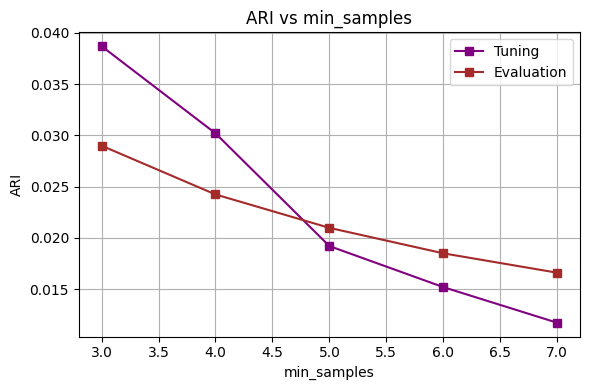

In [ ]:
#@title Analyze the Effect of DBSCAN's Min Samples   Parameter on Clustering Result

# Print best min_samples based on NMI from tuning set
best_minsample_row = agg_tuning_min.loc[agg_tuning_min['nmi'].idxmax()]
print(f"Best min_samples based on NMI (Tuning Set): min_samples = {int(best_minsample_row['min_samples'])}, NMI = {best_minsample_row['nmi']:.4f}")

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['ami'], marker='^', color='orange', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['ari'], marker='s', color='purple', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Analyze the Effect of PCA Dimensionality Reduction on DBSCAN Clustering Result

from sklearn.decomposition import PCA
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score
from sklearn.cluster import DBSCAN

# --- Settings ---

# dim_values = [32, 64, 96, 128, 160, 192, 256, 320, 384, 448, 512, 640, 768]
eps_best = 0.24
min_samples_best = 3

# True labels
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

dim_results = []

for dim in dim_values:
    # Reduce embeddings
    pca = PCA(n_components=dim)
    reduced_tuning = pca.fit_transform(tuning_embeddings)
    reduced_eval = pca.transform(evaluation_embeddings)

    # --- Tuning clustering ---
    dbscan_tuning = DBSCAN(eps=eps_best, min_samples=min_samples_best, metric='cosine')
    cluster_tuning = dbscan_tuning.fit_predict(reduced_tuning)

    if len(set(cluster_tuning)) > 1 and (cluster_tuning != -1).any():
        nmi = normalized_mutual_info_score(true_labels_tuning, cluster_tuning)
        ari = adjusted_rand_score(true_labels_tuning, cluster_tuning)
        ami = adjusted_mutual_info_score(true_labels_tuning, cluster_tuning)
    else:
        nmi = ari = ami = 0

    # --- Eval clustering ---
    dbscan_eval = DBSCAN(eps=eps_best, min_samples=min_samples_best, metric='cosine')
    cluster_eval = dbscan_eval.fit_predict(reduced_eval)

    if len(set(cluster_eval)) > 1 and (cluster_eval != -1).any():
        nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_eval)
        ari_e = adjusted_rand_score(true_labels_eval, cluster_eval)
        ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_eval)
    else:
        nmi_e = ari_e = ami_e = 0

    dim_results.append({
        'dim': dim,
        'nmi_tuning': nmi,
        'ari_tuning': ari,
        'ami_tuning': ami,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

# Convert to DataFrame
dim_df = pd.DataFrame(dim_results)


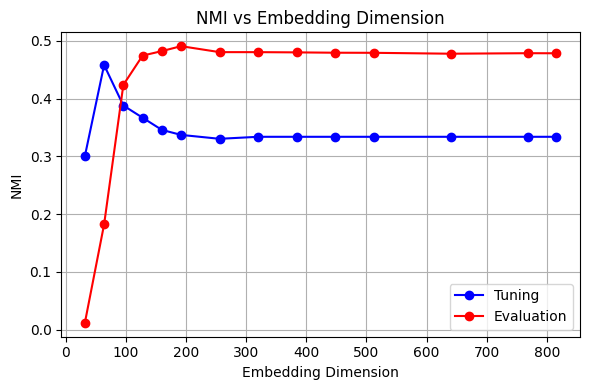

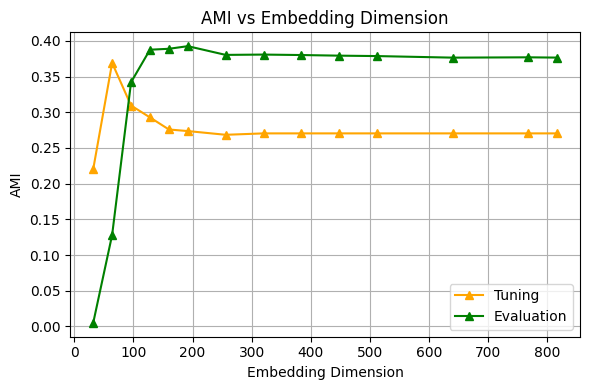

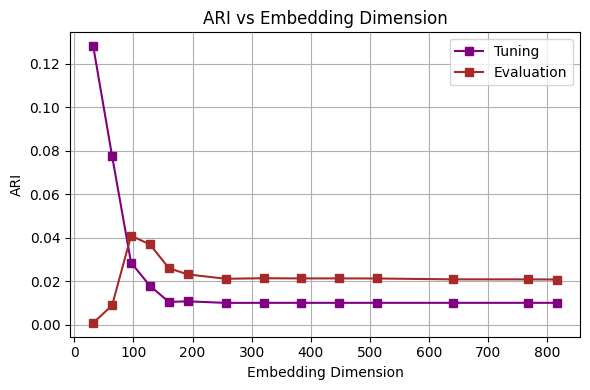

In [ ]:
#@title the Effect of PCA Dimensionality Reduction on DBSCAN Clustering Performance

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['nmi_tuning'], marker='o', label='Tuning', color='blue')
plt.plot(dim_df['dim'], dim_df['nmi_eval'], marker='o', label='Evaluation', color='red')
plt.title('NMI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['ami_tuning'], marker='^', label='Tuning', color='orange')
plt.plot(dim_df['dim'], dim_df['ami_eval'], marker='^', label='Evaluation', color='green')
plt.title('AMI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['ari_tuning'], marker='s', label='Tuning', color='purple')
plt.plot(dim_df['dim'], dim_df['ari_eval'], marker='s', label='Evaluation', color='brown')
plt.title('ARI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:

#@title Grid search on tuning set
from sklearn.decomposition import PCA
from umap import UMAP
from sklearn.cluster import DBSCAN
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

# Parameters for grid search
reducers = {
    'PCA': PCA,
    'UMAP': UMAP
}

true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results = []

# Grid search on tuning set
for reducer_name, reducer_cls in reducers.items():
    for dim in dim_values:
        print(f"Reducing tuning data to {dim}D using {reducer_name}...")
        reducer = reducer_cls(n_components=dim, random_state=42)
        reduced_tuning = reducer.fit_transform(tuning_embeddings)

        for eps in eps_values:
            for min_samples in min_samples_values:
                dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
                cluster_labels = dbscan.fit_predict(reduced_tuning)

                if len(set(cluster_labels)) > 1 and (cluster_labels != -1).any():
                    nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels)
                    ari = adjusted_rand_score(true_labels_tuning, cluster_labels)
                    ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels)
                else:
                    nmi = ari = ami = 0

                results.append({
                    'reducer': reducer_name,
                    'dim': dim,
                    'eps': eps,
                    'min_samples': min_samples,
                    'nmi': nmi,
                    'ari': ari,
                    'ami': ami,
                    'reduced_tuning': reduced_tuning
                })

results_df = pd.DataFrame(results)


Reducing tuning data to 32D using PCA...
Reducing tuning data to 64D using PCA...
Reducing tuning data to 96D using PCA...
Reducing tuning data to 128D using PCA...
Reducing tuning data to 160D using PCA...
Reducing tuning data to 192D using PCA...
Reducing tuning data to 256D using PCA...
Reducing tuning data to 320D using PCA...
Reducing tuning data to 384D using PCA...
Reducing tuning data to 448D using PCA...
Reducing tuning data to 512D using PCA...
Reducing tuning data to 640D using PCA...
Reducing tuning data to 768D using PCA...
Reducing tuning data to 816D using PCA...
Reducing tuning data to 32D using UMAP...
Reducing tuning data to 64D using UMAP...
Reducing tuning data to 96D using UMAP...
Reducing tuning data to 128D using UMAP...
Reducing tuning data to 160D using UMAP...
Reducing tuning data to 192D using UMAP...
Reducing tuning data to 256D using UMAP...
Reducing tuning data to 320D using UMAP...
Reducing tuning data to 384D using UMAP...
Reducing tuning data to 448D us

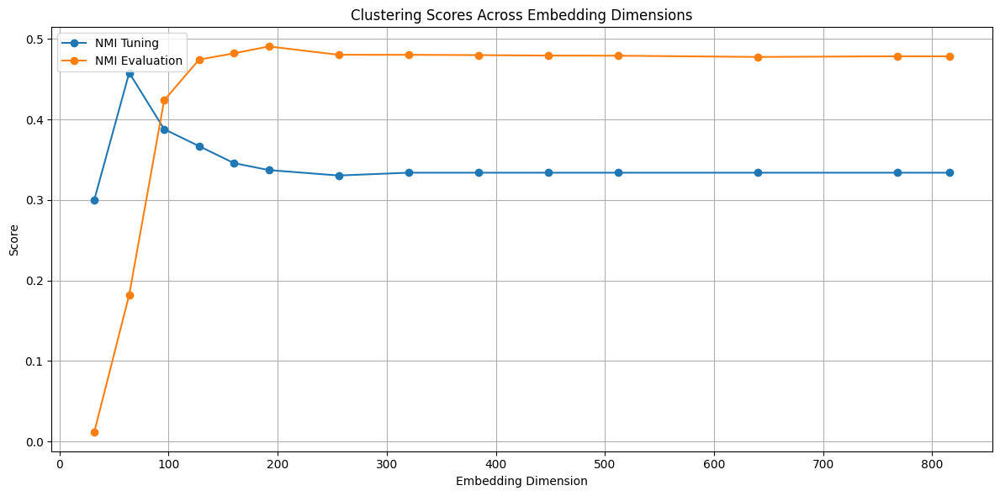

In [ ]:
#@title Nmi vs  Dim
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Plot NMI
plt.plot(dim_df['dim'], dim_df['nmi_tuning'], label='NMI Tuning', marker='o')
plt.plot(dim_df['dim'], dim_df['nmi_eval'], label='NMI Evaluation', marker='o')

# # Plot ARI
# plt.plot(dim_df['dim'], dim_df['ari_tuning'], label='ARI Tuning', marker='s')
# plt.plot(dim_df['dim'], dim_df['ari_eval'], label='ARI Evaluation', marker='s')

# # Plot AMI
# plt.plot(dim_df['dim'], dim_df['ami_tuning'], label='AMI Tuning', marker='^')
# plt.plot(dim_df['dim'], dim_df['ami_eval'], label='AMI Evaluation', marker='^')

plt.title('Clustering Scores Across Embedding Dimensions')
plt.xlabel('Embedding Dimension')
plt.ylabel('Score')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Best Params
# Get best tuning config by NMI
best_config = results_df.loc[results_df['nmi'].idxmax()]
print("Best NMI config on tuning set:")
print(best_config[['reducer', 'dim', 'eps', 'min_samples', 'nmi', 'ari', 'ami']])

# Using best config, transform evaluation embeddings and evaluate clustering
best_reducer_cls = reducers[best_config['reducer']]
best_dim = best_config['dim']
best_eps = best_config['eps']
best_min_samples = best_config['min_samples']

reducer = best_reducer_cls(n_components=best_dim, random_state=42)
reduced_tuning_best = reducer.fit_transform(tuning_embeddings)
reduced_eval_best = reducer.transform(evaluation_embeddings)

dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

cluster_labels_tuning = dbscan.fit_predict(reduced_tuning_best)
cluster_labels_eval = dbscan.fit_predict(reduced_eval_best)

def safe_scores(true, pred):
    if len(set(pred)) > 1 and (pred != -1).any():
        nmi = normalized_mutual_info_score(true, pred)
        ari = adjusted_rand_score(true, pred)
        ami = adjusted_mutual_info_score(true, pred)
    else:
        nmi = ari = ami = 0
    return nmi, ari, ami

nmi_tuning, ari_tuning, ami_tuning = safe_scores(true_labels_tuning, cluster_labels_tuning)
nmi_eval, ari_eval, ami_eval = safe_scores(true_labels_eval, cluster_labels_eval)

print("\nEvaluation metrics with best tuning config:")
print(f"NMI: {nmi_eval:.4f}, ARI: {ari_eval:.4f}, AMI: {ami_eval:.4f}")

# Summarize metrics for each dimension using best eps and min_samples
dim_metrics = []



Best NMI config on tuning set:
reducer             PCA
dim                  32
eps                0.21
min_samples           3
nmi            0.447029
ari            0.161158
ami            0.366046
Name: 5, dtype: object

Evaluation metrics with best tuning config:
NMI: 0.0284, ARI: 0.0017, AMI: 0.0122


In [ ]:
#@title Summarize clustering scores across embedding dimensions for best tuning hyperparameters

dim_metrics = []

for dim in dim_values:
    # Initialize reducer with the current dimension
    reducer = best_reducer_cls(n_components=dim, random_state=42)

    # Fit transform tuning embeddings and transform evaluation embeddings
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    # Initialize DBSCAN with best hyperparameters from tuning
    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    # Predict cluster labels on tuning and evaluation sets
    labels_tuning = dbscan.fit_predict(reduced_tuning)
    labels_eval = dbscan.fit_predict(reduced_eval)

    # Compute scores safely
    nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, labels_tuning)
    nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, labels_eval)

    # Append results
    dim_metrics.append({
        'dim': dim,
        'nmi_tuning': nmi_t,
        'ari_tuning': ari_t,
        'ami_tuning': ami_t,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

# Create DataFrame for easier visualization
dim_df = pd.DataFrame(dim_metrics)

print("\nSummary of clustering metrics across embedding dimensions:")
print(dim_df.to_string(index=False))



Summary of clustering metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval
  32    0.447029    0.161158    0.366046  0.028424  0.001728  0.012155
  64    0.418480    0.037032    0.328822  0.368059  0.044590  0.294594
  96    0.348576    0.007919    0.275410  0.471732  0.031050  0.376769
 128    0.334485    0.003105    0.259263  0.473830  0.020130  0.371000
 160    0.305764   -0.009703    0.230144  0.468594  0.016882  0.356186
 192    0.299893   -0.010354    0.223763  0.461262  0.016684  0.347293
 256    0.272852   -0.015209    0.198597  0.447104  0.014667  0.330497
 320    0.271504   -0.017034    0.194335  0.446247  0.014734  0.329511
 384    0.271504   -0.017034    0.194335  0.446059  0.014705  0.329300
 448    0.271504   -0.017034    0.194335  0.445723  0.014689  0.328882
 512    0.271504   -0.017034    0.194335  0.445346  0.014644  0.328496
 640    0.271504   -0.017034    0.194335  0.444263  0.014535  0.327085
 768    0.271504 

In [ ]:
#@title The Results of the Clustering
dim_metrics = []

for dim in dim_values:
    reducer = best_reducer_cls(n_components=dim, random_state=42)
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    print(f"Using eps = {best_eps}, min_samples = {best_min_samples} for dim = {dim}")

    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    labels_tuning = dbscan.fit_predict(reduced_tuning)
    labels_eval = dbscan.fit_predict(reduced_eval)

    nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, labels_tuning)
    nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, labels_eval)

    dim_metrics.append({
        'dim': dim,
        'nmi_tuning': nmi_t,
        'ari_tuning': ari_t,
        'ami_tuning': ami_t,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

dim_df = pd.DataFrame(dim_metrics)

print("\nSummary of metrics across embedding dimensions:")
print(dim_df.to_string(index=False))


Using eps = 0.21000000000000002, min_samples = 3 for dim = 32
Using eps = 0.21000000000000002, min_samples = 3 for dim = 64
Using eps = 0.21000000000000002, min_samples = 3 for dim = 96
Using eps = 0.21000000000000002, min_samples = 3 for dim = 128
Using eps = 0.21000000000000002, min_samples = 3 for dim = 160
Using eps = 0.21000000000000002, min_samples = 3 for dim = 192
Using eps = 0.21000000000000002, min_samples = 3 for dim = 256
Using eps = 0.21000000000000002, min_samples = 3 for dim = 320
Using eps = 0.21000000000000002, min_samples = 3 for dim = 384
Using eps = 0.21000000000000002, min_samples = 3 for dim = 448
Using eps = 0.21000000000000002, min_samples = 3 for dim = 512
Using eps = 0.21000000000000002, min_samples = 3 for dim = 640
Using eps = 0.21000000000000002, min_samples = 3 for dim = 768
Using eps = 0.21000000000000002, min_samples = 3 for dim = 816

Summary of metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval
 

In [ ]:
#@title Clustering and Topic Modeling Metrics Summary Across Embedding Dimensions
from sklearn.metrics import silhouette_score
from gensim.corpora import Dictionary
from gensim.models.coherencemodel import CoherenceModel

def safe_silhouette_score(X, labels):
    if len(set(labels)) > 1 and len(X) > len(set(labels)):
        return silhouette_score(X, labels, metric='cosine')
    return -1

def get_topic_coherence(texts, labels, coherence_type='c_v'):
    clustered_docs = {}
    for text, label in zip(texts, labels):
        if label == -1:
            continue
        clustered_docs.setdefault(label, []).append(text)

    topics = [docs for docs in clustered_docs.values() if len(docs) >= 3]

    if len(topics) == 0:
        return -1

    tokenized_topics = [[word for doc in topic for word in doc.split()] for topic in topics]

    dictionary = Dictionary(tokenized_topics)
    corpus = [dictionary.doc2bow(text) for text in tokenized_topics]

    coherence_model = CoherenceModel(
        topics=tokenized_topics,
        texts=tokenized_topics,
        corpus=corpus,
        dictionary=dictionary,
        coherence=coherence_type
    )

    return coherence_model.get_coherence()

# Ground truth number of events (true clusters)
true_events_tuning = len(set(tuning_df['event_label']))
true_events_eval = len(set(evaluation_df['event_label']))

# Initialize list for metrics
additional_metrics = []

for dim in dim_values:
    reducer = best_reducer_cls(n_components=dim, random_state=42)
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    # Tuning
    labels_tuning = dbscan.fit_predict(reduced_tuning)
    silhouette_t = safe_silhouette_score(reduced_tuning, labels_tuning)
    num_clusters_t = len(set(labels_tuning)) - (1 if -1 in labels_tuning else 0)
    coherence_t_cv = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='c_v')
    coherence_t_umass = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='u_mass')

    # Evaluation
    labels_eval = dbscan.fit_predict(reduced_eval)
    silhouette_e = safe_silhouette_score(reduced_eval, labels_eval)
    num_clusters_e = len(set(labels_eval)) - (1 if -1 in labels_eval else 0)
    coherence_e_cv = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='c_v')
    coherence_e_umass = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='u_mass')

    additional_metrics.append({
        'dim': dim,
        'true_events_tuning': true_events_tuning,
        'true_events_eval': true_events_eval,
        'silhouette_tuning': silhouette_t,
        'num_clusters_tuning': num_clusters_t,
        'coherence_tuning_c_v': coherence_t_cv,
        'coherence_tuning_u_mass': coherence_t_umass,
        'silhouette_eval': silhouette_e,
        'num_clusters_eval': num_clusters_e,
        'coherence_eval_c_v': coherence_e_cv,
        'coherence_eval_u_mass': coherence_e_umass
    })

# Merge with original dim_df
extra_df = pd.DataFrame(additional_metrics)
dim_df = pd.merge(dim_df, extra_df, on='dim')

# Display full summary
print("\nSummary of all clustering metrics across embedding dimensions:")
print(dim_df.to_string(index=False))



Summary of all clustering metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval  true_events_tuning  true_events_eval  silhouette_tuning  num_clusters_tuning  coherence_tuning_c_v  coherence_tuning_u_mass  silhouette_eval  num_clusters_eval  coherence_eval_c_v  coherence_eval_u_mass
  32    0.447029    0.161158    0.366046  0.028424  0.001728  0.012155                  31               103           0.028824                   42              0.710652                -0.759836        -0.391722                 18            0.587451              -0.341194
  64    0.418480    0.037032    0.328822  0.368059  0.044590  0.294594                  31               103          -0.113450                   43              0.772152                -0.668936        -0.294817                131            0.637876              -0.935026
  96    0.348576    0.007919    0.275410  0.471732  0.031050  0.376769                  31               103   

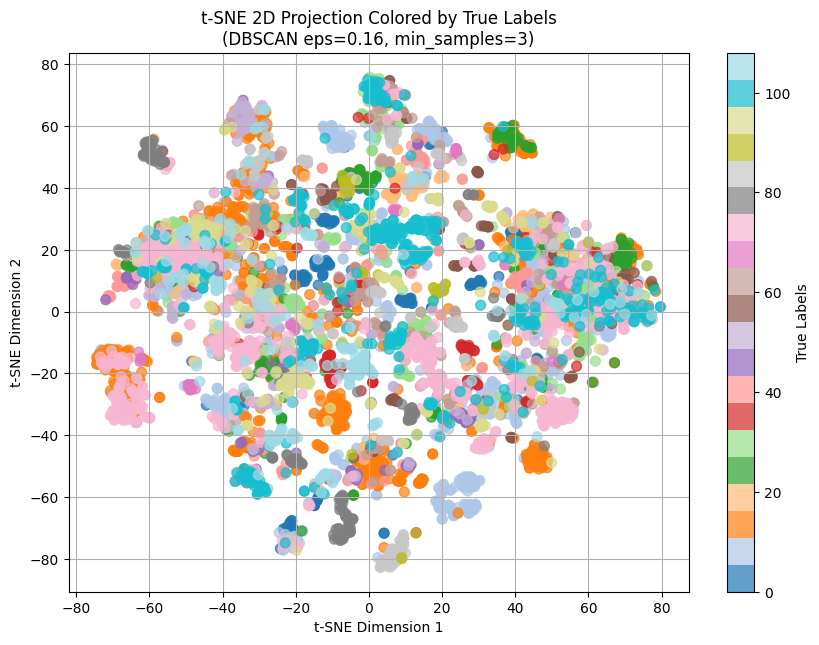

In [ ]:
#@title Visualisation
from sklearn.cluster import DBSCAN
from sklearn.manifold import TSNE
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

true_labels = evaluation_df['event_label'].values  # Use evaluation labels
best_params_eps=0.21
best_params_min_samples=3

# Run DBSCAN with best params on evaluation embeddings
best_dbscan = DBSCAN(eps=best_params_eps, min_samples=int(best_params_min_samples), metric='cosine')
best_cluster_labels = best_dbscan.fit_predict(evaluation_embeddings)

# t-SNE dimensionality reduction to 2D on evaluation embeddings
tsne = TSNE(n_components=2, random_state=42, init='pca')
reduced_embeddings = tsne.fit_transform(evaluation_embeddings)

# Plotting
plt.figure(figsize=(10, 7))
scatter = plt.scatter(
    reduced_embeddings[:, 0], reduced_embeddings[:, 1],
    c=true_labels, cmap='tab20', alpha=0.7, s=50
)
plt.colorbar(scatter, label='True Labels')
plt.title(f"t-SNE 2D Projection Colored by True Labels\n(DBSCAN eps={best_params_eps:.2f}, min_samples={int(best_params_min_samples)})")
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.grid(True)
plt.show()


In [ ]:
!pip install arabic-reshaper python-bidi


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 292.9/292.9 kB 5.9 MB/s eta 0:00:00


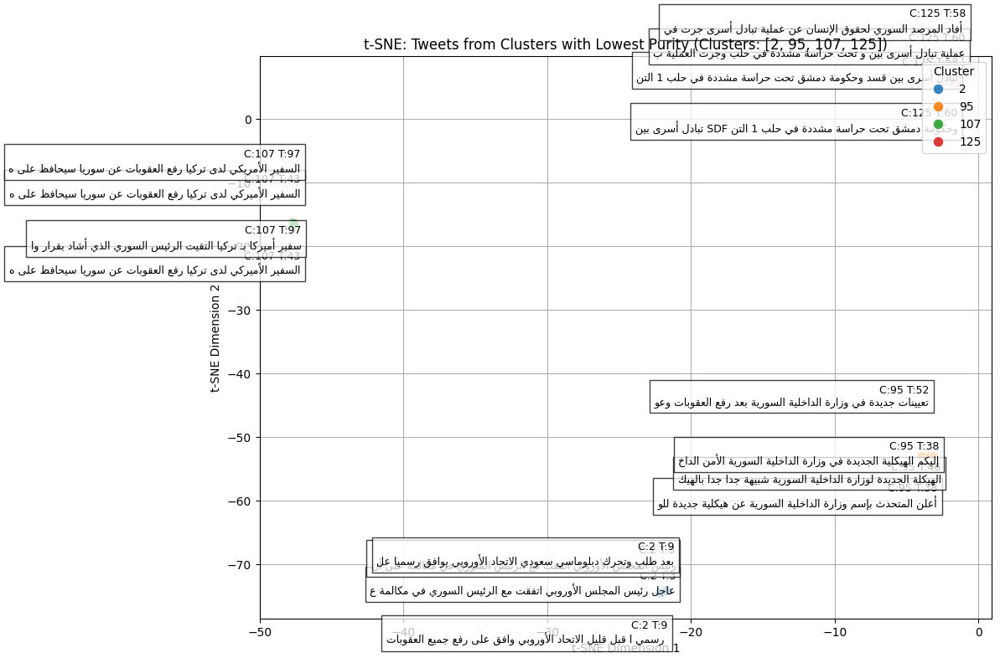

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.manifold import TSNE
from sklearn.metrics import normalized_mutual_info_score
import numpy as np
import pandas as pd
import arabic_reshaper
from bidi.algorithm import get_display
from collections import Counter

# Step 1: Clustering
best_params_eps = 0.16
best_params_min_samples = 3
dbscan = DBSCAN(eps=best_params_eps, min_samples=best_params_min_samples, metric='cosine')
cluster_labels = dbscan.fit_predict(evaluation_embeddings)

# Step 2: Create DataFrame
vis_df = pd.DataFrame({
    'x': TSNE(n_components=2, random_state=42, init='pca').fit_transform(evaluation_embeddings)[:, 0],
    'y': TSNE(n_components=2, random_state=42, init='pca').fit_transform(evaluation_embeddings)[:, 1],
    'text': evaluation_df['Tweet Text'],
    'true_label': evaluation_df['event_label'],
    'cluster': cluster_labels
})

# Step 3: Compute per-cluster purity (inverse of confusion)
cluster_purity = {}
for c in vis_df['cluster'].unique():
    if c == -1:
        continue  # skip noise
    labels = vis_df[vis_df['cluster'] == c]['true_label']
    majority_count = labels.value_counts().iloc[0]
    purity = majority_count / len(labels)
    cluster_purity[c] = purity  # lower means worse

# Step 4: Pick 3 worst clusters
worst_clusters = sorted(cluster_purity, key=cluster_purity.get)[:4]

# Step 5: Sample 3 tweets from each cluster
selected_df = pd.concat([
    vis_df[vis_df['cluster'] == cl].sample(n=min(4, len(vis_df[vis_df['cluster'] == cl])), random_state=42)
    for cl in worst_clusters
])

# Step 6: Plot
plt.figure(figsize=(12, 8))
sns.scatterplot(
    data=selected_df,
    x='x', y='y',
    hue='cluster',
    palette='tab10',
    s=80,
    alpha=0.9
)
plt.title(f"t-SNE: Tweets from Clusters with Lowest Purity (Clusters: {worst_clusters})")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.grid(True)

# Step 7: Annotate with Arabic reshaping
for idx, (_, row) in enumerate(selected_df.iterrows()):
    short_text = row['text'][:60].replace("\n", " ")
    reshaped_text = arabic_reshaper.reshape(short_text)
    bidi_text = get_display(reshaped_text)

    label_str = f"C:{row['cluster']} T:{row['true_label']}"
    full_annotation = get_display(arabic_reshaper.reshape(label_str + "\n" + short_text))

    # vertical offset to avoid overlap
    y_offset = 4.0 * ((idx % 5) - 2)
    plt.text(
        row['x'] + 0.5, row['y'] + y_offset,
        full_annotation,
        fontsize=9,
        color='black',
        bbox=dict(facecolor='white', alpha=0.75),
        ha='right'
    )

plt.legend(title="Cluster", loc='upper right')
plt.tight_layout()
plt.show()


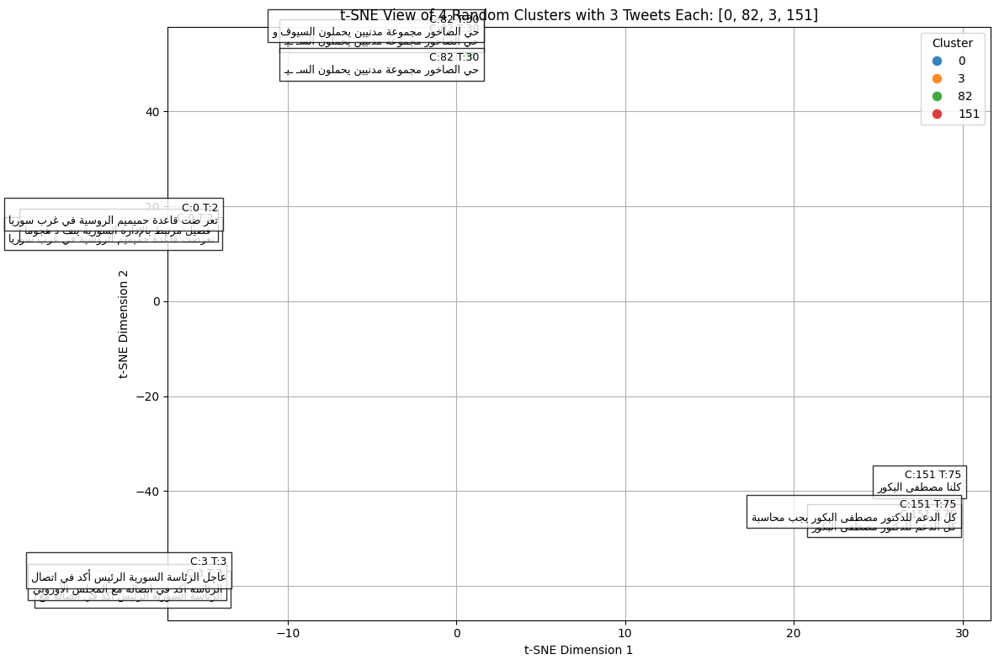

In [ ]:
#@title Samples
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.manifold import TSNE
import numpy as np
import pandas as pd
import arabic_reshaper
from bidi.algorithm import get_display
import random

# DBSCAN clustering
best_params_eps = 0.16
best_params_min_samples = 3
dbscan = DBSCAN(eps=best_params_eps, min_samples=best_params_min_samples, metric='cosine')
cluster_labels = dbscan.fit_predict(evaluation_embeddings)

# t-SNE for 2D visualization
tsne = TSNE(n_components=2, random_state=42, init='pca')
reduced_embeddings = tsne.fit_transform(evaluation_embeddings)

# Create a DataFrame with all relevant info
vis_df = pd.DataFrame({
    'x': reduced_embeddings[:, 0],
    'y': reduced_embeddings[:, 1],
    'text': evaluation_df['Tweet Text'],
    'true_label': evaluation_df['event_label'],
    'cluster': cluster_labels
})

# Get unique non-noise clusters
valid_clusters = vis_df[vis_df['cluster'] != -1]['cluster'].unique().tolist()
random_clusters = random.sample(valid_clusters, min(4, len(valid_clusters)))

# Sample 3 random tweets from each selected cluster
selected_df = pd.concat([
    vis_df[vis_df['cluster'] == cl].sample(n=min(3, len(vis_df[vis_df['cluster'] == cl])), random_state=42)
    for cl in random_clusters
])

# Plot only the selected points
plt.figure(figsize=(12, 8))
sns.scatterplot(
    data=selected_df,
    x='x', y='y',
    hue='cluster',
    palette='tab10',
    s=80,
    alpha=0.9
)
plt.title(f"t-SNE View of 4 Random Clusters with 3 Tweets Each: {random_clusters}")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.grid(True)

# Annotate selected tweets with reshaped Arabic text
for idx, (_, row) in enumerate(selected_df.iterrows()):
    short_text = row['text'][:40].replace("\n", " ")
    reshaped_text = arabic_reshaper.reshape(short_text)
    bidi_text = get_display(reshaped_text)

    label_str = f"C:{row['cluster']} T:{row['true_label']}"
    full_annotation = get_display(arabic_reshaper.reshape(label_str + "\n" + short_text))

    # Apply vertical offset to reduce overlap
    y_offset = 4.0 * ((idx % 5) - 2)
    plt.text(
        row['x'] + 0.5, row['y'] + y_offset,
        full_annotation,
        fontsize=9,
        color='black',
        bbox=dict(facecolor='white', alpha=0.8),
        ha='right'
    )

plt.legend(title="Cluster", loc='upper right')
plt.tight_layout()
plt.show()


## DBSCAN, With mBERT Embedding + Named Entities

In [ ]:
# @title Install  mbert
# from bertopic import BERTopic
from sentence_transformers import SentenceTransformer

# Use Arabic sentence transformer model
embedding_model = SentenceTransformer("sentence-transformers/LaBSE")

# Create and fit BERTopic model
# topic_model = BERTopic(embedding_model=embedding_model, language="arabic")



modules.json:   0%|          | 0.00/461 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/804 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.88G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/397 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/114 [00:00<?, ?B/s]

2_Dense/pytorch_model.bin:   0%|          | 0.00/2.36M [00:00<?, ?B/s]

2_Dense/model.safetensors:   0%|          | 0.00/2.36M [00:00<?, ?B/s]

In [ ]:
#@title Embedding the Tweets
# Imports
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from sklearn.decomposition import PCA
import pandas as pd
import numpy as np
from tqdm import tqdm

# tweets = df['Tweet Text'].tolist()
# embeddings = embedding_model.encode(tweets, show_progress_bar=True)


In [ ]:
#@title Embedding the Named Entities
# import ast
# import re

# def clean_hashtag_entry(entry):
#     try:
#         # Step 1: Flatten if it’s a nested list like [[...]]
#         if isinstance(entry, list) and len(entry) == 1 and isinstance(entry[0], list):
#             entry = entry[0]

#         # Step 2: Join everything into one string
#         if isinstance(entry, list):
#             entry = ''.join(entry)

#         # Step 3: Remove outer brackets and unescape
#         entry = entry.strip()

#         # Step 4: Use regex to extract valid Arabic hashtags (words)
#         # This captures Arabic words, hashtags, or unicode escapes
#         words = re.findall(r'[\u0600-\u06FF#\w]+', entry)
#         return words
#     except Exception as e:
#         return []

# # Apply cleaning function
# df['hashtags'] = df['Hashtags'].apply(clean_hashtag_entry)

# # Preview
# df['hashtags'].head()
# Helper to embed list of tokens (e.g., hashtags or named entities)
# Convert stringifNied lists to Python lists (e.g. ["flood", "storm"] → ['flood', 'storm'])
if isinstance(df['Named Entities'].iloc[0], str):
    df['Named Entities'] = df['Named Entities'].apply(eval)

if isinstance(df['Hashtags'].iloc[0], str):
    df['Hashtags'] = df['Hashtags'].apply(eval)

def embed_and_average(token_lists):
    results = []
    for tokens in tqdm(token_lists, desc="Embedding token lists"):
        if not tokens:
            results.append(np.zeros(768))  # Return zero-vector for empty input
        else:
            token_embeds = embedding_model.encode(tokens)
            avg_embedding = np.mean(token_embeds, axis=0)
            results.append(avg_embedding)
    return np.vstack(results)

# Embed both columns
named_entity_embeddings = embed_and_average(df['Named Entities'])
hashtag_embeddings = embed_and_average(df['Hashtags'])


Embedding token lists: 100%|██████████| 6998/6998 [26:40<00:00,  4.37it/s]


In [ ]:

#@title  PCA Reduction to 16D
pca_ne = PCA(n_components=64)
pca_hs = PCA(n_components=64)

ne_embeddings_32d = pca_ne.fit_transform(named_entity_embeddings)
hs_embeddings_32d = pca_hs.fit_transform(hashtag_embeddings)


In [ ]:
#@title Save the Embedding
# Convert embeddings to a regular list
# df['arabert_embeddings'] = embeddings.tolist()
# Save back to the DataFrame
df['named_entities_embedding_32d'] = ne_embeddings_32d.tolist()
df['hashtags_embedding_32d'] = hs_embeddings_32d.tolist()

# # Convert to DataFrame
# embedding_df = pd.DataFrame(embeddings)

# # Save
# embedding_df.to_csv("tweet_embeddings.csv", index=False)


In [ ]:
#  @title Load the embedding for the tuning and evaluation df
import numpy as np

# Convert and concatenate for tuning set
tuning_tweet_emb = np.vstack(tuning_df['arabert_embeddings'].apply(np.array).values)
tuning_ne_emb = np.vstack(tuning_df['named_entities_embedding_32d'].apply(np.array).values)
tuning_hs_emb = np.vstack(tuning_df['hashtags_embedding_32d'].apply(np.array).values)

# Final concatenated embedding: 768 + 32 + 32 = 832 dimensions
tuning_embeddings = np.hstack([tuning_tweet_emb, tuning_ne_emb, tuning_hs_emb])

# Convert and concatenate for evaluation set
evaluation_tweet_emb = np.vstack(evaluation_df['arabert_embeddings'].apply(np.array).values)
evaluation_ne_emb = np.vstack(evaluation_df['named_entities_embedding_32d'].apply(np.array).values)
evaluation_hs_emb = np.vstack(evaluation_df['hashtags_embedding_32d'].apply(np.array).values)

evaluation_embeddings = np.hstack([evaluation_tweet_emb, evaluation_ne_emb, evaluation_hs_emb])

# Check shapes
print(f"Tuning embeddings shape: {tuning_embeddings.shape}")
print(f"Evaluation embeddings shape: {evaluation_embeddings.shape}")


Tuning embeddings shape: (934, 896)
Evaluation embeddings shape: (6064, 896)


In [ ]:

#@title Define range of DBSCAN parameters to tune
eps_values = np.arange(0.02, 0.17, 0.01)        # Distance threshold
# eps_values = np.arange(0.11, 0.15, 0.01)        # Distance threshold
min_samples_values = np.arange(3,8,1)         # Minimum samples in neighborhood
dim_values = [32, 64, 96, 128, 160, 192, 256, 320, 384, 448, 512, 640, 768,800,896]
best_score = -1
best_params = None


In [ ]:
#@title Analyze the Effect of DBSCAN's epsilon Parameter on Clustering Results
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results_tuning = []
results_eval = []

# Tune over eps
for eps in eps_values:
    for min_samples in min_samples_values:
        # --- Tuning ---
        dbscan_tuning = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

        if len(set(cluster_labels_tuning)) > 1 and (cluster_labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, cluster_labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- Evaluation ---
        dbscan_eval = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_eval = dbscan_eval.fit_predict(evaluation_embeddings)

        if len(set(cluster_labels_eval)) > 1 and (cluster_labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, cluster_labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# Aggregate over min_samples
agg_tuning = df_tuning.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval = df_eval.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()



Best eps based on NMI (Tuning Set): eps = 0.13, NMI = 0.2469


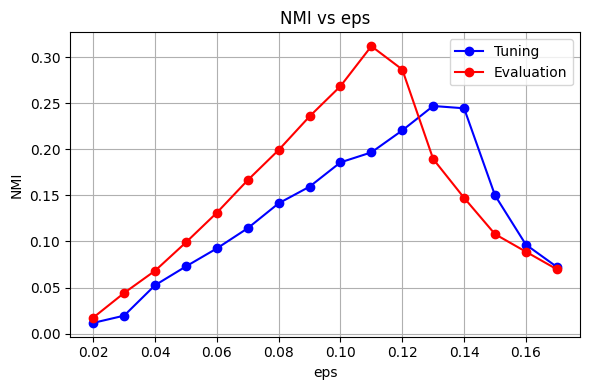

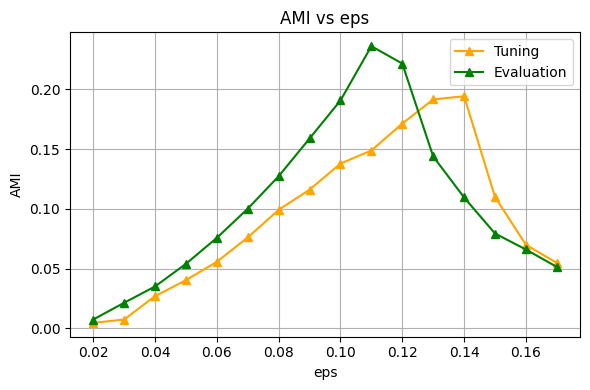

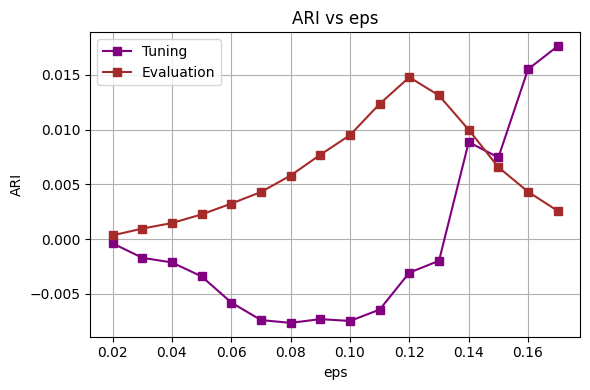

In [ ]:
#@title the Effect of DBSCAN's epsilon Parameter on Clustering Result

# Print best eps based on NMI from tuning set
best_eps_row = agg_tuning.loc[agg_tuning['nmi'].idxmax()]
print(f"Best eps based on NMI (Tuning Set): eps = {best_eps_row['eps']:.2f}, NMI = {best_eps_row['nmi']:.4f}")

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs eps')
plt.xlabel('eps')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ami'], marker='^', color='orange', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs eps')
plt.xlabel('eps')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ari'], marker='s', color='purple', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs eps')
plt.xlabel('eps')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Analyze the Effect of DBSCAN's Min Samples   Parameter on Clustering Result

true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results_tuning = []
results_eval = []

# Iterate over eps and min_samples combinations
for eps in eps_values:
    for min_samples in min_samples_values:
        # --- Tuning ---
        dbscan_tuning = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

        if len(set(cluster_labels_tuning)) > 1 and (cluster_labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, cluster_labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- Evaluation ---
        dbscan_eval = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_eval = dbscan_eval.fit_predict(evaluation_embeddings)

        if len(set(cluster_labels_eval)) > 1 and (cluster_labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, cluster_labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# === Aggregate over eps to study the effect of min_samples ===
agg_tuning_min = df_tuning.groupby('min_samples')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval_min = df_eval.groupby('min_samples')[['nmi', 'ari', 'ami']].mean().reset_index()



Best min_samples based on NMI (Tuning Set): min_samples = 3, NMI = 0.1679


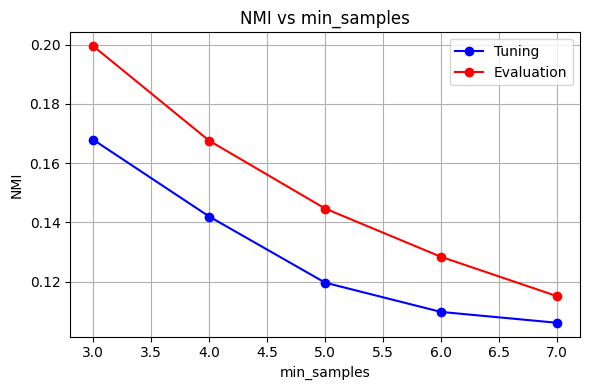

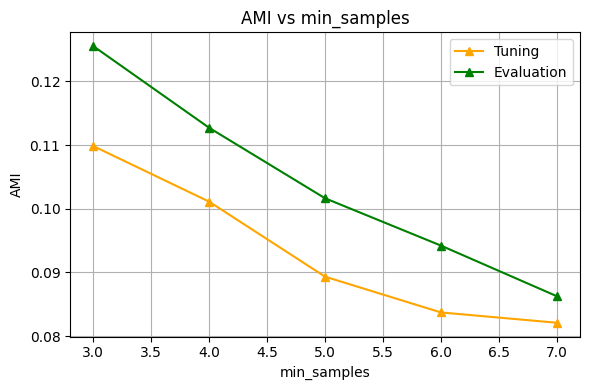

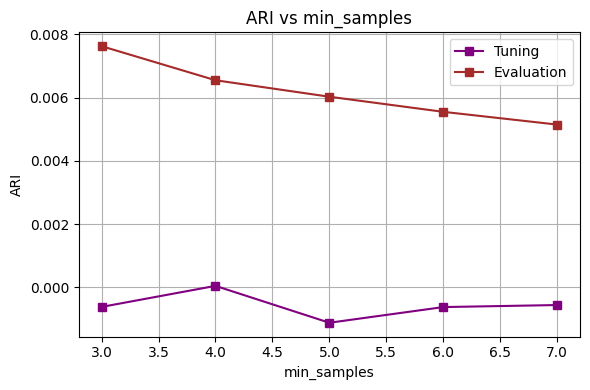

In [ ]:
#@title Analyze the Effect of DBSCAN's Min Samples   Parameter on Clustering Result

# Print best min_samples based on NMI from tuning set
best_minsample_row = agg_tuning_min.loc[agg_tuning_min['nmi'].idxmax()]
print(f"Best min_samples based on NMI (Tuning Set): min_samples = {int(best_minsample_row['min_samples'])}, NMI = {best_minsample_row['nmi']:.4f}")

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['ami'], marker='^', color='orange', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['ari'], marker='s', color='purple', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Analyze the Effect of PCA Dimensionality Reduction on DBSCAN Clustering Result

from sklearn.decomposition import PCA
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score
from sklearn.cluster import DBSCAN

# --- Settings ---

# dim_values = [32, 64, 96, 128, 160, 192, 256, 320, 384, 448, 512, 640, 768]
eps_best = 0.11
min_samples_best = 3

# True labels
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

dim_results = []

for dim in dim_values:
    # Reduce embeddings
    pca = PCA(n_components=dim)
    reduced_tuning = pca.fit_transform(tuning_embeddings)
    reduced_eval = pca.transform(evaluation_embeddings)

    # --- Tuning clustering ---
    dbscan_tuning = DBSCAN(eps=eps_best, min_samples=min_samples_best, metric='cosine')
    cluster_tuning = dbscan_tuning.fit_predict(reduced_tuning)

    if len(set(cluster_tuning)) > 1 and (cluster_tuning != -1).any():
        nmi = normalized_mutual_info_score(true_labels_tuning, cluster_tuning)
        ari = adjusted_rand_score(true_labels_tuning, cluster_tuning)
        ami = adjusted_mutual_info_score(true_labels_tuning, cluster_tuning)
    else:
        nmi = ari = ami = 0

    # --- Eval clustering ---
    dbscan_eval = DBSCAN(eps=eps_best, min_samples=min_samples_best, metric='cosine')
    cluster_eval = dbscan_eval.fit_predict(reduced_eval)

    if len(set(cluster_eval)) > 1 and (cluster_eval != -1).any():
        nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_eval)
        ari_e = adjusted_rand_score(true_labels_eval, cluster_eval)
        ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_eval)
    else:
        nmi_e = ari_e = ami_e = 0

    dim_results.append({
        'dim': dim,
        'nmi_tuning': nmi,
        'ari_tuning': ari,
        'ami_tuning': ami,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

# Convert to DataFrame
dim_df = pd.DataFrame(dim_results)


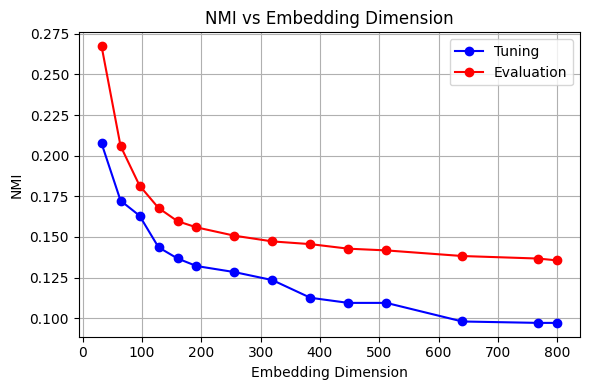

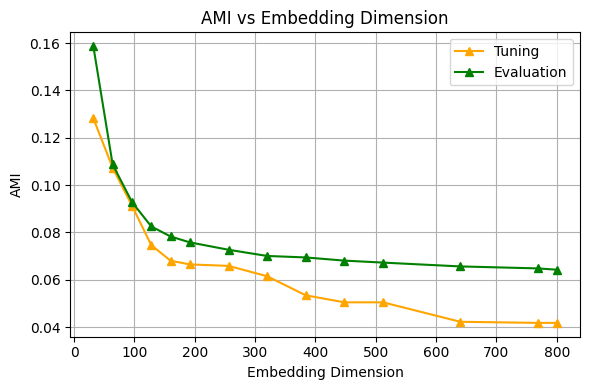

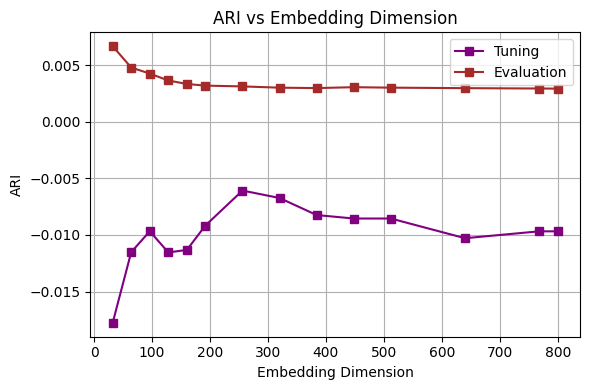

In [ ]:
#@title the Effect of PCA Dimensionality Reduction on DBSCAN Clustering Performance

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['nmi_tuning'], marker='o', label='Tuning', color='blue')
plt.plot(dim_df['dim'], dim_df['nmi_eval'], marker='o', label='Evaluation', color='red')
plt.title('NMI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['ami_tuning'], marker='^', label='Tuning', color='orange')
plt.plot(dim_df['dim'], dim_df['ami_eval'], marker='^', label='Evaluation', color='green')
plt.title('AMI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['ari_tuning'], marker='s', label='Tuning', color='purple')
plt.plot(dim_df['dim'], dim_df['ari_eval'], marker='s', label='Evaluation', color='brown')
plt.title('ARI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:

#@title Grid search on tuning set
from sklearn.decomposition import PCA
from umap import UMAP
from sklearn.cluster import DBSCAN
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

# Parameters for grid search
reducers = {
    'PCA': PCA,
    'UMAP': UMAP
}

true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results = []

# Grid search on tuning set
for reducer_name, reducer_cls in reducers.items():
    for dim in dim_values:
        print(f"Reducing tuning data to {dim}D using {reducer_name}...")
        reducer = reducer_cls(n_components=dim, random_state=42)
        reduced_tuning = reducer.fit_transform(tuning_embeddings)

        for eps in eps_values:
            for min_samples in min_samples_values:
                dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
                cluster_labels = dbscan.fit_predict(reduced_tuning)

                if len(set(cluster_labels)) > 1 and (cluster_labels != -1).any():
                    nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels)
                    ari = adjusted_rand_score(true_labels_tuning, cluster_labels)
                    ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels)
                else:
                    nmi = ari = ami = 0

                results.append({
                    'reducer': reducer_name,
                    'dim': dim,
                    'eps': eps,
                    'min_samples': min_samples,
                    'nmi': nmi,
                    'ari': ari,
                    'ami': ami,
                    'reduced_tuning': reduced_tuning
                })

results_df = pd.DataFrame(results)


Reducing tuning data to 32D using PCA...
Reducing tuning data to 64D using PCA...
Reducing tuning data to 96D using PCA...
Reducing tuning data to 128D using PCA...
Reducing tuning data to 160D using PCA...
Reducing tuning data to 192D using PCA...
Reducing tuning data to 256D using PCA...
Reducing tuning data to 320D using PCA...
Reducing tuning data to 384D using PCA...
Reducing tuning data to 448D using PCA...
Reducing tuning data to 512D using PCA...
Reducing tuning data to 640D using PCA...
Reducing tuning data to 768D using PCA...
Reducing tuning data to 800D using PCA...
Reducing tuning data to 32D using UMAP...
Reducing tuning data to 64D using UMAP...
Reducing tuning data to 96D using UMAP...
Reducing tuning data to 128D using UMAP...
Reducing tuning data to 160D using UMAP...
Reducing tuning data to 192D using UMAP...
Reducing tuning data to 256D using UMAP...
Reducing tuning data to 320D using UMAP...
Reducing tuning data to 384D using UMAP...
Reducing tuning data to 448D us

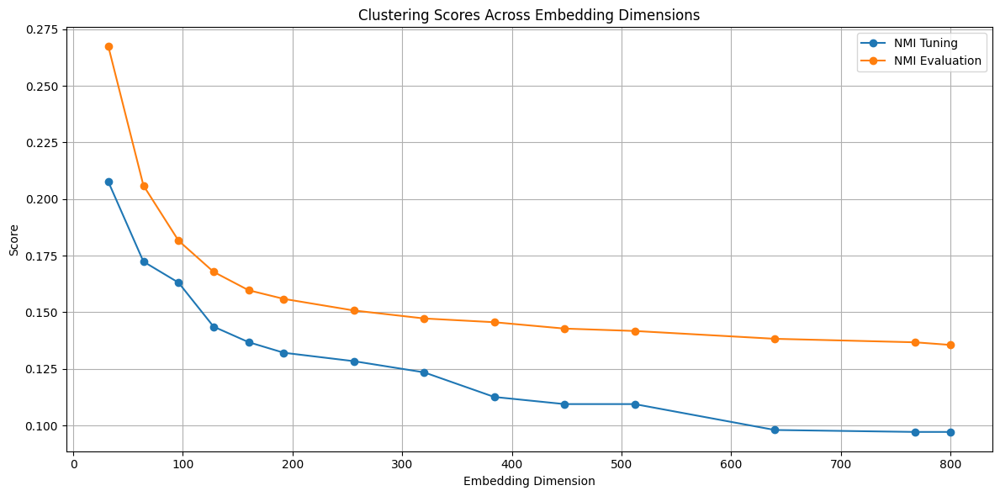

In [ ]:
#@title Nmi vs  Dim
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Plot NMI
plt.plot(dim_df['dim'], dim_df['nmi_tuning'], label='NMI Tuning', marker='o')
plt.plot(dim_df['dim'], dim_df['nmi_eval'], label='NMI Evaluation', marker='o')

# # Plot ARI
# plt.plot(dim_df['dim'], dim_df['ari_tuning'], label='ARI Tuning', marker='s')
# plt.plot(dim_df['dim'], dim_df['ari_eval'], label='ARI Evaluation', marker='s')

# # Plot AMI
# plt.plot(dim_df['dim'], dim_df['ami_tuning'], label='AMI Tuning', marker='^')
# plt.plot(dim_df['dim'], dim_df['ami_eval'], label='AMI Evaluation', marker='^')

plt.title('Clustering Scores Across Embedding Dimensions')
plt.xlabel('Embedding Dimension')
plt.ylabel('Score')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Best Params
# Get best tuning config by NMI
best_config = results_df.loc[results_df['nmi'].idxmax()]
print("Best NMI config on tuning set:")
print(best_config[['reducer', 'dim', 'eps', 'min_samples', 'nmi', 'ari', 'ami']])

# Using best config, transform evaluation embeddings and evaluate clustering
best_reducer_cls = reducers[best_config['reducer']]
best_dim = best_config['dim']
best_eps = best_config['eps']
best_min_samples = best_config['min_samples']

reducer = best_reducer_cls(n_components=best_dim, random_state=42)
reduced_tuning_best = reducer.fit_transform(tuning_embeddings)
reduced_eval_best = reducer.transform(evaluation_embeddings)

dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

cluster_labels_tuning = dbscan.fit_predict(reduced_tuning_best)
cluster_labels_eval = dbscan.fit_predict(reduced_eval_best)

def safe_scores(true, pred):
    if len(set(pred)) > 1 and (pred != -1).any():
        nmi = normalized_mutual_info_score(true, pred)
        ari = adjusted_rand_score(true, pred)
        ami = adjusted_mutual_info_score(true, pred)
    else:
        nmi = ari = ami = 0
    return nmi, ari, ami

nmi_tuning, ari_tuning, ami_tuning = safe_scores(true_labels_tuning, cluster_labels_tuning)
nmi_eval, ari_eval, ami_eval = safe_scores(true_labels_eval, cluster_labels_eval)

print("\nEvaluation metrics with best tuning config:")
print(f"NMI: {nmi_eval:.4f}, ARI: {ari_eval:.4f}, AMI: {ami_eval:.4f}")

# Summarize metrics for each dimension using best eps and min_samples
dim_metrics = []



Best NMI config on tuning set:
reducer             PCA
dim                  32
eps                0.17
min_samples           3
nmi            0.323321
ari            0.002542
ami            0.241222
Name: 75, dtype: object

Evaluation metrics with best tuning config:
NMI: 0.1352, ARI: 0.0035, AMI: 0.0709


In [ ]:
#@title Summarize clustering scores across embedding dimensions for best tuning hyperparameters

dim_metrics = []

for dim in dim_values:
    # Initialize reducer with the current dimension
    reducer = best_reducer_cls(n_components=dim, random_state=42)

    # Fit transform tuning embeddings and transform evaluation embeddings
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    # Initialize DBSCAN with best hyperparameters from tuning
    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    # Predict cluster labels on tuning and evaluation sets
    labels_tuning = dbscan.fit_predict(reduced_tuning)
    labels_eval = dbscan.fit_predict(reduced_eval)

    # Compute scores safely
    nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, labels_tuning)
    nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, labels_eval)

    # Append results
    dim_metrics.append({
        'dim': dim,
        'nmi_tuning': nmi_t,
        'ari_tuning': ari_t,
        'ami_tuning': ami_t,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

# Create DataFrame for easier visualization
dim_df = pd.DataFrame(dim_metrics)

print("\nSummary of clustering metrics across embedding dimensions:")
print(dim_df.to_string(index=False))



Summary of clustering metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval
  32    0.323321    0.002542    0.241222  0.135171  0.003473  0.070897
  64    0.237280   -0.014795    0.154976  0.322932  0.011362  0.214525
  96    0.211968   -0.013946    0.137568  0.305120  0.008743  0.187901
 128    0.192579   -0.015491    0.124422  0.274507  0.007555  0.160402
 160    0.186580   -0.014025    0.118801  0.263755  0.007180  0.152550
 192    0.177410   -0.011749    0.112732  0.256052  0.006917  0.146688
 256    0.174299   -0.010812    0.105685  0.247086  0.006589  0.139412
 320    0.159310   -0.012190    0.090569  0.239600  0.006235  0.134075
 384    0.157514   -0.012552    0.088677  0.235994  0.006171  0.131032
 448    0.157514   -0.012552    0.088677  0.233545  0.006023  0.127704
 512    0.157514   -0.012552    0.088677  0.231687  0.005928  0.126139
 640    0.157514   -0.012552    0.088677  0.228365  0.005914  0.124172
 768    0.157514 

In [ ]:
#@title The Results of the Clustering
dim_metrics = []

for dim in dim_values:
    reducer = best_reducer_cls(n_components=dim, random_state=42)
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    print(f"Using eps = {best_eps}, min_samples = {best_min_samples} for dim = {dim}")

    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    labels_tuning = dbscan.fit_predict(reduced_tuning)
    labels_eval = dbscan.fit_predict(reduced_eval)

    nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, labels_tuning)
    nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, labels_eval)

    dim_metrics.append({
        'dim': dim,
        'nmi_tuning': nmi_t,
        'ari_tuning': ari_t,
        'ami_tuning': ami_t,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

dim_df = pd.DataFrame(dim_metrics)

print("\nSummary of metrics across embedding dimensions:")
print(dim_df.to_string(index=False))


Using eps = 0.16999999999999996, min_samples = 3 for dim = 32
Using eps = 0.16999999999999996, min_samples = 3 for dim = 64
Using eps = 0.16999999999999996, min_samples = 3 for dim = 96
Using eps = 0.16999999999999996, min_samples = 3 for dim = 128
Using eps = 0.16999999999999996, min_samples = 3 for dim = 160
Using eps = 0.16999999999999996, min_samples = 3 for dim = 192
Using eps = 0.16999999999999996, min_samples = 3 for dim = 256
Using eps = 0.16999999999999996, min_samples = 3 for dim = 320
Using eps = 0.16999999999999996, min_samples = 3 for dim = 384
Using eps = 0.16999999999999996, min_samples = 3 for dim = 448
Using eps = 0.16999999999999996, min_samples = 3 for dim = 512
Using eps = 0.16999999999999996, min_samples = 3 for dim = 640
Using eps = 0.16999999999999996, min_samples = 3 for dim = 768
Using eps = 0.16999999999999996, min_samples = 3 for dim = 800

Summary of metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval
 

In [ ]:
#@title Clustering and Topic Modeling Metrics Summary Across Embedding Dimensions
from sklearn.metrics import silhouette_score
from gensim.corpora import Dictionary
from gensim.models.coherencemodel import CoherenceModel

def safe_silhouette_score(X, labels):
    if len(set(labels)) > 1 and len(X) > len(set(labels)):
        return silhouette_score(X, labels, metric='cosine')
    return -1

def get_topic_coherence(texts, labels, coherence_type='c_v'):
    clustered_docs = {}
    for text, label in zip(texts, labels):
        if label == -1:
            continue
        clustered_docs.setdefault(label, []).append(text)

    topics = [docs for docs in clustered_docs.values() if len(docs) >= 3]

    if len(topics) == 0:
        return -1

    tokenized_topics = [[word for doc in topic for word in doc.split()] for topic in topics]

    dictionary = Dictionary(tokenized_topics)
    corpus = [dictionary.doc2bow(text) for text in tokenized_topics]

    coherence_model = CoherenceModel(
        topics=tokenized_topics,
        texts=tokenized_topics,
        corpus=corpus,
        dictionary=dictionary,
        coherence=coherence_type
    )

    return coherence_model.get_coherence()

# Ground truth number of events (true clusters)
true_events_tuning = len(set(tuning_df['event_label']))
true_events_eval = len(set(evaluation_df['event_label']))

# Initialize list for metrics
additional_metrics = []

for dim in dim_values:
    reducer = best_reducer_cls(n_components=dim, random_state=42)
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    # Tuning
    labels_tuning = dbscan.fit_predict(reduced_tuning)
    silhouette_t = safe_silhouette_score(reduced_tuning, labels_tuning)
    num_clusters_t = len(set(labels_tuning)) - (1 if -1 in labels_tuning else 0)
    coherence_t_cv = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='c_v')
    coherence_t_umass = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='u_mass')

    # Evaluation
    labels_eval = dbscan.fit_predict(reduced_eval)
    silhouette_e = safe_silhouette_score(reduced_eval, labels_eval)
    num_clusters_e = len(set(labels_eval)) - (1 if -1 in labels_eval else 0)
    coherence_e_cv = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='c_v')
    coherence_e_umass = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='u_mass')

    additional_metrics.append({
        'dim': dim,
        'true_events_tuning': true_events_tuning,
        'true_events_eval': true_events_eval,
        'silhouette_tuning': silhouette_t,
        'num_clusters_tuning': num_clusters_t,
        'coherence_tuning_c_v': coherence_t_cv,
        'coherence_tuning_u_mass': coherence_t_umass,
        'silhouette_eval': silhouette_e,
        'num_clusters_eval': num_clusters_e,
        'coherence_eval_c_v': coherence_e_cv,
        'coherence_eval_u_mass': coherence_e_umass
    })

# Merge with original dim_df
extra_df = pd.DataFrame(additional_metrics)
dim_df = pd.merge(dim_df, extra_df, on='dim')

# Display full summary
print("\nSummary of all clustering metrics across embedding dimensions:")
print(dim_df.to_string(index=False))



Summary of all clustering metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval  true_events_tuning  true_events_eval  silhouette_tuning  num_clusters_tuning  coherence_tuning_c_v  coherence_tuning_u_mass  silhouette_eval  num_clusters_eval  coherence_eval_c_v  coherence_eval_u_mass
  32    0.323321    0.002542    0.241222  0.135171  0.003473  0.070897                  31               103          -0.191811                   29              0.764070                -0.716984        -0.477896                 88            0.616866              -0.757664
  64    0.237280   -0.014795    0.154976  0.322932  0.011362  0.214525                  31               103          -0.204286                   25              0.819784                -0.586250        -0.332924                172            0.715289              -1.102086
  96    0.211968   -0.013946    0.137568  0.305120  0.008743  0.187901                  31               103   

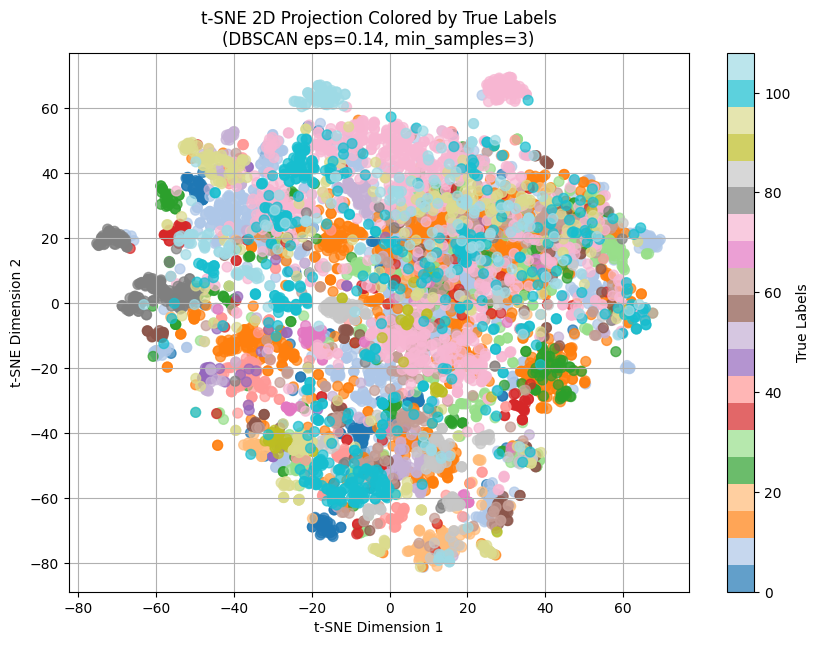

In [ ]:
#@title Visualisation
from sklearn.cluster import DBSCAN
from sklearn.manifold import TSNE
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

true_labels = evaluation_df['event_label'].values  # Use evaluation labels
best_params_eps=0.14
best_params_min_samples=3

# Run DBSCAN with best params on evaluation embeddings
best_dbscan = DBSCAN(eps=best_params_eps, min_samples=int(best_params_min_samples), metric='cosine')
best_cluster_labels = best_dbscan.fit_predict(evaluation_embeddings)

# t-SNE dimensionality reduction to 2D on evaluation embeddings
tsne = TSNE(n_components=2, random_state=42, init='pca')
reduced_embeddings = tsne.fit_transform(evaluation_embeddings)

# Plotting
plt.figure(figsize=(10, 7))
scatter = plt.scatter(
    reduced_embeddings[:, 0], reduced_embeddings[:, 1],
    c=true_labels, cmap='tab20', alpha=0.7, s=50
)
plt.colorbar(scatter, label='True Labels')
plt.title(f"t-SNE 2D Projection Colored by True Labels\n(DBSCAN eps={best_params_eps:.2f}, min_samples={int(best_params_min_samples)})")
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.grid(True)
plt.show()


## DBSCAN, With mBERT Embedding

In [ ]:
# @title Install  Arabert and BERTopic
# from bertopic import BERTopic
from sentence_transformers import SentenceTransformer

# Use Arabic sentence transformer model
embedding_model = SentenceTransformer("sentence-transformers/LaBSE")

# Create and fit BERTopic model
# topic_model = BERTopic(embedding_model=embedding_model, language="arabic")



modules.json:   0%|          | 0.00/461 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/2.02k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/804 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.88G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/397 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/5.22M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/9.62M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/114 [00:00<?, ?B/s]

2_Dense/pytorch_model.bin:   0%|          | 0.00/2.36M [00:00<?, ?B/s]

2_Dense/model.safetensors:   0%|          | 0.00/2.36M [00:00<?, ?B/s]

In [ ]:
#@title Embeddding the Tweets
tweets = df['Tweet Text'].tolist()
embeddings = embedding_model.encode(tweets, show_progress_bar=True)


Batches:   0%|          | 0/219 [00:00<?, ?it/s]

In [ ]:
#@title Save the Embedding
# Convert embeddings to a regular list
df['mbert_embeddings'] = embeddings.tolist()

# # Convert to DataFrame
# embedding_df = pd.DataFrame(embeddings)

# # Save
# embedding_df.to_csv("tweet_embeddings.csv", index=False)


In [ ]:
#  @title Load the embedding for the tuning and evaluation df

# Convert list of embeddings (stored as lists) into 2D numpy arrays
tuning_embeddings = np.vstack(tuning_df['mbert_embeddings'].apply(np.array).values)
evaluation_embeddings = np.vstack(evaluation_df['mbert_embeddings'].apply(np.array).values)

print(f"Tuning embeddings shape: {tuning_embeddings.shape}")
print(f"Evaluation embeddings shape: {evaluation_embeddings.shape}")


Tuning embeddings shape: (934, 768)
Evaluation embeddings shape: (6064, 768)


In [ ]:

#@title Define range of DBSCAN parameters to tune
eps_values = np.arange(0.02, 0.66, 0.02)        # Distance threshold
# eps_values = np.arange(0.11, 0.15, 0.01)        # Distance threshold
min_samples_values = np.arange(3,10,1)         # Minimum samples in neighborhood
dim_values = [32, 64, 96, 128, 160, 192, 256, 320, 384, 448, 512, 640, 768]
best_score = -1
best_params = None


In [ ]:
#@title Analyze the Effect of DBSCAN's epsilon Parameter on Clustering Results
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results_tuning = []
results_eval = []

# Tune over eps
for eps in eps_values:
    for min_samples in min_samples_values:
        # --- Tuning ---
        dbscan_tuning = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

        if len(set(cluster_labels_tuning)) > 1 and (cluster_labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, cluster_labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- Evaluation ---
        dbscan_eval = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_eval = dbscan_eval.fit_predict(evaluation_embeddings)

        if len(set(cluster_labels_eval)) > 1 and (cluster_labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, cluster_labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# Aggregate over min_samples
agg_tuning = df_tuning.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval = df_eval.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()



Best eps based on NMI (Tuning Set): eps = 0.32, NMI = 0.4060


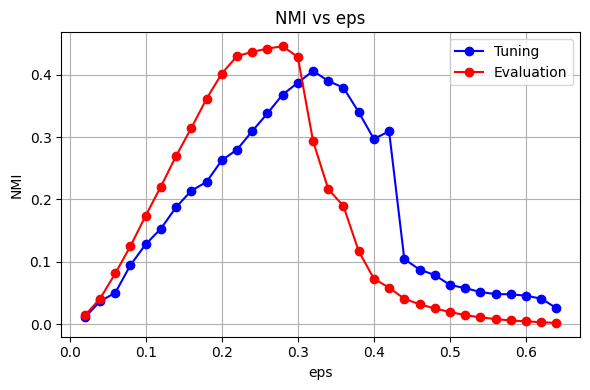

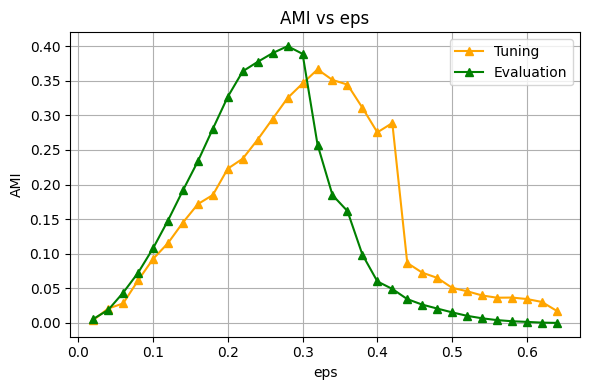

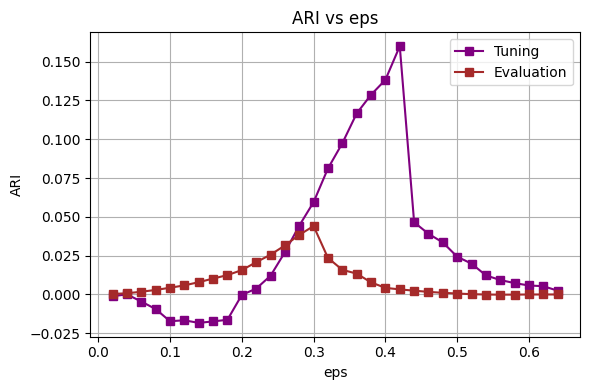

In [ ]:
#@title the Effect of DBSCAN's epsilon Parameter on Clustering Result

# Print best eps based on NMI from tuning set
best_eps_row = agg_tuning.loc[agg_tuning['nmi'].idxmax()]
print(f"Best eps based on NMI (Tuning Set): eps = {best_eps_row['eps']:.2f}, NMI = {best_eps_row['nmi']:.4f}")

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs eps')
plt.xlabel('eps')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ami'], marker='^', color='orange', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs eps')
plt.xlabel('eps')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ari'], marker='s', color='purple', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs eps')
plt.xlabel('eps')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Analyze the Effect of DBSCAN's Min Samples   Parameter on Clustering Result

true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results_tuning = []
results_eval = []

# Iterate over eps and min_samples combinations
for eps in eps_values:
    for min_samples in min_samples_values:
        # --- Tuning ---
        dbscan_tuning = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

        if len(set(cluster_labels_tuning)) > 1 and (cluster_labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, cluster_labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- Evaluation ---
        dbscan_eval = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_eval = dbscan_eval.fit_predict(evaluation_embeddings)

        if len(set(cluster_labels_eval)) > 1 and (cluster_labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, cluster_labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# === Aggregate over eps to study the effect of min_samples ===
agg_tuning_min = df_tuning.groupby('min_samples')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval_min = df_eval.groupby('min_samples')[['nmi', 'ari', 'ami']].mean().reset_index()



Best min_samples based on NMI (Tuning Set): min_samples = 3, NMI = 0.2178


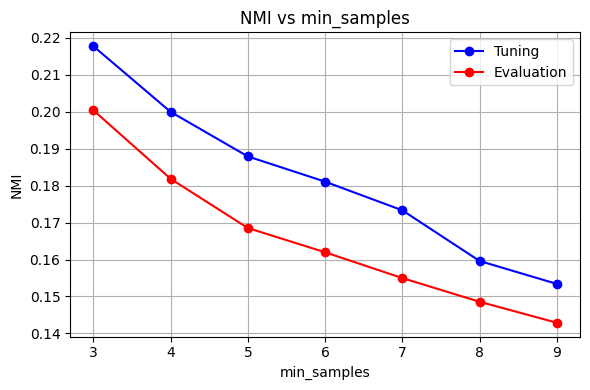

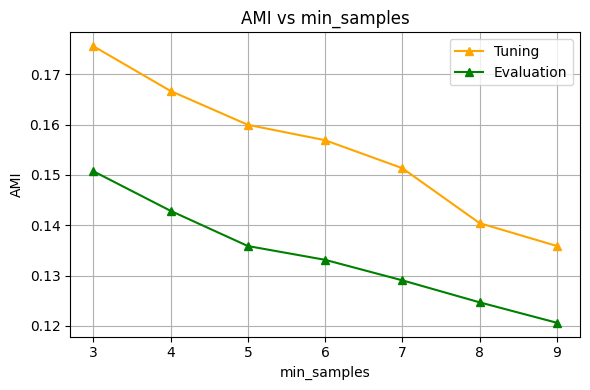

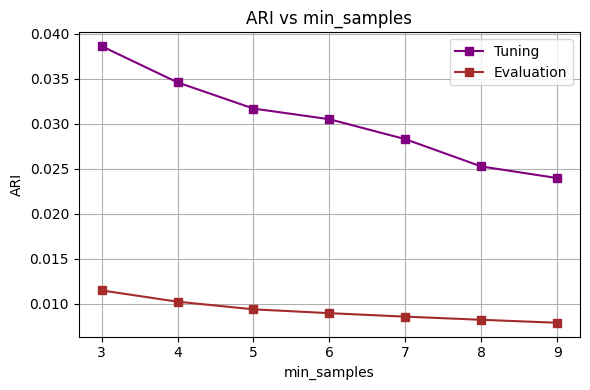

In [ ]:
#@title Analyze the Effect of DBSCAN's Min Samples   Parameter on Clustering Result

# Print best min_samples based on NMI from tuning set
best_minsample_row = agg_tuning_min.loc[agg_tuning_min['nmi'].idxmax()]
print(f"Best min_samples based on NMI (Tuning Set): min_samples = {int(best_minsample_row['min_samples'])}, NMI = {best_minsample_row['nmi']:.4f}")

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['ami'], marker='^', color='orange', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['ari'], marker='s', color='purple', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Analyze the Effect of PCA Dimensionality Reduction on DBSCAN Clustering Result

from sklearn.decomposition import PCA
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score
from sklearn.cluster import DBSCAN

# --- Settings ---

dim_values = [32, 64, 96, 128, 160, 192, 256, 320, 384, 448, 512, 640, 768]
eps_best = 0.31
min_samples_best = 3

# True labels
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

dim_results = []

for dim in dim_values:
    # Reduce embeddings
    pca = PCA(n_components=dim)
    reduced_tuning = pca.fit_transform(tuning_embeddings)
    reduced_eval = pca.transform(evaluation_embeddings)

    # --- Tuning clustering ---
    dbscan_tuning = DBSCAN(eps=eps_best, min_samples=min_samples_best, metric='cosine')
    cluster_tuning = dbscan_tuning.fit_predict(reduced_tuning)

    if len(set(cluster_tuning)) > 1 and (cluster_tuning != -1).any():
        nmi = normalized_mutual_info_score(true_labels_tuning, cluster_tuning)
        ari = adjusted_rand_score(true_labels_tuning, cluster_tuning)
        ami = adjusted_mutual_info_score(true_labels_tuning, cluster_tuning)
    else:
        nmi = ari = ami = 0

    # --- Eval clustering ---
    dbscan_eval = DBSCAN(eps=eps_best, min_samples=min_samples_best, metric='cosine')
    cluster_eval = dbscan_eval.fit_predict(reduced_eval)

    if len(set(cluster_eval)) > 1 and (cluster_eval != -1).any():
        nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_eval)
        ari_e = adjusted_rand_score(true_labels_eval, cluster_eval)
        ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_eval)
    else:
        nmi_e = ari_e = ami_e = 0

    dim_results.append({
        'dim': dim,
        'nmi_tuning': nmi,
        'ari_tuning': ari,
        'ami_tuning': ami,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

# Convert to DataFrame
dim_df = pd.DataFrame(dim_results)


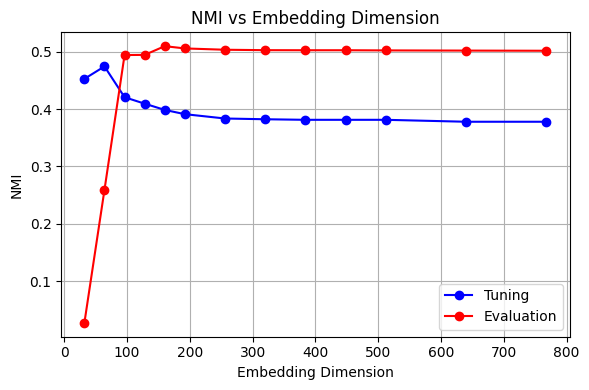

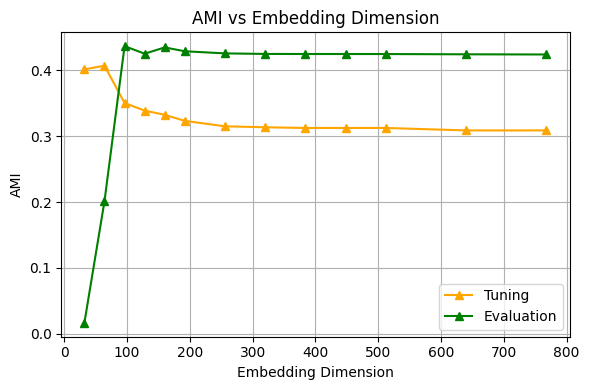

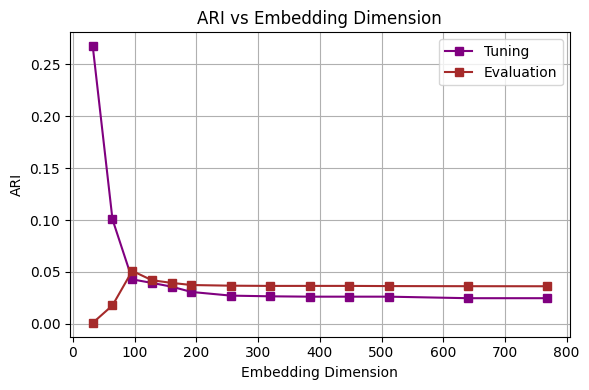

In [ ]:
#@title the Effect of PCA Dimensionality Reduction on DBSCAN Clustering Performance

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['nmi_tuning'], marker='o', label='Tuning', color='blue')
plt.plot(dim_df['dim'], dim_df['nmi_eval'], marker='o', label='Evaluation', color='red')
plt.title('NMI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['ami_tuning'], marker='^', label='Tuning', color='orange')
plt.plot(dim_df['dim'], dim_df['ami_eval'], marker='^', label='Evaluation', color='green')
plt.title('AMI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['ari_tuning'], marker='s', label='Tuning', color='purple')
plt.plot(dim_df['dim'], dim_df['ari_eval'], marker='s', label='Evaluation', color='brown')
plt.title('ARI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:

#@title Grid search on tuning set
from sklearn.decomposition import PCA
from umap import UMAP
from sklearn.cluster import DBSCAN
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

# Parameters for grid search
reducers = {
    'PCA': PCA,
    'UMAP': UMAP
}

true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results = []

# Grid search on tuning set
for reducer_name, reducer_cls in reducers.items():
    for dim in dim_values:
        print(f"Reducing tuning data to {dim}D using {reducer_name}...")
        reducer = reducer_cls(n_components=dim, random_state=42)
        reduced_tuning = reducer.fit_transform(tuning_embeddings)

        for eps in eps_values:
            for min_samples in min_samples_values:
                dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
                cluster_labels = dbscan.fit_predict(reduced_tuning)

                if len(set(cluster_labels)) > 1 and (cluster_labels != -1).any():
                    nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels)
                    ari = adjusted_rand_score(true_labels_tuning, cluster_labels)
                    ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels)
                else:
                    nmi = ari = ami = 0

                results.append({
                    'reducer': reducer_name,
                    'dim': dim,
                    'eps': eps,
                    'min_samples': min_samples,
                    'nmi': nmi,
                    'ari': ari,
                    'ami': ami,
                    'reduced_tuning': reduced_tuning
                })

results_df = pd.DataFrame(results)


Reducing tuning data to 32D using PCA...
Reducing tuning data to 64D using PCA...
Reducing tuning data to 96D using PCA...
Reducing tuning data to 128D using PCA...
Reducing tuning data to 160D using PCA...
Reducing tuning data to 192D using PCA...
Reducing tuning data to 256D using PCA...
Reducing tuning data to 320D using PCA...
Reducing tuning data to 384D using PCA...
Reducing tuning data to 448D using PCA...
Reducing tuning data to 512D using PCA...
Reducing tuning data to 640D using PCA...
Reducing tuning data to 768D using PCA...
Reducing tuning data to 32D using UMAP...
Reducing tuning data to 64D using UMAP...
Reducing tuning data to 96D using UMAP...
Reducing tuning data to 128D using UMAP...
Reducing tuning data to 160D using UMAP...
Reducing tuning data to 192D using UMAP...
Reducing tuning data to 256D using UMAP...
Reducing tuning data to 320D using UMAP...
Reducing tuning data to 384D using UMAP...
Reducing tuning data to 448D using UMAP...
Reducing tuning data to 512D u

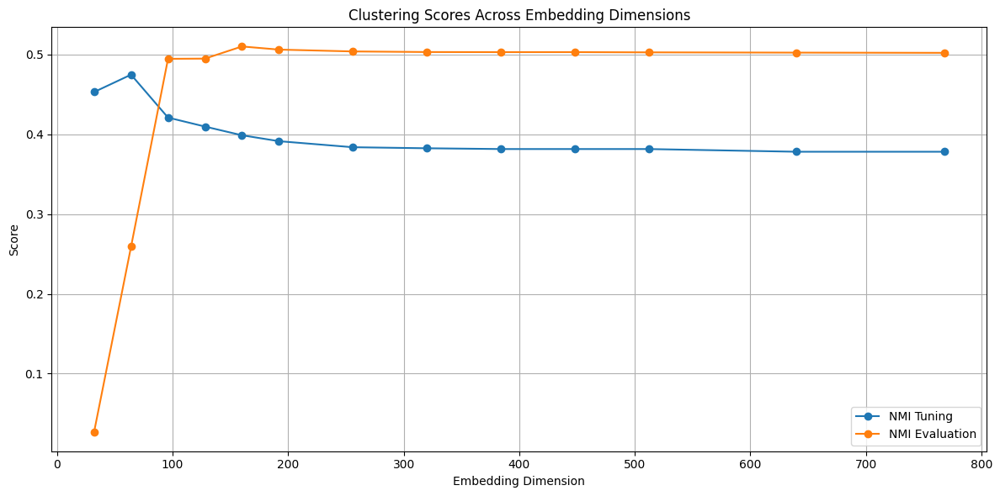

In [ ]:
#@title Nmi vs  Dim
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Plot NMI
plt.plot(dim_df['dim'], dim_df['nmi_tuning'], label='NMI Tuning', marker='o')
plt.plot(dim_df['dim'], dim_df['nmi_eval'], label='NMI Evaluation', marker='o')

# # Plot ARI
# plt.plot(dim_df['dim'], dim_df['ari_tuning'], label='ARI Tuning', marker='s')
# plt.plot(dim_df['dim'], dim_df['ari_eval'], label='ARI Evaluation', marker='s')

# # Plot AMI
# plt.plot(dim_df['dim'], dim_df['ami_tuning'], label='AMI Tuning', marker='^')
# plt.plot(dim_df['dim'], dim_df['ami_eval'], label='AMI Evaluation', marker='^')

plt.title('Clustering Scores Across Embedding Dimensions')
plt.xlabel('Embedding Dimension')
plt.ylabel('Score')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Best Params
# Get best tuning config by NMI
best_config = results_df.loc[results_df['nmi'].idxmax()]
print("Best NMI config on tuning set:")
print(best_config[['reducer', 'dim', 'eps', 'min_samples', 'nmi', 'ari', 'ami']])

# Using best config, transform evaluation embeddings and evaluate clustering
best_reducer_cls = reducers[best_config['reducer']]
best_dim = best_config['dim']
best_eps = best_config['eps']
best_min_samples = best_config['min_samples']

reducer = best_reducer_cls(n_components=best_dim, random_state=42)
reduced_tuning_best = reducer.fit_transform(tuning_embeddings)
reduced_eval_best = reducer.transform(evaluation_embeddings)

dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

cluster_labels_tuning = dbscan.fit_predict(reduced_tuning_best)
cluster_labels_eval = dbscan.fit_predict(reduced_eval_best)

def safe_scores(true, pred):
    if len(set(pred)) > 1 and (pred != -1).any():
        nmi = normalized_mutual_info_score(true, pred)
        ari = adjusted_rand_score(true, pred)
        ami = adjusted_mutual_info_score(true, pred)
    else:
        nmi = ari = ami = 0
    return nmi, ari, ami

nmi_tuning, ari_tuning, ami_tuning = safe_scores(true_labels_tuning, cluster_labels_tuning)
nmi_eval, ari_eval, ami_eval = safe_scores(true_labels_eval, cluster_labels_eval)

print("\nEvaluation metrics with best tuning config:")
print(f"NMI: {nmi_eval:.4f}, ARI: {ari_eval:.4f}, AMI: {ami_eval:.4f}")

# Summarize metrics for each dimension using best eps and min_samples
dim_metrics = []



Best NMI config on tuning set:
reducer             PCA
dim                  32
eps                0.28
min_samples           3
nmi            0.514034
ari            0.221627
ami            0.452159
Name: 91, dtype: object

Evaluation metrics with best tuning config:
NMI: 0.0578, ARI: 0.0025, AMI: 0.0347


In [ ]:
#@title Summarize clustering scores across embedding dimensions for best tuning hyperparameters

dim_metrics = []

for dim in dim_values:
    # Initialize reducer with the current dimension
    reducer = best_reducer_cls(n_components=dim, random_state=42)

    # Fit transform tuning embeddings and transform evaluation embeddings
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    # Initialize DBSCAN with best hyperparameters from tuning
    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    # Predict cluster labels on tuning and evaluation sets
    labels_tuning = dbscan.fit_predict(reduced_tuning)
    labels_eval = dbscan.fit_predict(reduced_eval)

    # Compute scores safely
    nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, labels_tuning)
    nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, labels_eval)

    # Append results
    dim_metrics.append({
        'dim': dim,
        'nmi_tuning': nmi_t,
        'ari_tuning': ari_t,
        'ami_tuning': ami_t,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

# Create DataFrame for easier visualization
dim_df = pd.DataFrame(dim_metrics)

print("\nSummary of clustering metrics across embedding dimensions:")
print(dim_df.to_string(index=False))



Summary of clustering metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval
  32    0.514034    0.221627    0.452159  0.057762  0.002455  0.034738
  64    0.441350    0.068780    0.378213  0.479013  0.051841  0.421654
  96    0.399791    0.031178    0.324108  0.493971  0.039671  0.422911
 128    0.377904    0.023684    0.308865  0.505973  0.034551  0.424728
 160    0.358954    0.012673    0.287157  0.514814  0.033333  0.430759
 192    0.349602    0.010478    0.277370  0.511883  0.030622  0.421771
 256    0.347575    0.010883    0.275331  0.508524  0.030212  0.418187
 320    0.347575    0.010883    0.275331  0.508222  0.030147  0.417875
 384    0.346604    0.010631    0.274354  0.507355  0.029935  0.417325
 448    0.346604    0.010631    0.274354  0.506833  0.029784  0.416730
 512    0.346604    0.010631    0.274354  0.506629  0.029730  0.416483
 640    0.346604    0.010631    0.274354  0.506004  0.029537  0.416012
 768    0.346604 

In [ ]:
#@title The Results of the Clustering
dim_metrics = []

for dim in dim_values:
    reducer = best_reducer_cls(n_components=dim, random_state=42)
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    print(f"Using eps = {best_eps}, min_samples = {best_min_samples} for dim = {dim}")

    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    labels_tuning = dbscan.fit_predict(reduced_tuning)
    labels_eval = dbscan.fit_predict(reduced_eval)

    nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, labels_tuning)
    nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, labels_eval)

    dim_metrics.append({
        'dim': dim,
        'nmi_tuning': nmi_t,
        'ari_tuning': ari_t,
        'ami_tuning': ami_t,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

dim_df = pd.DataFrame(dim_metrics)

print("\nSummary of metrics across embedding dimensions:")
print(dim_df.to_string(index=False))


Using eps = 0.28, min_samples = 3 for dim = 32
Using eps = 0.28, min_samples = 3 for dim = 64
Using eps = 0.28, min_samples = 3 for dim = 96
Using eps = 0.28, min_samples = 3 for dim = 128
Using eps = 0.28, min_samples = 3 for dim = 160
Using eps = 0.28, min_samples = 3 for dim = 192
Using eps = 0.28, min_samples = 3 for dim = 256
Using eps = 0.28, min_samples = 3 for dim = 320
Using eps = 0.28, min_samples = 3 for dim = 384
Using eps = 0.28, min_samples = 3 for dim = 448
Using eps = 0.28, min_samples = 3 for dim = 512
Using eps = 0.28, min_samples = 3 for dim = 640
Using eps = 0.28, min_samples = 3 for dim = 768

Summary of metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval
  32    0.514034    0.221627    0.452159  0.057762  0.002455  0.034738
  64    0.441350    0.068780    0.378213  0.479013  0.051841  0.421654
  96    0.399791    0.031178    0.324108  0.493971  0.039671  0.422911
 128    0.377904    0.023684    0.308865  0.50

In [ ]:
#@title Clustering and Topic Modeling Metrics Summary Across Embedding Dimensions
from sklearn.metrics import silhouette_score
from gensim.corpora import Dictionary
from gensim.models.coherencemodel import CoherenceModel

def safe_silhouette_score(X, labels):
    if len(set(labels)) > 1 and len(X) > len(set(labels)):
        return silhouette_score(X, labels, metric='cosine')
    return -1

def get_topic_coherence(texts, labels, coherence_type='c_v'):
    clustered_docs = {}
    for text, label in zip(texts, labels):
        if label == -1:
            continue
        clustered_docs.setdefault(label, []).append(text)

    topics = [docs for docs in clustered_docs.values() if len(docs) >= 3]

    if len(topics) == 0:
        return -1

    tokenized_topics = [[word for doc in topic for word in doc.split()] for topic in topics]

    dictionary = Dictionary(tokenized_topics)
    corpus = [dictionary.doc2bow(text) for text in tokenized_topics]

    coherence_model = CoherenceModel(
        topics=tokenized_topics,
        texts=tokenized_topics,
        corpus=corpus,
        dictionary=dictionary,
        coherence=coherence_type
    )

    return coherence_model.get_coherence()

# Ground truth number of events (true clusters)
true_events_tuning = len(set(tuning_df['event_label']))
true_events_eval = len(set(evaluation_df['event_label']))

# Initialize list for metrics
additional_metrics = []

for dim in dim_values:
    reducer = best_reducer_cls(n_components=dim, random_state=42)
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    # Tuning
    labels_tuning = dbscan.fit_predict(reduced_tuning)
    silhouette_t = safe_silhouette_score(reduced_tuning, labels_tuning)
    num_clusters_t = len(set(labels_tuning)) - (1 if -1 in labels_tuning else 0)
    coherence_t_cv = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='c_v')
    coherence_t_umass = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='u_mass')

    # Evaluation
    labels_eval = dbscan.fit_predict(reduced_eval)
    silhouette_e = safe_silhouette_score(reduced_eval, labels_eval)
    num_clusters_e = len(set(labels_eval)) - (1 if -1 in labels_eval else 0)
    coherence_e_cv = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='c_v')
    coherence_e_umass = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='u_mass')

    additional_metrics.append({
        'dim': dim,
        'true_events_tuning': true_events_tuning,
        'true_events_eval': true_events_eval,
        'silhouette_tuning': silhouette_t,
        'num_clusters_tuning': num_clusters_t,
        'coherence_tuning_c_v': coherence_t_cv,
        'coherence_tuning_u_mass': coherence_t_umass,
        'silhouette_eval': silhouette_e,
        'num_clusters_eval': num_clusters_e,
        'coherence_eval_c_v': coherence_e_cv,
        'coherence_eval_u_mass': coherence_e_umass
    })

# Merge with original dim_df
extra_df = pd.DataFrame(additional_metrics)
dim_df = pd.merge(dim_df, extra_df, on='dim')

# Display full summary
print("\nSummary of all clustering metrics across embedding dimensions:")
print(dim_df.to_string(index=False))



Summary of all clustering metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval  true_events_tuning  true_events_eval  silhouette_tuning  num_clusters_tuning  coherence_tuning_c_v  coherence_tuning_u_mass  silhouette_eval  num_clusters_eval  coherence_eval_c_v  coherence_eval_u_mass
  32    0.514034    0.221627    0.452159  0.057762  0.002455  0.034738                  31               103          -0.027793                   33              0.744773                -0.695416        -0.363032                 27            0.621829              -0.455060
  64    0.441350    0.068780    0.378213  0.479013  0.051841  0.421654                  31               103          -0.044445                   27              0.768040                -0.644558        -0.185262                112            0.664121              -0.960194
  96    0.399791    0.031178    0.324108  0.493971  0.039671  0.422911                  31               103   

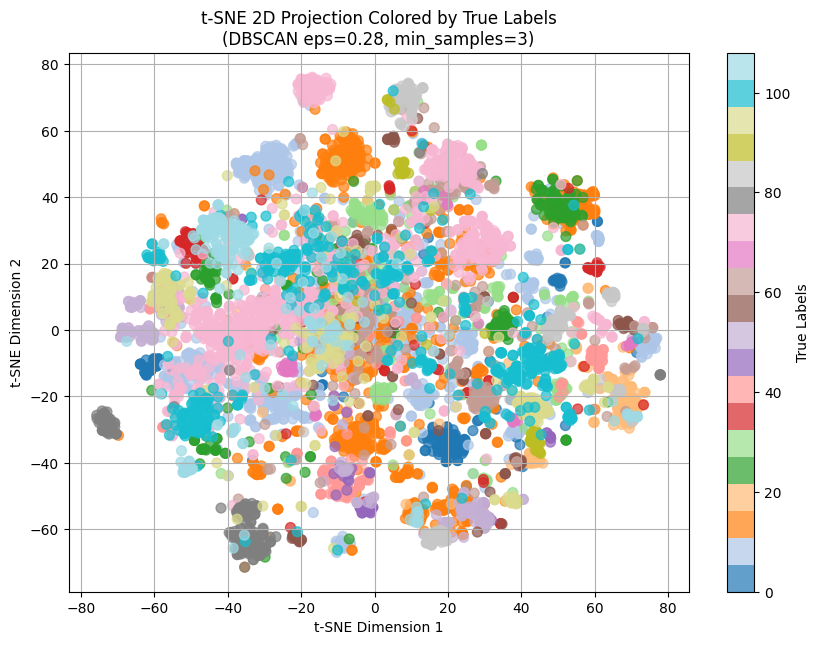

In [ ]:
#@title Visualisation
from sklearn.cluster import DBSCAN
from sklearn.manifold import TSNE
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

true_labels = evaluation_df['event_label'].values  # Use evaluation labels
best_params_eps=0.28
best_params_min_samples=3

# Run DBSCAN with best params on evaluation embeddings
best_dbscan = DBSCAN(eps=best_params_eps, min_samples=int(best_params_min_samples), metric='cosine')
best_cluster_labels = best_dbscan.fit_predict(evaluation_embeddings)

# t-SNE dimensionality reduction to 2D on evaluation embeddings
tsne = TSNE(n_components=2, random_state=42, init='pca')
reduced_embeddings = tsne.fit_transform(evaluation_embeddings)

# Plotting
plt.figure(figsize=(10, 7))
scatter = plt.scatter(
    reduced_embeddings[:, 0], reduced_embeddings[:, 1],
    c=true_labels, cmap='tab20', alpha=0.7, s=50
)
plt.colorbar(scatter, label='True Labels')
plt.title(f"t-SNE 2D Projection Colored by True Labels\n(DBSCAN eps={best_params_eps:.2f}, min_samples={int(best_params_min_samples)})")
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.grid(True)
plt.show()


# WMD

## DBSCAN, With FasText Embedding

In [ ]:
#@title Install Fast Text Model
# !pip install fasttext
!wget https://dl.fbaipublicfiles.com/fasttext/vectors-crawl/cc.ar.300.vec.gz
!gunzip cc.ar.300.vec.gz


--2025-06-26 05:20:43--  https://dl.fbaipublicfiles.com/fasttext/vectors-crawl/cc.ar.300.vec.gz
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 13.35.37.90, 13.35.37.84, 13.35.37.111, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|13.35.37.90|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1272365870 (1.2G) [binary/octet-stream]
Saving to: ‘cc.ar.300.vec.gz’

cc.ar.300.vec.gz    100%[===================>]   1.18G  24.2MB/s    in 53s     

2025-06-26 05:21:36 (22.9 MB/s) - ‘cc.ar.300.vec.gz’ saved [1272365870/1272365870]



In [ ]:
#@title Initialize Stanza Pipeline
import numpy as np
import nltk
import stanza
from gensim.models import KeyedVectors
from nltk.corpus import stopwords

# Download necessary resources (only run once)
nltk.download('stopwords')
stanza.download('ar')

# Load Arabic stopwords from NLTK
ARABIC_STOPWORDS = set(stopwords.words('arabic'))

# Initialize Stanza Arabic pipeline for tokenization
nlp = stanza.Pipeline(lang='ar', processors='tokenize', tokenize_no_ssplit=True)

# Tokenization function
def stanza_tokenize(text):
    doc = nlp(text)
    return [word.text for sentence in doc.sentences for word in sentence.words]

# Tweet embedding function using FastText + Stanza + NLTK stopwords
def embed_tweet(text, model):
    tokens = stanza_tokenize(text)
    # Remove stopwords
    filtered_tokens = [token for token in tokens if token not in ARABIC_STOPWORDS]
    # Embed
    vectors = [model[token] for token in filtered_tokens if token in model]
    if not vectors:
        return np.zeros(model.vector_size)
    return np.mean(vectors, axis=0)


ModuleNotFoundError: No module named 'stanza'

In [ ]:
#@title Load the model

from gensim.models import KeyedVectors

# Load the .vec file (pre-trained FastText embeddings in text format)
fasttext_model = KeyedVectors.load_word2vec_format('cc.ar.300.vec', binary=False, encoding='utf-8')


In [ ]:
#@title Embeddding the Tweets
from tqdm import tqdm

tweets = df['Tweet Text'].tolist()
embeddings = np.array([
    embed_tweet(text, fasttext_model) for text in tqdm(tweets)
])

100%|██████████| 6998/6998 [04:08<00:00, 28.11it/s]


In [ ]:
#@title Save the Embedding
# Convert embeddings to a regular list
df['fasttext_embeddings'] = embeddings.tolist()

# # Convert to DataFrame
# embedding_df = pd.DataFrame(embeddings)

# # Save
# embedding_df.to_csv("tweet_embeddings.csv", index=False)


In [ ]:
#  @title Load the embedding for the tuning and evaluation df

# Convert string embeddings to actual Python lists
tuning_df['fasttext_embeddings'] = tuning_df['fasttext_embeddings'].apply(ast.literal_eval)
evaluation_df['fasttext_embeddings'] = evaluation_df['fasttext_embeddings'].apply(ast.literal_eval)

# Convert list of embeddings (stored as lists) into 2D numpy arrays
tuning_embeddings = np.vstack(tuning_df['fasttext_embeddings'].apply(np.array).values)
evaluation_embeddings = np.vstack(evaluation_df['fasttext_embeddings'].apply(np.array).values)

print(f"Tuning embeddings shape: {tuning_embeddings.shape}")
print(f"Evaluation embeddings shape: {evaluation_embeddings.shape}")


Tuning embeddings shape: (934, 300)
Evaluation embeddings shape: (6064, 300)


In [ ]:
#@title WMD Matrix
from tqdm import tqdm

from sklearn.metrics import pairwise_distances

# Custom WMD distance function using Gensim
def wmd_distance(doc1, doc2):
    return fasttext_model.wmdistance(doc1, doc2)

# Compute pairwise WMD for tuning
def compute_wmd_matrix(docs):
    n = len(docs)
    dist_matrix = np.zeros((n, n))
    for i in tqdm(range(n), desc="WMD Matrix"):
        for j in range(i+1, n):
            dist = wmd_distance(docs[i], docs[j])
            dist_matrix[i, j] = dist_matrix[j, i] = dist
    return dist_matrix

# You can reduce the number of samples if it's too slow
tuning_wmd_matrix = compute_wmd_matrix(tuning_df['tokens_clean'].tolist())
evaluation_wmd_matrix = compute_wmd_matrix(evaluation_df['tokens_clean'].tolist())


ModuleNotFoundError: No module named 'numpy.char'

In [ ]:

#@title Define range of DBSCAN parameters to tune
# eps_values = np.arange(0.02, 0.66, 0.02)        # Distance threshold
eps_values = np.arange(0.02, 0.18, 0.01)        # Distance threshold
min_samples_values = np.arange(3,10,1)         # Minimum samples in neighborhood
dim_values = [32, 64, 96, 128, 160, 192, 256, 300]
best_score = -1
best_params = None


In [ ]:
#@title Analyze the Effect of DBSCAN's epsilon Parameter on Clustering Results
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results_tuning = []
results_eval = []

# Tune over eps
for eps in eps_values:
    for min_samples in min_samples_values:
        # --- Tuning ---
        dbscan_tuning = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

        if len(set(cluster_labels_tuning)) > 1 and (cluster_labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, cluster_labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- Evaluation ---
        dbscan_eval = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_eval = dbscan_eval.fit_predict(evaluation_embeddings)

        if len(set(cluster_labels_eval)) > 1 and (cluster_labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, cluster_labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# Aggregate over min_samples
agg_tuning = df_tuning.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval = df_eval.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()



Best eps based on NMI (Tuning Set): eps = 0.14, NMI = 0.2607


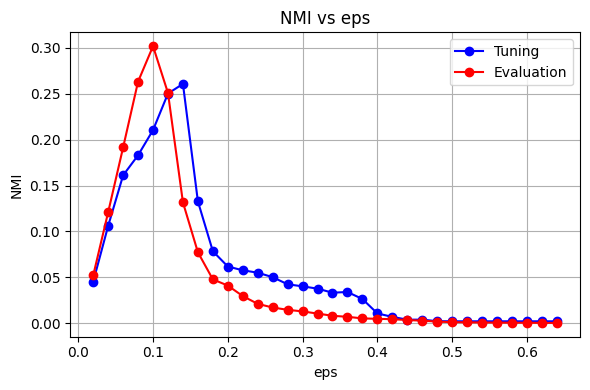

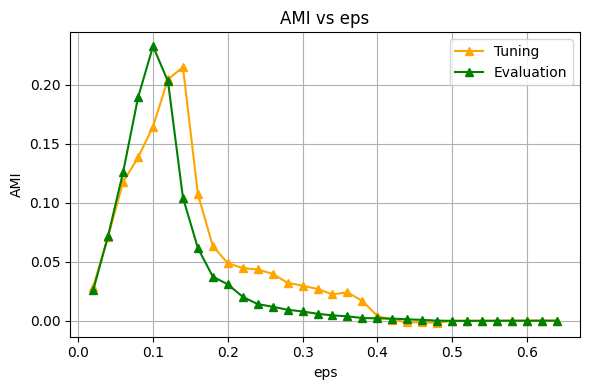

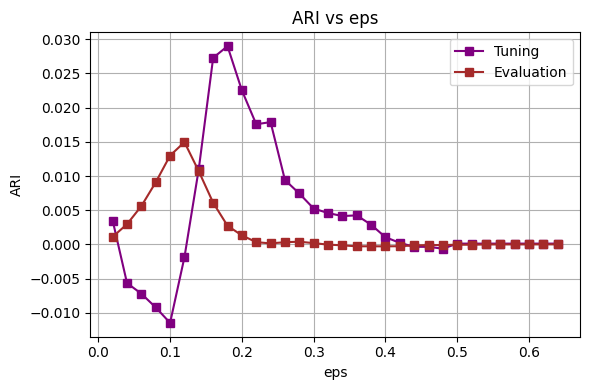

In [ ]:
#@title the Effect of DBSCAN's epsilon Parameter on Clustering Result

# Print best eps based on NMI from tuning set
best_eps_row = agg_tuning.loc[agg_tuning['nmi'].idxmax()]
print(f"Best eps based on NMI (Tuning Set): eps = {best_eps_row['eps']:.2f}, NMI = {best_eps_row['nmi']:.4f}")

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs eps')
plt.xlabel('eps')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ami'], marker='^', color='orange', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs eps')
plt.xlabel('eps')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ari'], marker='s', color='purple', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs eps')
plt.xlabel('eps')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Analyze the Effect of DBSCAN's Min Samples   Parameter on Clustering Result

true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results_tuning = []
results_eval = []

# Iterate over eps and min_samples combinations
for eps in eps_values:
    for min_samples in min_samples_values:
        # --- Tuning ---
        dbscan_tuning = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

        if len(set(cluster_labels_tuning)) > 1 and (cluster_labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, cluster_labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- Evaluation ---
        dbscan_eval = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_eval = dbscan_eval.fit_predict(evaluation_embeddings)

        if len(set(cluster_labels_eval)) > 1 and (cluster_labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, cluster_labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# === Aggregate over eps to study the effect of min_samples ===
agg_tuning_min = df_tuning.groupby('min_samples')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval_min = df_eval.groupby('min_samples')[['nmi', 'ari', 'ami']].mean().reset_index()



Best min_samples based on NMI (Tuning Set): min_samples = 3, NMI = 0.2228


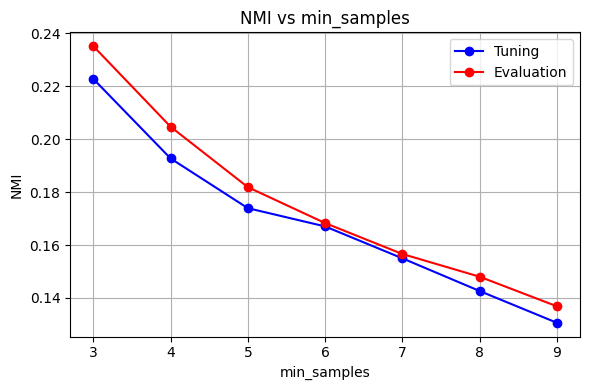

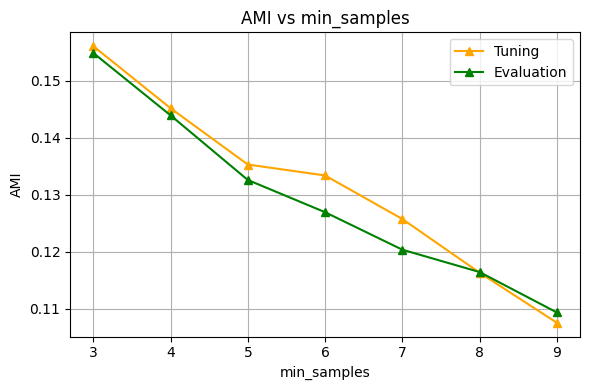

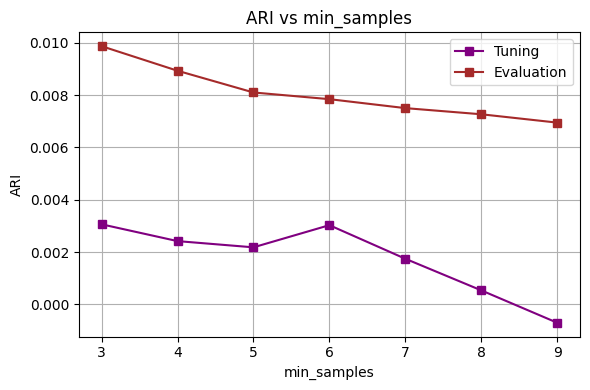

In [ ]:
#@title Analyze the Effect of DBSCAN's Min Samples   Parameter on Clustering Result

# Print best min_samples based on NMI from tuning set
best_minsample_row = agg_tuning_min.loc[agg_tuning_min['nmi'].idxmax()]
print(f"Best min_samples based on NMI (Tuning Set): min_samples = {int(best_minsample_row['min_samples'])}, NMI = {best_minsample_row['nmi']:.4f}")

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['ami'], marker='^', color='orange', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['ari'], marker='s', color='purple', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Analyze the Effect of PCA Dimensionality Reduction on DBSCAN Clustering Result

from sklearn.decomposition import PCA
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score
from sklearn.cluster import DBSCAN

# --- Settings ---

dim_values = [32, 64, 96, 128, 160, 192, 256, 300]
eps_best = 0.31
min_samples_best = 3

# True labels
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

dim_results = []

for dim in dim_values:
    # Reduce embeddings
    pca = PCA(n_components=dim)
    reduced_tuning = pca.fit_transform(tuning_embeddings)
    reduced_eval = pca.transform(evaluation_embeddings)

    # --- Tuning clustering ---
    dbscan_tuning = DBSCAN(eps=eps_best, min_samples=min_samples_best, metric='cosine')
    cluster_tuning = dbscan_tuning.fit_predict(reduced_tuning)

    if len(set(cluster_tuning)) > 1 and (cluster_tuning != -1).any():
        nmi = normalized_mutual_info_score(true_labels_tuning, cluster_tuning)
        ari = adjusted_rand_score(true_labels_tuning, cluster_tuning)
        ami = adjusted_mutual_info_score(true_labels_tuning, cluster_tuning)
    else:
        nmi = ari = ami = 0

    # --- Eval clustering ---
    dbscan_eval = DBSCAN(eps=eps_best, min_samples=min_samples_best, metric='cosine')
    cluster_eval = dbscan_eval.fit_predict(reduced_eval)

    if len(set(cluster_eval)) > 1 and (cluster_eval != -1).any():
        nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_eval)
        ari_e = adjusted_rand_score(true_labels_eval, cluster_eval)
        ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_eval)
    else:
        nmi_e = ari_e = ami_e = 0

    dim_results.append({
        'dim': dim,
        'nmi_tuning': nmi,
        'ari_tuning': ari,
        'ami_tuning': ami,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

# Convert to DataFrame
dim_df = pd.DataFrame(dim_results)


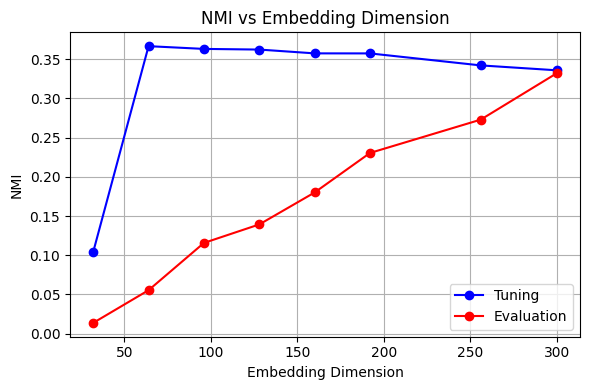

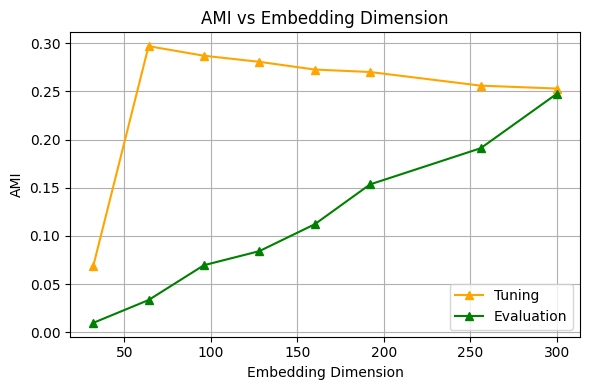

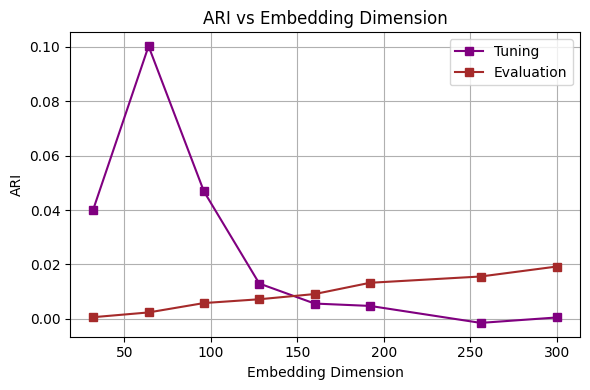

In [ ]:
#@title the Effect of PCA Dimensionality Reduction on DBSCAN Clustering Performance

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['nmi_tuning'], marker='o', label='Tuning', color='blue')
plt.plot(dim_df['dim'], dim_df['nmi_eval'], marker='o', label='Evaluation', color='red')
plt.title('NMI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['ami_tuning'], marker='^', label='Tuning', color='orange')
plt.plot(dim_df['dim'], dim_df['ami_eval'], marker='^', label='Evaluation', color='green')
plt.title('AMI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['ari_tuning'], marker='s', label='Tuning', color='purple')
plt.plot(dim_df['dim'], dim_df['ari_eval'], marker='s', label='Evaluation', color='brown')
plt.title('ARI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:

#@title Grid search on tuning set
from sklearn.decomposition import PCA
from umap import UMAP
from sklearn.cluster import DBSCAN
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

# Parameters for grid search
reducers = {
    'PCA': PCA,
    'UMAP': UMAP
}

true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results = []

# Grid search on tuning set
for reducer_name, reducer_cls in reducers.items():
    for dim in dim_values:
        print(f"Reducing tuning data to {dim}D using {reducer_name}...")
        reducer = reducer_cls(n_components=dim, random_state=42)
        reduced_tuning = reducer.fit_transform(tuning_embeddings)

        for eps in eps_values:
            for min_samples in min_samples_values:
                dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
                cluster_labels = dbscan.fit_predict(reduced_tuning)

                if len(set(cluster_labels)) > 1 and (cluster_labels != -1).any():
                    nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels)
                    ari = adjusted_rand_score(true_labels_tuning, cluster_labels)
                    ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels)
                else:
                    nmi = ari = ami = 0

                results.append({
                    'reducer': reducer_name,
                    'dim': dim,
                    'eps': eps,
                    'min_samples': min_samples,
                    'nmi': nmi,
                    'ari': ari,
                    'ami': ami,
                    'reduced_tuning': reduced_tuning
                })

results_df = pd.DataFrame(results)


Reducing tuning data to 32D using PCA...
Reducing tuning data to 64D using PCA...
Reducing tuning data to 96D using PCA...
Reducing tuning data to 128D using PCA...
Reducing tuning data to 160D using PCA...
Reducing tuning data to 192D using PCA...
Reducing tuning data to 256D using PCA...
Reducing tuning data to 300D using PCA...
Reducing tuning data to 32D using UMAP...
Reducing tuning data to 64D using UMAP...
Reducing tuning data to 96D using UMAP...
Reducing tuning data to 128D using UMAP...
Reducing tuning data to 160D using UMAP...
Reducing tuning data to 192D using UMAP...
Reducing tuning data to 256D using UMAP...
Reducing tuning data to 300D using UMAP...


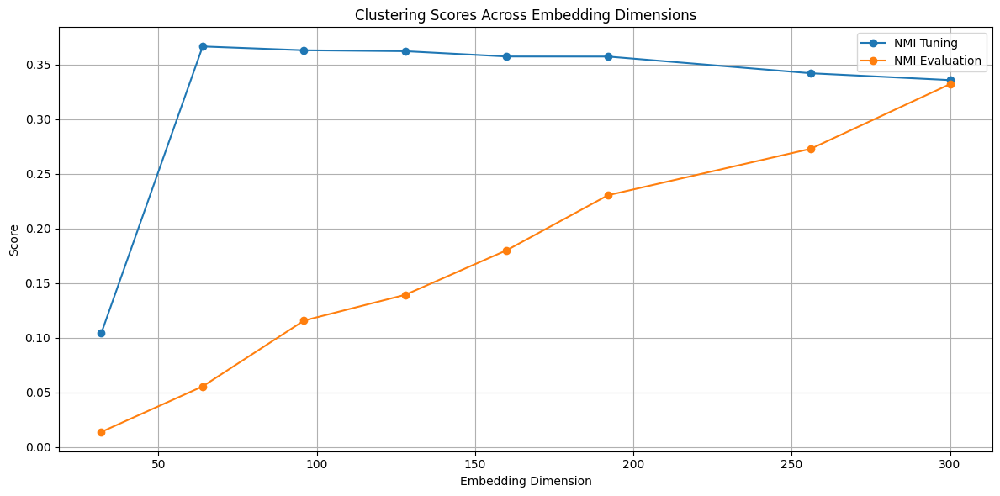

In [ ]:
#@title Nmi vs  Dim
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Plot NMI
plt.plot(dim_df['dim'], dim_df['nmi_tuning'], label='NMI Tuning', marker='o')
plt.plot(dim_df['dim'], dim_df['nmi_eval'], label='NMI Evaluation', marker='o')

# # Plot ARI
# plt.plot(dim_df['dim'], dim_df['ari_tuning'], label='ARI Tuning', marker='s')
# plt.plot(dim_df['dim'], dim_df['ari_eval'], label='ARI Evaluation', marker='s')

# # Plot AMI
# plt.plot(dim_df['dim'], dim_df['ami_tuning'], label='AMI Tuning', marker='^')
# plt.plot(dim_df['dim'], dim_df['ami_eval'], label='AMI Evaluation', marker='^')

plt.title('Clustering Scores Across Embedding Dimensions')
plt.xlabel('Embedding Dimension')
plt.ylabel('Score')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Best Params
# Get best tuning config by NMI
best_config = results_df.loc[results_df['nmi'].idxmax()]
print("Best NMI config on tuning set:")
print(best_config[['reducer', 'dim', 'eps', 'min_samples', 'nmi', 'ari', 'ami']])

# Using best config, transform evaluation embeddings and evaluate clustering
best_reducer_cls = reducers[best_config['reducer']]
best_dim = best_config['dim']
best_eps = best_config['eps']
best_min_samples = best_config['min_samples']

reducer = best_reducer_cls(n_components=best_dim, random_state=42)
reduced_tuning_best = reducer.fit_transform(tuning_embeddings)
reduced_eval_best = reducer.transform(evaluation_embeddings)

dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

cluster_labels_tuning = dbscan.fit_predict(reduced_tuning_best)
cluster_labels_eval = dbscan.fit_predict(reduced_eval_best)

def safe_scores(true, pred):
    if len(set(pred)) > 1 and (pred != -1).any():
        nmi = normalized_mutual_info_score(true, pred)
        ari = adjusted_rand_score(true, pred)
        ami = adjusted_mutual_info_score(true, pred)
    else:
        nmi = ari = ami = 0
    return nmi, ari, ami

nmi_tuning, ari_tuning, ami_tuning = safe_scores(true_labels_tuning, cluster_labels_tuning)
nmi_eval, ari_eval, ami_eval = safe_scores(true_labels_eval, cluster_labels_eval)

print("\nEvaluation metrics with best tuning config:")
print(f"NMI: {nmi_eval:.4f}, ARI: {ari_eval:.4f}, AMI: {ami_eval:.4f}")

# Summarize metrics for each dimension using best eps and min_samples
dim_metrics = []



Best NMI config on tuning set:
reducer             PCA
dim                  32
eps                0.17
min_samples           3
nmi            0.342886
ari            0.016063
ami             0.26176
Name: 105, dtype: object

Evaluation metrics with best tuning config:
NMI: 0.1544, ARI: 0.0078, AMI: 0.0874


In [ ]:
#@title Summarize clustering scores across embedding dimensions for best tuning hyperparameters

dim_metrics = []

for dim in dim_values:
    # Initialize reducer with the current dimension
    reducer = best_reducer_cls(n_components=dim, random_state=42)

    # Fit transform tuning embeddings and transform evaluation embeddings
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    # Initialize DBSCAN with best hyperparameters from tuning
    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    # Predict cluster labels on tuning and evaluation sets
    labels_tuning = dbscan.fit_predict(reduced_tuning)
    labels_eval = dbscan.fit_predict(reduced_eval)

    # Compute scores safely
    nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, labels_tuning)
    nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, labels_eval)

    # Append results
    dim_metrics.append({
        'dim': dim,
        'nmi_tuning': nmi_t,
        'ari_tuning': ari_t,
        'ami_tuning': ami_t,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

# Create DataFrame for easier visualization
dim_df = pd.DataFrame(dim_metrics)

print("\nSummary of clustering metrics across embedding dimensions:")
print(dim_df.to_string(index=False))



Summary of clustering metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval
  32    0.342886    0.016063    0.261760  0.154360  0.007839  0.087420
  64    0.294713   -0.007730    0.213888  0.308772  0.013025  0.214800
  96    0.265965   -0.009882    0.184987  0.356057  0.010901  0.243318
 128    0.256863   -0.010077    0.175244  0.358324  0.010159  0.235365
 160    0.242313   -0.012751    0.165810  0.346373  0.009469  0.222257
 192    0.230867   -0.013800    0.155786  0.336609  0.009018  0.213052
 256    0.226300   -0.013275    0.153107  0.325357  0.009301  0.202605
 300    0.224507   -0.013776    0.151127  0.321276  0.009127  0.197223


In [ ]:
#@title The Results of the Clustering
dim_metrics = []

for dim in dim_values:
    reducer = best_reducer_cls(n_components=dim, random_state=42)
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    print(f"Using eps = {best_eps}, min_samples = {best_min_samples} for dim = {dim}")

    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    labels_tuning = dbscan.fit_predict(reduced_tuning)
    labels_eval = dbscan.fit_predict(reduced_eval)

    nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, labels_tuning)
    nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, labels_eval)

    dim_metrics.append({
        'dim': dim,
        'nmi_tuning': nmi_t,
        'ari_tuning': ari_t,
        'ami_tuning': ami_t,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

dim_df = pd.DataFrame(dim_metrics)

print("\nSummary of metrics across embedding dimensions:")
print(dim_df.to_string(index=False))


Using eps = 0.16999999999999996, min_samples = 3 for dim = 32
Using eps = 0.16999999999999996, min_samples = 3 for dim = 64
Using eps = 0.16999999999999996, min_samples = 3 for dim = 96
Using eps = 0.16999999999999996, min_samples = 3 for dim = 128
Using eps = 0.16999999999999996, min_samples = 3 for dim = 160
Using eps = 0.16999999999999996, min_samples = 3 for dim = 192
Using eps = 0.16999999999999996, min_samples = 3 for dim = 256
Using eps = 0.16999999999999996, min_samples = 3 for dim = 300

Summary of metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval
  32    0.342886    0.016063    0.261760  0.154360  0.007839  0.087420
  64    0.294713   -0.007730    0.213888  0.308772  0.013025  0.214800
  96    0.265965   -0.009882    0.184987  0.356057  0.010901  0.243318
 128    0.256863   -0.010077    0.175244  0.358324  0.010159  0.235365
 160    0.242313   -0.012751    0.165810  0.346373  0.009469  0.222257
 192    0.230867   -0.01

In [ ]:
#@title Clustering and Topic Modeling Metrics Summary Across Embedding Dimensions
from sklearn.metrics import silhouette_score
from gensim.corpora import Dictionary
from gensim.models.coherencemodel import CoherenceModel

def safe_silhouette_score(X, labels):
    if len(set(labels)) > 1 and len(X) > len(set(labels)):
        return silhouette_score(X, labels, metric='cosine')
    return -1

def get_topic_coherence(texts, labels, coherence_type='c_v'):
    clustered_docs = {}
    for text, label in zip(texts, labels):
        if label == -1:
            continue
        clustered_docs.setdefault(label, []).append(text)

    topics = [docs for docs in clustered_docs.values() if len(docs) >= 3]

    if len(topics) == 0:
        return -1

    tokenized_topics = [[word for doc in topic for word in doc.split()] for topic in topics]

    dictionary = Dictionary(tokenized_topics)
    corpus = [dictionary.doc2bow(text) for text in tokenized_topics]

    coherence_model = CoherenceModel(
        topics=tokenized_topics,
        texts=tokenized_topics,
        corpus=corpus,
        dictionary=dictionary,
        coherence=coherence_type
    )

    return coherence_model.get_coherence()

# Ground truth number of events (true clusters)
true_events_tuning = len(set(tuning_df['event_label']))
true_events_eval = len(set(evaluation_df['event_label']))

# Initialize list for metrics
additional_metrics = []

for dim in dim_values:
    reducer = best_reducer_cls(n_components=dim, random_state=42)
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    # Tuning
    labels_tuning = dbscan.fit_predict(reduced_tuning)
    silhouette_t = safe_silhouette_score(reduced_tuning, labels_tuning)
    num_clusters_t = len(set(labels_tuning)) - (1 if -1 in labels_tuning else 0)
    coherence_t_cv = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='c_v')
    coherence_t_umass = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='u_mass')

    # Evaluation
    labels_eval = dbscan.fit_predict(reduced_eval)
    silhouette_e = safe_silhouette_score(reduced_eval, labels_eval)
    num_clusters_e = len(set(labels_eval)) - (1 if -1 in labels_eval else 0)
    coherence_e_cv = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='c_v')
    coherence_e_umass = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='u_mass')

    additional_metrics.append({
        'dim': dim,
        'true_events_tuning': true_events_tuning,
        'true_events_eval': true_events_eval,
        'silhouette_tuning': silhouette_t,
        'num_clusters_tuning': num_clusters_t,
        'coherence_tuning_c_v': coherence_t_cv,
        'coherence_tuning_u_mass': coherence_t_umass,
        'silhouette_eval': silhouette_e,
        'num_clusters_eval': num_clusters_e,
        'coherence_eval_c_v': coherence_e_cv,
        'coherence_eval_u_mass': coherence_e_umass
    })

# Merge with original dim_df
extra_df = pd.DataFrame(additional_metrics)
dim_df = pd.merge(dim_df, extra_df, on='dim')

# Display full summary
print("\nSummary of all clustering metrics across embedding dimensions:")
print(dim_df.to_string(index=False))



Summary of all clustering metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval  true_events_tuning  true_events_eval  silhouette_tuning  num_clusters_tuning  coherence_tuning_c_v  coherence_tuning_u_mass  silhouette_eval  num_clusters_eval  coherence_eval_c_v  coherence_eval_u_mass
  32    0.342886    0.016063    0.261760  0.154360  0.007839  0.087420                  31               103          -0.213698                   30              0.822282                -0.648421        -0.486917                 98            0.631325              -0.818230
  64    0.294713   -0.007730    0.213888  0.308772  0.013025  0.214800                  31               103          -0.166097                   27              0.843405                -0.569537        -0.335370                148            0.690251              -1.070130
  96    0.265965   -0.009882    0.184987  0.356057  0.010901  0.243318                  31               103   

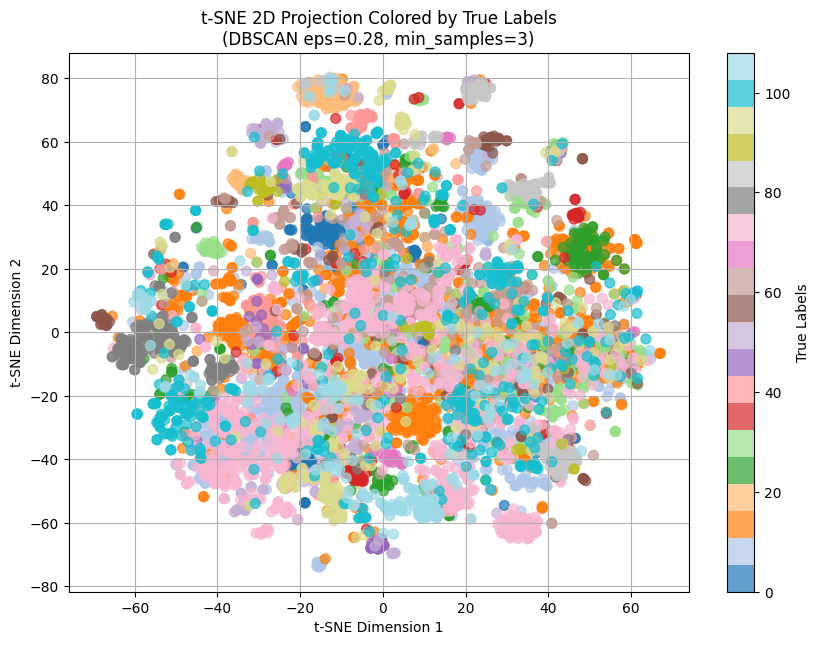

In [ ]:
#@title Visualisation
from sklearn.cluster import DBSCAN
from sklearn.manifold import TSNE
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

true_labels = evaluation_df['event_label'].values  # Use evaluation labels
best_params_eps=0.28
best_params_min_samples=3

# Run DBSCAN with best params on evaluation embeddings
best_dbscan = DBSCAN(eps=best_params_eps, min_samples=int(best_params_min_samples), metric='cosine')
best_cluster_labels = best_dbscan.fit_predict(evaluation_embeddings)

# t-SNE dimensionality reduction to 2D on evaluation embeddings
tsne = TSNE(n_components=2, random_state=42, init='pca')
reduced_embeddings = tsne.fit_transform(evaluation_embeddings)

# Plotting
plt.figure(figsize=(10, 7))
scatter = plt.scatter(
    reduced_embeddings[:, 0], reduced_embeddings[:, 1],
    c=true_labels, cmap='tab20', alpha=0.7, s=50
)
plt.colorbar(scatter, label='True Labels')
plt.title(f"t-SNE 2D Projection Colored by True Labels\n(DBSCAN eps={best_params_eps:.2f}, min_samples={int(best_params_min_samples)})")
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.grid(True)
plt.show()


# Fasttext Experiments

## DBSCAN, With FasText Embedding

In [ ]:
#@title Install Fast Text Model
# !pip install fasttext
!wget https://dl.fbaipublicfiles.com/fasttext/vectors-crawl/cc.ar.300.vec.gz
!gunzip cc.ar.300.vec.gz


--2025-06-19 15:02:30--  https://dl.fbaipublicfiles.com/fasttext/vectors-crawl/cc.ar.300.vec.gz
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 3.162.174.92, 3.162.174.60, 3.162.174.120, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|3.162.174.92|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1272365870 (1.2G) [binary/octet-stream]
Saving to: ‘cc.ar.300.vec.gz’

cc.ar.300.vec.gz    100%[===================>]   1.18G   111MB/s    in 11s     

2025-06-19 15:02:42 (108 MB/s) - ‘cc.ar.300.vec.gz’ saved [1272365870/1272365870]



In [ ]:
#@title Initialize Stanza Pipeline
import numpy as np
import nltk
import stanza
from gensim.models import KeyedVectors
from nltk.corpus import stopwords

# Download necessary resources (only run once)
nltk.download('stopwords')
stanza.download('ar')

# Load Arabic stopwords from NLTK
ARABIC_STOPWORDS = set(stopwords.words('arabic'))

# Initialize Stanza Arabic pipeline for tokenization
nlp = stanza.Pipeline(lang='ar', processors='tokenize', tokenize_no_ssplit=True)

# Tokenization function
def stanza_tokenize(text):
    doc = nlp(text)
    return [word.text for sentence in doc.sentences for word in sentence.words]

# Tweet embedding function using FastText + Stanza + NLTK stopwords
def embed_tweet(text, model):
    tokens = stanza_tokenize(text)
    # Remove stopwords
    filtered_tokens = [token for token in tokens if token not in ARABIC_STOPWORDS]
    # Embed
    vectors = [model[token] for token in filtered_tokens if token in model]
    if not vectors:
        return np.zeros(model.vector_size)
    return np.mean(vectors, axis=0)


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Downloading default packages for language: ar (Arabic) ...
INFO:stanza:File exists: /root/stanza_resources/ar/default.zip
INFO:stanza:Finished downloading models and saved to /root/stanza_resources
INFO:stanza:Checking for updates to resources.json in case models have been updated.  Note: this behavior can be turned off with download_method=None or download_method=DownloadMethod.REUSE_RESOURCES


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Loading these models for language: ar (Arabic):
| Processor | Package |
-----------------------
| tokenize  | padt    |
| mwt       | padt    |

INFO:stanza:Using device: cpu
INFO:stanza:Loading: tokenize
INFO:stanza:Loading: mwt
INFO:stanza:Done loading processors!


In [ ]:
#@title Load the model

from gensim.models import KeyedVectors

# Load the .vec file (pre-trained FastText embeddings in text format)
fasttext_model = KeyedVectors.load_word2vec_format('cc.ar.300.vec', binary=False, encoding='utf-8')


In [ ]:
#@title Embeddding the Tweets
from tqdm import tqdm

tweets = df['Tweet Text'].tolist()
embeddings = np.array([
    embed_tweet(text, fasttext_model) for text in tqdm(tweets)
])

100%|██████████| 6998/6998 [04:08<00:00, 28.11it/s]


In [ ]:
#@title Save the Embedding
# Convert embeddings to a regular list
df['fasttext_embeddings'] = embeddings.tolist()

# # Convert to DataFrame
# embedding_df = pd.DataFrame(embeddings)

# # Save
# embedding_df.to_csv("tweet_embeddings.csv", index=False)


In [ ]:
#  @title Load the embedding for the tuning and evaluation df

# Convert string embeddings to actual Python lists
tuning_df['fasttext_embeddings'] = tuning_df['fasttext_embeddings'].apply(ast.literal_eval)
evaluation_df['fasttext_embeddings'] = evaluation_df['fasttext_embeddings'].apply(ast.literal_eval)

# Convert list of embeddings (stored as lists) into 2D numpy arrays
tuning_embeddings = np.vstack(tuning_df['fasttext_embeddings'].apply(np.array).values)
evaluation_embeddings = np.vstack(evaluation_df['fasttext_embeddings'].apply(np.array).values)

print(f"Tuning embeddings shape: {tuning_embeddings.shape}")
print(f"Evaluation embeddings shape: {evaluation_embeddings.shape}")


Tuning embeddings shape: (934, 300)
Evaluation embeddings shape: (6064, 300)


In [ ]:

#@title Define range of DBSCAN parameters to tune
# eps_values = np.arange(0.02, 0.66, 0.02)        # Distance threshold
eps_values = np.arange(0.02, 0.18, 0.01)        # Distance threshold
min_samples_values = np.arange(3,10,1)         # Minimum samples in neighborhood
dim_values = [32, 64, 96, 128, 160, 192, 256, 300]
best_score = -1
best_params = None


In [ ]:
#@title Analyze the Effect of DBSCAN's epsilon Parameter on Clustering Results
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results_tuning = []
results_eval = []

# Tune over eps
for eps in eps_values:
    for min_samples in min_samples_values:
        # --- Tuning ---
        dbscan_tuning = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

        if len(set(cluster_labels_tuning)) > 1 and (cluster_labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, cluster_labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- Evaluation ---
        dbscan_eval = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_eval = dbscan_eval.fit_predict(evaluation_embeddings)

        if len(set(cluster_labels_eval)) > 1 and (cluster_labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, cluster_labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# Aggregate over min_samples
agg_tuning = df_tuning.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval = df_eval.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()



Best eps based on NMI (Tuning Set): eps = 0.14, NMI = 0.2607


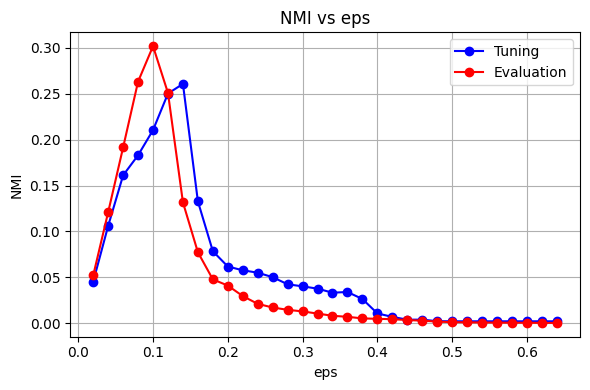

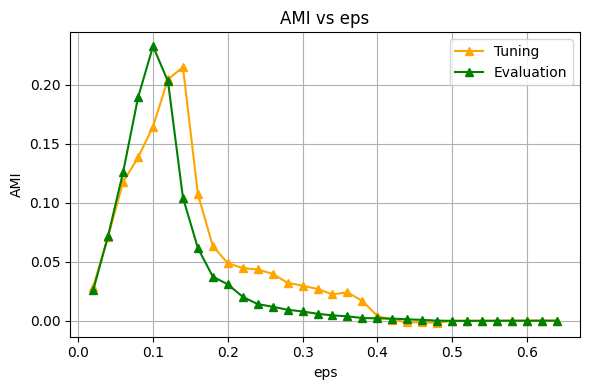

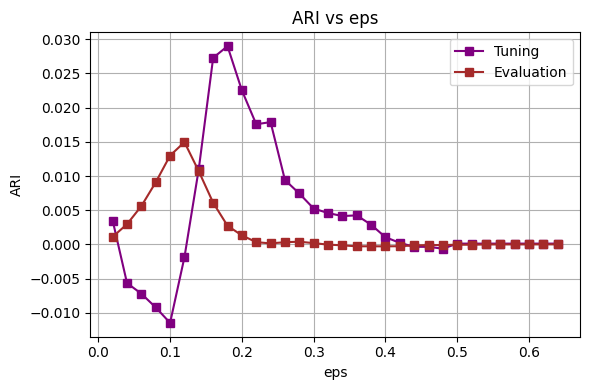

In [ ]:
#@title the Effect of DBSCAN's epsilon Parameter on Clustering Result

# Print best eps based on NMI from tuning set
best_eps_row = agg_tuning.loc[agg_tuning['nmi'].idxmax()]
print(f"Best eps based on NMI (Tuning Set): eps = {best_eps_row['eps']:.2f}, NMI = {best_eps_row['nmi']:.4f}")

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs eps')
plt.xlabel('eps')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ami'], marker='^', color='orange', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs eps')
plt.xlabel('eps')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ari'], marker='s', color='purple', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs eps')
plt.xlabel('eps')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Analyze the Effect of DBSCAN's Min Samples   Parameter on Clustering Result

true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results_tuning = []
results_eval = []

# Iterate over eps and min_samples combinations
for eps in eps_values:
    for min_samples in min_samples_values:
        # --- Tuning ---
        dbscan_tuning = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

        if len(set(cluster_labels_tuning)) > 1 and (cluster_labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, cluster_labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- Evaluation ---
        dbscan_eval = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_eval = dbscan_eval.fit_predict(evaluation_embeddings)

        if len(set(cluster_labels_eval)) > 1 and (cluster_labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, cluster_labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# === Aggregate over eps to study the effect of min_samples ===
agg_tuning_min = df_tuning.groupby('min_samples')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval_min = df_eval.groupby('min_samples')[['nmi', 'ari', 'ami']].mean().reset_index()



Best min_samples based on NMI (Tuning Set): min_samples = 3, NMI = 0.2228


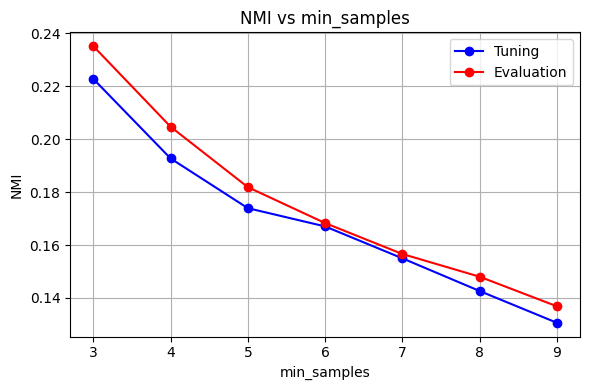

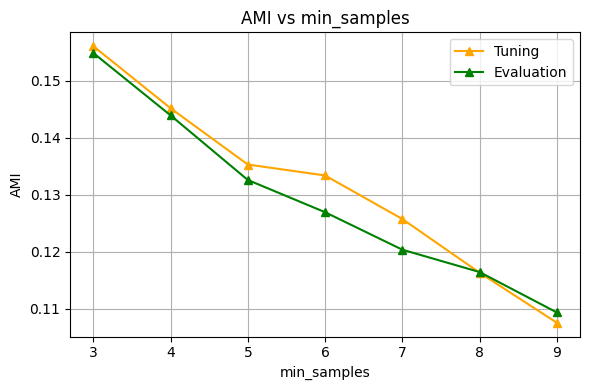

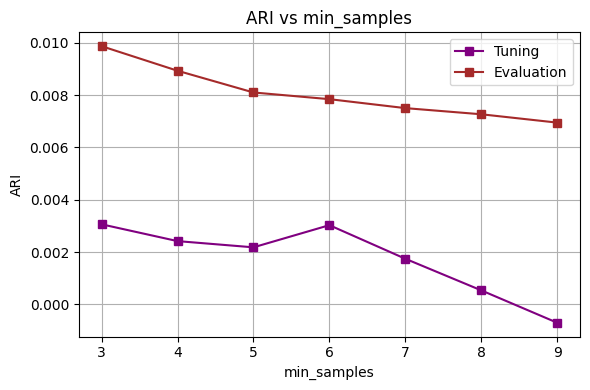

In [ ]:
#@title Analyze the Effect of DBSCAN's Min Samples   Parameter on Clustering Result

# Print best min_samples based on NMI from tuning set
best_minsample_row = agg_tuning_min.loc[agg_tuning_min['nmi'].idxmax()]
print(f"Best min_samples based on NMI (Tuning Set): min_samples = {int(best_minsample_row['min_samples'])}, NMI = {best_minsample_row['nmi']:.4f}")

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['ami'], marker='^', color='orange', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['ari'], marker='s', color='purple', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Analyze the Effect of PCA Dimensionality Reduction on DBSCAN Clustering Result

from sklearn.decomposition import PCA
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score
from sklearn.cluster import DBSCAN

# --- Settings ---

dim_values = [32, 64, 96, 128, 160, 192, 256, 300]
eps_best = 0.31
min_samples_best = 3

# True labels
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

dim_results = []

for dim in dim_values:
    # Reduce embeddings
    pca = PCA(n_components=dim)
    reduced_tuning = pca.fit_transform(tuning_embeddings)
    reduced_eval = pca.transform(evaluation_embeddings)

    # --- Tuning clustering ---
    dbscan_tuning = DBSCAN(eps=eps_best, min_samples=min_samples_best, metric='cosine')
    cluster_tuning = dbscan_tuning.fit_predict(reduced_tuning)

    if len(set(cluster_tuning)) > 1 and (cluster_tuning != -1).any():
        nmi = normalized_mutual_info_score(true_labels_tuning, cluster_tuning)
        ari = adjusted_rand_score(true_labels_tuning, cluster_tuning)
        ami = adjusted_mutual_info_score(true_labels_tuning, cluster_tuning)
    else:
        nmi = ari = ami = 0

    # --- Eval clustering ---
    dbscan_eval = DBSCAN(eps=eps_best, min_samples=min_samples_best, metric='cosine')
    cluster_eval = dbscan_eval.fit_predict(reduced_eval)

    if len(set(cluster_eval)) > 1 and (cluster_eval != -1).any():
        nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_eval)
        ari_e = adjusted_rand_score(true_labels_eval, cluster_eval)
        ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_eval)
    else:
        nmi_e = ari_e = ami_e = 0

    dim_results.append({
        'dim': dim,
        'nmi_tuning': nmi,
        'ari_tuning': ari,
        'ami_tuning': ami,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

# Convert to DataFrame
dim_df = pd.DataFrame(dim_results)


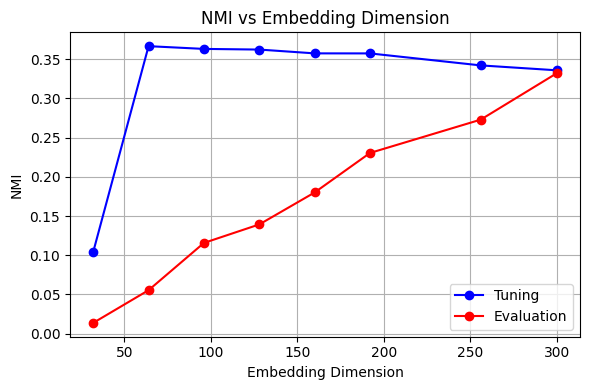

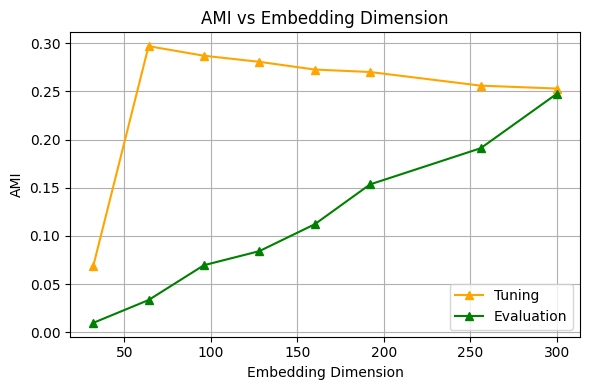

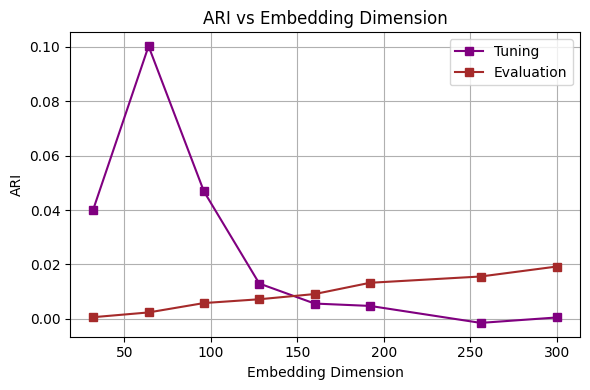

In [ ]:
#@title the Effect of PCA Dimensionality Reduction on DBSCAN Clustering Performance

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['nmi_tuning'], marker='o', label='Tuning', color='blue')
plt.plot(dim_df['dim'], dim_df['nmi_eval'], marker='o', label='Evaluation', color='red')
plt.title('NMI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['ami_tuning'], marker='^', label='Tuning', color='orange')
plt.plot(dim_df['dim'], dim_df['ami_eval'], marker='^', label='Evaluation', color='green')
plt.title('AMI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['ari_tuning'], marker='s', label='Tuning', color='purple')
plt.plot(dim_df['dim'], dim_df['ari_eval'], marker='s', label='Evaluation', color='brown')
plt.title('ARI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:

#@title Grid search on tuning set
from sklearn.decomposition import PCA
from umap import UMAP
from sklearn.cluster import DBSCAN
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

# Parameters for grid search
reducers = {
    'PCA': PCA,
    'UMAP': UMAP
}

true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results = []

# Grid search on tuning set
for reducer_name, reducer_cls in reducers.items():
    for dim in dim_values:
        print(f"Reducing tuning data to {dim}D using {reducer_name}...")
        reducer = reducer_cls(n_components=dim, random_state=42)
        reduced_tuning = reducer.fit_transform(tuning_embeddings)

        for eps in eps_values:
            for min_samples in min_samples_values:
                dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
                cluster_labels = dbscan.fit_predict(reduced_tuning)

                if len(set(cluster_labels)) > 1 and (cluster_labels != -1).any():
                    nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels)
                    ari = adjusted_rand_score(true_labels_tuning, cluster_labels)
                    ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels)
                else:
                    nmi = ari = ami = 0

                results.append({
                    'reducer': reducer_name,
                    'dim': dim,
                    'eps': eps,
                    'min_samples': min_samples,
                    'nmi': nmi,
                    'ari': ari,
                    'ami': ami,
                    'reduced_tuning': reduced_tuning
                })

results_df = pd.DataFrame(results)


Reducing tuning data to 32D using PCA...
Reducing tuning data to 64D using PCA...
Reducing tuning data to 96D using PCA...
Reducing tuning data to 128D using PCA...
Reducing tuning data to 160D using PCA...
Reducing tuning data to 192D using PCA...
Reducing tuning data to 256D using PCA...
Reducing tuning data to 300D using PCA...
Reducing tuning data to 32D using UMAP...
Reducing tuning data to 64D using UMAP...
Reducing tuning data to 96D using UMAP...
Reducing tuning data to 128D using UMAP...
Reducing tuning data to 160D using UMAP...
Reducing tuning data to 192D using UMAP...
Reducing tuning data to 256D using UMAP...
Reducing tuning data to 300D using UMAP...


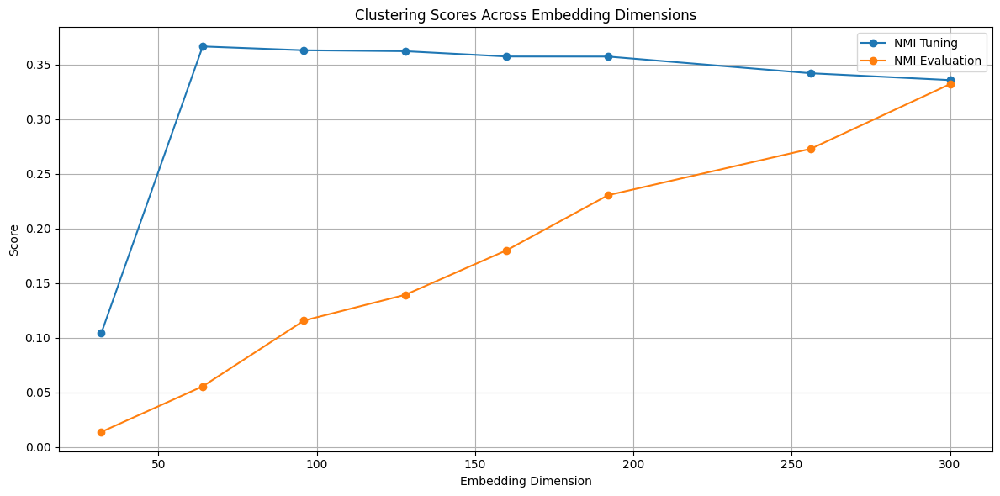

In [ ]:
#@title Nmi vs  Dim
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Plot NMI
plt.plot(dim_df['dim'], dim_df['nmi_tuning'], label='NMI Tuning', marker='o')
plt.plot(dim_df['dim'], dim_df['nmi_eval'], label='NMI Evaluation', marker='o')

# # Plot ARI
# plt.plot(dim_df['dim'], dim_df['ari_tuning'], label='ARI Tuning', marker='s')
# plt.plot(dim_df['dim'], dim_df['ari_eval'], label='ARI Evaluation', marker='s')

# # Plot AMI
# plt.plot(dim_df['dim'], dim_df['ami_tuning'], label='AMI Tuning', marker='^')
# plt.plot(dim_df['dim'], dim_df['ami_eval'], label='AMI Evaluation', marker='^')

plt.title('Clustering Scores Across Embedding Dimensions')
plt.xlabel('Embedding Dimension')
plt.ylabel('Score')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Best Params
# Get best tuning config by NMI
best_config = results_df.loc[results_df['nmi'].idxmax()]
print("Best NMI config on tuning set:")
print(best_config[['reducer', 'dim', 'eps', 'min_samples', 'nmi', 'ari', 'ami']])

# Using best config, transform evaluation embeddings and evaluate clustering
best_reducer_cls = reducers[best_config['reducer']]
best_dim = best_config['dim']
best_eps = best_config['eps']
best_min_samples = best_config['min_samples']

reducer = best_reducer_cls(n_components=best_dim, random_state=42)
reduced_tuning_best = reducer.fit_transform(tuning_embeddings)
reduced_eval_best = reducer.transform(evaluation_embeddings)

dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

cluster_labels_tuning = dbscan.fit_predict(reduced_tuning_best)
cluster_labels_eval = dbscan.fit_predict(reduced_eval_best)

def safe_scores(true, pred):
    if len(set(pred)) > 1 and (pred != -1).any():
        nmi = normalized_mutual_info_score(true, pred)
        ari = adjusted_rand_score(true, pred)
        ami = adjusted_mutual_info_score(true, pred)
    else:
        nmi = ari = ami = 0
    return nmi, ari, ami

nmi_tuning, ari_tuning, ami_tuning = safe_scores(true_labels_tuning, cluster_labels_tuning)
nmi_eval, ari_eval, ami_eval = safe_scores(true_labels_eval, cluster_labels_eval)

print("\nEvaluation metrics with best tuning config:")
print(f"NMI: {nmi_eval:.4f}, ARI: {ari_eval:.4f}, AMI: {ami_eval:.4f}")

# Summarize metrics for each dimension using best eps and min_samples
dim_metrics = []



Best NMI config on tuning set:
reducer             PCA
dim                  32
eps                0.17
min_samples           3
nmi            0.342886
ari            0.016063
ami             0.26176
Name: 105, dtype: object

Evaluation metrics with best tuning config:
NMI: 0.1544, ARI: 0.0078, AMI: 0.0874


In [ ]:
#@title Summarize clustering scores across embedding dimensions for best tuning hyperparameters

dim_metrics = []

for dim in dim_values:
    # Initialize reducer with the current dimension
    reducer = best_reducer_cls(n_components=dim, random_state=42)

    # Fit transform tuning embeddings and transform evaluation embeddings
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    # Initialize DBSCAN with best hyperparameters from tuning
    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    # Predict cluster labels on tuning and evaluation sets
    labels_tuning = dbscan.fit_predict(reduced_tuning)
    labels_eval = dbscan.fit_predict(reduced_eval)

    # Compute scores safely
    nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, labels_tuning)
    nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, labels_eval)

    # Append results
    dim_metrics.append({
        'dim': dim,
        'nmi_tuning': nmi_t,
        'ari_tuning': ari_t,
        'ami_tuning': ami_t,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

# Create DataFrame for easier visualization
dim_df = pd.DataFrame(dim_metrics)

print("\nSummary of clustering metrics across embedding dimensions:")
print(dim_df.to_string(index=False))



Summary of clustering metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval
  32    0.342886    0.016063    0.261760  0.154360  0.007839  0.087420
  64    0.294713   -0.007730    0.213888  0.308772  0.013025  0.214800
  96    0.265965   -0.009882    0.184987  0.356057  0.010901  0.243318
 128    0.256863   -0.010077    0.175244  0.358324  0.010159  0.235365
 160    0.242313   -0.012751    0.165810  0.346373  0.009469  0.222257
 192    0.230867   -0.013800    0.155786  0.336609  0.009018  0.213052
 256    0.226300   -0.013275    0.153107  0.325357  0.009301  0.202605
 300    0.224507   -0.013776    0.151127  0.321276  0.009127  0.197223


In [ ]:
#@title The Results of the Clustering
dim_metrics = []

for dim in dim_values:
    reducer = best_reducer_cls(n_components=dim, random_state=42)
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    print(f"Using eps = {best_eps}, min_samples = {best_min_samples} for dim = {dim}")

    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    labels_tuning = dbscan.fit_predict(reduced_tuning)
    labels_eval = dbscan.fit_predict(reduced_eval)

    nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, labels_tuning)
    nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, labels_eval)

    dim_metrics.append({
        'dim': dim,
        'nmi_tuning': nmi_t,
        'ari_tuning': ari_t,
        'ami_tuning': ami_t,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

dim_df = pd.DataFrame(dim_metrics)

print("\nSummary of metrics across embedding dimensions:")
print(dim_df.to_string(index=False))


Using eps = 0.16999999999999996, min_samples = 3 for dim = 32
Using eps = 0.16999999999999996, min_samples = 3 for dim = 64
Using eps = 0.16999999999999996, min_samples = 3 for dim = 96
Using eps = 0.16999999999999996, min_samples = 3 for dim = 128
Using eps = 0.16999999999999996, min_samples = 3 for dim = 160
Using eps = 0.16999999999999996, min_samples = 3 for dim = 192
Using eps = 0.16999999999999996, min_samples = 3 for dim = 256
Using eps = 0.16999999999999996, min_samples = 3 for dim = 300

Summary of metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval
  32    0.342886    0.016063    0.261760  0.154360  0.007839  0.087420
  64    0.294713   -0.007730    0.213888  0.308772  0.013025  0.214800
  96    0.265965   -0.009882    0.184987  0.356057  0.010901  0.243318
 128    0.256863   -0.010077    0.175244  0.358324  0.010159  0.235365
 160    0.242313   -0.012751    0.165810  0.346373  0.009469  0.222257
 192    0.230867   -0.01

In [ ]:
#@title Clustering and Topic Modeling Metrics Summary Across Embedding Dimensions
from sklearn.metrics import silhouette_score
from gensim.corpora import Dictionary
from gensim.models.coherencemodel import CoherenceModel

def safe_silhouette_score(X, labels):
    if len(set(labels)) > 1 and len(X) > len(set(labels)):
        return silhouette_score(X, labels, metric='cosine')
    return -1

def get_topic_coherence(texts, labels, coherence_type='c_v'):
    clustered_docs = {}
    for text, label in zip(texts, labels):
        if label == -1:
            continue
        clustered_docs.setdefault(label, []).append(text)

    topics = [docs for docs in clustered_docs.values() if len(docs) >= 3]

    if len(topics) == 0:
        return -1

    tokenized_topics = [[word for doc in topic for word in doc.split()] for topic in topics]

    dictionary = Dictionary(tokenized_topics)
    corpus = [dictionary.doc2bow(text) for text in tokenized_topics]

    coherence_model = CoherenceModel(
        topics=tokenized_topics,
        texts=tokenized_topics,
        corpus=corpus,
        dictionary=dictionary,
        coherence=coherence_type
    )

    return coherence_model.get_coherence()

# Ground truth number of events (true clusters)
true_events_tuning = len(set(tuning_df['event_label']))
true_events_eval = len(set(evaluation_df['event_label']))

# Initialize list for metrics
additional_metrics = []

for dim in dim_values:
    reducer = best_reducer_cls(n_components=dim, random_state=42)
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    # Tuning
    labels_tuning = dbscan.fit_predict(reduced_tuning)
    silhouette_t = safe_silhouette_score(reduced_tuning, labels_tuning)
    num_clusters_t = len(set(labels_tuning)) - (1 if -1 in labels_tuning else 0)
    coherence_t_cv = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='c_v')
    coherence_t_umass = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='u_mass')

    # Evaluation
    labels_eval = dbscan.fit_predict(reduced_eval)
    silhouette_e = safe_silhouette_score(reduced_eval, labels_eval)
    num_clusters_e = len(set(labels_eval)) - (1 if -1 in labels_eval else 0)
    coherence_e_cv = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='c_v')
    coherence_e_umass = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='u_mass')

    additional_metrics.append({
        'dim': dim,
        'true_events_tuning': true_events_tuning,
        'true_events_eval': true_events_eval,
        'silhouette_tuning': silhouette_t,
        'num_clusters_tuning': num_clusters_t,
        'coherence_tuning_c_v': coherence_t_cv,
        'coherence_tuning_u_mass': coherence_t_umass,
        'silhouette_eval': silhouette_e,
        'num_clusters_eval': num_clusters_e,
        'coherence_eval_c_v': coherence_e_cv,
        'coherence_eval_u_mass': coherence_e_umass
    })

# Merge with original dim_df
extra_df = pd.DataFrame(additional_metrics)
dim_df = pd.merge(dim_df, extra_df, on='dim')

# Display full summary
print("\nSummary of all clustering metrics across embedding dimensions:")
print(dim_df.to_string(index=False))



Summary of all clustering metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval  true_events_tuning  true_events_eval  silhouette_tuning  num_clusters_tuning  coherence_tuning_c_v  coherence_tuning_u_mass  silhouette_eval  num_clusters_eval  coherence_eval_c_v  coherence_eval_u_mass
  32    0.342886    0.016063    0.261760  0.154360  0.007839  0.087420                  31               103          -0.213698                   30              0.822282                -0.648421        -0.486917                 98            0.631325              -0.818230
  64    0.294713   -0.007730    0.213888  0.308772  0.013025  0.214800                  31               103          -0.166097                   27              0.843405                -0.569537        -0.335370                148            0.690251              -1.070130
  96    0.265965   -0.009882    0.184987  0.356057  0.010901  0.243318                  31               103   

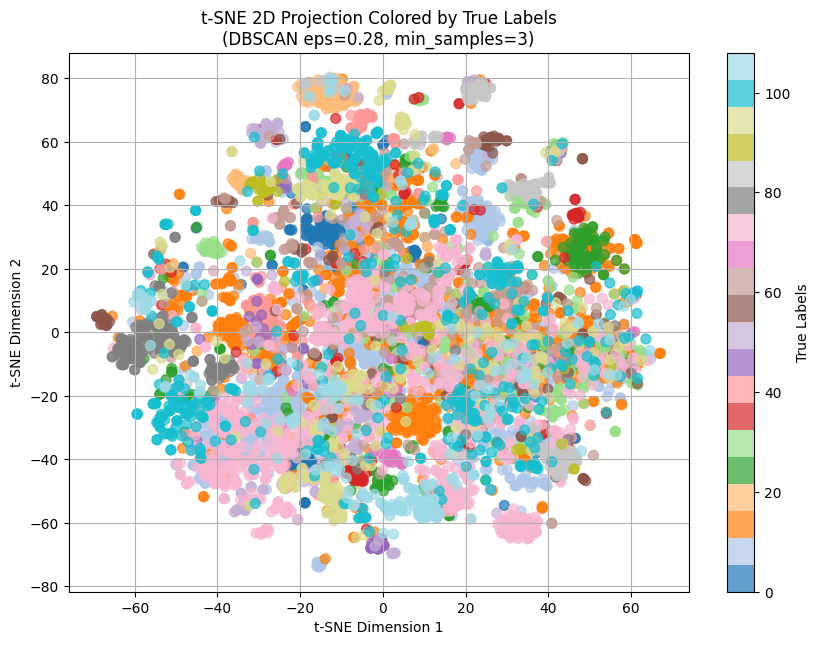

In [ ]:
#@title Visualisation
from sklearn.cluster import DBSCAN
from sklearn.manifold import TSNE
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

true_labels = evaluation_df['event_label'].values  # Use evaluation labels
best_params_eps=0.28
best_params_min_samples=3

# Run DBSCAN with best params on evaluation embeddings
best_dbscan = DBSCAN(eps=best_params_eps, min_samples=int(best_params_min_samples), metric='cosine')
best_cluster_labels = best_dbscan.fit_predict(evaluation_embeddings)

# t-SNE dimensionality reduction to 2D on evaluation embeddings
tsne = TSNE(n_components=2, random_state=42, init='pca')
reduced_embeddings = tsne.fit_transform(evaluation_embeddings)

# Plotting
plt.figure(figsize=(10, 7))
scatter = plt.scatter(
    reduced_embeddings[:, 0], reduced_embeddings[:, 1],
    c=true_labels, cmap='tab20', alpha=0.7, s=50
)
plt.colorbar(scatter, label='True Labels')
plt.title(f"t-SNE 2D Projection Colored by True Labels\n(DBSCAN eps={best_params_eps:.2f}, min_samples={int(best_params_min_samples)})")
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.grid(True)
plt.show()


## DBSCAN, With FasText Embedding + Named Entities as siplited

In [13]:
#@title Install Fast Text Model
# !pip install fasttext
!wget https://dl.fbaipublicfiles.com/fasttext/vectors-crawl/cc.ar.300.vec.gz
!gunzip cc.ar.300.vec.gz


--2025-07-02 04:51:22--  https://dl.fbaipublicfiles.com/fasttext/vectors-crawl/cc.ar.300.vec.gz
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 3.167.112.51, 3.167.112.53, 3.167.112.66, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|3.167.112.51|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1272365870 (1.2G) [binary/octet-stream]
Saving to: ‘cc.ar.300.vec.gz’

cc.ar.300.vec.gz    100%[===================>]   1.18G  89.6MB/s    in 11s     

2025-07-02 04:51:33 (106 MB/s) - ‘cc.ar.300.vec.gz’ saved [1272365870/1272365870]



In [16]:
#@title Initialize Stanza Pipeline
import numpy as np
import nltk
import stanza
from gensim.models import KeyedVectors
from nltk.corpus import stopwords

# Download necessary resources (only run once)
nltk.download('stopwords')
stanza.download('ar')

# Load Arabic stopwords from NLTK
ARABIC_STOPWORDS = set(stopwords.words('arabic'))

# Initialize Stanza Arabic pipeline for tokenization
nlp = stanza.Pipeline(lang='ar', processors='tokenize', tokenize_no_ssplit=True)

# Tokenization function
def stanza_tokenize(text):
    doc = nlp(text)
    return [word.text for sentence in doc.sentences for word in sentence.words]

# Tweet embedding function using FastText + Stanza + NLTK stopwords
def embed_tweet(text, model):
    tokens = stanza_tokenize(text)
    # Remove stopwords
    filtered_tokens = [token for token in tokens if token not in ARABIC_STOPWORDS]
    # Embed
    vectors = [model[token] for token in filtered_tokens if token in model]
    if not vectors:
        return np.zeros(model.vector_size)
    return np.mean(vectors, axis=0)

def embed_tweet_with_verb_weight(text, verbs, model, verb_weight=2.0):
    tokens = stanza_tokenize(text)
    filtered_tokens = [token for token in tokens if token not in ARABIC_STOPWORDS]

    vectors = []

    for token in filtered_tokens:
        if token in model:
            weight = verb_weight if token in verbs else 1.0
            vectors.append(weight * model[token])

    if not vectors:
        return np.zeros(model.vector_size)

    return np.mean(vectors, axis=0)


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Downloading default packages for language: ar (Arabic) ...


INFO:stanza:Downloaded file to /root/stanza_resources/ar/default.zip
INFO:stanza:Finished downloading models and saved to /root/stanza_resources
INFO:stanza:Checking for updates to resources.json in case models have been updated.  Note: this behavior can be turned off with download_method=None or download_method=DownloadMethod.REUSE_RESOURCES


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Loading these models for language: ar (Arabic):
| Processor | Package |
-----------------------
| tokenize  | padt    |
| mwt       | padt    |

INFO:stanza:Using device: cpu
INFO:stanza:Loading: tokenize
INFO:stanza:Loading: mwt
INFO:stanza:Done loading processors!


In [17]:
#@title Load the model

from gensim.models import KeyedVectors

# Load the .vec file (pre-trained FastText embeddings in text format)
fasttext_model = KeyedVectors.load_word2vec_format('cc.ar.300.vec', binary=False, encoding='utf-8')


In [18]:
#@title Embeddding the Tweets
from tqdm import tqdm

# tweets = df['Tweet Text'].tolist()
# embeddings = np.array([
#     embed_tweet(text, fasttext_model) for text in tqdm(tweets)
# ])

embeddings = []
for i in tqdm(range(len(df)), desc="Embedding tweets with verb weighting"):
    text = df.at[i, 'Tweet Text']
    verbs = df.at[i, 'verbs']  # This should be a list of verb tokens
    vec = embed_tweet_with_verb_weight(text, verbs, fasttext_model, verb_weight=2.0)
    embeddings.append(vec)

embeddings = np.array(embeddings)


Embedding tweets with verb weighting: 100%|██████████| 6998/6998 [04:33<00:00, 25.55it/s]


In [19]:
#@title 🧠 EmbedEntity Lists
from tqdm import tqdm
import re

ARABIC_STOPWORDS = set(stopwords.words('arabic'))

# Normalize Arabic text
def normalize_arabic(text):
    text = re.sub(r'[\u064B-\u065F]', '', text)  # diacritics
    text = re.sub(r'[إأآا]', 'ا', text)
    text = re.sub(r'ى', 'ي', text)
    text = re.sub(r'ؤ', 'و', text)
    text = re.sub(r'ئ', 'ي', text)
    text = re.sub(r'ة', 'ه', text)
    text = re.sub(r'[^\w\s]', '', text)  # punctuation
    return text.strip()

# Initialize Stanza pipeline
nlp = stanza.Pipeline(lang='ar', processors='tokenize', tokenize_no_ssplit=True)

# Tokenizer using stanza
def stanza_tokenize(text):
    doc = nlp(text)
    return [word.text for sentence in doc.sentences for word in sentence.words]



# Embed a full tweet text
def embed_text(text, model):
    tokens = stanza_tokenize(text)
    tokens = [normalize_arabic(t) for t in tokens if t not in ARABIC_STOPWORDS]
    vectors = [model[t] for t in tokens if t in model]
    if not vectors:
        return np.zeros(model.vector_size)
    return np.mean(vectors, axis=0)

# Embed list of entity tokens (e.g. PER, ORG)
def embed_token_list(token_list, model):
    if not token_list:
        return np.zeros(model.vector_size)
    tokens_norm = [normalize_arabic(t) for t in token_list if isinstance(t, str)]
    vectors = [model[t] for t in tokens_norm if t in model]
    if not vectors:
        return np.zeros(model.vector_size)
    return np.mean(vectors, axis=0)

#@title 🛠️ Apply Embedding Functions to DataFrame

tqdm.pandas(desc="Embedding tweets/entities")

# Ensure correct format
for col in ['PER', 'ORG', 'LOC']:
    if isinstance(df[col].iloc[0], str):
        df[col] = df[col].apply(eval)

# Embed each component
df['per_emb'] = df['PER'].progress_apply(lambda x: embed_token_list(x, fasttext_model))
df['org_emb'] = df['ORG'].progress_apply(lambda x: embed_token_list(x, fasttext_model))
df['loc_emb'] = df['LOC'].progress_apply(lambda x: embed_token_list(x, fasttext_model))
df['hastags_emb'] = df['Hashtags'].progress_apply(lambda x: embed_token_list(x, fasttext_model))



INFO:stanza:Checking for updates to resources.json in case models have been updated.  Note: this behavior can be turned off with download_method=None or download_method=DownloadMethod.REUSE_RESOURCES


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Loading these models for language: ar (Arabic):
| Processor | Package |
-----------------------
| tokenize  | padt    |
| mwt       | padt    |

INFO:stanza:Using device: cpu
INFO:stanza:Loading: tokenize
INFO:stanza:Loading: mwt
INFO:stanza:Done loading processors!
Embedding tweets/entities: 100%|██████████| 6998/6998 [00:00<00:00, 291315.05it/s]


In [22]:
#@title 🔻 Reduce Entity Embeddings Using PCA
from sklearn.decomposition import PCA

# Fit separate PCA for each type
pca_per = PCA(n_components=32, random_state=42)
pca_org = PCA(n_components=32, random_state=42)
pca_loc = PCA(n_components=32, random_state=42)
pca_hash = PCA(n_components=32, random_state=42)

# Apply PCA to each type
per_32d = pca_per.fit_transform(np.vstack(df['per_emb'].values))
org_32d = pca_org.fit_transform(np.vstack(df['org_emb'].values))
loc_32d = pca_loc.fit_transform(np.vstack(df['loc_emb'].values))
hashtags_32d = pca_hash.fit_transform(np.vstack(df['hastags_emb'].values))

# Store reduced embeddings
df['per_emb_32d'] = list(per_32d)
df['org_emb_32d'] = list(org_32d)
df['loc_emb_32d'] = list(loc_32d)
df['hashtags_32d'] = list(hashtags_32d)


/usr/local/lib/python3.11/dist-packages/sklearn/decomposition/_pca.py:648: RuntimeWarning: invalid value encountered in divide
  explained_variance_ratio_ = explained_variance_ / total_var


In [23]:
#@title Save the Embedding
# Convert embeddings to a regular list
# df['fasttext_embeddings'] = embeddings.tolist()
embeddings = np.array(embeddings)
df['fasttext_embeddings'] = [
    np.hstack([
        embeddings[i],  # FastText average vector (300d)
        df.at[i, 'per_emb_32d'],
        df.at[i, 'org_emb_32d'],
        df.at[i, 'loc_emb_32d'],
        df.at[i, 'hashtags_32d']
    ])
    for i in range(len(df))
]
print("✅ Sample vector shape:", df['fasttext_embeddings'].iloc[0].shape)

# # Convert to DataFrame
# embedding_df = pd.DataFrame(embeddings)

# # Save
# embedding_df.to_csv("tweet_embeddings.csv", index=False)


✅ Sample vector shape: (428,)


In [25]:
#  @title Load the embedding for the tuning and evaluation df

# Convert string embeddings to actual Python lists
# tuning_df['fasttext_embeddings'] = tuning_df['fasttext_embeddings'].apply(ast.literal_eval)
# evaluation_df['fasttext_embeddings'] = evaluation_df['fasttext_embeddings'].apply(ast.literal_eval)

# Convert list of embeddings (stored as lists) into 2D numpy arrays
tuning_embeddings = np.vstack(tuning_df['fasttext_embeddings'].apply(np.array).values)
evaluation_embeddings = np.vstack(evaluation_df['fasttext_embeddings'].apply(np.array).values)

print(f"Tuning embeddings shape: {tuning_embeddings.shape}")
print(f"Evaluation embeddings shape: {evaluation_embeddings.shape}")


Tuning embeddings shape: (934, 428)
Evaluation embeddings shape: (6064, 428)


In [26]:

#@title Define range of DBSCAN parameters to tune
# eps_values = np.arange(0.02, 0.66, 0.02)        # Distance threshold
eps_values = np.arange(0.02, 0.18, 0.01)        # Distance threshold
min_samples_values = np.arange(3,10,1)         # Minimum samples in neighborhood
dim_values = [32, 64, 96, 128, 160, 192, 256, 300,360,428]
best_score = -1
best_params = None


In [27]:
#@title Analyze the Effect of DBSCAN's epsilon Parameter on Clustering Results
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results_tuning = []
results_eval = []

# Tune over eps
for eps in eps_values:
    for min_samples in min_samples_values:
        # --- Tuning ---
        dbscan_tuning = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

        if len(set(cluster_labels_tuning)) > 1 and (cluster_labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, cluster_labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- Evaluation ---
        dbscan_eval = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_eval = dbscan_eval.fit_predict(evaluation_embeddings)

        if len(set(cluster_labels_eval)) > 1 and (cluster_labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, cluster_labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# Aggregate over min_samples
agg_tuning = df_tuning.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval = df_eval.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()



Best eps based on NMI (Tuning Set): eps = 0.13, NMI = 0.3128


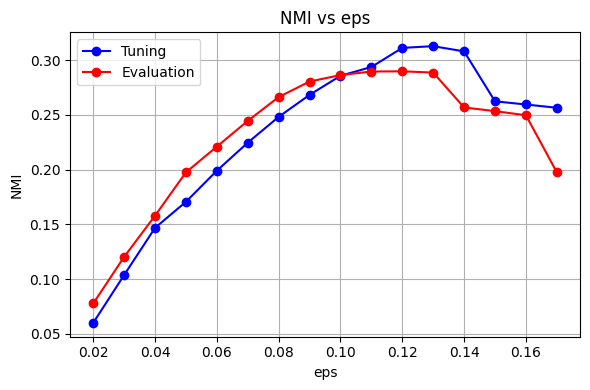

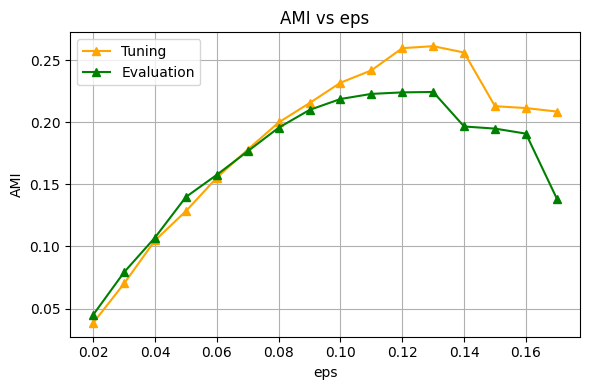

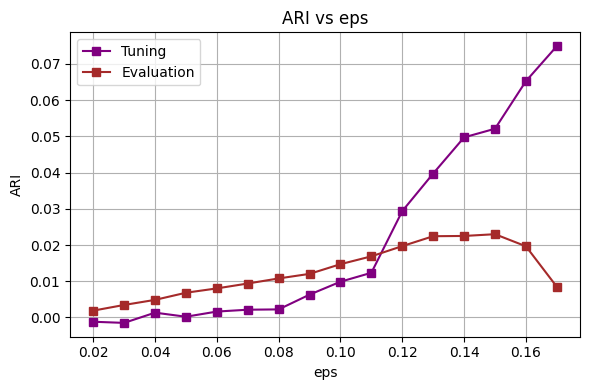

In [28]:
#@title the Effect of DBSCAN's epsilon Parameter on Clustering Result

# Print best eps based on NMI from tuning set
best_eps_row = agg_tuning.loc[agg_tuning['nmi'].idxmax()]
print(f"Best eps based on NMI (Tuning Set): eps = {best_eps_row['eps']:.2f}, NMI = {best_eps_row['nmi']:.4f}")

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs eps')
plt.xlabel('eps')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ami'], marker='^', color='orange', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs eps')
plt.xlabel('eps')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ari'], marker='s', color='purple', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs eps')
plt.xlabel('eps')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [29]:
#@title Analyze the Effect of DBSCAN's Min Samples   Parameter on Clustering Result

true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results_tuning = []
results_eval = []

# Iterate over eps and min_samples combinations
for eps in eps_values:
    for min_samples in min_samples_values:
        # --- Tuning ---
        dbscan_tuning = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

        if len(set(cluster_labels_tuning)) > 1 and (cluster_labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, cluster_labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- Evaluation ---
        dbscan_eval = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_eval = dbscan_eval.fit_predict(evaluation_embeddings)

        if len(set(cluster_labels_eval)) > 1 and (cluster_labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, cluster_labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# === Aggregate over eps to study the effect of min_samples ===
agg_tuning_min = df_tuning.groupby('min_samples')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval_min = df_eval.groupby('min_samples')[['nmi', 'ari', 'ami']].mean().reset_index()



Best min_samples based on NMI (Tuning Set): min_samples = 3, NMI = 0.2753


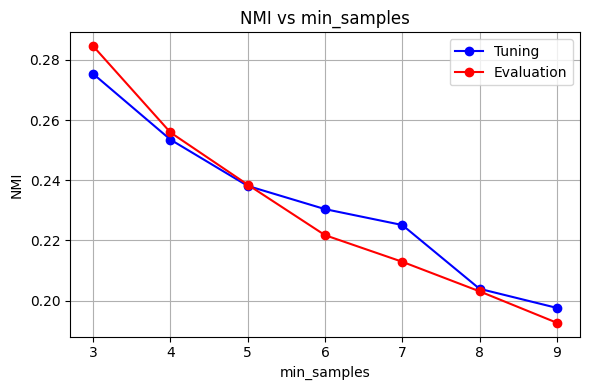

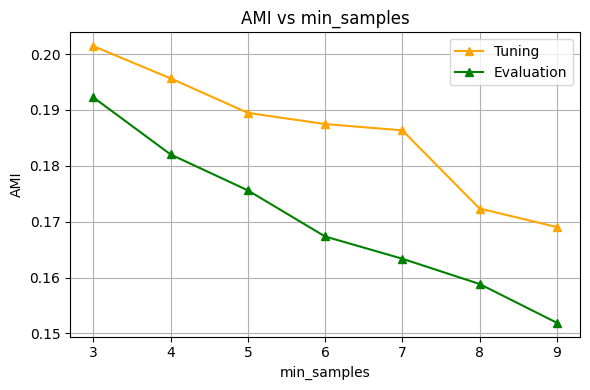

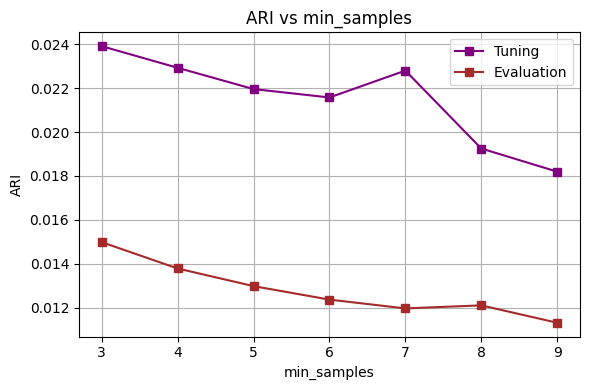

In [30]:
#@title Analyze the Effect of DBSCAN's Min Samples   Parameter on Clustering Result

# Print best min_samples based on NMI from tuning set
best_minsample_row = agg_tuning_min.loc[agg_tuning_min['nmi'].idxmax()]
print(f"Best min_samples based on NMI (Tuning Set): min_samples = {int(best_minsample_row['min_samples'])}, NMI = {best_minsample_row['nmi']:.4f}")

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['ami'], marker='^', color='orange', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['ari'], marker='s', color='purple', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [31]:
#@title Analyze the Effect of PCA Dimensionality Reduction on DBSCAN Clustering Result

from sklearn.decomposition import PCA
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score
from sklearn.cluster import DBSCAN

# --- Settings ---

eps_best = 0.11
min_samples_best = 3

# True labels
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

dim_results = []

for dim in dim_values:
    # Reduce embeddings
    pca = PCA(n_components=dim)
    reduced_tuning = pca.fit_transform(tuning_embeddings)
    reduced_eval = pca.transform(evaluation_embeddings)

    # --- Tuning clustering ---
    dbscan_tuning = DBSCAN(eps=eps_best, min_samples=min_samples_best, metric='cosine')
    cluster_tuning = dbscan_tuning.fit_predict(reduced_tuning)

    if len(set(cluster_tuning)) > 1 and (cluster_tuning != -1).any():
        nmi = normalized_mutual_info_score(true_labels_tuning, cluster_tuning)
        ari = adjusted_rand_score(true_labels_tuning, cluster_tuning)
        ami = adjusted_mutual_info_score(true_labels_tuning, cluster_tuning)
    else:
        nmi = ari = ami = 0

    # --- Eval clustering ---
    dbscan_eval = DBSCAN(eps=eps_best, min_samples=min_samples_best, metric='cosine')
    cluster_eval = dbscan_eval.fit_predict(reduced_eval)

    if len(set(cluster_eval)) > 1 and (cluster_eval != -1).any():
        nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_eval)
        ari_e = adjusted_rand_score(true_labels_eval, cluster_eval)
        ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_eval)
    else:
        nmi_e = ari_e = ami_e = 0

    dim_results.append({
        'dim': dim,
        'nmi_tuning': nmi,
        'ari_tuning': ari,
        'ami_tuning': ami,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

# Convert to DataFrame
dim_df = pd.DataFrame(dim_results)


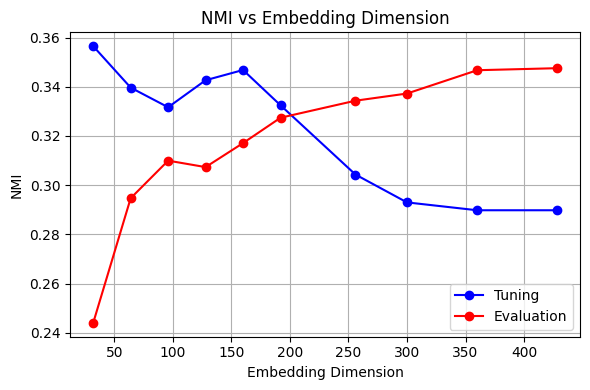

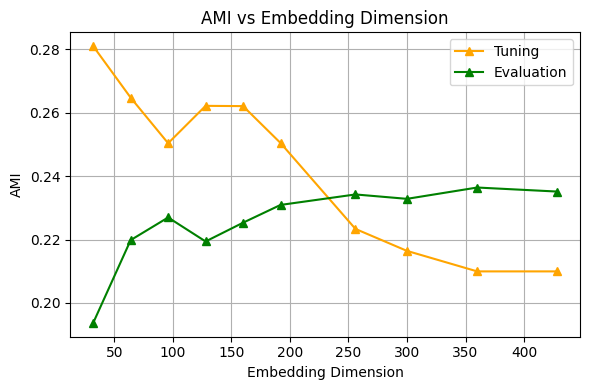

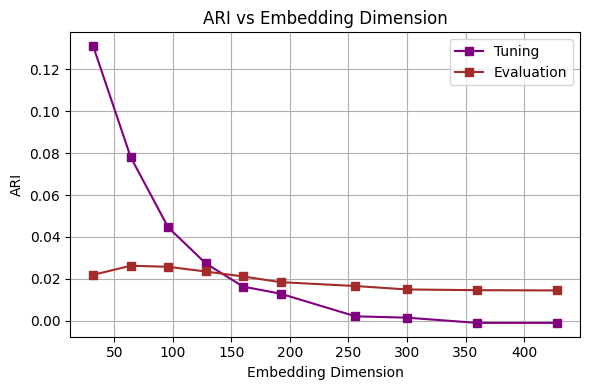

In [32]:
#@title the Effect of PCA Dimensionality Reduction on DBSCAN Clustering Performance

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['nmi_tuning'], marker='o', label='Tuning', color='blue')
plt.plot(dim_df['dim'], dim_df['nmi_eval'], marker='o', label='Evaluation', color='red')
plt.title('NMI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['ami_tuning'], marker='^', label='Tuning', color='orange')
plt.plot(dim_df['dim'], dim_df['ami_eval'], marker='^', label='Evaluation', color='green')
plt.title('AMI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['ari_tuning'], marker='s', label='Tuning', color='purple')
plt.plot(dim_df['dim'], dim_df['ari_eval'], marker='s', label='Evaluation', color='brown')
plt.title('ARI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [33]:

#@title Grid search on tuning set
from sklearn.decomposition import PCA
from umap import UMAP
from sklearn.cluster import DBSCAN
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

# Parameters for grid search
reducers = {
    'PCA': PCA,
    'UMAP': UMAP
}

true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results = []

# Grid search on tuning set
for reducer_name, reducer_cls in reducers.items():
    for dim in dim_values:
        print(f"Reducing tuning data to {dim}D using {reducer_name}...")
        reducer = reducer_cls(n_components=dim, random_state=42)
        reduced_tuning = reducer.fit_transform(tuning_embeddings)

        for eps in eps_values:
            for min_samples in min_samples_values:
                dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
                cluster_labels = dbscan.fit_predict(reduced_tuning)

                if len(set(cluster_labels)) > 1 and (cluster_labels != -1).any():
                    nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels)
                    ari = adjusted_rand_score(true_labels_tuning, cluster_labels)
                    ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels)
                else:
                    nmi = ari = ami = 0

                results.append({
                    'reducer': reducer_name,
                    'dim': dim,
                    'eps': eps,
                    'min_samples': min_samples,
                    'nmi': nmi,
                    'ari': ari,
                    'ami': ami,
                    'reduced_tuning': reduced_tuning
                })

results_df = pd.DataFrame(results)


Reducing tuning data to 32D using PCA...
Reducing tuning data to 64D using PCA...
Reducing tuning data to 96D using PCA...
Reducing tuning data to 128D using PCA...
Reducing tuning data to 160D using PCA...
Reducing tuning data to 192D using PCA...
Reducing tuning data to 256D using PCA...
Reducing tuning data to 300D using PCA...
Reducing tuning data to 360D using PCA...
Reducing tuning data to 428D using PCA...
Reducing tuning data to 32D using UMAP...
Reducing tuning data to 64D using UMAP...
Reducing tuning data to 96D using UMAP...
Reducing tuning data to 128D using UMAP...
Reducing tuning data to 160D using UMAP...
Reducing tuning data to 192D using UMAP...
Reducing tuning data to 256D using UMAP...
Reducing tuning data to 300D using UMAP...
Reducing tuning data to 360D using UMAP...
Reducing tuning data to 428D using UMAP...


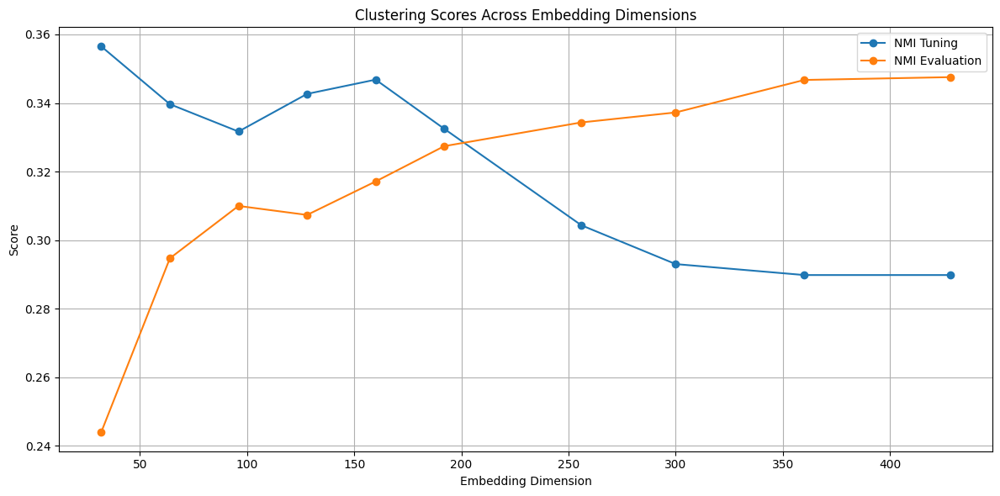

In [34]:
#@title Nmi vs  Dim
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Plot NMI
plt.plot(dim_df['dim'], dim_df['nmi_tuning'], label='NMI Tuning', marker='o')
plt.plot(dim_df['dim'], dim_df['nmi_eval'], label='NMI Evaluation', marker='o')

# # Plot ARI
# plt.plot(dim_df['dim'], dim_df['ari_tuning'], label='ARI Tuning', marker='s')
# plt.plot(dim_df['dim'], dim_df['ari_eval'], label='ARI Evaluation', marker='s')

# # Plot AMI
# plt.plot(dim_df['dim'], dim_df['ami_tuning'], label='AMI Tuning', marker='^')
# plt.plot(dim_df['dim'], dim_df['ami_eval'], label='AMI Evaluation', marker='^')

plt.title('Clustering Scores Across Embedding Dimensions')
plt.xlabel('Embedding Dimension')
plt.ylabel('Score')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [35]:
#@title Best Params
# Get best tuning config by NMI
best_config = results_df.loc[results_df['nmi'].idxmax()]
print("Best NMI config on tuning set:")
print(best_config[['reducer', 'dim', 'eps', 'min_samples', 'nmi', 'ari', 'ami']])

# Using best config, transform evaluation embeddings and evaluate clustering
best_reducer_cls = reducers[best_config['reducer']]
best_dim = best_config['dim']
best_eps = best_config['eps']
best_min_samples = best_config['min_samples']

reducer = best_reducer_cls(n_components=best_dim, random_state=42)
reduced_tuning_best = reducer.fit_transform(tuning_embeddings)
reduced_eval_best = reducer.transform(evaluation_embeddings)

dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

cluster_labels_tuning = dbscan.fit_predict(reduced_tuning_best)
cluster_labels_eval = dbscan.fit_predict(reduced_eval_best)

def safe_scores(true, pred):
    if len(set(pred)) > 1 and (pred != -1).any():
        nmi = normalized_mutual_info_score(true, pred)
        ari = adjusted_rand_score(true, pred)
        ami = adjusted_mutual_info_score(true, pred)
    else:
        nmi = ari = ami = 0
    return nmi, ari, ami

nmi_tuning, ari_tuning, ami_tuning = safe_scores(true_labels_tuning, cluster_labels_tuning)
nmi_eval, ari_eval, ami_eval = safe_scores(true_labels_eval, cluster_labels_eval)

print("\nEvaluation metrics with best tuning config:")
print(f"NMI: {nmi_eval:.4f}, ARI: {ari_eval:.4f}, AMI: {ami_eval:.4f}")

# Summarize metrics for each dimension using best eps and min_samples
dim_metrics = []



Best NMI config on tuning set:
reducer             PCA
dim                 160
eps                0.13
min_samples           3
nmi            0.358377
ari            0.039742
ami            0.278136
Name: 525, dtype: object

Evaluation metrics with best tuning config:
NMI: 0.3174, ARI: 0.0258, AMI: 0.2301


In [36]:
#@title Summarize clustering scores across embedding dimensions for best tuning hyperparameters

dim_metrics = []

for dim in dim_values:
    # Initialize reducer with the current dimension
    reducer = best_reducer_cls(n_components=dim, random_state=42)

    # Fit transform tuning embeddings and transform evaluation embeddings
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    # Initialize DBSCAN with best hyperparameters from tuning
    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    # Predict cluster labels on tuning and evaluation sets
    labels_tuning = dbscan.fit_predict(reduced_tuning)
    labels_eval = dbscan.fit_predict(reduced_eval)

    # Compute scores safely
    nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, labels_tuning)
    nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, labels_eval)

    # Append results
    dim_metrics.append({
        'dim': dim,
        'nmi_tuning': nmi_t,
        'ari_tuning': ari_t,
        'ami_tuning': ami_t,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

# Create DataFrame for easier visualization
dim_df = pd.DataFrame(dim_metrics)

print("\nSummary of clustering metrics across embedding dimensions:")
print(dim_df.to_string(index=False))



Summary of clustering metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval
  32    0.310768    0.116971    0.233100  0.102740  0.003612  0.058212
  64    0.339525    0.098136    0.264322  0.287462  0.025960  0.218901
  96    0.319803    0.061651    0.241226  0.299250  0.026500  0.221676
 128    0.346103    0.045962    0.263739  0.302463  0.026885  0.220124
 160    0.358377    0.039742    0.278136  0.317385  0.025843  0.230141
 192    0.350069    0.030134    0.265915  0.317266  0.023713  0.227824
 256    0.336726    0.012115    0.251936  0.331390  0.019560  0.235497
 300    0.332039    0.012366    0.248608  0.337774  0.018549  0.238306
 360    0.335456    0.012754    0.250689  0.342261  0.017574  0.240236
 428    0.329374    0.010748    0.245563  0.343307  0.017669  0.239116


In [37]:
#@title The Results of the Clustering
dim_metrics = []

for dim in dim_values:
    reducer = best_reducer_cls(n_components=dim, random_state=42)
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    print(f"Using eps = {best_eps}, min_samples = {best_min_samples} for dim = {dim}")

    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    labels_tuning = dbscan.fit_predict(reduced_tuning)
    labels_eval = dbscan.fit_predict(reduced_eval)

    nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, labels_tuning)
    nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, labels_eval)

    dim_metrics.append({
        'dim': dim,
        'nmi_tuning': nmi_t,
        'ari_tuning': ari_t,
        'ami_tuning': ami_t,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

dim_df = pd.DataFrame(dim_metrics)

print("\nSummary of metrics across embedding dimensions:")
print(dim_df.to_string(index=False))


Using eps = 0.12999999999999998, min_samples = 3 for dim = 32
Using eps = 0.12999999999999998, min_samples = 3 for dim = 64
Using eps = 0.12999999999999998, min_samples = 3 for dim = 96
Using eps = 0.12999999999999998, min_samples = 3 for dim = 128
Using eps = 0.12999999999999998, min_samples = 3 for dim = 160
Using eps = 0.12999999999999998, min_samples = 3 for dim = 192
Using eps = 0.12999999999999998, min_samples = 3 for dim = 256
Using eps = 0.12999999999999998, min_samples = 3 for dim = 300
Using eps = 0.12999999999999998, min_samples = 3 for dim = 360
Using eps = 0.12999999999999998, min_samples = 3 for dim = 428

Summary of metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval
  32    0.310768    0.116971    0.233100  0.102740  0.003612  0.058212
  64    0.339525    0.098136    0.264322  0.287462  0.025960  0.218901
  96    0.319803    0.061651    0.241226  0.299250  0.026500  0.221676
 128    0.346103    0.045962    0.263739

In [38]:
#@title Clustering and Topic Modeling Metrics Summary Across Embedding Dimensions
from sklearn.metrics import silhouette_score
from gensim.corpora import Dictionary
from gensim.models.coherencemodel import CoherenceModel

def safe_silhouette_score(X, labels):
    if len(set(labels)) > 1 and len(X) > len(set(labels)):
        return silhouette_score(X, labels, metric='cosine')
    return -1

def get_topic_coherence(texts, labels, coherence_type='c_v'):
    clustered_docs = {}
    for text, label in zip(texts, labels):
        if label == -1:
            continue
        clustered_docs.setdefault(label, []).append(text)

    topics = [docs for docs in clustered_docs.values() if len(docs) >= 3]

    if len(topics) == 0:
        return -1

    tokenized_topics = [[word for doc in topic for word in doc.split()] for topic in topics]

    dictionary = Dictionary(tokenized_topics)
    corpus = [dictionary.doc2bow(text) for text in tokenized_topics]

    coherence_model = CoherenceModel(
        topics=tokenized_topics,
        texts=tokenized_topics,
        corpus=corpus,
        dictionary=dictionary,
        coherence=coherence_type
    )

    return coherence_model.get_coherence()

# Ground truth number of events (true clusters)
true_events_tuning = len(set(tuning_df['event_label']))
true_events_eval = len(set(evaluation_df['event_label']))

# Initialize list for metrics
additional_metrics = []

for dim in dim_values:
    reducer = best_reducer_cls(n_components=dim, random_state=42)
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    # Tuning
    labels_tuning = dbscan.fit_predict(reduced_tuning)
    silhouette_t = safe_silhouette_score(reduced_tuning, labels_tuning)
    num_clusters_t = len(set(labels_tuning)) - (1 if -1 in labels_tuning else 0)
    coherence_t_cv = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='c_v')
    coherence_t_umass = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='u_mass')

    # Evaluation
    labels_eval = dbscan.fit_predict(reduced_eval)
    silhouette_e = safe_silhouette_score(reduced_eval, labels_eval)
    num_clusters_e = len(set(labels_eval)) - (1 if -1 in labels_eval else 0)
    coherence_e_cv = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='c_v')
    coherence_e_umass = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='u_mass')

    additional_metrics.append({
        'dim': dim,
        'true_events_tuning': true_events_tuning,
        'true_events_eval': true_events_eval,
        'silhouette_tuning': silhouette_t,
        'num_clusters_tuning': num_clusters_t,
        'coherence_tuning_c_v': coherence_t_cv,
        'coherence_tuning_u_mass': coherence_t_umass,
        'silhouette_eval': silhouette_e,
        'num_clusters_eval': num_clusters_e,
        'coherence_eval_c_v': coherence_e_cv,
        'coherence_eval_u_mass': coherence_e_umass
    })

# Merge with original dim_df
extra_df = pd.DataFrame(additional_metrics)
dim_df = pd.merge(dim_df, extra_df, on='dim')

# Display full summary
print("\nSummary of all clustering metrics across embedding dimensions:")
print(dim_df.to_string(index=False))



Summary of all clustering metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval  true_events_tuning  true_events_eval  silhouette_tuning  num_clusters_tuning  coherence_tuning_c_v  coherence_tuning_u_mass  silhouette_eval  num_clusters_eval  coherence_eval_c_v  coherence_eval_u_mass
  32    0.310768    0.116971    0.233100  0.102740  0.003612  0.058212                  31               103           0.229887                   30              0.691368                -0.646756        -0.493093                 42            0.605770              -0.648007
  64    0.339525    0.098136    0.264322  0.287462  0.025960  0.218901                  31               103           0.157241                   30              0.721782                -0.674252         0.076029                 93            0.609560              -0.888013
  96    0.319803    0.061651    0.241226  0.299250  0.026500  0.221676                  31               103   

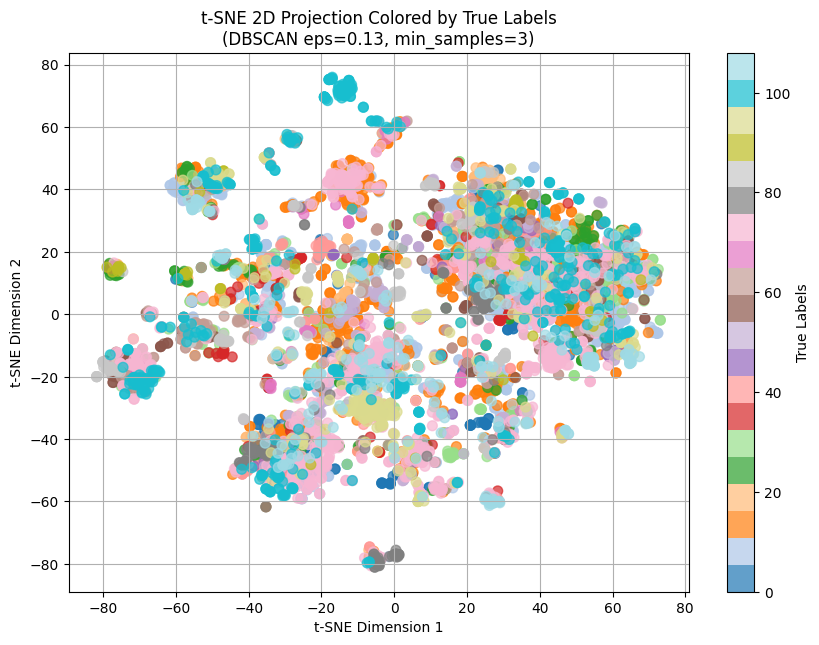

In [39]:
#@title Visualisation
from sklearn.cluster import DBSCAN
from sklearn.manifold import TSNE
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

true_labels = evaluation_df['event_label'].values  # Use evaluation labels
best_params_eps=0.13
best_params_min_samples=3

# Run DBSCAN with best params on evaluation embeddings
best_dbscan = DBSCAN(eps=best_params_eps, min_samples=int(best_params_min_samples), metric='cosine')
best_cluster_labels = best_dbscan.fit_predict(evaluation_embeddings)

# t-SNE dimensionality reduction to 2D on evaluation embeddings
tsne = TSNE(n_components=2, random_state=42, init='pca')
reduced_embeddings = tsne.fit_transform(evaluation_embeddings)

# Plotting
plt.figure(figsize=(10, 7))
scatter = plt.scatter(
    reduced_embeddings[:, 0], reduced_embeddings[:, 1],
    c=true_labels, cmap='tab20', alpha=0.7, s=50
)
plt.colorbar(scatter, label='True Labels')
plt.title(f"t-SNE 2D Projection Colored by True Labels\n(DBSCAN eps={best_params_eps:.2f}, min_samples={int(best_params_min_samples)})")
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.grid(True)
plt.show()


## DBSCAN, With FasText Embedding for only + Named Entities as siplited + verbs + nouns

In [ ]:
#@title Install Fast Text Model
# !pip install fasttext
!wget https://dl.fbaipublicfiles.com/fasttext/vectors-crawl/cc.ar.300.vec.gz
!gunzip cc.ar.300.vec.gz


--2025-07-02 04:51:22--  https://dl.fbaipublicfiles.com/fasttext/vectors-crawl/cc.ar.300.vec.gz
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 3.167.112.51, 3.167.112.53, 3.167.112.66, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|3.167.112.51|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1272365870 (1.2G) [binary/octet-stream]
Saving to: ‘cc.ar.300.vec.gz’

cc.ar.300.vec.gz    100%[===================>]   1.18G  89.6MB/s    in 11s     

2025-07-02 04:51:33 (106 MB/s) - ‘cc.ar.300.vec.gz’ saved [1272365870/1272365870]



In [ ]:
#@title Initialize Stanza Pipeline
import numpy as np
import nltk
import stanza
from gensim.models import KeyedVectors
from nltk.corpus import stopwords

# Download necessary resources (only run once)
nltk.download('stopwords')
stanza.download('ar')

# Load Arabic stopwords from NLTK
ARABIC_STOPWORDS = set(stopwords.words('arabic'))

# Initialize Stanza Arabic pipeline for tokenization
nlp = stanza.Pipeline(lang='ar', processors='tokenize', tokenize_no_ssplit=True)

# Tokenization function
def stanza_tokenize(text):
    doc = nlp(text)
    return [word.text for sentence in doc.sentences for word in sentence.words]

# Tweet embedding function using FastText + Stanza + NLTK stopwords
def embed_tweet(text, model):
    tokens = stanza_tokenize(text)
    # Remove stopwords
    filtered_tokens = [token for token in tokens if token not in ARABIC_STOPWORDS]
    # Embed
    vectors = [model[token] for token in filtered_tokens if token in model]
    if not vectors:
        return np.zeros(model.vector_size)
    return np.mean(vectors, axis=0)

def embed_tweet_with_verb_weight(text, verbs, model, verb_weight=2.0):
    tokens = stanza_tokenize(text)
    filtered_tokens = [token for token in tokens if token not in ARABIC_STOPWORDS]

    vectors = []

    for token in filtered_tokens:
        if token in model:
            weight = verb_weight if token in verbs else 1.0
            vectors.append(weight * model[token])

    if not vectors:
        return np.zeros(model.vector_size)

    return np.mean(vectors, axis=0)


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Downloading default packages for language: ar (Arabic) ...


INFO:stanza:Downloaded file to /root/stanza_resources/ar/default.zip
INFO:stanza:Finished downloading models and saved to /root/stanza_resources
INFO:stanza:Checking for updates to resources.json in case models have been updated.  Note: this behavior can be turned off with download_method=None or download_method=DownloadMethod.REUSE_RESOURCES


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Loading these models for language: ar (Arabic):
| Processor | Package |
-----------------------
| tokenize  | padt    |
| mwt       | padt    |

INFO:stanza:Using device: cpu
INFO:stanza:Loading: tokenize
INFO:stanza:Loading: mwt
INFO:stanza:Done loading processors!


In [ ]:
#@title Load the model

from gensim.models import KeyedVectors

# Load the .vec file (pre-trained FastText embeddings in text format)
fasttext_model = KeyedVectors.load_word2vec_format('cc.ar.300.vec', binary=False, encoding='utf-8')


In [ ]:
#@title Embeddding the Tweets
from tqdm import tqdm

# tweets = df['Tweet Text'].tolist()
# embeddings = np.array([
#     embed_tweet(text, fasttext_model) for text in tqdm(tweets)
# ])

embeddings = []
for i in tqdm(range(len(df)), desc="Embedding tweets with verb weighting"):
    text = df.at[i, 'Tweet Text']
    verbs = df.at[i, 'verbs']  # This should be a list of verb tokens
    vec = embed_tweet_with_verb_weight(text, verbs, fasttext_model, verb_weight=2.0)
    embeddings.append(vec)

embeddings = np.array(embeddings)


Embedding tweets with verb weighting: 100%|██████████| 6998/6998 [04:33<00:00, 25.55it/s]


In [41]:
#@title 🧠 EmbedEntity Lists
from tqdm import tqdm
import re

ARABIC_STOPWORDS = set(stopwords.words('arabic'))

# Normalize Arabic text
def normalize_arabic(text):
    text = re.sub(r'[\u064B-\u065F]', '', text)  # diacritics
    text = re.sub(r'[إأآا]', 'ا', text)
    text = re.sub(r'ى', 'ي', text)
    text = re.sub(r'ؤ', 'و', text)
    text = re.sub(r'ئ', 'ي', text)
    text = re.sub(r'ة', 'ه', text)
    text = re.sub(r'[^\w\s]', '', text)  # punctuation
    return text.strip()

# Initialize Stanza pipeline
nlp = stanza.Pipeline(lang='ar', processors='tokenize', tokenize_no_ssplit=True)

# Tokenizer using stanza
def stanza_tokenize(text):
    doc = nlp(text)
    return [word.text for sentence in doc.sentences for word in sentence.words]



# Embed a full tweet text
def embed_text(text, model):
    tokens = stanza_tokenize(text)
    tokens = [normalize_arabic(t) for t in tokens if t not in ARABIC_STOPWORDS]
    vectors = [model[t] for t in tokens if t in model]
    if not vectors:
        return np.zeros(model.vector_size)
    return np.mean(vectors, axis=0)

# Embed list of entity tokens (e.g. PER, ORG)
def embed_token_list(token_list, model):
    if not token_list:
        return np.zeros(model.vector_size)
    tokens_norm = [normalize_arabic(t) for t in token_list if isinstance(t, str)]
    vectors = [model[t] for t in tokens_norm if t in model]
    if not vectors:
        return np.zeros(model.vector_size)
    return np.mean(vectors, axis=0)

#@title 🛠️ Apply Embedding Functions to DataFrame

tqdm.pandas(desc="Embedding tweets/entities")

# Ensure correct format
for col in ['PER', 'ORG', 'LOC']:
    if isinstance(df[col].iloc[0], str):
        df[col] = df[col].apply(eval)

# Embed each component
df['per_emb'] = df['PER'].progress_apply(lambda x: embed_token_list(x, fasttext_model))
df['org_emb'] = df['ORG'].progress_apply(lambda x: embed_token_list(x, fasttext_model))
df['loc_emb'] = df['LOC'].progress_apply(lambda x: embed_token_list(x, fasttext_model))
df['hastags_emb'] = df['Hashtags'].progress_apply(lambda x: embed_token_list(x, fasttext_model))
df['verb_emb'] = df['verbs'].progress_apply(lambda x: embed_token_list(x, fasttext_model))
df['noun_emb'] = df['nouns'].progress_apply(lambda x: embed_token_list(x, fasttext_model))




INFO:stanza:Checking for updates to resources.json in case models have been updated.  Note: this behavior can be turned off with download_method=None or download_method=DownloadMethod.REUSE_RESOURCES


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Loading these models for language: ar (Arabic):
| Processor | Package |
-----------------------
| tokenize  | padt    |
| mwt       | padt    |

INFO:stanza:Using device: cpu
INFO:stanza:Loading: tokenize
INFO:stanza:Loading: mwt
INFO:stanza:Done loading processors!
Embedding tweets/entities: 100%|██████████| 6998/6998 [00:02<00:00, 2776.47it/s]


In [71]:
#@title 🔻 Reduce Entity Embeddings Using PCA
from sklearn.decomposition import PCA

# Fit separate PCA for each type
pca_per = PCA(n_components=32, random_state=42)
pca_org = PCA(n_components=32, random_state=42)
pca_loc = PCA(n_components=64, random_state=42)
pca_hash = PCA(n_components=32, random_state=42)
pca_verb = PCA(n_components=64, random_state=42)
pca_noun = PCA(n_components=64, random_state=42)


pca_tweet = PCA(n_components=256, random_state=42)


# Apply PCA to each type
per_32d = pca_per.fit_transform(np.vstack(df['per_emb'].values))
org_32d = pca_org.fit_transform(np.vstack(df['org_emb'].values))
loc_32d = pca_loc.fit_transform(np.vstack(df['loc_emb'].values))
hashtags_32d = pca_hash.fit_transform(np.vstack(df['hastags_emb'].values))
verb_32d = pca_hash.fit_transform(np.vstack(df['verb_emb'].values))
noun_32d = pca_hash.fit_transform(np.vstack(df['noun_emb'].values))

embeddings = pca_tweet.fit_transform(embeddings.tolist())

# Store reduced embeddings
df['per_emb_32d'] = list(per_32d)
df['org_emb_32d'] = list(org_32d)
df['loc_emb_32d'] = list(loc_32d)
df['hashtags_32d'] = list(hashtags_32d)
df['verb_32d'] = list(verb_32d)
df['noun_32d'] = list(noun_32d)

In [72]:
#@title Save the Embedding
# Convert embeddings to a regular list
# df['fasttext_embeddings'] = embeddings.tolist()
embeddings = np.array(embeddings)
df['fasttext_embeddings'] = [
    np.hstack([
        # embeddings[i],  # FastText average vector (300d)
        df.at[i, 'per_emb_32d'],
        df.at[i, 'org_emb_32d'],
        df.at[i, 'loc_emb_32d'],
        df.at[i, 'hashtags_32d'],
        df.at[i, 'verb_32d'],
        df.at[i, 'noun_32d'],

    ])
    for i in range(len(df))
]
print("✅ Sample vector shape:", df['fasttext_embeddings'].iloc[0].shape)

# # Convert to DataFrame
# embedding_df = pd.DataFrame(embeddings)

# # Save
# embedding_df.to_csv("tweet_embeddings.csv", index=False)


✅ Sample vector shape: (224,)


In [74]:
#  @title Load the embedding for the tuning and evaluation df

# Convert string embeddings to actual Python lists
# tuning_df['fasttext_embeddings'] = tuning_df['fasttext_embeddings'].apply(ast.literal_eval)
# evaluation_df['fasttext_embeddings'] = evaluation_df['fasttext_embeddings'].apply(ast.literal_eval)

# Convert list of embeddings (stored as lists) into 2D numpy arrays
tuning_embeddings = np.vstack(tuning_df['fasttext_embeddings'].apply(np.array).values)
evaluation_embeddings = np.vstack(evaluation_df['fasttext_embeddings'].apply(np.array).values)

print(f"Tuning embeddings shape: {tuning_embeddings.shape}")
print(f"Evaluation embeddings shape: {evaluation_embeddings.shape}")


Tuning embeddings shape: (934, 224)
Evaluation embeddings shape: (6064, 224)


In [82]:

#@title Define range of DBSCAN parameters to tune
# eps_values = np.arange(0.02, 0.66, 0.02)        # Distance threshold
eps_values = np.arange(0.07, 0.21, 0.01)        # Distance threshold
min_samples_values = np.arange(3,10,1)         # Minimum samples in neighborhood
dim_values = [32, 64, 96, 128, 160, 192, 224]
best_score = -1
best_params = None


In [75]:
#@title Analyze the Effect of DBSCAN's epsilon Parameter on Clustering Results
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results_tuning = []
results_eval = []

# Tune over eps
for eps in eps_values:
    for min_samples in min_samples_values:
        # --- Tuning ---
        dbscan_tuning = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

        if len(set(cluster_labels_tuning)) > 1 and (cluster_labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, cluster_labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- Evaluation ---
        dbscan_eval = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_eval = dbscan_eval.fit_predict(evaluation_embeddings)

        if len(set(cluster_labels_eval)) > 1 and (cluster_labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, cluster_labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# Aggregate over min_samples
agg_tuning = df_tuning.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval = df_eval.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()



Best eps based on NMI (Tuning Set): eps = 0.28, NMI = 0.2647


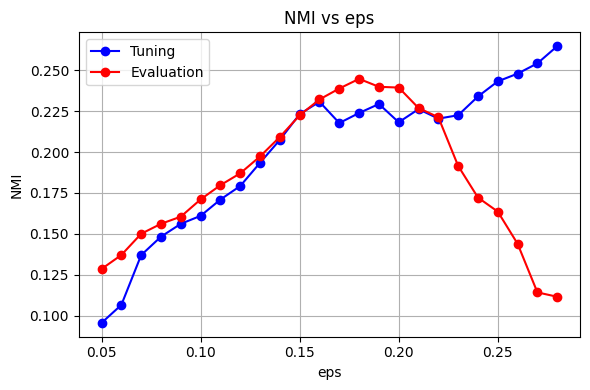

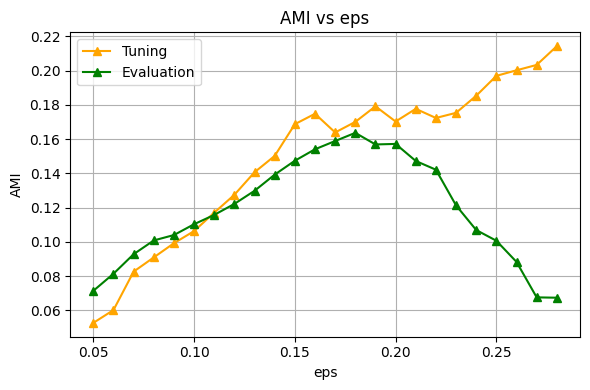

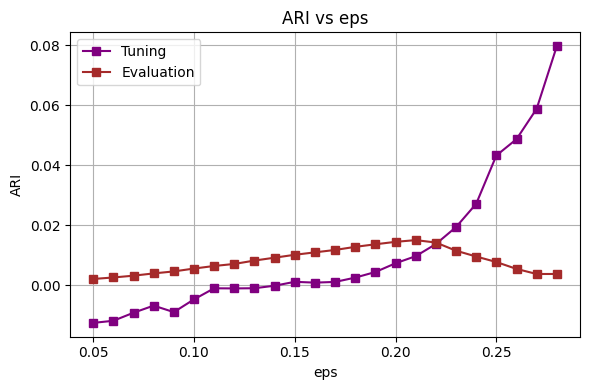

In [76]:
#@title the Effect of DBSCAN's epsilon Parameter on Clustering Result

# Print best eps based on NMI from tuning set
best_eps_row = agg_tuning.loc[agg_tuning['nmi'].idxmax()]
print(f"Best eps based on NMI (Tuning Set): eps = {best_eps_row['eps']:.2f}, NMI = {best_eps_row['nmi']:.4f}")

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs eps')
plt.xlabel('eps')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ami'], marker='^', color='orange', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs eps')
plt.xlabel('eps')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ari'], marker='s', color='purple', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs eps')
plt.xlabel('eps')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [79]:
#@title Analyze the Effect of DBSCAN's Min Samples   Parameter on Clustering Result

true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results_tuning = []
results_eval = []

# Iterate over eps and min_samples combinations
for eps in eps_values:
    for min_samples in min_samples_values:
        # --- Tuning ---
        dbscan_tuning = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

        if len(set(cluster_labels_tuning)) > 1 and (cluster_labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, cluster_labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- Evaluation ---
        dbscan_eval = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_eval = dbscan_eval.fit_predict(evaluation_embeddings)

        if len(set(cluster_labels_eval)) > 1 and (cluster_labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, cluster_labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# === Aggregate over eps to study the effect of min_samples ===
agg_tuning_min = df_tuning.groupby('min_samples')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval_min = df_eval.groupby('min_samples')[['nmi', 'ari', 'ami']].mean().reset_index()



Best min_samples based on NMI (Tuning Set): min_samples = 3, NMI = 0.2467


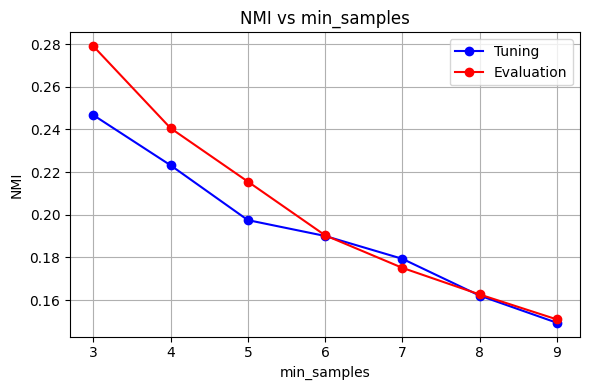

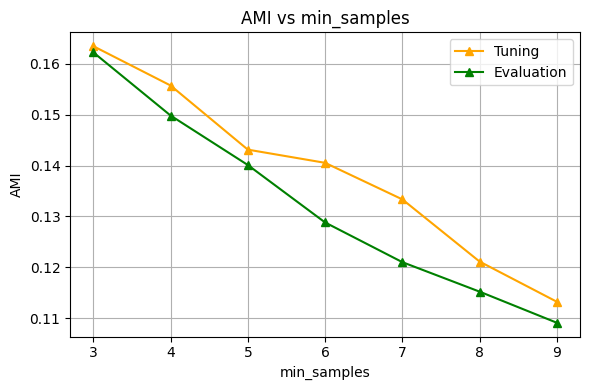

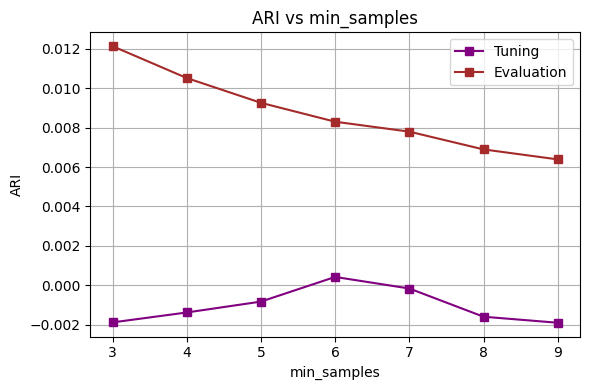

In [80]:
#@title Analyze the Effect of DBSCAN's Min Samples   Parameter on Clustering Result

# Print best min_samples based on NMI from tuning set
best_minsample_row = agg_tuning_min.loc[agg_tuning_min['nmi'].idxmax()]
print(f"Best min_samples based on NMI (Tuning Set): min_samples = {int(best_minsample_row['min_samples'])}, NMI = {best_minsample_row['nmi']:.4f}")

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['ami'], marker='^', color='orange', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['ari'], marker='s', color='purple', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [83]:
#@title Analyze the Effect of PCA Dimensionality Reduction on DBSCAN Clustering Result

from sklearn.decomposition import PCA
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score
from sklearn.cluster import DBSCAN

# --- Settings ---

eps_best = 0.16
min_samples_best = 3

# True labels
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

dim_results = []

for dim in dim_values:
    # Reduce embeddings
    pca = PCA(n_components=dim)
    reduced_tuning = pca.fit_transform(tuning_embeddings)
    reduced_eval = pca.transform(evaluation_embeddings)

    # --- Tuning clustering ---
    dbscan_tuning = DBSCAN(eps=eps_best, min_samples=min_samples_best, metric='cosine')
    cluster_tuning = dbscan_tuning.fit_predict(reduced_tuning)

    if len(set(cluster_tuning)) > 1 and (cluster_tuning != -1).any():
        nmi = normalized_mutual_info_score(true_labels_tuning, cluster_tuning)
        ari = adjusted_rand_score(true_labels_tuning, cluster_tuning)
        ami = adjusted_mutual_info_score(true_labels_tuning, cluster_tuning)
    else:
        nmi = ari = ami = 0

    # --- Eval clustering ---
    dbscan_eval = DBSCAN(eps=eps_best, min_samples=min_samples_best, metric='cosine')
    cluster_eval = dbscan_eval.fit_predict(reduced_eval)

    if len(set(cluster_eval)) > 1 and (cluster_eval != -1).any():
        nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_eval)
        ari_e = adjusted_rand_score(true_labels_eval, cluster_eval)
        ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_eval)
    else:
        nmi_e = ari_e = ami_e = 0

    dim_results.append({
        'dim': dim,
        'nmi_tuning': nmi,
        'ari_tuning': ari,
        'ami_tuning': ami,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

# Convert to DataFrame
dim_df = pd.DataFrame(dim_results)


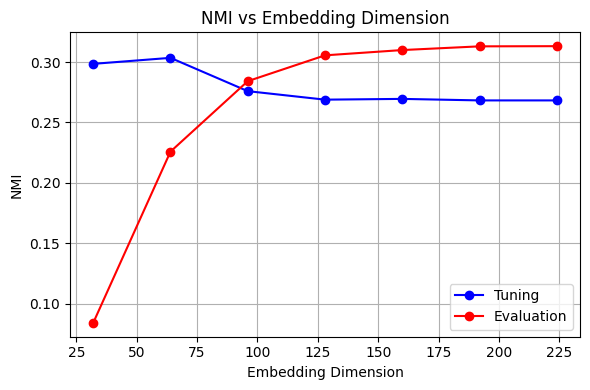

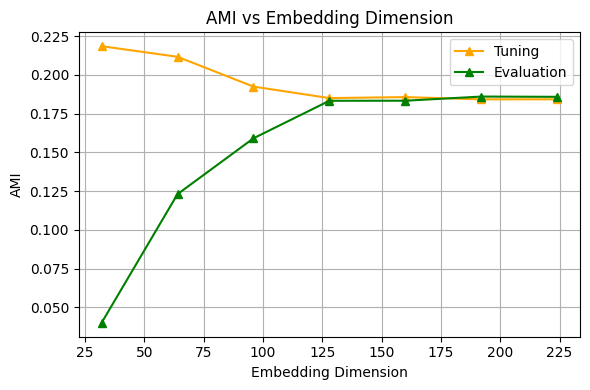

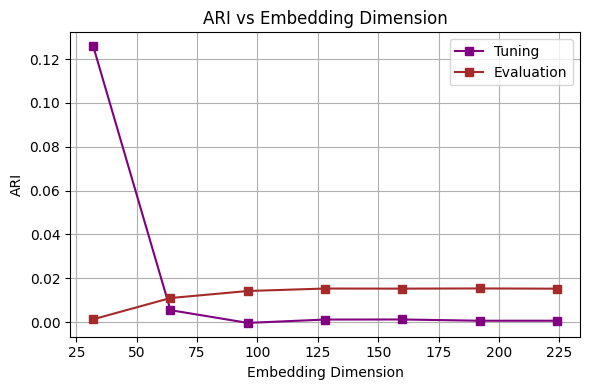

In [84]:
#@title the Effect of PCA Dimensionality Reduction on DBSCAN Clustering Performance

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['nmi_tuning'], marker='o', label='Tuning', color='blue')
plt.plot(dim_df['dim'], dim_df['nmi_eval'], marker='o', label='Evaluation', color='red')
plt.title('NMI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['ami_tuning'], marker='^', label='Tuning', color='orange')
plt.plot(dim_df['dim'], dim_df['ami_eval'], marker='^', label='Evaluation', color='green')
plt.title('AMI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['ari_tuning'], marker='s', label='Tuning', color='purple')
plt.plot(dim_df['dim'], dim_df['ari_eval'], marker='s', label='Evaluation', color='brown')
plt.title('ARI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [85]:

#@title Grid search on tuning set
from sklearn.decomposition import PCA
from umap import UMAP
from sklearn.cluster import DBSCAN
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

# Parameters for grid search
reducers = {
    'PCA': PCA,
    'UMAP': UMAP
}

true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results = []

# Grid search on tuning set
for reducer_name, reducer_cls in reducers.items():
    for dim in dim_values:
        print(f"Reducing tuning data to {dim}D using {reducer_name}...")
        reducer = reducer_cls(n_components=dim, random_state=42)
        reduced_tuning = reducer.fit_transform(tuning_embeddings)

        for eps in eps_values:
            for min_samples in min_samples_values:
                dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
                cluster_labels = dbscan.fit_predict(reduced_tuning)

                if len(set(cluster_labels)) > 1 and (cluster_labels != -1).any():
                    nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels)
                    ari = adjusted_rand_score(true_labels_tuning, cluster_labels)
                    ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels)
                else:
                    nmi = ari = ami = 0

                results.append({
                    'reducer': reducer_name,
                    'dim': dim,
                    'eps': eps,
                    'min_samples': min_samples,
                    'nmi': nmi,
                    'ari': ari,
                    'ami': ami,
                    'reduced_tuning': reduced_tuning
                })

results_df = pd.DataFrame(results)


Reducing tuning data to 32D using PCA...
Reducing tuning data to 64D using PCA...
Reducing tuning data to 96D using PCA...
Reducing tuning data to 128D using PCA...
Reducing tuning data to 160D using PCA...
Reducing tuning data to 192D using PCA...
Reducing tuning data to 224D using PCA...
Reducing tuning data to 32D using UMAP...
Reducing tuning data to 64D using UMAP...
Reducing tuning data to 96D using UMAP...
Reducing tuning data to 128D using UMAP...
Reducing tuning data to 160D using UMAP...
Reducing tuning data to 192D using UMAP...
Reducing tuning data to 224D using UMAP...


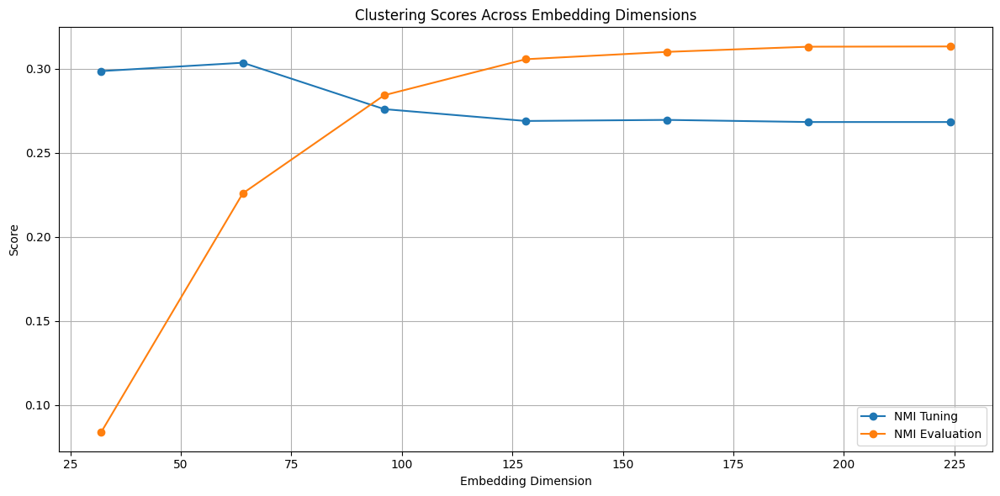

In [86]:
#@title Nmi vs  Dim
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Plot NMI
plt.plot(dim_df['dim'], dim_df['nmi_tuning'], label='NMI Tuning', marker='o')
plt.plot(dim_df['dim'], dim_df['nmi_eval'], label='NMI Evaluation', marker='o')

# # Plot ARI
# plt.plot(dim_df['dim'], dim_df['ari_tuning'], label='ARI Tuning', marker='s')
# plt.plot(dim_df['dim'], dim_df['ari_eval'], label='ARI Evaluation', marker='s')

# # Plot AMI
# plt.plot(dim_df['dim'], dim_df['ami_tuning'], label='AMI Tuning', marker='^')
# plt.plot(dim_df['dim'], dim_df['ami_eval'], label='AMI Evaluation', marker='^')

plt.title('Clustering Scores Across Embedding Dimensions')
plt.xlabel('Embedding Dimension')
plt.ylabel('Score')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [87]:
#@title Best Params
# Get best tuning config by NMI
best_config = results_df.loc[results_df['nmi'].idxmax()]
print("Best NMI config on tuning set:")
print(best_config[['reducer', 'dim', 'eps', 'min_samples', 'nmi', 'ari', 'ami']])

# Using best config, transform evaluation embeddings and evaluate clustering
best_reducer_cls = reducers[best_config['reducer']]
best_dim = best_config['dim']
best_eps = best_config['eps']
best_min_samples = best_config['min_samples']

reducer = best_reducer_cls(n_components=best_dim, random_state=42)
reduced_tuning_best = reducer.fit_transform(tuning_embeddings)
reduced_eval_best = reducer.transform(evaluation_embeddings)

dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

cluster_labels_tuning = dbscan.fit_predict(reduced_tuning_best)
cluster_labels_eval = dbscan.fit_predict(reduced_eval_best)

def safe_scores(true, pred):
    if len(set(pred)) > 1 and (pred != -1).any():
        nmi = normalized_mutual_info_score(true, pred)
        ari = adjusted_rand_score(true, pred)
        ami = adjusted_mutual_info_score(true, pred)
    else:
        nmi = ari = ami = 0
    return nmi, ari, ami

nmi_tuning, ari_tuning, ami_tuning = safe_scores(true_labels_tuning, cluster_labels_tuning)
nmi_eval, ari_eval, ami_eval = safe_scores(true_labels_eval, cluster_labels_eval)

print("\nEvaluation metrics with best tuning config:")
print(f"NMI: {nmi_eval:.4f}, ARI: {ari_eval:.4f}, AMI: {ami_eval:.4f}")

# Summarize metrics for each dimension using best eps and min_samples
dim_metrics = []



Best NMI config on tuning set:
reducer             PCA
dim                  32
eps                0.12
min_samples           3
nmi            0.324624
ari            0.022493
ami            0.230858
Name: 35, dtype: object

Evaluation metrics with best tuning config:
NMI: 0.1369, ARI: 0.0026, AMI: 0.0666


In [88]:
#@title Summarize clustering scores across embedding dimensions for best tuning hyperparameters

dim_metrics = []

for dim in dim_values:
    # Initialize reducer with the current dimension
    reducer = best_reducer_cls(n_components=dim, random_state=42)

    # Fit transform tuning embeddings and transform evaluation embeddings
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    # Initialize DBSCAN with best hyperparameters from tuning
    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    # Predict cluster labels on tuning and evaluation sets
    labels_tuning = dbscan.fit_predict(reduced_tuning)
    labels_eval = dbscan.fit_predict(reduced_eval)

    # Compute scores safely
    nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, labels_tuning)
    nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, labels_eval)

    # Append results
    dim_metrics.append({
        'dim': dim,
        'nmi_tuning': nmi_t,
        'ari_tuning': ari_t,
        'ami_tuning': ami_t,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

# Create DataFrame for easier visualization
dim_df = pd.DataFrame(dim_metrics)

print("\nSummary of clustering metrics across embedding dimensions:")
print(dim_df.to_string(index=False))



Summary of clustering metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval
  32    0.324624    0.022493    0.230858  0.136926  0.002602  0.066608
  64    0.242896   -0.006240    0.159412  0.273098  0.012687  0.151002
  96    0.230808   -0.003817    0.149889  0.272781  0.010925  0.157172
 128    0.223537   -0.006154    0.142402  0.266961  0.010326  0.153747
 160    0.221578   -0.003697    0.142400  0.267443  0.010293  0.153637
 192    0.221578   -0.003697    0.142400  0.270173  0.010443  0.154484
 224    0.221578   -0.003697    0.142400  0.270173  0.010443  0.154484


In [89]:
#@title The Results of the Clustering
dim_metrics = []

for dim in dim_values:
    reducer = best_reducer_cls(n_components=dim, random_state=42)
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    print(f"Using eps = {best_eps}, min_samples = {best_min_samples} for dim = {dim}")

    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    labels_tuning = dbscan.fit_predict(reduced_tuning)
    labels_eval = dbscan.fit_predict(reduced_eval)

    nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, labels_tuning)
    nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, labels_eval)

    dim_metrics.append({
        'dim': dim,
        'nmi_tuning': nmi_t,
        'ari_tuning': ari_t,
        'ami_tuning': ami_t,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

dim_df = pd.DataFrame(dim_metrics)

print("\nSummary of metrics across embedding dimensions:")
print(dim_df.to_string(index=False))


Using eps = 0.11999999999999998, min_samples = 3 for dim = 32
Using eps = 0.11999999999999998, min_samples = 3 for dim = 64
Using eps = 0.11999999999999998, min_samples = 3 for dim = 96
Using eps = 0.11999999999999998, min_samples = 3 for dim = 128
Using eps = 0.11999999999999998, min_samples = 3 for dim = 160
Using eps = 0.11999999999999998, min_samples = 3 for dim = 192
Using eps = 0.11999999999999998, min_samples = 3 for dim = 224

Summary of metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval
  32    0.324624    0.022493    0.230858  0.136926  0.002602  0.066608
  64    0.242896   -0.006240    0.159412  0.273098  0.012687  0.151002
  96    0.230808   -0.003817    0.149889  0.272781  0.010925  0.157172
 128    0.223537   -0.006154    0.142402  0.266961  0.010326  0.153747
 160    0.221578   -0.003697    0.142400  0.267443  0.010293  0.153637
 192    0.221578   -0.003697    0.142400  0.270173  0.010443  0.154484
 224    0.221578

In [90]:
#@title Clustering and Topic Modeling Metrics Summary Across Embedding Dimensions
from sklearn.metrics import silhouette_score
from gensim.corpora import Dictionary
from gensim.models.coherencemodel import CoherenceModel

def safe_silhouette_score(X, labels):
    if len(set(labels)) > 1 and len(X) > len(set(labels)):
        return silhouette_score(X, labels, metric='cosine')
    return -1

def get_topic_coherence(texts, labels, coherence_type='c_v'):
    clustered_docs = {}
    for text, label in zip(texts, labels):
        if label == -1:
            continue
        clustered_docs.setdefault(label, []).append(text)

    topics = [docs for docs in clustered_docs.values() if len(docs) >= 3]

    if len(topics) == 0:
        return -1

    tokenized_topics = [[word for doc in topic for word in doc.split()] for topic in topics]

    dictionary = Dictionary(tokenized_topics)
    corpus = [dictionary.doc2bow(text) for text in tokenized_topics]

    coherence_model = CoherenceModel(
        topics=tokenized_topics,
        texts=tokenized_topics,
        corpus=corpus,
        dictionary=dictionary,
        coherence=coherence_type
    )

    return coherence_model.get_coherence()

# Ground truth number of events (true clusters)
true_events_tuning = len(set(tuning_df['event_label']))
true_events_eval = len(set(evaluation_df['event_label']))

# Initialize list for metrics
additional_metrics = []

for dim in dim_values:
    reducer = best_reducer_cls(n_components=dim, random_state=42)
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    # Tuning
    labels_tuning = dbscan.fit_predict(reduced_tuning)
    silhouette_t = safe_silhouette_score(reduced_tuning, labels_tuning)
    num_clusters_t = len(set(labels_tuning)) - (1 if -1 in labels_tuning else 0)
    coherence_t_cv = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='c_v')
    coherence_t_umass = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='u_mass')

    # Evaluation
    labels_eval = dbscan.fit_predict(reduced_eval)
    silhouette_e = safe_silhouette_score(reduced_eval, labels_eval)
    num_clusters_e = len(set(labels_eval)) - (1 if -1 in labels_eval else 0)
    coherence_e_cv = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='c_v')
    coherence_e_umass = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='u_mass')

    additional_metrics.append({
        'dim': dim,
        'true_events_tuning': true_events_tuning,
        'true_events_eval': true_events_eval,
        'silhouette_tuning': silhouette_t,
        'num_clusters_tuning': num_clusters_t,
        'coherence_tuning_c_v': coherence_t_cv,
        'coherence_tuning_u_mass': coherence_t_umass,
        'silhouette_eval': silhouette_e,
        'num_clusters_eval': num_clusters_e,
        'coherence_eval_c_v': coherence_e_cv,
        'coherence_eval_u_mass': coherence_e_umass
    })

# Merge with original dim_df
extra_df = pd.DataFrame(additional_metrics)
dim_df = pd.merge(dim_df, extra_df, on='dim')

# Display full summary
print("\nSummary of all clustering metrics across embedding dimensions:")
print(dim_df.to_string(index=False))



Summary of all clustering metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval  true_events_tuning  true_events_eval  silhouette_tuning  num_clusters_tuning  coherence_tuning_c_v  coherence_tuning_u_mass  silhouette_eval  num_clusters_eval  coherence_eval_c_v  coherence_eval_u_mass
  32    0.324624    0.022493    0.230858  0.136926  0.002602  0.066608                  31               103          -0.057607                   36              0.736462                -0.716670        -0.496001                 93            0.623066              -0.835289
  64    0.242896   -0.006240    0.159412  0.273098  0.012687  0.151002                  31               103          -0.109621                   26              0.750898                -0.629840        -0.248676                204            0.646334              -1.126060
  96    0.230808   -0.003817    0.149889  0.272781  0.010925  0.157172                  31               103   

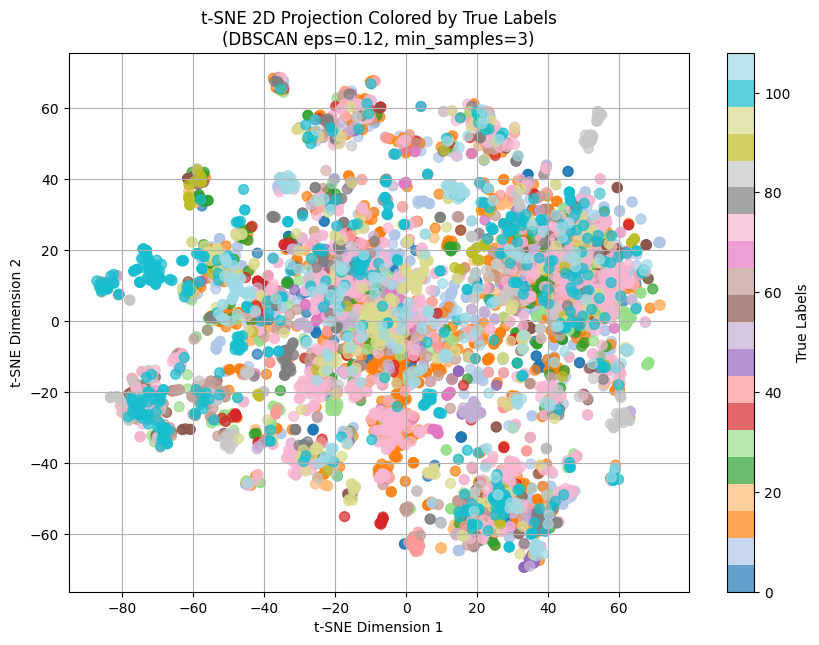

In [92]:
#@title Visualisation
from sklearn.cluster import DBSCAN
from sklearn.manifold import TSNE
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

true_labels = evaluation_df['event_label'].values  # Use evaluation labels
best_params_eps=0.12
best_params_min_samples=3

# Run DBSCAN with best params on evaluation embeddings
best_dbscan = DBSCAN(eps=best_params_eps, min_samples=int(best_params_min_samples), metric='cosine')
best_cluster_labels = best_dbscan.fit_predict(evaluation_embeddings)

# t-SNE dimensionality reduction to 2D on evaluation embeddings
tsne = TSNE(n_components=2, random_state=42, init='pca')
reduced_embeddings = tsne.fit_transform(evaluation_embeddings)

# Plotting
plt.figure(figsize=(10, 7))
scatter = plt.scatter(
    reduced_embeddings[:, 0], reduced_embeddings[:, 1],
    c=true_labels, cmap='tab20', alpha=0.7, s=50
)
plt.colorbar(scatter, label='True Labels')
plt.title(f"t-SNE 2D Projection Colored by True Labels\n(DBSCAN eps={best_params_eps:.2f}, min_samples={int(best_params_min_samples)})")
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.grid(True)
plt.show()


# Wod2Vec Experiments

## DBSCAN, With Word2Vec Embedding

In [ ]:

#@title Install & Load Word2Vec Model
!wget https://archive.org/download/AraVec/Twt-CBOW.zip
!unzip Twt-CBOW.zip
from gensim.models import KeyedVectors, Word2Vec


# model = Word2Vec.load('model_full_grams_cbow_300_twitter.mdl')


--2025-06-21 08:51:59--  https://archive.org/download/AraVec/Twt-CBOW.zip
Resolving archive.org (archive.org)... 207.241.224.2
Connecting to archive.org (archive.org)|207.241.224.2|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://ia903205.us.archive.org/28/items/AraVec/Twt-CBOW.zip [following]
--2025-06-21 08:52:00--  https://ia903205.us.archive.org/28/items/AraVec/Twt-CBOW.zip
Resolving ia903205.us.archive.org (ia903205.us.archive.org)... 207.241.234.115
Connecting to ia903205.us.archive.org (ia903205.us.archive.org)|207.241.234.115|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 369123021 (352M) [application/zip]
Saving to: ‘Twt-CBOW.zip’

Twt-CBOW.zip        100%[===================>] 352.02M  2.70MB/s    in 1m 52s  

2025-06-21 08:53:52 (3.16 MB/s) - ‘Twt-CBOW.zip’ saved [369123021/369123021]

Archive:  Twt-CBOW.zip
  inflating: Twt-CBOW                
  inflating: Twt-CBOW.syn1neg.npy    
  inflating: Twt-CBOW.wv.syn

In [ ]:
#@title install stanza
# !pip install stanza

In [ ]:
#@title Initialize Stanza Pipeline
# !pip install stanza
import numpy as np
import nltk
import stanza
from gensim.models import KeyedVectors
from nltk.corpus import stopwords

# Download necessary resources (only run once)
nltk.download('stopwords')
stanza.download('ar')

# Load Arabic stopwords from NLTK
ARABIC_STOPWORDS = set(stopwords.words('arabic'))

# Initialize Stanza Arabic pipeline for tokenization
nlp = stanza.Pipeline(lang='ar', processors='tokenize', tokenize_no_ssplit=True)

# Tokenization function
def stanza_tokenize(text):
    doc = nlp(text)
    return [word.text for sentence in doc.sentences for word in sentence.words]

# Tweet embedding function using FastText + Stanza + NLTK stopwords
def embed_tweet(text, model):
    tokens = stanza_tokenize(text)
    # Remove stopwords
    filtered_tokens = [token for token in tokens if token not in ARABIC_STOPWORDS]
    # Embed
    vectors = [model[token] for token in filtered_tokens if token in model]
    if not vectors:
        return np.zeros(model.vector_size)
    return np.mean(vectors, axis=0)


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Downloading default packages for language: ar (Arabic) ...


INFO:stanza:Downloaded file to /root/stanza_resources/ar/default.zip
INFO:stanza:Finished downloading models and saved to /root/stanza_resources
INFO:stanza:Checking for updates to resources.json in case models have been updated.  Note: this behavior can be turned off with download_method=None or download_method=DownloadMethod.REUSE_RESOURCES


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Loading these models for language: ar (Arabic):
| Processor | Package |
-----------------------
| tokenize  | padt    |
| mwt       | padt    |

INFO:stanza:Using device: cpu
INFO:stanza:Loading: tokenize
INFO:stanza:Loading: mwt
INFO:stanza:Done loading processors!


In [ ]:
#@title Load the model

# from gensim.models import KeyedVectors

# model = KeyedVectors.load_word2vec_format('Twitter-CBOW.bin', binary=True)
model = KeyedVectors.load('Twt-CBOW')



In [ ]:
#@title Embeddding the Tweets
from tqdm.notebook import tqdm
import numpy as np

def embed_tweet(text, word_vectors):
    tokens = stanza_tokenize(text)
    filtered_tokens = [token for token in tokens if token not in ARABIC_STOPWORDS]
    vectors = [word_vectors[token] for token in filtered_tokens if token in word_vectors]
    if not vectors:
        return np.zeros(word_vectors.vector_size)
    return np.mean(vectors, axis=0)

# Use model.wv, not model
word_vectors = model.wv

tweets = df['Tweet Text'].tolist()
embeddings = np.array([
    embed_tweet(text, word_vectors) for text in tqdm(tweets)
])


  0%|          | 0/6998 [00:00<?, ?it/s]

  0%|          | 0/6998 [05:17<?, ?it/s]


In [ ]:
#@title Save the Embedding
# Convert embeddings to a regular list
df['word2vec_embeddings'] = embeddings.tolist()

# # Convert to DataFrame
# embedding_df = pd.DataFrame(embeddings)

# # Save
# embedding_df.to_csv("tweet_embeddings.csv", index=False)


In [ ]:
#  @title Load the embedding for the tuning and evaluation df
import ast

# Ensure each value is a string before parsing
def safe_literal_eval(val):
    if isinstance(val, str):
        return ast.literal_eval(val)
    return val  # Already a list or array

tuning_df['word2vec_embeddings'] = tuning_df['word2vec_embeddings'].apply(safe_literal_eval)
evaluation_df['word2vec_embeddings'] = evaluation_df['word2vec_embeddings'].apply(safe_literal_eval)

# Convert to NumPy arrays
tuning_embeddings = np.vstack(tuning_df['word2vec_embeddings'].apply(np.array).values)
evaluation_embeddings = np.vstack(evaluation_df['word2vec_embeddings'].apply(np.array).values)

print(f"Tuning embeddings shape: {tuning_embeddings.shape}")
print(f"Evaluation embeddings shape: {evaluation_embeddings.shape}")


Tuning embeddings shape: (934, 300)
Evaluation embeddings shape: (6064, 300)


In [ ]:

#@title Define range of DBSCAN parameters to tune
# eps_values = np.arange(0.02, 0.66, 0.02)        # Distance threshold
eps_values = np.arange(0.08, 0.28, 0.01)        # Distance threshold
min_samples_values = np.arange(3,10,1)         # Minimum samples in neighborhood
dim_values = [32, 64, 96, 128, 160, 192, 256, 300]
best_score = -1
best_params = None


In [ ]:
#@title Analyze the Effect of DBSCAN's epsilon Parameter on Clustering Results
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results_tuning = []
results_eval = []

# Tune over eps
for eps in eps_values:
    for min_samples in min_samples_values:
        # --- Tuning ---
        dbscan_tuning = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

        if len(set(cluster_labels_tuning)) > 1 and (cluster_labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, cluster_labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- Evaluation ---
        dbscan_eval = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_eval = dbscan_eval.fit_predict(evaluation_embeddings)

        if len(set(cluster_labels_eval)) > 1 and (cluster_labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, cluster_labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# Aggregate over min_samples
agg_tuning = df_tuning.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval = df_eval.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()



Best eps based on NMI (Tuning Set): eps = 0.16, NMI = 0.2939


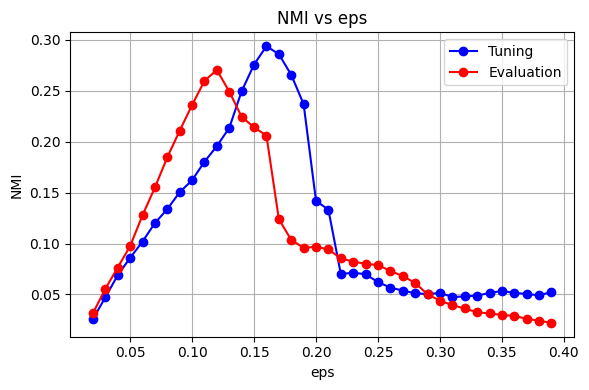

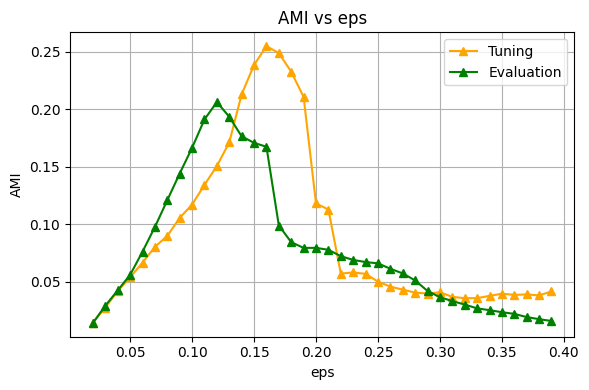

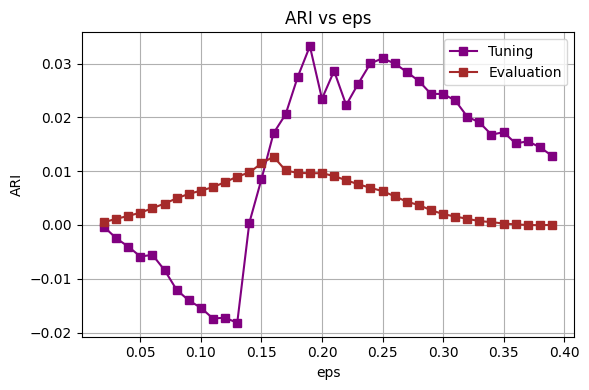

In [ ]:
#@title the Effect of DBSCAN's epsilon Parameter on Clustering Result

# Print best eps based on NMI from tuning set
best_eps_row = agg_tuning.loc[agg_tuning['nmi'].idxmax()]
print(f"Best eps based on NMI (Tuning Set): eps = {best_eps_row['eps']:.2f}, NMI = {best_eps_row['nmi']:.4f}")

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs eps')
plt.xlabel('eps')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ami'], marker='^', color='orange', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs eps')
plt.xlabel('eps')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ari'], marker='s', color='purple', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs eps')
plt.xlabel('eps')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Analyze the Effect of DBSCAN's Min Samples   Parameter on Clustering Result

true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results_tuning = []
results_eval = []

# Iterate over eps and min_samples combinations
for eps in eps_values:
    for min_samples in min_samples_values:
        # --- Tuning ---
        dbscan_tuning = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

        if len(set(cluster_labels_tuning)) > 1 and (cluster_labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, cluster_labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- Evaluation ---
        dbscan_eval = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_eval = dbscan_eval.fit_predict(evaluation_embeddings)

        if len(set(cluster_labels_eval)) > 1 and (cluster_labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, cluster_labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# === Aggregate over eps to study the effect of min_samples ===
agg_tuning_min = df_tuning.groupby('min_samples')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval_min = df_eval.groupby('min_samples')[['nmi', 'ari', 'ami']].mean().reset_index()



Best min_samples based on NMI (Tuning Set): min_samples = 3, NMI = 0.1451


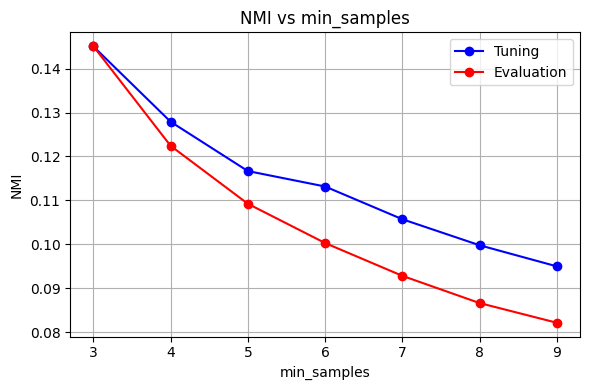

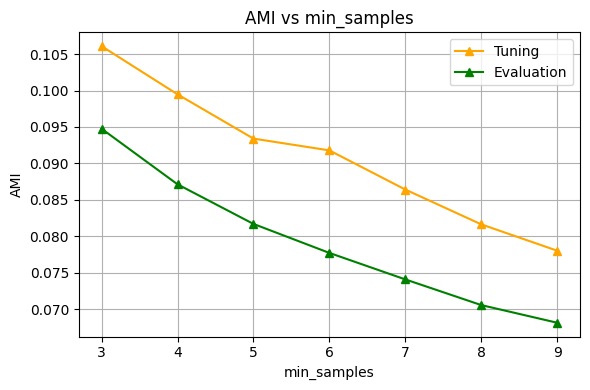

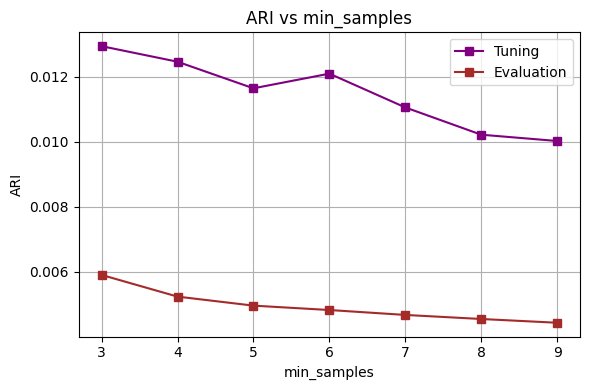

In [ ]:
#@title Analyze the Effect of DBSCAN's Min Samples   Parameter on Clustering Result

# Print best min_samples based on NMI from tuning set
best_minsample_row = agg_tuning_min.loc[agg_tuning_min['nmi'].idxmax()]
print(f"Best min_samples based on NMI (Tuning Set): min_samples = {int(best_minsample_row['min_samples'])}, NMI = {best_minsample_row['nmi']:.4f}")

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['ami'], marker='^', color='orange', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['ari'], marker='s', color='purple', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Analyze the Effect of PCA Dimensionality Reduction on DBSCAN Clustering Result

from sklearn.decomposition import PCA
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score
from sklearn.cluster import DBSCAN

# --- Settings ---

dim_values = [32, 64, 96, 128, 160, 192, 256, 300]
eps_best = 0.15
min_samples_best = 3

# True labels
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

dim_results = []

for dim in dim_values:
    # Reduce embeddings
    pca = PCA(n_components=dim)
    reduced_tuning = pca.fit_transform(tuning_embeddings)
    reduced_eval = pca.transform(evaluation_embeddings)

    # --- Tuning clustering ---
    dbscan_tuning = DBSCAN(eps=eps_best, min_samples=min_samples_best, metric='cosine')
    cluster_tuning = dbscan_tuning.fit_predict(reduced_tuning)

    if len(set(cluster_tuning)) > 1 and (cluster_tuning != -1).any():
        nmi = normalized_mutual_info_score(true_labels_tuning, cluster_tuning)
        ari = adjusted_rand_score(true_labels_tuning, cluster_tuning)
        ami = adjusted_mutual_info_score(true_labels_tuning, cluster_tuning)
    else:
        nmi = ari = ami = 0

    # --- Eval clustering ---
    dbscan_eval = DBSCAN(eps=eps_best, min_samples=min_samples_best, metric='cosine')
    cluster_eval = dbscan_eval.fit_predict(reduced_eval)

    if len(set(cluster_eval)) > 1 and (cluster_eval != -1).any():
        nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_eval)
        ari_e = adjusted_rand_score(true_labels_eval, cluster_eval)
        ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_eval)
    else:
        nmi_e = ari_e = ami_e = 0

    dim_results.append({
        'dim': dim,
        'nmi_tuning': nmi,
        'ari_tuning': ari,
        'ami_tuning': ami,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

# Convert to DataFrame
dim_df = pd.DataFrame(dim_results)


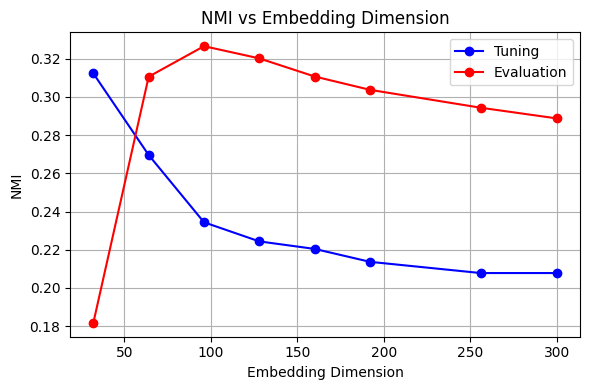

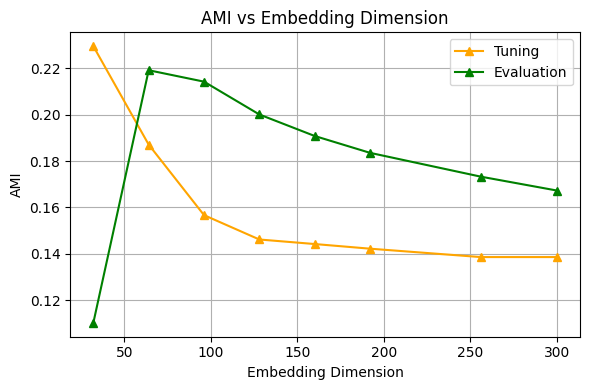

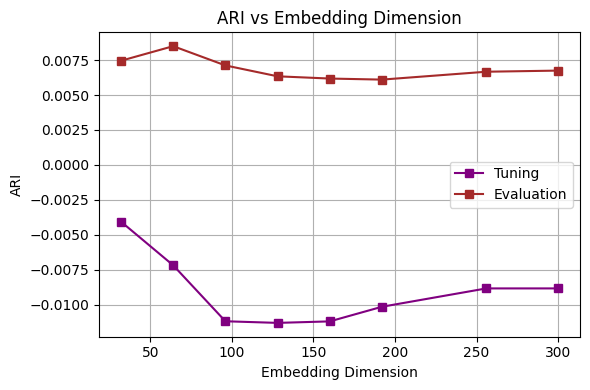

In [ ]:
#@title the Effect of PCA Dimensionality Reduction on DBSCAN Clustering Performance

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['nmi_tuning'], marker='o', label='Tuning', color='blue')
plt.plot(dim_df['dim'], dim_df['nmi_eval'], marker='o', label='Evaluation', color='red')
plt.title('NMI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['ami_tuning'], marker='^', label='Tuning', color='orange')
plt.plot(dim_df['dim'], dim_df['ami_eval'], marker='^', label='Evaluation', color='green')
plt.title('AMI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(dim_df['dim'], dim_df['ari_tuning'], marker='s', label='Tuning', color='purple')
plt.plot(dim_df['dim'], dim_df['ari_eval'], marker='s', label='Evaluation', color='brown')
plt.title('ARI vs Embedding Dimension')
plt.xlabel('Embedding Dimension')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:

#@title Grid search on tuning set
from sklearn.decomposition import PCA
from umap import UMAP
from sklearn.cluster import DBSCAN
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

# Parameters for grid search
reducers = {
    'PCA': PCA,
    'UMAP': UMAP
}

true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results = []

# Grid search on tuning set
for reducer_name, reducer_cls in reducers.items():
    for dim in dim_values:
        print(f"Reducing tuning data to {dim}D using {reducer_name}...")
        reducer = reducer_cls(n_components=dim, random_state=42)
        reduced_tuning = reducer.fit_transform(tuning_embeddings)

        for eps in eps_values:
            for min_samples in min_samples_values:
                dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
                cluster_labels = dbscan.fit_predict(reduced_tuning)

                if len(set(cluster_labels)) > 1 and (cluster_labels != -1).any():
                    nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels)
                    ari = adjusted_rand_score(true_labels_tuning, cluster_labels)
                    ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels)
                else:
                    nmi = ari = ami = 0

                results.append({
                    'reducer': reducer_name,
                    'dim': dim,
                    'eps': eps,
                    'min_samples': min_samples,
                    'nmi': nmi,
                    'ari': ari,
                    'ami': ami,
                    'reduced_tuning': reduced_tuning
                })

results_df = pd.DataFrame(results)


Reducing tuning data to 32D using PCA...
Reducing tuning data to 64D using PCA...
Reducing tuning data to 96D using PCA...
Reducing tuning data to 128D using PCA...
Reducing tuning data to 160D using PCA...
Reducing tuning data to 192D using PCA...
Reducing tuning data to 256D using PCA...
Reducing tuning data to 300D using PCA...
Reducing tuning data to 32D using UMAP...
Reducing tuning data to 64D using UMAP...
Reducing tuning data to 96D using UMAP...
Reducing tuning data to 128D using UMAP...
Reducing tuning data to 160D using UMAP...
Reducing tuning data to 192D using UMAP...
Reducing tuning data to 256D using UMAP...
Reducing tuning data to 300D using UMAP...


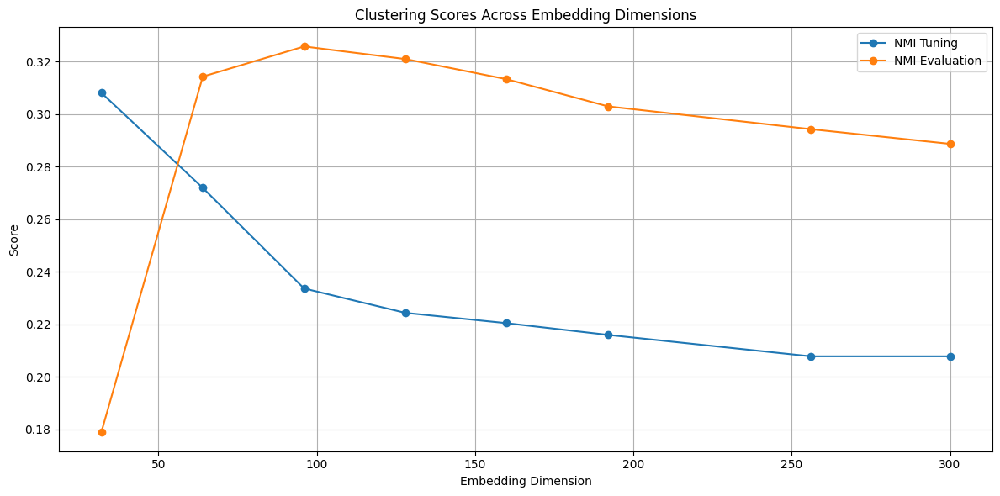

In [ ]:
#@title Nmi vs  Dim
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Plot NMI
plt.plot(dim_df['dim'], dim_df['nmi_tuning'], label='NMI Tuning', marker='o')
plt.plot(dim_df['dim'], dim_df['nmi_eval'], label='NMI Evaluation', marker='o')

# # Plot ARI
# plt.plot(dim_df['dim'], dim_df['ari_tuning'], label='ARI Tuning', marker='s')
# plt.plot(dim_df['dim'], dim_df['ari_eval'], label='ARI Evaluation', marker='s')

# # Plot AMI
# plt.plot(dim_df['dim'], dim_df['ami_tuning'], label='AMI Tuning', marker='^')
# plt.plot(dim_df['dim'], dim_df['ami_eval'], label='AMI Evaluation', marker='^')

plt.title('Clustering Scores Across Embedding Dimensions')
plt.xlabel('Embedding Dimension')
plt.ylabel('Score')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Best Params
# Get best tuning config by NMI
best_config = results_df.loc[results_df['nmi'].idxmax()]
print("Best NMI config on tuning set:")
print(best_config[['reducer', 'dim', 'eps', 'min_samples', 'nmi', 'ari', 'ami']])

# Using best config, transform evaluation embeddings and evaluate clustering
best_reducer_cls = reducers[best_config['reducer']]
best_dim = best_config['dim']
best_eps = best_config['eps']
best_min_samples = best_config['min_samples']

reducer = best_reducer_cls(n_components=best_dim, random_state=42)
reduced_tuning_best = reducer.fit_transform(tuning_embeddings)
reduced_eval_best = reducer.transform(evaluation_embeddings)

dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

cluster_labels_tuning = dbscan.fit_predict(reduced_tuning_best)
cluster_labels_eval = dbscan.fit_predict(reduced_eval_best)

def safe_scores(true, pred):
    if len(set(pred)) > 1 and (pred != -1).any():
        nmi = normalized_mutual_info_score(true, pred)
        ari = adjusted_rand_score(true, pred)
        ami = adjusted_mutual_info_score(true, pred)
    else:
        nmi = ari = ami = 0
    return nmi, ari, ami

nmi_tuning, ari_tuning, ami_tuning = safe_scores(true_labels_tuning, cluster_labels_tuning)
nmi_eval, ari_eval, ami_eval = safe_scores(true_labels_eval, cluster_labels_eval)

print("\nEvaluation metrics with best tuning config:")
print(f"NMI: {nmi_eval:.4f}, ARI: {ari_eval:.4f}, AMI: {ami_eval:.4f}")

# Summarize metrics for each dimension using best eps and min_samples
dim_metrics = []



Best NMI config on tuning set:
reducer             PCA
dim                  64
eps                0.27
min_samples           3
nmi             0.38601
ari            0.082256
ami            0.321143
Name: 273, dtype: object

Evaluation metrics with best tuning config:
NMI: 0.1018, ARI: 0.0054, AMI: 0.0569


In [ ]:
#@title Summarize clustering scores across embedding dimensions for best tuning hyperparameters

dim_metrics = []

for dim in dim_values:
    # Initialize reducer with the current dimension
    reducer = best_reducer_cls(n_components=dim, random_state=42)

    # Fit transform tuning embeddings and transform evaluation embeddings
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    # Initialize DBSCAN with best hyperparameters from tuning
    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    # Predict cluster labels on tuning and evaluation sets
    labels_tuning = dbscan.fit_predict(reduced_tuning)
    labels_eval = dbscan.fit_predict(reduced_eval)

    # Compute scores safely
    nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, labels_tuning)
    nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, labels_eval)

    # Append results
    dim_metrics.append({
        'dim': dim,
        'nmi_tuning': nmi_t,
        'ari_tuning': ari_t,
        'ami_tuning': ami_t,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

# Create DataFrame for easier visualization
dim_df = pd.DataFrame(dim_metrics)

print("\nSummary of clustering metrics across embedding dimensions:")
print(dim_df.to_string(index=False))



Summary of clustering metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval
  32    0.266037    0.179968    0.216126  0.026151  0.001813  0.015616
  64    0.386010    0.082256    0.321143  0.101790  0.005448  0.056899
  96    0.364933    0.009866    0.287159  0.156487  0.007662  0.097043
 128    0.354162    0.006556    0.274828  0.171421  0.008133  0.105909
 160    0.348148    0.004358    0.267979  0.207917  0.010137  0.133050
 192    0.335430   -0.001029    0.257790  0.221845  0.010752  0.143793
 256    0.308246   -0.009535    0.227255  0.290436  0.014180  0.204901
 300    0.306551   -0.007727    0.227379  0.336076  0.015702  0.246958


In [ ]:
#@title The Results of the Clustering
dim_metrics = []

for dim in dim_values:
    reducer = best_reducer_cls(n_components=dim, random_state=42)
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    print(f"Using eps = {best_eps}, min_samples = {best_min_samples} for dim = {dim}")

    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    labels_tuning = dbscan.fit_predict(reduced_tuning)
    labels_eval = dbscan.fit_predict(reduced_eval)

    nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, labels_tuning)
    nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, labels_eval)

    dim_metrics.append({
        'dim': dim,
        'nmi_tuning': nmi_t,
        'ari_tuning': ari_t,
        'ami_tuning': ami_t,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

dim_df = pd.DataFrame(dim_metrics)

print("\nSummary of metrics across embedding dimensions:")
print(dim_df.to_string(index=False))


Using eps = 0.2699999999999999, min_samples = 3 for dim = 32
Using eps = 0.2699999999999999, min_samples = 3 for dim = 64
Using eps = 0.2699999999999999, min_samples = 3 for dim = 96
Using eps = 0.2699999999999999, min_samples = 3 for dim = 128
Using eps = 0.2699999999999999, min_samples = 3 for dim = 160
Using eps = 0.2699999999999999, min_samples = 3 for dim = 192
Using eps = 0.2699999999999999, min_samples = 3 for dim = 256
Using eps = 0.2699999999999999, min_samples = 3 for dim = 300

Summary of metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval
  32    0.266037    0.179968    0.216126  0.026151  0.001813  0.015616
  64    0.386010    0.082256    0.321143  0.101790  0.005448  0.056899
  96    0.364933    0.009866    0.287159  0.156487  0.007662  0.097043
 128    0.354162    0.006556    0.274828  0.171421  0.008133  0.105909
 160    0.348148    0.004358    0.267979  0.207917  0.010137  0.133050
 192    0.335430   -0.001029    

In [ ]:
#@title Clustering and Topic Modeling Metrics Summary Across Embedding Dimensions
from sklearn.metrics import silhouette_score
from gensim.corpora import Dictionary
from gensim.models.coherencemodel import CoherenceModel

def safe_silhouette_score(X, labels):
    if len(set(labels)) > 1 and len(X) > len(set(labels)):
        return silhouette_score(X, labels, metric='cosine')
    return -1

def get_topic_coherence(texts, labels, coherence_type='c_v'):
    clustered_docs = {}
    for text, label in zip(texts, labels):
        if label == -1:
            continue
        clustered_docs.setdefault(label, []).append(text)

    topics = [docs for docs in clustered_docs.values() if len(docs) >= 3]

    if len(topics) == 0:
        return -1

    tokenized_topics = [[word for doc in topic for word in doc.split()] for topic in topics]

    dictionary = Dictionary(tokenized_topics)
    corpus = [dictionary.doc2bow(text) for text in tokenized_topics]

    coherence_model = CoherenceModel(
        topics=tokenized_topics,
        texts=tokenized_topics,
        corpus=corpus,
        dictionary=dictionary,
        coherence=coherence_type
    )

    return coherence_model.get_coherence()

# Ground truth number of events (true clusters)
true_events_tuning = len(set(tuning_df['event_label']))
true_events_eval = len(set(evaluation_df['event_label']))

# Initialize list for metrics
additional_metrics = []

for dim in dim_values:
    reducer = best_reducer_cls(n_components=dim, random_state=42)
    reduced_tuning = reducer.fit_transform(tuning_embeddings)
    reduced_eval = reducer.transform(evaluation_embeddings)

    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    # Tuning
    labels_tuning = dbscan.fit_predict(reduced_tuning)
    silhouette_t = safe_silhouette_score(reduced_tuning, labels_tuning)
    num_clusters_t = len(set(labels_tuning)) - (1 if -1 in labels_tuning else 0)
    coherence_t_cv = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='c_v')
    coherence_t_umass = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='u_mass')

    # Evaluation
    labels_eval = dbscan.fit_predict(reduced_eval)
    silhouette_e = safe_silhouette_score(reduced_eval, labels_eval)
    num_clusters_e = len(set(labels_eval)) - (1 if -1 in labels_eval else 0)
    coherence_e_cv = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='c_v')
    coherence_e_umass = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='u_mass')

    additional_metrics.append({
        'dim': dim,
        'true_events_tuning': true_events_tuning,
        'true_events_eval': true_events_eval,
        'silhouette_tuning': silhouette_t,
        'num_clusters_tuning': num_clusters_t,
        'coherence_tuning_c_v': coherence_t_cv,
        'coherence_tuning_u_mass': coherence_t_umass,
        'silhouette_eval': silhouette_e,
        'num_clusters_eval': num_clusters_e,
        'coherence_eval_c_v': coherence_e_cv,
        'coherence_eval_u_mass': coherence_e_umass
    })

# Merge with original dim_df
extra_df = pd.DataFrame(additional_metrics)
dim_df = pd.merge(dim_df, extra_df, on='dim')

# Display full summary
print("\nSummary of all clustering metrics across embedding dimensions:")
print(dim_df.to_string(index=False))



Summary of all clustering metrics across embedding dimensions:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval  true_events_tuning  true_events_eval  silhouette_tuning  num_clusters_tuning  coherence_tuning_c_v  coherence_tuning_u_mass  silhouette_eval  num_clusters_eval  coherence_eval_c_v  coherence_eval_u_mass
  32    0.266037    0.179968    0.216126  0.026151  0.001813  0.015616                  31               103          -0.270157                   17              0.696018                -0.483853        -0.279958                 10            0.532890              -0.286176
  64    0.386010    0.082256    0.321143  0.101790  0.005448  0.056899                  31               103          -0.112028                   26              0.747090                -0.694752        -0.392810                 61            0.593840              -0.612191
  96    0.364933    0.009866    0.287159  0.156487  0.007662  0.097043                  31               103   

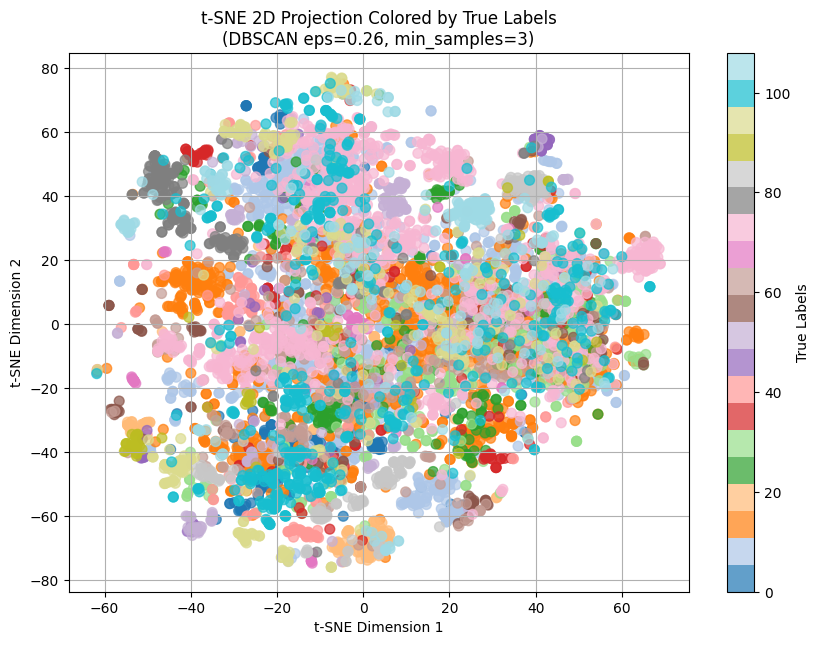

In [ ]:
#@title Visualisation
from sklearn.cluster import DBSCAN
from sklearn.manifold import TSNE
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

true_labels = evaluation_df['event_label'].values  # Use evaluation labels
best_params_eps=0.26
best_params_min_samples=3

# Run DBSCAN with best params on evaluation embeddings
best_dbscan = DBSCAN(eps=best_params_eps, min_samples=int(best_params_min_samples), metric='cosine')
best_cluster_labels = best_dbscan.fit_predict(evaluation_embeddings)

# t-SNE dimensionality reduction to 2D on evaluation embeddings
tsne = TSNE(n_components=2, random_state=42, init='pca')
reduced_embeddings = tsne.fit_transform(evaluation_embeddings)

# Plotting
plt.figure(figsize=(10, 7))
scatter = plt.scatter(
    reduced_embeddings[:, 0], reduced_embeddings[:, 1],
    c=true_labels, cmap='tab20', alpha=0.7, s=50
)
plt.colorbar(scatter, label='True Labels')
plt.title(f"t-SNE 2D Projection Colored by True Labels\n(DBSCAN eps={best_params_eps:.2f}, min_samples={int(best_params_min_samples)})")
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.grid(True)
plt.show()


# LDA Experiments

## DBSCAN, With LDA

In [ ]:
#@title Vectorize Tweets with TF-IDF
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.corpus import stopwords
import nltk

# Download Arabic stopwords (only once)
nltk.download('stopwords')

# Get Arabic stopwords from NLTK
arabic_stopwords = stopwords.words('arabic')

# Create TF-IDF vectorizer with custom Arabic stopwords
vectorizer = TfidfVectorizer(max_features=10000, stop_words=arabic_stopwords)

# Fit-transform on tuning and transform on evaluation
tuning_tfidf = vectorizer.fit_transform(tuning_df['Tweet Text'])
evaluation_tfidf = vectorizer.transform(evaluation_df['Tweet Text'])

print(f"TF-IDF tuning shape: {tuning_tfidf.shape}")
print(f"TF-IDF evaluation shape: {evaluation_tfidf.shape}")


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


TF-IDF tuning shape: (934, 7547)
TF-IDF evaluation shape: (6064, 7547)


In [ ]:
#@title Define the Hyper Parameters
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.cluster import DBSCAN
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

n_topics_values = list(range(5, 150, 5))  # LDA: 5 to 50 topics
eps_values = np.arange(0.2, 0.3, 0.02)  # DBSCAN eps
min_samples_values = range(3, 6)          # DBSCAN min_samples


In [ ]:
#@title Fit LDA and get topic distributions for specific  numnber of topic

# Set number of topics
n_topics = 60

# Fit LDA
lda_model = LatentDirichletAllocation(n_components=n_topics, random_state=42)
lda_model.fit(tuning_tfidf)

# Topic distributions
tuning_embeddings = lda_model.transform(tuning_tfidf)
evaluation_embeddings = lda_model.transform(evaluation_tfidf)

# Ground truth labels
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

print(f"Tuning topic vectors shape: {tuning_embeddings.shape}")
print(f"Evaluation topic vectors shape: {evaluation_embeddings.shape}")


Tuning topic vectors shape: (934, 60)
Evaluation topic vectors shape: (6064, 60)


In [ ]:
#@title Analyze the Effect of DBSCAN's epsilon Parameter on Clustering Results
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results_tuning = []
results_eval = []

# Tune over eps
for eps in eps_values:
    for min_samples in min_samples_values:
        # --- Tuning ---
        dbscan_tuning = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

        if len(set(cluster_labels_tuning)) > 1 and (cluster_labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, cluster_labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- Evaluation ---
        dbscan_eval = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_eval = dbscan_eval.fit_predict(evaluation_embeddings)

        if len(set(cluster_labels_eval)) > 1 and (cluster_labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, cluster_labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# Aggregate over min_samples
agg_tuning = df_tuning.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval = df_eval.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()



Best eps based on NMI (Tuning Set): eps = 0.15, NMI = 0.2712


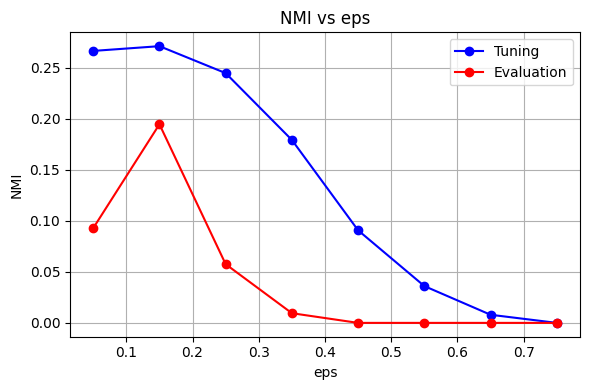

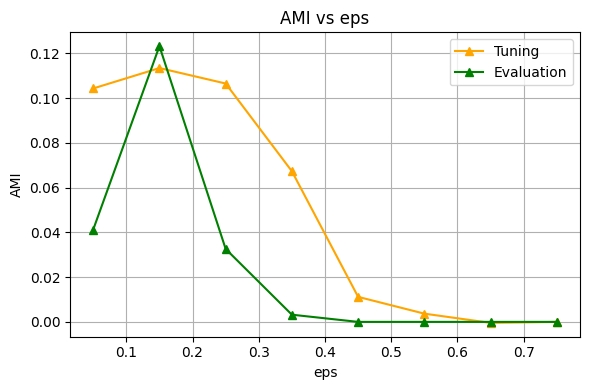

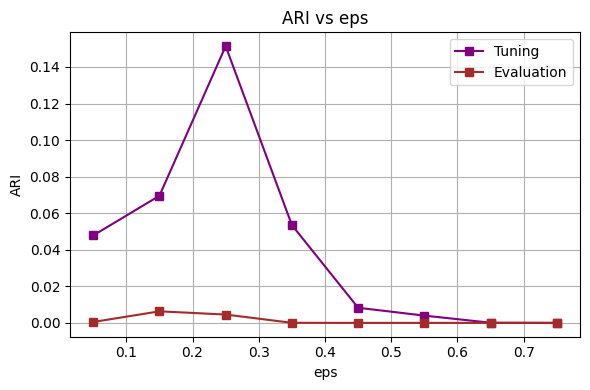

In [ ]:
#@title the Effect of DBSCAN's epsilon Parameter on Clustering Result

# Print best eps based on NMI from tuning set
best_eps_row = agg_tuning.loc[agg_tuning['nmi'].idxmax()]
print(f"Best eps based on NMI (Tuning Set): eps = {best_eps_row['eps']:.2f}, NMI = {best_eps_row['nmi']:.4f}")

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs eps')
plt.xlabel('eps')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ami'], marker='^', color='orange', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs eps')
plt.xlabel('eps')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ari'], marker='s', color='purple', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs eps')
plt.xlabel('eps')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Analyze the Effect of DBSCAN's Min Samples   Parameter on Clustering Result

true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results_tuning = []
results_eval = []

# Iterate over eps and min_samples combinations
for eps in eps_values:
    for min_samples in min_samples_values:
        # --- Tuning ---
        dbscan_tuning = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

        if len(set(cluster_labels_tuning)) > 1 and (cluster_labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, cluster_labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- Evaluation ---
        dbscan_eval = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_eval = dbscan_eval.fit_predict(evaluation_embeddings)

        if len(set(cluster_labels_eval)) > 1 and (cluster_labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, cluster_labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# === Aggregate over eps to study the effect of min_samples ===
agg_tuning_min = df_tuning.groupby('min_samples')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval_min = df_eval.groupby('min_samples')[['nmi', 'ari', 'ami']].mean().reset_index()



Best min_samples based on NMI (Tuning Set): min_samples = 6, NMI = 0.0570


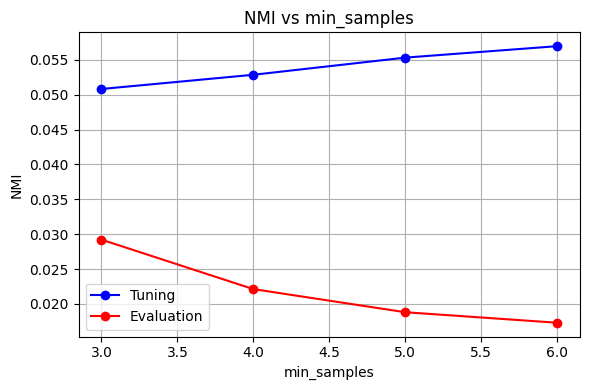

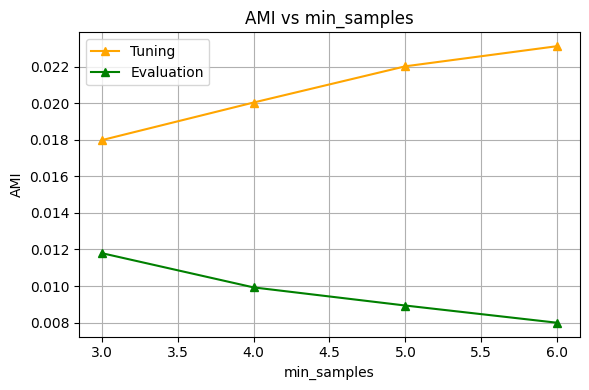

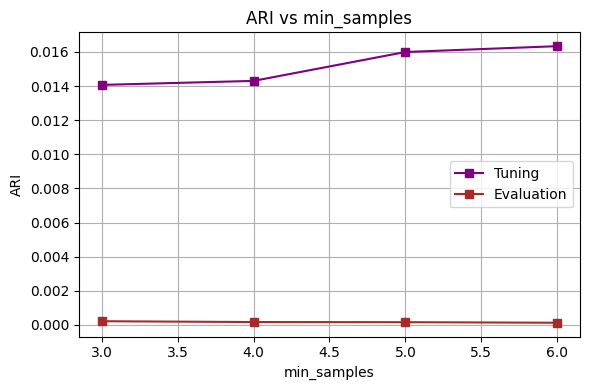

In [ ]:
#@title Analyze the Effect of DBSCAN's Min Samples   Parameter on Clustering Result

# Print best min_samples based on NMI from tuning set
best_minsample_row = agg_tuning_min.loc[agg_tuning_min['nmi'].idxmax()]
print(f"Best min_samples based on NMI (Tuning Set): min_samples = {int(best_minsample_row['min_samples'])}, NMI = {best_minsample_row['nmi']:.4f}")

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['ami'], marker='^', color='orange', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['ari'], marker='s', color='purple', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
#@title Analyze the Effect of Topics Dimensionality on DBSCAN Clustering Result
lda_results = []
eps_best = 0.14
min_samples_best = 3

for n_topics in n_topics_values:
    # Fit LDA with n_topics
    lda_model = LatentDirichletAllocation(n_components=n_topics, random_state=42)
    lda_model.fit(tuning_tfidf)

    # Get topic distributions (used as features)
    tuning_embeddings = lda_model.transform(tuning_tfidf)
    evaluation_embeddings = lda_model.transform(evaluation_tfidf)

    # --- Tuning clustering ---
    dbscan_tuning = DBSCAN(eps=eps_best, min_samples=min_samples_best, metric='cosine')
    cluster_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

    if len(set(cluster_tuning)) > 1 and (cluster_tuning != -1).any():
        nmi = normalized_mutual_info_score(tuning_df['event_label'], cluster_tuning)
        ari = adjusted_rand_score(tuning_df['event_label'], cluster_tuning)
        ami = adjusted_mutual_info_score(tuning_df['event_label'], cluster_tuning)
    else:
        nmi = ari = ami = 0

    # --- Evaluation clustering ---
    dbscan_eval = DBSCAN(eps=eps_best, min_samples=min_samples_best, metric='cosine')
    cluster_eval = dbscan_eval.fit_predict(evaluation_embeddings)

    if len(set(cluster_eval)) > 1 and (cluster_eval != -1).any():
        nmi_e = normalized_mutual_info_score(evaluation_df['event_label'], cluster_eval)
        ari_e = adjusted_rand_score(evaluation_df['event_label'], cluster_eval)
        ami_e = adjusted_mutual_info_score(evaluation_df['event_label'], cluster_eval)
    else:
        nmi_e = ari_e = ami_e = 0

    lda_results.append({
        'n_topics': n_topics,
        'nmi_tuning': nmi,
        'ari_tuning': ari,
        'ami_tuning': ami,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

# Convert to DataFrame
lda_df = pd.DataFrame(lda_results)


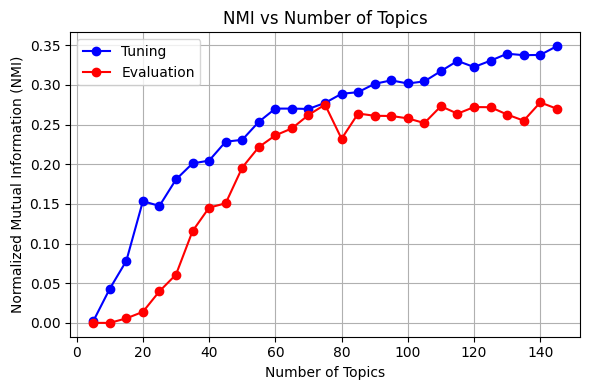

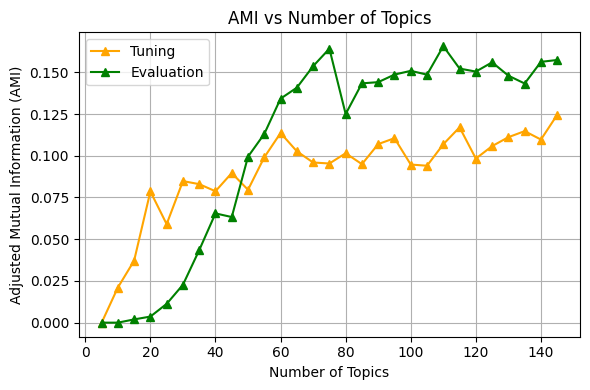

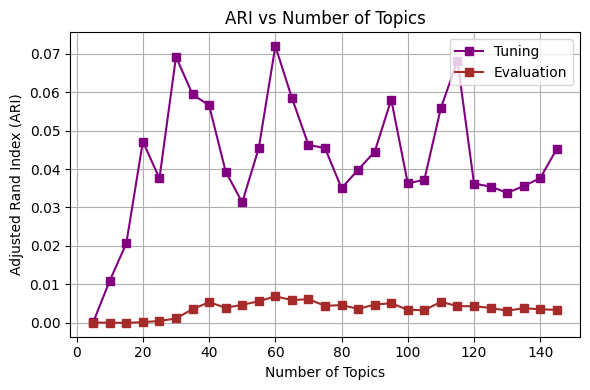

In [ ]:
#@title 📊 The Effect of Number of Topics on DBSCAN Clustering Results

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(lda_df['n_topics'], lda_df['nmi_tuning'], marker='o', label='Tuning', color='blue')
plt.plot(lda_df['n_topics'], lda_df['nmi_eval'], marker='o', label='Evaluation', color='red')
plt.title('NMI vs Number of Topics')
plt.xlabel('Number of Topics')
plt.ylabel('Normalized Mutual Information (NMI)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(lda_df['n_topics'], lda_df['ami_tuning'], marker='^', label='Tuning', color='orange')
plt.plot(lda_df['n_topics'], lda_df['ami_eval'], marker='^', label='Evaluation', color='green')
plt.title('AMI vs Number of Topics')
plt.xlabel('Number of Topics')
plt.ylabel('Adjusted Mutual Information (AMI)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(lda_df['n_topics'], lda_df['ari_tuning'], marker='s', label='Tuning', color='purple')
plt.plot(lda_df['n_topics'], lda_df['ari_eval'], marker='s', label='Evaluation', color='brown')
plt.title('ARI vs Number of Topics')
plt.xlabel('Number of Topics')
plt.ylabel('Adjusted Rand Index (ARI)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:

#@title Grid search on tuning set
# True labels
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

grid_results = []

for n_topics in n_topics_values:
    # print(f"\nFitting LDA with n_topics = {n_topics}...")

    # Fit LDA on tuning set
    lda = LatentDirichletAllocation(n_components=n_topics, random_state=42)
    lda.fit(tuning_tfidf)

    # Get topic distributions
    tuning_embeddings = lda.transform(tuning_tfidf)
    evaluation_embeddings = lda.transform(evaluation_tfidf)

    for eps in eps_values:
        for min_samples in min_samples_values:
            # DBSCAN on tuning embeddings
            dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
            labels = dbscan.fit_predict(tuning_embeddings)

            if len(set(labels)) > 1 and (labels != -1).any():
                nmi = normalized_mutual_info_score(true_labels_tuning, labels)
                ari = adjusted_rand_score(true_labels_tuning, labels)
                ami = adjusted_mutual_info_score(true_labels_tuning, labels)
            else:
                nmi = ari = ami = 0

            grid_results.append({
                'n_topics': n_topics,
                'eps': eps,
                'min_samples': min_samples,
                'nmi': nmi,
                'ari': ari,
                'ami': ami
            })

# Convert results to DataFrame
lda_grid_df = pd.DataFrame(grid_results)

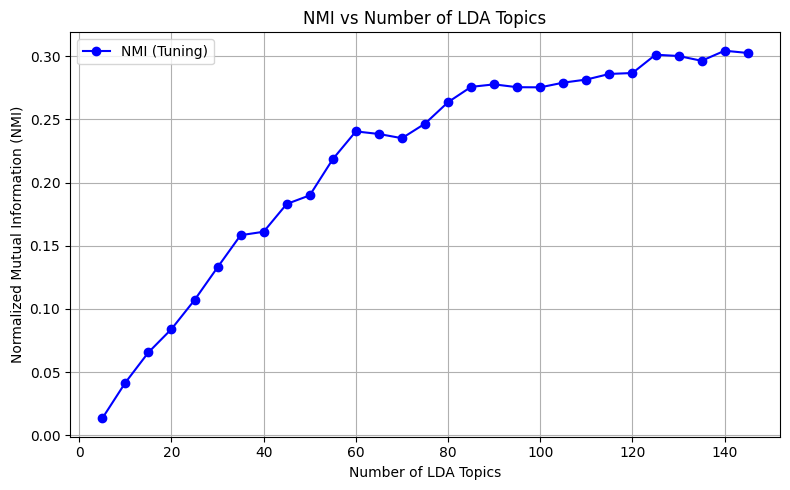

In [ ]:
#@title NMI vs Number of LDA Topics

import matplotlib.pyplot as plt

# Aggregate mean NMI per topic for tuning set
nmi_tuning = lda_grid_df.groupby('n_topics')['nmi'].mean().reset_index(name='nmi_tuning')

# For evaluation, we need to compute DBSCAN clustering and NMI as well for each param combination.
# Let's add evaluation NMI to lda_grid_df first (if not done):

# Assuming you don't have eval NMI in lda_grid_df yet, you can compute it like this:
# (Or precompute and merge if you want)

eval_results = []

for n_topics in n_topics_values:
    lda = LatentDirichletAllocation(n_components=n_topics, random_state=42)
    lda.fit(tuning_tfidf)
    tuning_emb = lda.transform(tuning_tfidf)
    eval_emb = lda.transform(evaluation_tfidf)

    for eps in eps_values:
        for min_samples in min_samples_values:
            dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
            labels_eval = dbscan.fit_predict(eval_emb)

            if len(set(labels_eval)) > 1 and (labels_eval != -1).any():
                nmi_eval = normalized_mutual_info_score(true_labels_eval, labels_eval)
            else:
                nmi_eval = 0

            eval_results.append({
                'n_topics': n_topics,
                'eps': eps,
                'min_samples': min_samples,
                'nmi_eval': nmi_eval
            })

eval_df = pd.DataFrame(eval_results)

# Aggregate mean NMI per topic for evaluation set
nmi_eval = eval_df.groupby('n_topics')['nmi_eval'].mean().reset_index()

# Merge tuning and evaluation NMI by n_topics
nmi_both = pd.merge(nmi_tuning, nmi_eval, on='n_topics')

# Plot
plt.figure(figsize=(8, 5))
plt.plot(nmi_both['n_topics'], nmi_both['nmi_tuning'], marker='o', color='blue', label='NMI (Tuning)')
plt.plot(nmi_both['n_topics'], nmi_both['nmi_eval'], marker='o', color='red', label='NMI (Evaluation)')
plt.title('NMI vs Number of LDA Topics')
plt.xlabel('Number of LDA Topics')
plt.ylabel('Normalized Mutual Information (NMI)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


In [ ]:
#@title Best Params from LDA Grid Search

# Get best config (based on NMI on tuning set)
best_config = lda_grid_df.loc[lda_grid_df['nmi'].idxmax()]
print("Best configuration based on NMI (Tuning Set):")
print(best_config[['n_topics', 'eps', 'min_samples', 'nmi', 'ari', 'ami']])

# Extract best params
best_n_topics = int(best_config['n_topics'])  # 🛠 Fix: Cast to int
best_eps = best_config['eps']
best_min_samples = int(best_config['min_samples'])  # Optional, just to be safe

# Fit LDA with best topic number
best_lda = LatentDirichletAllocation(n_components=best_n_topics, random_state=42)
best_lda.fit(tuning_tfidf)

# Get embeddings (topic distributions)
tuning_embeddings_best = best_lda.transform(tuning_tfidf)
evaluation_embeddings_best = best_lda.transform(evaluation_tfidf)

# Apply DBSCAN
dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')
labels_tuning = dbscan.fit_predict(tuning_embeddings_best)
labels_eval = dbscan.fit_predict(evaluation_embeddings_best)

# Define scoring
def safe_scores(true, pred):
    if len(set(pred)) > 1 and (pred != -1).any():
        nmi = normalized_mutual_info_score(true, pred)
        ari = adjusted_rand_score(true, pred)
        ami = adjusted_mutual_info_score(true, pred)
    else:
        nmi = ari = ami = 0
    return nmi, ari, ami

# Score tuning and evaluation
nmi_tuning, ari_tuning, ami_tuning = safe_scores(true_labels_tuning, labels_tuning)
nmi_eval, ari_eval, ami_eval = safe_scores(true_labels_eval, labels_eval)

# Print
print("\nEvaluation metrics with best configuration:")
print(f"Tuning Set → NMI: {nmi_tuning:.4f}, ARI: {ari_tuning:.4f}, AMI: {ami_tuning:.4f}")
print(f"Evaluation Set → NMI: {nmi_eval:.4f}, ARI: {ari_eval:.4f}, AMI: {ami_eval:.4f}")


Best configuration based on NMI (Tuning Set):
n_topics       145.000000
eps              0.250000
min_samples      3.000000
nmi              0.357567
ari              0.080371
ami              0.141878
Name: 456, dtype: float64

Evaluation metrics with best configuration:
Tuning Set → NMI: 0.3576, ARI: 0.0804, AMI: 0.1419
Evaluation Set → NMI: 0.2347, ARI: 0.0106, AMI: 0.1442


In [ ]:
#@title Summarize clustering scores across LDA topic dimensions for best DBSCAN parameters

lda_dim_metrics = []

for n_topics in n_topics_values:
    # Fit LDA with current number of topics
    lda = LatentDirichletAllocation(n_components=n_topics, random_state=42)
    lda.fit(tuning_tfidf)

    # Get topic distributions (embeddings)
    tuning_embed = lda.transform(tuning_tfidf)
    eval_embed = lda.transform(evaluation_tfidf)

    # DBSCAN with best hyperparameters
    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')
    labels_tuning = dbscan.fit_predict(tuning_embed)
    labels_eval = dbscan.fit_predict(eval_embed)

    # Compute clustering scores
    nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, labels_tuning)
    nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, labels_eval)

    # Save results
    lda_dim_metrics.append({
        'n_topics': n_topics,
        'nmi_tuning': nmi_t,
        'ari_tuning': ari_t,
        'ami_tuning': ami_t,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

# Convert to DataFrame
lda_dim_df = pd.DataFrame(lda_dim_metrics)

print("\nSummary of clustering metrics across LDA topic dimensions:")
print(lda_dim_df.to_string(index=False))



Summary of clustering metrics across LDA topic dimensions:
 n_topics  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval
        5    0.000000    0.000000    0.000000  0.000000  0.000000  0.000000
       10    0.002009    0.000107   -0.000142  0.000000  0.000000  0.000000
       15    0.016010    0.002645    0.004244  0.000000  0.000000  0.000000
       20    0.002557    0.000018   -0.000724  0.000000  0.000000  0.000000
       25    0.079416    0.025046    0.020544  0.000520  0.000005 -0.000030
       30    0.102690    0.032506    0.027680  0.006568 -0.000021  0.002024
       35    0.133119    0.040605    0.040582  0.009130 -0.000041  0.002924
       40    0.141904    0.055205    0.037176  0.019667 -0.000163  0.007748
       45    0.187770    0.043578    0.068415  0.021243  0.000766  0.010139
       50    0.204119    0.094192    0.074014  0.026515  0.000701  0.012726
       55    0.235045    0.048000    0.089851  0.047814  0.001609  0.021686
       60    0.242093    0.1

In [ ]:
#@title Evaluate clustering metrics across dimensions or topic counts

dim_metrics = []
 # For LDA embeddings, use n_topics_range as dimensions
for n_topics in n_topics_values:
    # print(f"Evaluating LDA with n_topics={n_topics}...")
    lda = LatentDirichletAllocation(n_components=n_topics, random_state=42)
    lda.fit(tuning_tfidf)

    tuning_embed = lda.transform(tuning_tfidf)
    eval_embed = lda.transform(evaluation_tfidf)

    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')
    labels_tuning = dbscan.fit_predict(tuning_embed)
    labels_eval = dbscan.fit_predict(eval_embed)

    nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, labels_tuning)
    nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, labels_eval)

    dim_metrics.append({
        'dim': n_topics,
        'nmi_tuning': nmi_t,
        'ari_tuning': ari_t,
        'ami_tuning': ami_t,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })


dim_df = pd.DataFrame(dim_metrics)

print("\nSummary of clustering metrics across dimensions/topics:")
print(dim_df.to_string(index=False))



Summary of clustering metrics across dimensions/topics:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval
   5    0.000000    0.000000    0.000000  0.000000  0.000000  0.000000
  10    0.002009    0.000107   -0.000142  0.000000  0.000000  0.000000
  15    0.016010    0.002645    0.004244  0.000000  0.000000  0.000000
  20    0.002557    0.000018   -0.000724  0.000000  0.000000  0.000000
  25    0.079416    0.025046    0.020544  0.000520  0.000005 -0.000030
  30    0.102690    0.032506    0.027680  0.006568 -0.000021  0.002024
  35    0.133119    0.040605    0.040582  0.009130 -0.000041  0.002924
  40    0.141904    0.055205    0.037176  0.019667 -0.000163  0.007748
  45    0.187770    0.043578    0.068415  0.021243  0.000766  0.010139
  50    0.204119    0.094192    0.074014  0.026515  0.000701  0.012726
  55    0.235045    0.048000    0.089851  0.047814  0.001609  0.021686
  60    0.242093    0.151212    0.105352  0.068467  0.003929  0.033382
  65    0.247213    

In [ ]:
#@title Clustering and Topic Modeling Metrics Summary Across Embedding Dimensions
from sklearn.metrics import silhouette_score
from gensim.corpora import Dictionary
from gensim.models.coherencemodel import CoherenceModel

def safe_silhouette_score(X, labels):
    if len(set(labels)) > 1 and len(X) > len(set(labels)):
        return silhouette_score(X, labels, metric='cosine')
    return -1

def get_topic_coherence(texts, labels, coherence_type='c_v'):
    clustered_docs = {}
    for text, label in zip(texts, labels):
        if label == -1:
            continue
        clustered_docs.setdefault(label, []).append(text)

    topics = [docs for docs in clustered_docs.values() if len(docs) >= 3]

    if len(topics) == 0:
        return -1

    tokenized_topics = [[word for doc in topic for word in doc.split()] for topic in topics]

    dictionary = Dictionary(tokenized_topics)
    corpus = [dictionary.doc2bow(text) for text in tokenized_topics]

    coherence_model = CoherenceModel(
        topics=tokenized_topics,
        texts=tokenized_topics,
        corpus=corpus,
        dictionary=dictionary,
        coherence=coherence_type
    )

    return coherence_model.get_coherence()

# Ground truth number of events (true clusters)
true_events_tuning = len(set(tuning_df['event_label']))
true_events_eval = len(set(evaluation_df['event_label']))

additional_metrics = []
# Use LDA topic counts as 'dim'
for n_topics in n_topics_values:
    print(f"Computing additional metrics for LDA with n_topics={n_topics}...")
    lda = LatentDirichletAllocation(n_components=n_topics, random_state=42)
    lda.fit(tuning_tfidf)

    tuning_embed = lda.transform(tuning_tfidf)
    eval_embed = lda.transform(evaluation_tfidf)

    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    labels_tuning = dbscan.fit_predict(tuning_embed)
    silhouette_t = safe_silhouette_score(tuning_embed, labels_tuning)
    num_clusters_t = len(set(labels_tuning)) - (1 if -1 in labels_tuning else 0)
    coherence_t_cv = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='c_v')
    coherence_t_umass = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='u_mass')

    labels_eval = dbscan.fit_predict(eval_embed)
    silhouette_e = safe_silhouette_score(eval_embed, labels_eval)
    num_clusters_e = len(set(labels_eval)) - (1 if -1 in labels_eval else 0)
    coherence_e_cv = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='c_v')
    coherence_e_umass = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='u_mass')

    additional_metrics.append({
        'dim': n_topics,
        'true_events_tuning': true_events_tuning,
        'true_events_eval': true_events_eval,
        'silhouette_tuning': silhouette_t,
        'num_clusters_tuning': num_clusters_t,
        'coherence_tuning_c_v': coherence_t_cv,
        'coherence_tuning_u_mass': coherence_t_umass,
        'silhouette_eval': silhouette_e,
        'num_clusters_eval': num_clusters_e,
        'coherence_eval_c_v': coherence_e_cv,
        'coherence_eval_u_mass': coherence_e_umass
    })

extra_df = pd.DataFrame(additional_metrics)

dim_df = pd.merge(dim_df, extra_df, on='dim', how='outer')

print("\nSummary of clustering and topic modeling metrics across dimensions/topics:")
print(dim_df.to_string(index=False))


Computing additional metrics for LDA with n_topics=5...
Computing additional metrics for LDA with n_topics=10...
Computing additional metrics for LDA with n_topics=15...
Computing additional metrics for LDA with n_topics=20...
Computing additional metrics for LDA with n_topics=25...
Computing additional metrics for LDA with n_topics=30...
Computing additional metrics for LDA with n_topics=35...
Computing additional metrics for LDA with n_topics=40...
Computing additional metrics for LDA with n_topics=45...
Computing additional metrics for LDA with n_topics=50...
Computing additional metrics for LDA with n_topics=55...
Computing additional metrics for LDA with n_topics=60...
Computing additional metrics for LDA with n_topics=65...
Computing additional metrics for LDA with n_topics=70...
Computing additional metrics for LDA with n_topics=75...
Computing additional metrics for LDA with n_topics=80...
Computing additional metrics for LDA with n_topics=85...
Computing additional metrics for

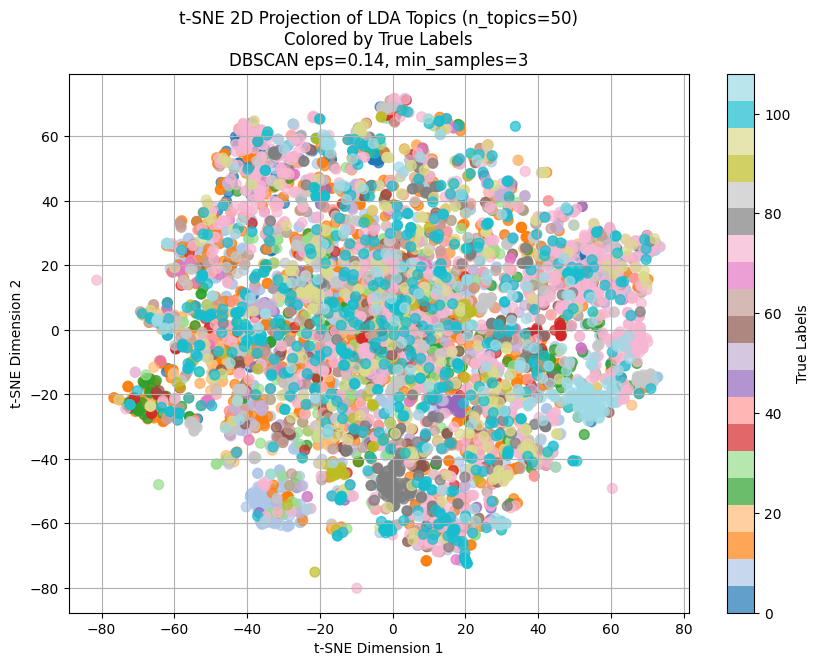

In [ ]:
#@title LDA Visualization with DBSCAN and t-SNE

from sklearn.cluster import DBSCAN
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

true_labels = evaluation_df['event_label'].values  # Ground truth labels

best_params_eps = 0.14
best_params_min_samples = 3

# Fit LDA with the best number of topics (replace with your best n_topics)
best_n_topics = 50#int(best_config['n_topics'])

lda = LatentDirichletAllocation(n_components=best_n_topics, random_state=42)
lda.fit(tuning_tfidf)  # fit on tuning set

# Transform evaluation TF-IDF to topic distributions
evaluation_lda_embeddings = lda.transform(evaluation_tfidf)

# Cluster with DBSCAN using best params on LDA embeddings
best_dbscan = DBSCAN(eps=best_params_eps, min_samples=best_params_min_samples, metric='cosine')
best_cluster_labels = best_dbscan.fit_predict(evaluation_lda_embeddings)

# t-SNE 2D projection on LDA topic distributions
tsne = TSNE(n_components=2, random_state=42, init='pca')
reduced_embeddings = tsne.fit_transform(evaluation_lda_embeddings)

# Plot
plt.figure(figsize=(10, 7))
scatter = plt.scatter(
    reduced_embeddings[:, 0], reduced_embeddings[:, 1],
    c=true_labels, cmap='tab20', alpha=0.7, s=50
)
plt.colorbar(scatter, label='True Labels')
plt.title(f"t-SNE 2D Projection of LDA Topics (n_topics={best_n_topics})\nColored by True Labels\nDBSCAN eps={best_params_eps:.2f}, min_samples={best_params_min_samples}")
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.grid(True)
plt.show()


## DBSCAN, With LDA + Name Entities as Splited

In [ ]:
#@title Install Fast Text Model
# !pip install fasttext
!wget https://dl.fbaipublicfiles.com/fasttext/vectors-crawl/cc.ar.300.vec.gz
!gunzip cc.ar.300.vec.gz


--2025-07-02 04:51:22--  https://dl.fbaipublicfiles.com/fasttext/vectors-crawl/cc.ar.300.vec.gz
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 3.167.112.51, 3.167.112.53, 3.167.112.66, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|3.167.112.51|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1272365870 (1.2G) [binary/octet-stream]
Saving to: ‘cc.ar.300.vec.gz’

cc.ar.300.vec.gz    100%[===================>]   1.18G  89.6MB/s    in 11s     

2025-07-02 04:51:33 (106 MB/s) - ‘cc.ar.300.vec.gz’ saved [1272365870/1272365870]



In [ ]:
#@title Initialize Stanza Pipeline
import numpy as np
import nltk
import stanza
from gensim.models import KeyedVectors
from nltk.corpus import stopwords

# Download necessary resources (only run once)
nltk.download('stopwords')
stanza.download('ar')

# Load Arabic stopwords from NLTK
ARABIC_STOPWORDS = set(stopwords.words('arabic'))

# Initialize Stanza Arabic pipeline for tokenization
nlp = stanza.Pipeline(lang='ar', processors='tokenize', tokenize_no_ssplit=True)

# Tokenization function
def stanza_tokenize(text):
    doc = nlp(text)
    return [word.text for sentence in doc.sentences for word in sentence.words]

# Tweet embedding function using FastText + Stanza + NLTK stopwords
def embed_tweet(text, model):
    tokens = stanza_tokenize(text)
    # Remove stopwords
    filtered_tokens = [token for token in tokens if token not in ARABIC_STOPWORDS]
    # Embed
    vectors = [model[token] for token in filtered_tokens if token in model]
    if not vectors:
        return np.zeros(model.vector_size)
    return np.mean(vectors, axis=0)

def embed_tweet_with_verb_weight(text, verbs, model, verb_weight=2.0):
    tokens = stanza_tokenize(text)
    filtered_tokens = [token for token in tokens if token not in ARABIC_STOPWORDS]

    vectors = []

    for token in filtered_tokens:
        if token in model:
            weight = verb_weight if token in verbs else 1.0
            vectors.append(weight * model[token])

    if not vectors:
        return np.zeros(model.vector_size)

    return np.mean(vectors, axis=0)


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Downloading default packages for language: ar (Arabic) ...


INFO:stanza:Downloaded file to /root/stanza_resources/ar/default.zip
INFO:stanza:Finished downloading models and saved to /root/stanza_resources
INFO:stanza:Checking for updates to resources.json in case models have been updated.  Note: this behavior can be turned off with download_method=None or download_method=DownloadMethod.REUSE_RESOURCES


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Loading these models for language: ar (Arabic):
| Processor | Package |
-----------------------
| tokenize  | padt    |
| mwt       | padt    |

INFO:stanza:Using device: cpu
INFO:stanza:Loading: tokenize
INFO:stanza:Loading: mwt
INFO:stanza:Done loading processors!


In [ ]:
#@title Load the model

from gensim.models import KeyedVectors

# Load the .vec file (pre-trained FastText embeddings in text format)
fasttext_model = KeyedVectors.load_word2vec_format('cc.ar.300.vec', binary=False, encoding='utf-8')


In [ ]:
#@title 🧠 EmbedEntity Lists
from tqdm import tqdm
import re

ARABIC_STOPWORDS = set(stopwords.words('arabic'))

# Normalize Arabic text
def normalize_arabic(text):
    text = re.sub(r'[\u064B-\u065F]', '', text)  # diacritics
    text = re.sub(r'[إأآا]', 'ا', text)
    text = re.sub(r'ى', 'ي', text)
    text = re.sub(r'ؤ', 'و', text)
    text = re.sub(r'ئ', 'ي', text)
    text = re.sub(r'ة', 'ه', text)
    text = re.sub(r'[^\w\s]', '', text)  # punctuation
    return text.strip()

# Initialize Stanza pipeline
nlp = stanza.Pipeline(lang='ar', processors='tokenize', tokenize_no_ssplit=True)

# Tokenizer using stanza
def stanza_tokenize(text):
    doc = nlp(text)
    return [word.text for sentence in doc.sentences for word in sentence.words]



# Embed a full tweet text
def embed_text(text, model):
    tokens = stanza_tokenize(text)
    tokens = [normalize_arabic(t) for t in tokens if t not in ARABIC_STOPWORDS]
    vectors = [model[t] for t in tokens if t in model]
    if not vectors:
        return np.zeros(model.vector_size)
    return np.mean(vectors, axis=0)

# Embed list of entity tokens (e.g. PER, ORG)
def embed_token_list(token_list, model):
    if not token_list:
        return np.zeros(model.vector_size)
    tokens_norm = [normalize_arabic(t) for t in token_list if isinstance(t, str)]
    vectors = [model[t] for t in tokens_norm if t in model]
    if not vectors:
        return np.zeros(model.vector_size)
    return np.mean(vectors, axis=0)

#@title 🛠️ Apply Embedding Functions to DataFrame

tqdm.pandas(desc="Embedding tweets/entities")

# Ensure correct format
for col in ['PER', 'ORG', 'LOC']:
    if isinstance(df[col].iloc[0], str):
        df[col] = df[col].apply(eval)

# Embed each component
df['per_emb'] = df['PER'].progress_apply(lambda x: embed_token_list(x, fasttext_model))
df['org_emb'] = df['ORG'].progress_apply(lambda x: embed_token_list(x, fasttext_model))
df['loc_emb'] = df['LOC'].progress_apply(lambda x: embed_token_list(x, fasttext_model))
df['hashtags_emb'] = df['Hashtags'].progress_apply(lambda x: embed_token_list(x, fasttext_model))
df['verb_emb'] = df['verbs'].progress_apply(lambda x: embed_token_list(x, fasttext_model))
df['noun_emb'] = df['nouns'].progress_apply(lambda x: embed_token_list(x, fasttext_model))




INFO:stanza:Checking for updates to resources.json in case models have been updated.  Note: this behavior can be turned off with download_method=None or download_method=DownloadMethod.REUSE_RESOURCES


INFO:stanza:Downloaded file to /root/stanza_resources/resources.json
INFO:stanza:Loading these models for language: ar (Arabic):
| Processor | Package |
-----------------------
| tokenize  | padt    |
| mwt       | padt    |

INFO:stanza:Using device: cpu
INFO:stanza:Loading: tokenize
INFO:stanza:Loading: mwt
INFO:stanza:Done loading processors!
Embedding tweets/entities: 100%|██████████| 6998/6998 [00:02<00:00, 2776.47it/s]


In [93]:
#@title 🔻 Reduce Entity Embeddings Using PCA
from sklearn.decomposition import PCA

# Fit separate PCA for each type
pca_per = PCA(n_components=32, random_state=42)
pca_org = PCA(n_components=32, random_state=42)
pca_loc = PCA(n_components=32, random_state=42)
pca_hash = PCA(n_components=32, random_state=42)
pca_verb = PCA(n_components=32, random_state=42)
pca_noun = PCA(n_components=32, random_state=42)


pca_tweet = PCA(n_components=256, random_state=42)


# Apply PCA to each type
per_32d = pca_per.fit_transform(np.vstack(df['per_emb'].values))
org_32d = pca_org.fit_transform(np.vstack(df['org_emb'].values))
loc_32d = pca_loc.fit_transform(np.vstack(df['loc_emb'].values))
hashtags_32d = pca_hash.fit_transform(np.vstack(df['hashtags_emb'].values))
verb_32d = pca_hash.fit_transform(np.vstack(df['verb_emb'].values))
noun_32d = pca_hash.fit_transform(np.vstack(df['noun_emb'].values))

# embeddings = pca_tweet.fit_transform(embeddings.tolist())

# Store reduced embeddings
df['per_emb_32d'] = list(per_32d)
df['org_emb_32d'] = list(org_32d)
df['loc_emb_32d'] = list(loc_32d)
df['hashtags_32d'] = list(hashtags_32d)
df['verb_32d'] = list(verb_32d)
df['noun_32d'] = list(noun_32d)

In [95]:
#@title Vectorize Tweets with TF-IDF
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.corpus import stopwords
import nltk

# Download Arabic stopwords (only once)
nltk.download('stopwords')

# Get Arabic stopwords from NLTK
arabic_stopwords = stopwords.words('arabic')

# Create TF-IDF vectorizer with custom Arabic stopwords
vectorizer = TfidfVectorizer(max_features=10000, stop_words=arabic_stopwords)

# Fit-transform on tuning and transform on evaluation
tuning_tfidf = vectorizer.fit_transform(tuning_df['Tweet Text'])
evaluation_tfidf = vectorizer.transform(evaluation_df['Tweet Text'])

print(f"TF-IDF tuning shape: {tuning_tfidf.shape}")
print(f"TF-IDF evaluation shape: {evaluation_tfidf.shape}")


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


TF-IDF tuning shape: (934, 7547)
TF-IDF evaluation shape: (6064, 7547)


In [125]:
#  @title Load the embedding for the tuning and evaluation df

import numpy as np

def combine_lda_and_pca(df, lda_embeddings):
    # Stack PCA embeddings columns into arrays
    per = np.vstack(df['per_emb_32d'].values)
    org = np.vstack(df['org_emb_32d'].values)
    loc = np.vstack(df['loc_emb_32d'].values)
    # hashtags = np.vstack(df['hashtags_32d'].values)
    # verb = np.vstack(df['verb_32d'].values)
    # noun = np.vstack(df['noun_32d'].values)

    # Concatenate LDA and all PCA embeddings horizontally
    combined = np.hstack([lda_embeddings, per, org, loc]) #nounhashtagsverb

    # Store combined embedding back as list in new column
    # df['combined_embedding'] = list(combined)
    # return df
    return combined


In [131]:
#@title Define the Hyper Parameters
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.cluster import DBSCAN
from sklearn.metrics import normalized_mutual_info_score, adjusted_rand_score, adjusted_mutual_info_score

n_topics_values = list(range(5, 100, 5))  # LDA: 5 to 50 topics
eps_values = np.arange(0.02, 0.3, 0.02)  # DBSCAN eps
min_samples_values = range(3, 6)          # DBSCAN min_samples


In [127]:
#@title Fit LDA and get topic distributions for specific  numnber of topic

# Set number of topics
n_topics = 60

# Fit LDA
lda_model = LatentDirichletAllocation(n_components=n_topics, random_state=42)
lda_model.fit(tuning_tfidf)

# Topic distributions
tuning_embeddings =combine_lda_and_pca(tuning_df, lda_model.transform(tuning_tfidf))
evaluation_embeddings = combine_lda_and_pca(evaluation_df,lda_model.transform(evaluation_tfidf))

# Ground truth labels
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

print(f"Tuning topic vectors shape: {tuning_embeddings.shape}")
print(f"Evaluation topic vectors shape: {evaluation_embeddings.shape}")


Tuning topic vectors shape: (934, 156)
Evaluation topic vectors shape: (6064, 156)


In [132]:
#@title Analyze the Effect of DBSCAN's epsilon Parameter on Clustering Results
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results_tuning = []
results_eval = []

# Tune over eps
for eps in eps_values:
    for min_samples in min_samples_values:
        # --- Tuning ---
        dbscan_tuning = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

        if len(set(cluster_labels_tuning)) > 1 and (cluster_labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, cluster_labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- Evaluation ---
        dbscan_eval = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_eval = dbscan_eval.fit_predict(evaluation_embeddings)

        if len(set(cluster_labels_eval)) > 1 and (cluster_labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, cluster_labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# Aggregate over min_samples
agg_tuning = df_tuning.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval = df_eval.groupby('eps')[['nmi', 'ari', 'ami']].mean().reset_index()



Best eps based on NMI (Tuning Set): eps = 0.20, NMI = 0.3233


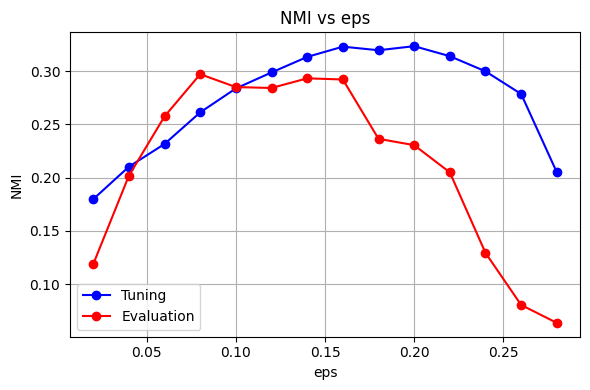

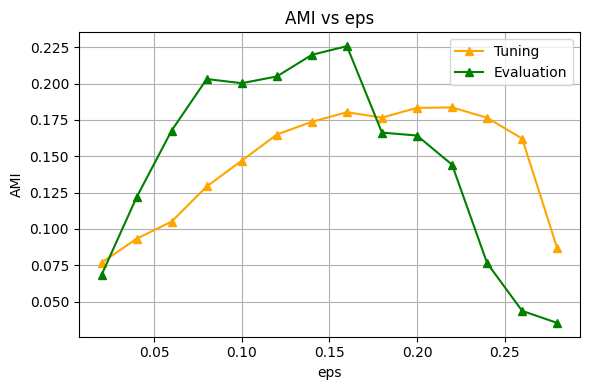

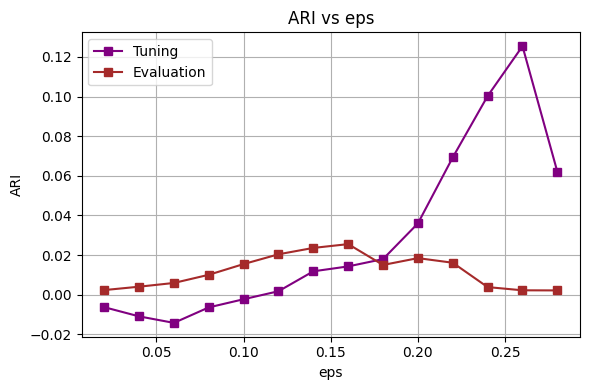

In [133]:
#@title the Effect of DBSCAN's epsilon Parameter on Clustering Result

# Print best eps based on NMI from tuning set
best_eps_row = agg_tuning.loc[agg_tuning['nmi'].idxmax()]
print(f"Best eps based on NMI (Tuning Set): eps = {best_eps_row['eps']:.2f}, NMI = {best_eps_row['nmi']:.4f}")

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs eps')
plt.xlabel('eps')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ami'], marker='^', color='orange', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs eps')
plt.xlabel('eps')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning['eps'], agg_tuning['ari'], marker='s', color='purple', label='Tuning')
plt.plot(agg_eval['eps'], agg_eval['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs eps')
plt.xlabel('eps')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [134]:
#@title Analyze the Effect of DBSCAN's Min Samples   Parameter on Clustering Result

true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

results_tuning = []
results_eval = []

# Iterate over eps and min_samples combinations
for eps in eps_values:
    for min_samples in min_samples_values:
        # --- Tuning ---
        dbscan_tuning = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

        if len(set(cluster_labels_tuning)) > 1 and (cluster_labels_tuning != -1).any():
            nmi = normalized_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
            ari = adjusted_rand_score(true_labels_tuning, cluster_labels_tuning)
            ami = adjusted_mutual_info_score(true_labels_tuning, cluster_labels_tuning)
        else:
            nmi = ari = ami = 0

        results_tuning.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi,
            'ari': ari,
            'ami': ami
        })

        # --- Evaluation ---
        dbscan_eval = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
        cluster_labels_eval = dbscan_eval.fit_predict(evaluation_embeddings)

        if len(set(cluster_labels_eval)) > 1 and (cluster_labels_eval != -1).any():
            nmi_e = normalized_mutual_info_score(true_labels_eval, cluster_labels_eval)
            ari_e = adjusted_rand_score(true_labels_eval, cluster_labels_eval)
            ami_e = adjusted_mutual_info_score(true_labels_eval, cluster_labels_eval)
        else:
            nmi_e = ari_e = ami_e = 0

        results_eval.append({
            'eps': eps,
            'min_samples': min_samples,
            'nmi': nmi_e,
            'ari': ari_e,
            'ami': ami_e
        })

# Convert to DataFrames
df_tuning = pd.DataFrame(results_tuning)
df_eval = pd.DataFrame(results_eval)

# === Aggregate over eps to study the effect of min_samples ===
agg_tuning_min = df_tuning.groupby('min_samples')[['nmi', 'ari', 'ami']].mean().reset_index()
agg_eval_min = df_eval.groupby('min_samples')[['nmi', 'ari', 'ami']].mean().reset_index()



Best min_samples based on NMI (Tuning Set): min_samples = 3, NMI = 0.3014


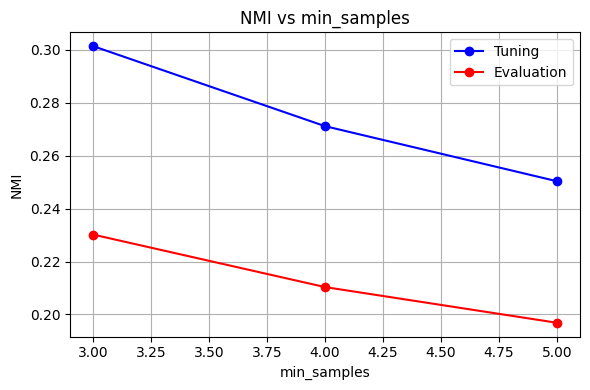

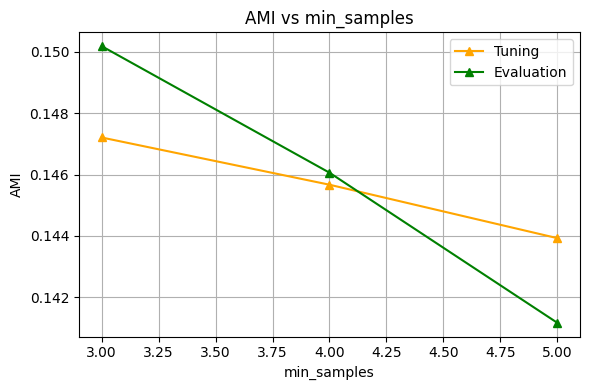

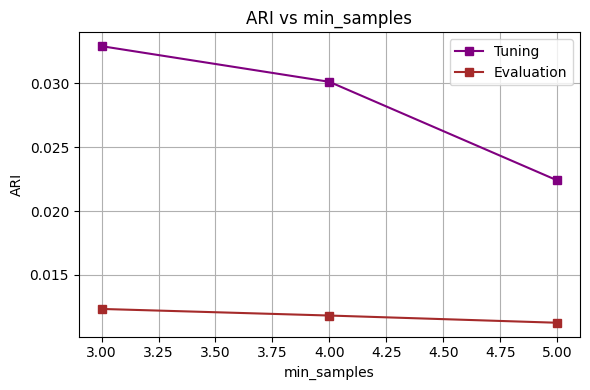

In [135]:
#@title Analyze the Effect of DBSCAN's Min Samples   Parameter on Clustering Result

# Print best min_samples based on NMI from tuning set
best_minsample_row = agg_tuning_min.loc[agg_tuning_min['nmi'].idxmax()]
print(f"Best min_samples based on NMI (Tuning Set): min_samples = {int(best_minsample_row['min_samples'])}, NMI = {best_minsample_row['nmi']:.4f}")

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['nmi'], marker='o', color='blue', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['nmi'], marker='o', color='red', label='Evaluation')
plt.title('NMI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('NMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['ami'], marker='^', color='orange', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['ami'], marker='^', color='green', label='Evaluation')
plt.title('AMI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('AMI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(agg_tuning_min['min_samples'], agg_tuning_min['ari'], marker='s', color='purple', label='Tuning')
plt.plot(agg_eval_min['min_samples'], agg_eval_min['ari'], marker='s', color='brown', label='Evaluation')
plt.title('ARI vs min_samples')
plt.xlabel('min_samples')
plt.ylabel('ARI')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [136]:
#@title Analyze the Effect of Topics Dimensionality on DBSCAN Clustering Result
lda_results = []
eps_best = 0.14
min_samples_best = 3

for n_topics in n_topics_values:
    # Fit LDA with n_topics
    lda_model = LatentDirichletAllocation(n_components=n_topics, random_state=42)
    lda_model.fit(tuning_tfidf)

    # Get topic distributions
    tuning_embeddings =combine_lda_and_pca(tuning_df, lda_model.transform(tuning_tfidf))
    evaluation_embeddings = combine_lda_and_pca(evaluation_df,lda_model.transform(evaluation_tfidf))

    # --- Tuning clustering ---
    dbscan_tuning = DBSCAN(eps=eps_best, min_samples=min_samples_best, metric='cosine')
    cluster_tuning = dbscan_tuning.fit_predict(tuning_embeddings)

    if len(set(cluster_tuning)) > 1 and (cluster_tuning != -1).any():
        nmi = normalized_mutual_info_score(tuning_df['event_label'], cluster_tuning)
        ari = adjusted_rand_score(tuning_df['event_label'], cluster_tuning)
        ami = adjusted_mutual_info_score(tuning_df['event_label'], cluster_tuning)
    else:
        nmi = ari = ami = 0

    # --- Evaluation clustering ---
    dbscan_eval = DBSCAN(eps=eps_best, min_samples=min_samples_best, metric='cosine')
    cluster_eval = dbscan_eval.fit_predict(evaluation_embeddings)

    if len(set(cluster_eval)) > 1 and (cluster_eval != -1).any():
        nmi_e = normalized_mutual_info_score(evaluation_df['event_label'], cluster_eval)
        ari_e = adjusted_rand_score(evaluation_df['event_label'], cluster_eval)
        ami_e = adjusted_mutual_info_score(evaluation_df['event_label'], cluster_eval)
    else:
        nmi_e = ari_e = ami_e = 0

    lda_results.append({
        'n_topics': n_topics,
        'nmi_tuning': nmi,
        'ari_tuning': ari,
        'ami_tuning': ami,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

# Convert to DataFrame
lda_df = pd.DataFrame(lda_results)


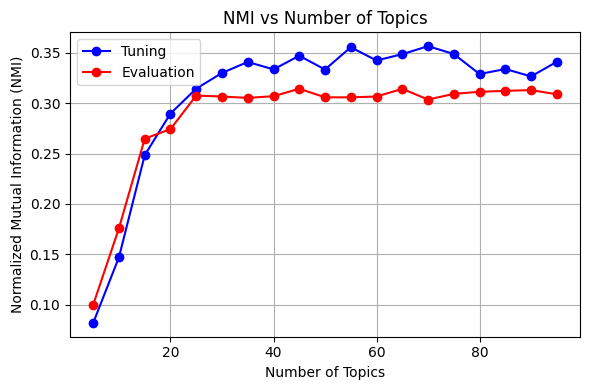

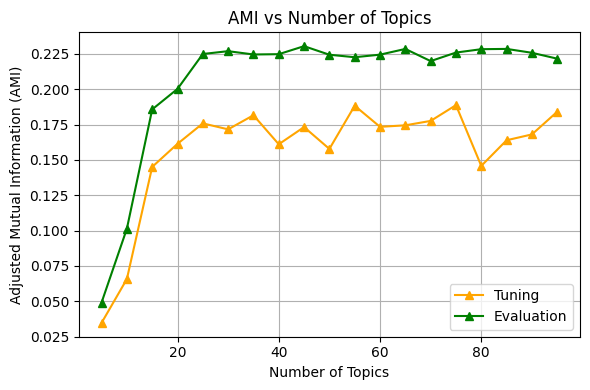

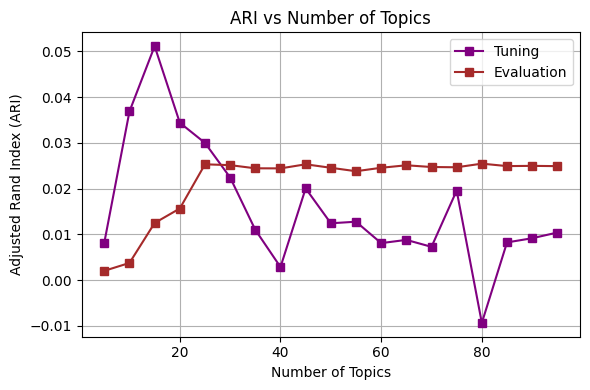

In [137]:
#@title 📊 The Effect of Number of Topics on DBSCAN Clustering Results

# === Plot NMI ===
plt.figure(figsize=(6, 4))
plt.plot(lda_df['n_topics'], lda_df['nmi_tuning'], marker='o', label='Tuning', color='blue')
plt.plot(lda_df['n_topics'], lda_df['nmi_eval'], marker='o', label='Evaluation', color='red')
plt.title('NMI vs Number of Topics')
plt.xlabel('Number of Topics')
plt.ylabel('Normalized Mutual Information (NMI)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot AMI ===
plt.figure(figsize=(6, 4))
plt.plot(lda_df['n_topics'], lda_df['ami_tuning'], marker='^', label='Tuning', color='orange')
plt.plot(lda_df['n_topics'], lda_df['ami_eval'], marker='^', label='Evaluation', color='green')
plt.title('AMI vs Number of Topics')
plt.xlabel('Number of Topics')
plt.ylabel('Adjusted Mutual Information (AMI)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# === Plot ARI ===
plt.figure(figsize=(6, 4))
plt.plot(lda_df['n_topics'], lda_df['ari_tuning'], marker='s', label='Tuning', color='purple')
plt.plot(lda_df['n_topics'], lda_df['ari_eval'], marker='s', label='Evaluation', color='brown')
plt.title('ARI vs Number of Topics')
plt.xlabel('Number of Topics')
plt.ylabel('Adjusted Rand Index (ARI)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [138]:

#@title Grid search on tuning set
# True labels
true_labels_tuning = tuning_df['event_label'].values
true_labels_eval = evaluation_df['event_label'].values

grid_results = []

for n_topics in n_topics_values:
    # print(f"\nFitting LDA with n_topics = {n_topics}...")

    # Fit LDA on tuning set
    lda = LatentDirichletAllocation(n_components=n_topics, random_state=42)
    lda.fit(tuning_tfidf)

    # Get topic distributions
    tuning_embeddings =combine_lda_and_pca(tuning_df, lda_model.transform(tuning_tfidf))
    evaluation_embeddings = combine_lda_and_pca(evaluation_df,lda_model.transform(evaluation_tfidf))

    for eps in eps_values:
        for min_samples in min_samples_values:
            # DBSCAN on tuning embeddings
            dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
            labels = dbscan.fit_predict(tuning_embeddings)

            if len(set(labels)) > 1 and (labels != -1).any():
                nmi = normalized_mutual_info_score(true_labels_tuning, labels)
                ari = adjusted_rand_score(true_labels_tuning, labels)
                ami = adjusted_mutual_info_score(true_labels_tuning, labels)
            else:
                nmi = ari = ami = 0

            grid_results.append({
                'n_topics': n_topics,
                'eps': eps,
                'min_samples': min_samples,
                'nmi': nmi,
                'ari': ari,
                'ami': ami
            })

# Convert results to DataFrame
lda_grid_df = pd.DataFrame(grid_results)

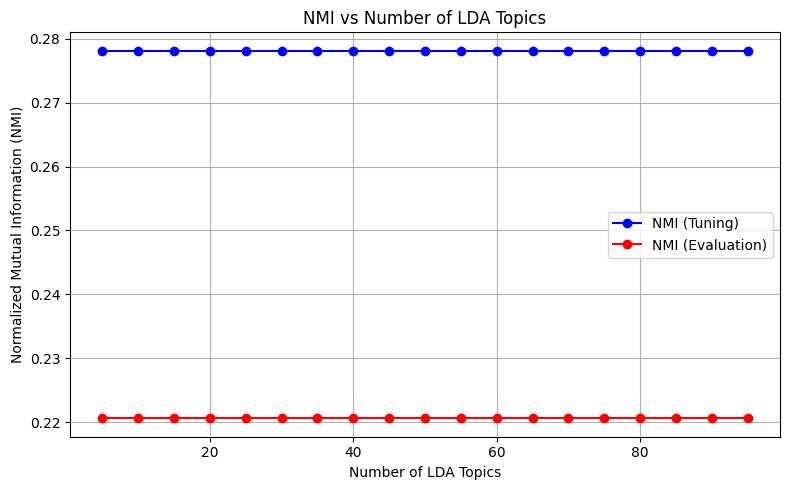

In [139]:
#@title NMI vs Number of LDA Topics

import matplotlib.pyplot as plt

# Aggregate mean NMI per topic for tuning set
nmi_tuning = lda_grid_df.groupby('n_topics')['nmi'].mean().reset_index(name='nmi_tuning')

# For evaluation, we need to compute DBSCAN clustering and NMI as well for each param combination.
# Let's add evaluation NMI to lda_grid_df first (if not done):


eval_results = []

for n_topics in n_topics_values:
    lda = LatentDirichletAllocation(n_components=n_topics, random_state=42)
    lda.fit(tuning_tfidf)
    tuning_emb =combine_lda_and_pca(tuning_df, lda_model.transform(tuning_tfidf))
    eval_emb = combine_lda_and_pca(evaluation_df,lda_model.transform(evaluation_tfidf))

    for eps in eps_values:
        for min_samples in min_samples_values:
            dbscan = DBSCAN(eps=eps, min_samples=min_samples, metric='cosine')
            labels_eval = dbscan.fit_predict(eval_emb)

            if len(set(labels_eval)) > 1 and (labels_eval != -1).any():
                nmi_eval = normalized_mutual_info_score(true_labels_eval, labels_eval)
            else:
                nmi_eval = 0

            eval_results.append({
                'n_topics': n_topics,
                'eps': eps,
                'min_samples': min_samples,
                'nmi_eval': nmi_eval
            })

eval_df = pd.DataFrame(eval_results)

# Aggregate mean NMI per topic for evaluation set
nmi_eval = eval_df.groupby('n_topics')['nmi_eval'].mean().reset_index()

# Merge tuning and evaluation NMI by n_topics
nmi_both = pd.merge(nmi_tuning, nmi_eval, on='n_topics')

# Plot
plt.figure(figsize=(8, 5))
plt.plot(nmi_both['n_topics'], nmi_both['nmi_tuning'], marker='o', color='blue', label='NMI (Tuning)')
plt.plot(nmi_both['n_topics'], nmi_both['nmi_eval'], marker='o', color='red', label='NMI (Evaluation)')
plt.title('NMI vs Number of LDA Topics')
plt.xlabel('Number of LDA Topics')
plt.ylabel('Normalized Mutual Information (NMI)')
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


In [140]:
#@title Best Params from LDA Grid Search

# Get best config (based on NMI on tuning set)
best_config = lda_grid_df.loc[lda_grid_df['nmi'].idxmax()]
print("Best configuration based on NMI (Tuning Set):")
print(best_config[['n_topics', 'eps', 'min_samples', 'nmi', 'ari', 'ami']])

# Extract best params
best_n_topics = int(best_config['n_topics'])  # 🛠 Fix: Cast to int
best_eps = best_config['eps']
best_min_samples = int(best_config['min_samples'])  # Optional, just to be safe

# Fit LDA with best topic number
best_lda = LatentDirichletAllocation(n_components=best_n_topics, random_state=42)
best_lda.fit(tuning_tfidf)

# Get embeddings (topic distributions)
tuning_embeddings_best = best_lda.transform(tuning_tfidf)
evaluation_embeddings_best = best_lda.transform(evaluation_tfidf)

# Apply DBSCAN
dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')
labels_tuning = dbscan.fit_predict(tuning_embeddings_best)
labels_eval = dbscan.fit_predict(evaluation_embeddings_best)

# Define scoring
def safe_scores(true, pred):
    if len(set(pred)) > 1 and (pred != -1).any():
        nmi = normalized_mutual_info_score(true, pred)
        ari = adjusted_rand_score(true, pred)
        ami = adjusted_mutual_info_score(true, pred)
    else:
        nmi = ari = ami = 0
    return nmi, ari, ami

# Score tuning and evaluation
nmi_tuning, ari_tuning, ami_tuning = safe_scores(true_labels_tuning, labels_tuning)
nmi_eval, ari_eval, ami_eval = safe_scores(true_labels_eval, labels_eval)

# Print
print("\nEvaluation metrics with best configuration:")
print(f"Tuning Set → NMI: {nmi_tuning:.4f}, ARI: {ari_tuning:.4f}, AMI: {ami_tuning:.4f}")
print(f"Evaluation Set → NMI: {nmi_eval:.4f}, ARI: {ari_eval:.4f}, AMI: {ami_eval:.4f}")


Best configuration based on NMI (Tuning Set):
n_topics       5.000000
eps            0.200000
min_samples    3.000000
nmi            0.360192
ari            0.032190
ami            0.192581
Name: 27, dtype: float64

Evaluation metrics with best configuration:
Tuning Set → NMI: 0.0020, ARI: 0.0001, AMI: -0.0001
Evaluation Set → NMI: 0.0000, ARI: 0.0000, AMI: 0.0000


In [141]:
#@title Summarize clustering scores across LDA topic dimensions for best DBSCAN parameters

lda_dim_metrics = []

for n_topics in n_topics_values:
    # Fit LDA with current number of topics
    lda = LatentDirichletAllocation(n_components=n_topics, random_state=42)
    lda.fit(tuning_tfidf)

    # Get topic distributions (embeddings)
    tuning_embed =combine_lda_and_pca(tuning_df, lda_model.transform(tuning_tfidf))
    eval_embed = combine_lda_and_pca(evaluation_df,lda_model.transform(evaluation_tfidf))

    # DBSCAN with best hyperparameters
    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')
    labels_tuning = dbscan.fit_predict(tuning_embed)
    labels_eval = dbscan.fit_predict(eval_embed)

    # Compute clustering scores
    nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, labels_tuning)
    nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, labels_eval)

    # Save results
    lda_dim_metrics.append({
        'n_topics': n_topics,
        'nmi_tuning': nmi_t,
        'ari_tuning': ari_t,
        'ami_tuning': ami_t,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })

# Convert to DataFrame
lda_dim_df = pd.DataFrame(lda_dim_metrics)

print("\nSummary of clustering metrics across LDA topic dimensions:")
print(lda_dim_df.to_string(index=False))



Summary of clustering metrics across LDA topic dimensions:
 n_topics  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval
        5    0.360192     0.03219    0.192581  0.232019  0.004136  0.150328
       10    0.360192     0.03219    0.192581  0.232019  0.004136  0.150328
       15    0.360192     0.03219    0.192581  0.232019  0.004136  0.150328
       20    0.360192     0.03219    0.192581  0.232019  0.004136  0.150328
       25    0.360192     0.03219    0.192581  0.232019  0.004136  0.150328
       30    0.360192     0.03219    0.192581  0.232019  0.004136  0.150328
       35    0.360192     0.03219    0.192581  0.232019  0.004136  0.150328
       40    0.360192     0.03219    0.192581  0.232019  0.004136  0.150328
       45    0.360192     0.03219    0.192581  0.232019  0.004136  0.150328
       50    0.360192     0.03219    0.192581  0.232019  0.004136  0.150328
       55    0.360192     0.03219    0.192581  0.232019  0.004136  0.150328
       60    0.360192     0.

In [142]:
#@title Evaluate clustering metrics across dimensions or topic counts

dim_metrics = []
 # For LDA embeddings, use n_topics_range as dimensions
for n_topics in n_topics_values:
    # print(f"Evaluating LDA with n_topics={n_topics}...")
    lda = LatentDirichletAllocation(n_components=n_topics, random_state=42)
    lda.fit(tuning_tfidf)

    tuning_embed =combine_lda_and_pca(tuning_df, lda_model.transform(tuning_tfidf))
    eval_embed = combine_lda_and_pca(evaluation_df,lda_model.transform(evaluation_tfidf))

    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')
    labels_tuning = dbscan.fit_predict(tuning_embed)
    labels_eval = dbscan.fit_predict(eval_embed)

    nmi_t, ari_t, ami_t = safe_scores(true_labels_tuning, labels_tuning)
    nmi_e, ari_e, ami_e = safe_scores(true_labels_eval, labels_eval)

    dim_metrics.append({
        'dim': n_topics,
        'nmi_tuning': nmi_t,
        'ari_tuning': ari_t,
        'ami_tuning': ami_t,
        'nmi_eval': nmi_e,
        'ari_eval': ari_e,
        'ami_eval': ami_e
    })


dim_df = pd.DataFrame(dim_metrics)

print("\nSummary of clustering metrics across dimensions/topics:")
print(dim_df.to_string(index=False))



Summary of clustering metrics across dimensions/topics:
 dim  nmi_tuning  ari_tuning  ami_tuning  nmi_eval  ari_eval  ami_eval
   5    0.360192     0.03219    0.192581  0.232019  0.004136  0.150328
  10    0.360192     0.03219    0.192581  0.232019  0.004136  0.150328
  15    0.360192     0.03219    0.192581  0.232019  0.004136  0.150328
  20    0.360192     0.03219    0.192581  0.232019  0.004136  0.150328
  25    0.360192     0.03219    0.192581  0.232019  0.004136  0.150328
  30    0.360192     0.03219    0.192581  0.232019  0.004136  0.150328
  35    0.360192     0.03219    0.192581  0.232019  0.004136  0.150328
  40    0.360192     0.03219    0.192581  0.232019  0.004136  0.150328
  45    0.360192     0.03219    0.192581  0.232019  0.004136  0.150328
  50    0.360192     0.03219    0.192581  0.232019  0.004136  0.150328
  55    0.360192     0.03219    0.192581  0.232019  0.004136  0.150328
  60    0.360192     0.03219    0.192581  0.232019  0.004136  0.150328
  65    0.360192    

In [143]:
#@title Clustering and Topic Modeling Metrics Summary Across Embedding Dimensions
from sklearn.metrics import silhouette_score
from gensim.corpora import Dictionary
from gensim.models.coherencemodel import CoherenceModel

def safe_silhouette_score(X, labels):
    if len(set(labels)) > 1 and len(X) > len(set(labels)):
        return silhouette_score(X, labels, metric='cosine')
    return -1

def get_topic_coherence(texts, labels, coherence_type='c_v'):
    clustered_docs = {}
    for text, label in zip(texts, labels):
        if label == -1:
            continue
        clustered_docs.setdefault(label, []).append(text)

    topics = [docs for docs in clustered_docs.values() if len(docs) >= 3]

    if len(topics) == 0:
        return -1

    tokenized_topics = [[word for doc in topic for word in doc.split()] for topic in topics]

    dictionary = Dictionary(tokenized_topics)
    corpus = [dictionary.doc2bow(text) for text in tokenized_topics]

    coherence_model = CoherenceModel(
        topics=tokenized_topics,
        texts=tokenized_topics,
        corpus=corpus,
        dictionary=dictionary,
        coherence=coherence_type
    )

    return coherence_model.get_coherence()

# Ground truth number of events (true clusters)
true_events_tuning = len(set(tuning_df['event_label']))
true_events_eval = len(set(evaluation_df['event_label']))

additional_metrics = []
# Use LDA topic counts as 'dim'
for n_topics in n_topics_values:
    print(f"Computing additional metrics for LDA with n_topics={n_topics}...")
    lda = LatentDirichletAllocation(n_components=n_topics, random_state=42)
    lda.fit(tuning_tfidf)


    tuning_embed =combine_lda_and_pca(tuning_df, lda_model.transform(tuning_tfidf))
    eval_embed = combine_lda_and_pca(evaluation_df,lda_model.transform(evaluation_tfidf))

    dbscan = DBSCAN(eps=best_eps, min_samples=best_min_samples, metric='cosine')

    labels_tuning = dbscan.fit_predict(tuning_embed)
    silhouette_t = safe_silhouette_score(tuning_embed, labels_tuning)
    num_clusters_t = len(set(labels_tuning)) - (1 if -1 in labels_tuning else 0)
    coherence_t_cv = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='c_v')
    coherence_t_umass = get_topic_coherence(tuning_df['Tweet Text'].tolist(), labels_tuning, coherence_type='u_mass')

    labels_eval = dbscan.fit_predict(eval_embed)
    silhouette_e = safe_silhouette_score(eval_embed, labels_eval)
    num_clusters_e = len(set(labels_eval)) - (1 if -1 in labels_eval else 0)
    coherence_e_cv = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='c_v')
    coherence_e_umass = get_topic_coherence(evaluation_df['Tweet Text'].tolist(), labels_eval, coherence_type='u_mass')

    additional_metrics.append({
        'dim': n_topics,
        'true_events_tuning': true_events_tuning,
        'true_events_eval': true_events_eval,
        'silhouette_tuning': silhouette_t,
        'num_clusters_tuning': num_clusters_t,
        'coherence_tuning_c_v': coherence_t_cv,
        'coherence_tuning_u_mass': coherence_t_umass,
        'silhouette_eval': silhouette_e,
        'num_clusters_eval': num_clusters_e,
        'coherence_eval_c_v': coherence_e_cv,
        'coherence_eval_u_mass': coherence_e_umass
    })

extra_df = pd.DataFrame(additional_metrics)

dim_df = pd.merge(dim_df, extra_df, on='dim', how='outer')

print("\nSummary of clustering and topic modeling metrics across dimensions/topics:")
print(dim_df.to_string(index=False))


Computing additional metrics for LDA with n_topics=5...
Computing additional metrics for LDA with n_topics=10...
Computing additional metrics for LDA with n_topics=15...
Computing additional metrics for LDA with n_topics=20...
Computing additional metrics for LDA with n_topics=25...
Computing additional metrics for LDA with n_topics=30...
Computing additional metrics for LDA with n_topics=35...
Computing additional metrics for LDA with n_topics=40...
Computing additional metrics for LDA with n_topics=45...
Computing additional metrics for LDA with n_topics=50...
Computing additional metrics for LDA with n_topics=55...
Computing additional metrics for LDA with n_topics=60...
Computing additional metrics for LDA with n_topics=65...
Computing additional metrics for LDA with n_topics=70...
Computing additional metrics for LDA with n_topics=75...
Computing additional metrics for LDA with n_topics=80...
Computing additional metrics for LDA with n_topics=85...
Computing additional metrics for

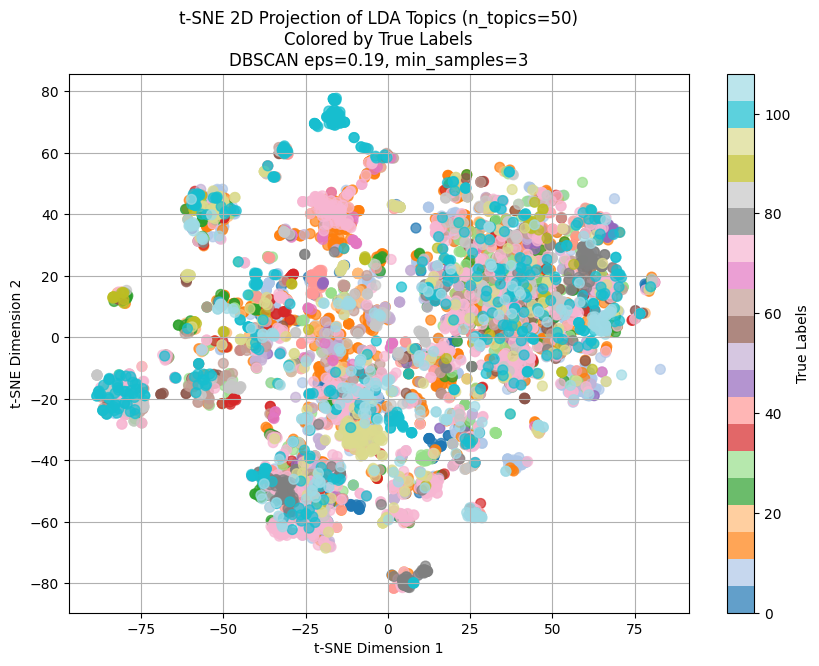

In [145]:
#@title LDA Visualization with DBSCAN and t-SNE

from sklearn.cluster import DBSCAN
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

true_labels = evaluation_df['event_label'].values  # Ground truth labels

best_params_eps = 0.19
best_params_min_samples = 3

# Fit LDA with the best number of topics (replace with your best n_topics)
best_n_topics = 50#int(best_config['n_topics'])

lda = LatentDirichletAllocation(n_components=best_n_topics, random_state=42)
lda.fit(tuning_tfidf)  # fit on tuning set

# Transform evaluation TF-IDF to topic distributions
evaluation_lda_embeddings = combine_lda_and_pca(evaluation_df,lda.transform(evaluation_tfidf))

# Cluster with DBSCAN using best params on LDA embeddings
best_dbscan = DBSCAN(eps=best_params_eps, min_samples=best_params_min_samples, metric='cosine')
best_cluster_labels = best_dbscan.fit_predict(evaluation_lda_embeddings)

# t-SNE 2D projection on LDA topic distributions
tsne = TSNE(n_components=2, random_state=42, init='pca')
reduced_embeddings = tsne.fit_transform(evaluation_lda_embeddings)

# Plot
plt.figure(figsize=(10, 7))
scatter = plt.scatter(
    reduced_embeddings[:, 0], reduced_embeddings[:, 1],
    c=true_labels, cmap='tab20', alpha=0.7, s=50
)
plt.colorbar(scatter, label='True Labels')
plt.title(f"t-SNE 2D Projection of LDA Topics (n_topics={best_n_topics})\nColored by True Labels\nDBSCAN eps={best_params_eps:.2f}, min_samples={best_params_min_samples}")
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.grid(True)
plt.show()


# Conclusion

In [45]:
#@title Save the dataset
df.to_csv('/content/drive/MyDrive/cleaned_merged_labeled_events.csv', index=False)
# df.to_csv('/content/drive/MyDrive/merged_labeled_events.csv', index=False)


## Refrences
